In [241]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import nltk
import string
from sklearn.preprocessing import LabelEncoder
import re
from nltk import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer

In [213]:
data = pd.read_csv('reviews.csv')
data

,reviewId,userName,userImage,content,score,thumbsUpCount,reviewCreatedVersion,at,replyContent,repliedAt,sortOrder,appId
0,gp:AOqpTOEhZuqSqqWnaKRgv-9ABYdajFUB0WugPGh-SG-...,Eric Tie,https://play-lh.googleusercontent.com/a-/AOh14...,I cannot open the app anymore,1,0,5.4.0.6,2020-10-27 21:24:41,NaN,NaN,newest,com.anydo
1,gp:AOqpTOH0WP4IQKBZ2LrdNmFy_YmpPCVrV3diEU9KGm3...,john alpha,https://play-lh.googleusercontent.com/a-/AOh14...,I have been begging for a refund from this app...,1,0,NaN,2020-10-27 14:03:28,"Please note that from checking our records, yo...",2020-10-27 15:05:52,newest,com.anydo
2,gp:AOqpTOEMCkJB8Iq1p-r9dPwnSYadA5BkPWTf32Z1azu...,Sudhakar .S,https://play-lh.googleusercontent.com/a-/AOh14...,Very costly for the premium version (approx In...,1,0,NaN,2020-10-27 08:18:40,NaN,NaN,newest,com.anydo
3,gp:AOqpTOGFrUWuKGycpje8kszj3uwHN6tU_fd4gLVFy9z...,SKGflorida@bellsouth.net DAVID S,https://play-lh.googleusercontent.com/-75aK0WF...,"Used to keep me organized, but all the 2020 UP...",1,0,NaN,2020-10-26 13:28:07,What do you find troublesome about the update?...,2020-10-26 14:58:29,newest,com.anydo
4,gp:AOqpTOHls7DW8wmDFzTkHwxuqFkdNQtKHmO6Pt9jhZE...,Louann Stoker,https://play-lh.googleusercontent.com/-pBcY_Z-...,Dan Birthday Oct 28,1,0,5.6.0.7,2020-10-26 06:10:50,NaN,NaN,newest,com.anydo
...,...,...,...,...,...,...,...,...,...,...,...,...
12490,gp:AOqpTOEQPqib7pb6vFyjMY9JEfsMs_u8WCdqg6mbcar...,Mildred Olima,https://play-lh.googleusercontent.com/a-/AOh14...,"I really like the planner, it helps me achieve...",5,0,4.5.4,2018-12-21 00:13:09,NaN,NaN,newest,com.appxy.planner
12491,gp:AOqpTOE1KKOOVVKUfhAfXQs2NfJpoywfucrJCMK3Hmu...,Roaring Grizzly Bear,https://play-lh.googleusercontent.com/a-/AOh14...,😁****😁,5,0,NaN,2018-12-12 21:52:56,NaN,NaN,newest,com.appxy.planner
12492,gp:AOqpTOFEn5UgYYggqiHKauDJVLLN8-16nk1AfZbEhkj...,amirbadang,https://play-lh.googleusercontent.com/-CM2FcrU...,Very useful apps. You must try it,5,0,4.5.4,2018-12-11 15:49:43,NaN,NaN,newest,com.appxy.planner
12493,gp:AOqpTOHOH6YdYLR91qZdYpeIVkMI-LeAE0EwYgrctid...,Emma Stebbins,https://play-lh.googleusercontent.com/-oCj6g6k...,Would pay for this if there were even more add...,5,0,4.5.4,2018-12-06 04:59:26,NaN,NaN,newest,com.appxy.planner


### 1) Gain Insight from the data:

In [214]:
data.shape

(12495, 12)

In [215]:
data.describe()

,score,thumbsUpCount
count,12495.000000,12495.000000
mean,3.094198,3.047459
std,1.457693,14.303903
min,1.000000,0.000000
25%,2.000000,0.000000
50%,3.000000,0.000000
75%,4.000000,1.000000
max,5.000000,397.000000


In [216]:
print(data.appId.unique())

['com.anydo' 'com.todoist' 'com.ticktick.task'
 'com.habitrpg.android.habitica' 'cc.forestapp' 'com.oristats.habitbull'
 'com.levor.liferpgtasks' 'com.habitnow' 'com.microsoft.todos'
 'prox.lab.calclock' 'com.gmail.jmartindev.timetune'
 'com.artfulagenda.app' 'com.tasks.android' 'com.appgenix.bizcal'
 'com.appxy.planner']


In [217]:
print(data.sortOrder.unique())

['newest']


### 2) Clean the data:

In [218]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12495 entries, 0 to 12494
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   reviewId              12495 non-null  object
 1   userName              12495 non-null  object
 2   userImage             12495 non-null  object
 3   content               12495 non-null  object
 4   score                 12495 non-null  int64 
 5   thumbsUpCount         12495 non-null  int64 
 6   reviewCreatedVersion  10333 non-null  object
 7   at                    12495 non-null  object
 8   replyContent          5818 non-null   object
 9   repliedAt             5818 non-null   object
 10  sortOrder             12495 non-null  object
 11  appId                 12495 non-null  object
dtypes: int64(2), object(10)
memory usage: 1.1+ MB


#### Optimizing memory:

In [219]:
# Since max value of 'score' column is 5, let's change it's type to int8 to save memory.
# Also max value of 'thumbsUpCount' column is 397 so let's change it's type of int16 to save memory.

data = data.astype({'score': 'int8', 'thumbsUpCount': 'int16'})


#### Filling missing values:

In [220]:
# 'reviewCreatedVersion', 'replyContent', 'repliedAt' are the only columns which have null values.
# None of them are numbers so i can't interpolate them. I don't want to drop those rows where these columns
# have missing values so i will just fill them with "missing data".

values = {"reviewCreatedVersion": 'missing', "replyContent": 'pending', "C": 2, "repliedAt": 'missing'}
data.fillna(value=values, inplace = True)

#### Label encoding:

In [221]:
# only 'sortOrder' and 'appId' is worth encoding. I am using normal label encoding since there are 15 variations.

labelencoder_1 = LabelEncoder()
data['sortOrder_N'] = labelencoder_1.fit_transform(data['sortOrder'])
data.drop(['sortOrder'], inplace = True, axis = 1)

labelencoder_2 = LabelEncoder()
data['appId_N'] = labelencoder_2.fit_transform(data['appId'])
data.drop(['appId'], inplace = True, axis = 1)

In [222]:
data.info() # just to check all the changes are made.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12495 entries, 0 to 12494
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   reviewId              12495 non-null  object
 1   userName              12495 non-null  object
 2   userImage             12495 non-null  object
 3   content               12495 non-null  object
 4   score                 12495 non-null  int8  
 5   thumbsUpCount         12495 non-null  int16 
 6   reviewCreatedVersion  12495 non-null  object
 7   at                    12495 non-null  object
 8   replyContent          12495 non-null  object
 9   repliedAt             12495 non-null  object
 10  sortOrder_N           12495 non-null  int32 
 11  appId_N               12495 non-null  int32 
dtypes: int16(1), int32(2), int8(1), object(8)
memory usage: 915.3+ KB


### 3) Visualize the data:

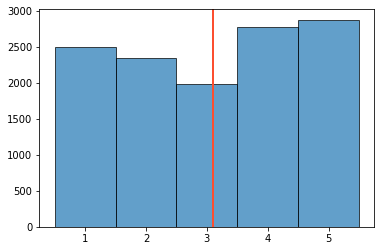

In [223]:
mean_score = data.score.mean()
X = data.score
bins = [0.5,1.5,2.5,3.5,4.5,5.5]
plt.hist(X, bins = bins, edgecolor = 'k', alpha = 0.70)
plt.axvline(mean_score, color = '#fc4f30', label = 'mean score', linewidth = '2')

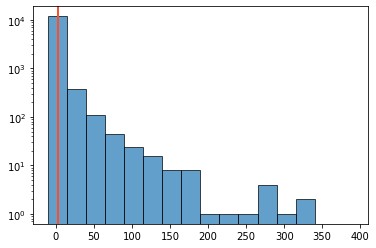

In [224]:
mean_thumbsUpCount = data.thumbsUpCount.mean()
X = data.thumbsUpCount
bins = list(range(-10,410,25))
plt.hist(X, bins = bins, edgecolor = 'k', alpha = 0.70, log = True)
plt.axvline(mean_thumbsUpCount, color = '#fc4f30', label = 'mean thumbsUpCount', linewidth = '2')

### 4) Clean the text:

In [225]:
length = data.shape[0]

#### Removing Emails:

In [226]:
for i in range(length):
    
    email = re.compile(r'[a-zA-Z0-9.-]+@[a-z-]+\.[a-z]+')
    email_match = email.finditer(data.loc[i, 'content'])
    
    for match in email_match:
        print(i)
        print(match)
        
    #data.loc[i, 'content'] = email.sub(r'', data.loc[i, 'content'])
# there are no emails in 'content'!

In [227]:
for i in range(length):
    
    email = re.compile(r'[a-zA-Z0-9.-]+@[a-z-]+\.[a-z]+')
    email_match = email.finditer(data.loc[i, 'replyContent'])
    
    for match in email_match:
        print(i)
        print(match)
        
    data.loc[i, 'replyContent'] = email.sub(r'', data.loc[i, 'replyContent'])


30
<re.Match object; span=(162, 176), match='premium@any.do'>
33
<re.Match object; span=(169, 183), match='premium@any.do'>
88
<re.Match object; span=(128, 144), match='customers@any.do'>
103
<re.Match object; span=(137, 153), match='Customers@any.do'>
107
<re.Match object; span=(152, 166), match='Premium@any.do'>
127
<re.Match object; span=(51, 65), match='premium@any.do'>
231
<re.Match object; span=(289, 303), match='premium@any.do'>
237
<re.Match object; span=(19, 33), match='Premium@any.do'>
243
<re.Match object; span=(289, 303), match='premium@any.do'>
342
<re.Match object; span=(289, 303), match='premium@any.do'>
349
<re.Match object; span=(15, 29), match='premium@any.do'>
377
<re.Match object; span=(91, 107), match='Customers@any.do'>
378
<re.Match object; span=(289, 303), match='premium@any.do'>
388
<re.Match object; span=(187, 203), match='Customers@any.do'>
393
<re.Match object; span=(293, 309), match='Customers@any.do'>
396
<re.Match object; span=(289, 303), match='premium@a

1576
<re.Match object; span=(43, 62), match='support@todoist.com'>
1577
<re.Match object; span=(82, 101), match='support@todoist.com'>
1591
<re.Match object; span=(69, 88), match='support@todoist.com'>
1614
<re.Match object; span=(92, 111), match='support@todoist.com'>
1619
<re.Match object; span=(204, 223), match='support@todoist.com'>
1658
<re.Match object; span=(83, 102), match='support@todoist.com'>
1672
<re.Match object; span=(82, 101), match='support@todoist.com'>
1676
<re.Match object; span=(93, 112), match='support@todoist.com'>
1684
<re.Match object; span=(62, 81), match='support@todoist.com'>
1692
<re.Match object; span=(47, 66), match='support@todoist.com'>
1696
<re.Match object; span=(195, 214), match='support@todoist.com'>
1909
<re.Match object; span=(72, 92), match='support@ticktick.com'>
1911
<re.Match object; span=(36, 56), match='support@ticktick.com'>
1923
<re.Match object; span=(69, 89), match='support@ticktick.com'>
1925
<re.Match object; span=(115, 135), match='sup

3085
<re.Match object; span=(118, 137), match='mobile@habitica.com'>
3086
<re.Match object; span=(151, 169), match='admin@habitica.com'>
3088
<re.Match object; span=(137, 156), match='mobile@habitica.com'>
3093
<re.Match object; span=(284, 302), match='admin@habitica.com'>
3095
<re.Match object; span=(116, 135), match='mobile@habitica.com'>
3099
<re.Match object; span=(118, 137), match='mobile@habitica.com'>
3105
<re.Match object; span=(121, 140), match='mobile@habitica.com'>
3110
<re.Match object; span=(135, 154), match='mobile@habitica.com'>
3126
<re.Match object; span=(80, 98), match='admin@habitica.com'>
3133
<re.Match object; span=(122, 141), match='mobile@habitica.com'>
3137
<re.Match object; span=(114, 133), match='mobile@habitica.com'>
3140
<re.Match object; span=(179, 198), match='mobile@habitica.com'>
3145
<re.Match object; span=(170, 189), match='mobile@habitica.com'>
3146
<re.Match object; span=(166, 185), match='mobile@habitica.com'>
3147
<re.Match object; span=(167, 186),

4057
<re.Match object; span=(81, 109), match='android.support@forestapp.cc'>
4057
<re.Match object; span=(145, 173), match='premium.support@forestapp.cc'>
4058
<re.Match object; span=(132, 160), match='premium.support@forestapp.cc'>
4059
<re.Match object; span=(81, 109), match='android.support@forestapp.cc'>
4059
<re.Match object; span=(145, 173), match='premium.support@forestapp.cc'>
4060
<re.Match object; span=(132, 160), match='premium.support@forestapp.cc'>
4061
<re.Match object; span=(81, 109), match='android.support@forestapp.cc'>
4061
<re.Match object; span=(145, 173), match='premium.support@forestapp.cc'>
4066
<re.Match object; span=(81, 109), match='android.support@forestapp.cc'>
4066
<re.Match object; span=(145, 173), match='premium.support@forestapp.cc'>
4069
<re.Match object; span=(81, 109), match='android.support@forestapp.cc'>
4069
<re.Match object; span=(145, 173), match='premium.support@forestapp.cc'>
4082
<re.Match object; span=(226, 254), match='android.support@forest

4278
<re.Match object; span=(81, 109), match='android.support@forestapp.cc'>
4278
<re.Match object; span=(145, 173), match='premium.support@forestapp.cc'>
4285
<re.Match object; span=(81, 109), match='android.support@forestapp.cc'>
4285
<re.Match object; span=(145, 173), match='premium.support@forestapp.cc'>
4287
<re.Match object; span=(84, 112), match='premium.support@forestapp.cc'>
4295
<re.Match object; span=(81, 109), match='android.support@forestapp.cc'>
4295
<re.Match object; span=(145, 173), match='premium.support@forestapp.cc'>
4297
<re.Match object; span=(81, 109), match='android.support@forestapp.cc'>
4297
<re.Match object; span=(145, 173), match='premium.support@forestapp.cc'>
4301
<re.Match object; span=(81, 109), match='android.support@forestapp.cc'>
4301
<re.Match object; span=(145, 173), match='premium.support@forestapp.cc'>
4306
<re.Match object; span=(81, 109), match='android.support@forestapp.cc'>
4306
<re.Match object; span=(145, 173), match='premium.support@forestap

6328
<re.Match object; span=(256, 279), match='habitnow.apps@gmail.com'>
6332
<re.Match object; span=(90, 113), match='habitnow.apps@gmail.com'>
6337
<re.Match object; span=(110, 133), match='habitnow.apps@gmail.com'>
6340
<re.Match object; span=(191, 214), match='habitnow.apps@gmail.com'>
6342
<re.Match object; span=(92, 115), match='habitnow.apps@gmail.com'>
6344
<re.Match object; span=(155, 178), match='habitnow.apps@gmail.com'>
6345
<re.Match object; span=(194, 217), match='habitnow.apps@gmail.com'>
6346
<re.Match object; span=(215, 238), match='habitnow.apps@gmail.com'>
6351
<re.Match object; span=(212, 235), match='habitnow.apps@gmail.com'>
6352
<re.Match object; span=(225, 248), match='habitnow.apps@gmail.com'>
6353
<re.Match object; span=(155, 178), match='habitnow.apps@gmail.com'>
6355
<re.Match object; span=(175, 198), match='habitnow.apps@gmail.com'>
6362
<re.Match object; span=(177, 200), match='habitnow.apps@gmail.com'>
6363
<re.Match object; span=(177, 200), match='habitn

7300
<re.Match object; span=(197, 219), match='todohelp@microsoft.com'>
7301
<re.Match object; span=(149, 171), match='todohelp@microsoft.com'>
7304
<re.Match object; span=(275, 297), match='todohelp@microsoft.com'>
7305
<re.Match object; span=(164, 186), match='todohelp@microsoft.com'>
7312
<re.Match object; span=(99, 121), match='todohelp@microsoft.com'>
7314
<re.Match object; span=(138, 160), match='todohelp@microsoft.com'>
7322
<re.Match object; span=(130, 152), match='todohelp@microsoft.com'>
7341
<re.Match object; span=(164, 186), match='todohelp@microsoft.com'>
7549
<re.Match object; span=(151, 173), match='todohelp@microsoft.com'>
7550
<re.Match object; span=(164, 190), match='todofeedback@microsoft.com'>
7758
<re.Match object; span=(93, 111), match='27applab@gmail.com'>
7773
<re.Match object; span=(30, 48), match='27applab@gmail.com'>
7775
<re.Match object; span=(319, 337), match='27applab@gmail.com'>
7778
<re.Match object; span=(211, 229), match='27applab@gmail.com'>
7782
<re

8923
<re.Match object; span=(110, 131), match='timetuneapp@gmail.com'>
8925
<re.Match object; span=(195, 216), match='timetuneapp@gmail.com'>
8926
<re.Match object; span=(80, 101), match='timetuneapp@gmail.com'>
8943
<re.Match object; span=(28, 49), match='timetuneapp@gmail.com'>
9074
<re.Match object; span=(293, 314), match='timetuneapp@gmail.com'>
9086
<re.Match object; span=(25, 46), match='timetuneapp@gmail.com'>
9088
<re.Match object; span=(149, 170), match='timetuneapp@gmail.com'>
9091
<re.Match object; span=(78, 99), match='timetuneapp@gmail.com'>
9105
<re.Match object; span=(25, 46), match='timetuneapp@gmail.com'>
9108
<re.Match object; span=(25, 46), match='timetuneapp@gmail.com'>
9109
<re.Match object; span=(79, 100), match='timetuneapp@gmail.com'>
9112
<re.Match object; span=(25, 46), match='timetuneapp@gmail.com'>
9152
<re.Match object; span=(53, 74), match='timetuneapp@gmail.com'>
9164
<re.Match object; span=(201, 222), match='timetuneapp@gmail.com'>
9165
<re.Match object;

#### Removing Hyperlinks:

In [228]:
for i in range(length):
    
    hyperlink = re.compile(r'([a-zA-Z0-9]+\.com)')
    hyperlink_match = hyperlink.finditer(data.loc[i, 'content'])
    
    for match in hyperlink_match:
        print(i)
        print(match)
        
    #data.loc[i, 'content'] = hyperlink.sub(r'', data.loc[i, 'content'])
# there are no hyperlinks in 'content'!

In [229]:
for i in range(length):
    
    hyperlink = re.compile(r'([a-zA-Z0-9]+\.com\s)')  # only .com hyperlinks were present, i checked it.
    hyperlink_match = hyperlink.finditer(data.loc[i, 'replyContent'])
    
    for match in hyperlink_match:
        print(i)
        print(match)
        
    data.loc[i, 'replyContent'] = hyperlink.sub(r'', data.loc[i, 'replyContent'])

1313
<re.Match object; span=(100, 112), match='todoist.com '>
1500
<re.Match object; span=(57, 69), match='todoist.com '>
3640
<re.Match object; span=(77, 90), match='habitica.com '>
5763
<re.Match object; span=(315, 326), match='google.com '>
9633
<re.Match object; span=(195, 212), match='artfulagenda.com '>
9923
<re.Match object; span=(161, 176), match='mytasksapp.com '>


#### Removing digits and unnecessary symbols:

In [230]:
for i in range(length):
    
    alpSpace = re.compile(r'([^a-zA-Z\s])')
    alpSpace_match = alpSpace.finditer(data.loc[i, 'content'])
    
    for match in alpSpace_match:
        print(i)
        print(match)
        
    data.loc[i, 'content'] = alpSpace.sub(r' ', data.loc[i, 'content'])

2
<re.Match object; span=(36, 37), match='('>
2
<re.Match object; span=(58, 59), match='9'>
2
<re.Match object; span=(59, 60), match='1'>
2
<re.Match object; span=(60, 61), match='0'>
2
<re.Match object; span=(70, 71), match=')'>
2
<re.Match object; span=(71, 72), match='.'>
2
<re.Match object; span=(154, 155), match='.'>
2
<re.Match object; span=(199, 200), match='.'>
3
<re.Match object; span=(25, 26), match=','>
3
<re.Match object; span=(39, 40), match='2'>
3
<re.Match object; span=(40, 41), match='0'>
3
<re.Match object; span=(41, 42), match='2'>
3
<re.Match object; span=(42, 43), match='0'>
3
<re.Match object; span=(79, 80), match='!'>
3
<re.Match object; span=(80, 81), match='!'>
3
<re.Match object; span=(81, 82), match='!'>
3
<re.Match object; span=(89, 90), match="'">
3
<re.Match object; span=(116, 117), match='?'>
3
<re.Match object; span=(117, 118), match='?'>
3
<re.Match object; span=(118, 119), match='?'>
3
<re.Match object; span=(220, 221), match='!'>
3
<re.Match object; sp

175
<re.Match object; span=(15, 16), match='*'>
175
<re.Match object; span=(24, 25), match='*'>
175
<re.Match object; span=(26, 27), match='"'>
175
<re.Match object; span=(34, 35), match=','>
175
<re.Match object; span=(168, 169), match='"'>
175
<re.Match object; span=(185, 186), match='.'>
175
<re.Match object; span=(257, 258), match='•'>
175
<re.Match object; span=(274, 275), match='•'>
175
<re.Match object; span=(279, 280), match='&'>
175
<re.Match object; span=(322, 323), match=','>
175
<re.Match object; span=(323, 324), match='&'>
175
<re.Match object; span=(340, 341), match="'">
175
<re.Match object; span=(373, 374), match='.'>
175
<re.Match object; span=(374, 375), match='.'>
175
<re.Match object; span=(425, 426), match=':'>
175
<re.Match object; span=(426, 427), match=')'>
177
<re.Match object; span=(47, 48), match='.'>
177
<re.Match object; span=(48, 49), match='.'>
177
<re.Match object; span=(97, 98), match='.'>
177
<re.Match object; span=(98, 99), match='.'>
177
<re.Match ob

309
<re.Match object; span=(31, 32), match="'">
309
<re.Match object; span=(57, 58), match="'">
309
<re.Match object; span=(63, 64), match="'">
309
<re.Match object; span=(64, 65), match='.'>
309
<re.Match object; span=(104, 105), match=','>
309
<re.Match object; span=(123, 124), match="'">
309
<re.Match object; span=(151, 152), match='1'>
309
<re.Match object; span=(152, 153), match='6'>
309
<re.Match object; span=(153, 154), match=':'>
309
<re.Match object; span=(154, 155), match='0'>
309
<re.Match object; span=(155, 156), match='0'>
309
<re.Match object; span=(156, 157), match='+'>
309
<re.Match object; span=(157, 158), match='.'>
309
<re.Match object; span=(163, 164), match="'">
309
<re.Match object; span=(175, 176), match='.'>
309
<re.Match object; span=(178, 179), match="'">
309
<re.Match object; span=(221, 222), match='.'>
309
<re.Match object; span=(226, 227), match="'">
309
<re.Match object; span=(258, 259), match='.'>
309
<re.Match object; span=(299, 300), match='.'>
309
<re.

<re.Match object; span=(175, 176), match='.'>
421
<re.Match object; span=(46, 47), match='?'>
421
<re.Match object; span=(144, 145), match='.'>
421
<re.Match object; span=(191, 192), match='.'>
422
<re.Match object; span=(10, 11), match=','>
422
<re.Match object; span=(72, 73), match='.'>
422
<re.Match object; span=(126, 127), match='"'>
422
<re.Match object; span=(139, 140), match='"'>
422
<re.Match object; span=(175, 176), match=','>
422
<re.Match object; span=(206, 207), match='.'>
422
<re.Match object; span=(217, 218), match='"'>
422
<re.Match object; span=(236, 237), match='"'>
422
<re.Match object; span=(269, 270), match=','>
422
<re.Match object; span=(380, 381), match='"'>
422
<re.Match object; span=(388, 389), match='"'>
422
<re.Match object; span=(389, 390), match='.'>
422
<re.Match object; span=(464, 465), match='.'>
422
<re.Match object; span=(489, 490), match='.'>
423
<re.Match object; span=(7, 8), match='.'>
423
<re.Match object; span=(21, 22), match='.'>
423
<re.Match ob

<re.Match object; span=(147, 148), match=','>
561
<re.Match object; span=(164, 165), match='.'>
561
<re.Match object; span=(167, 168), match='.'>
561
<re.Match object; span=(249, 250), match='/'>
561
<re.Match object; span=(266, 267), match='.'>
562
<re.Match object; span=(5, 6), match='👌'>
563
<re.Match object; span=(9, 10), match='.'>
563
<re.Match object; span=(20, 21), match='.'>
563
<re.Match object; span=(82, 83), match="'">
566
<re.Match object; span=(73, 74), match='.'>
566
<re.Match object; span=(148, 149), match='.'>
566
<re.Match object; span=(153, 154), match="'">
566
<re.Match object; span=(178, 179), match='.'>
566
<re.Match object; span=(246, 247), match='.'>
567
<re.Match object; span=(31, 32), match='.'>
567
<re.Match object; span=(37, 38), match=':'>
567
<re.Match object; span=(43, 44), match='5'>
568
<re.Match object; span=(14, 15), match=','>
568
<re.Match object; span=(22, 23), match="'">
569
<re.Match object; span=(31, 32), match='?'>
569
<re.Match object; span=(7

730
<re.Match object; span=(36, 37), match='.'>
731
<re.Match object; span=(67, 68), match='.'>
731
<re.Match object; span=(89, 90), match='👍'>
732
<re.Match object; span=(21, 22), match="'">
732
<re.Match object; span=(52, 53), match='.'>
732
<re.Match object; span=(58, 59), match=':'>
732
<re.Match object; span=(75, 76), match='1'>
732
<re.Match object; span=(77, 78), match='🌟'>
732
<re.Match object; span=(87, 88), match="'">
732
<re.Match object; span=(111, 112), match=','>
732
<re.Match object; span=(118, 119), match="'">
732
<re.Match object; span=(137, 138), match="'">
732
<re.Match object; span=(144, 145), match='.'>
733
<re.Match object; span=(29, 30), match='.'>
733
<re.Match object; span=(80, 81), match='9'>
733
<re.Match object; span=(81, 82), match='.'>
733
<re.Match object; span=(101, 102), match='5'>
733
<re.Match object; span=(144, 145), match='.'>
733
<re.Match object; span=(146, 147), match='5'>
733
<re.Match object; span=(203, 204), match='.'>
734
<re.Match object; sp

906
<re.Match object; span=(7, 8), match='"'>
906
<re.Match object; span=(29, 30), match='"'>
906
<re.Match object; span=(32, 33), match="'">
906
<re.Match object; span=(47, 48), match='.'>
906
<re.Match object; span=(49, 50), match='😁'>
906
<re.Match object; span=(50, 51), match='😁'>
906
<re.Match object; span=(51, 52), match='😁'>
906
<re.Match object; span=(52, 53), match='😁'>
906
<re.Match object; span=(53, 54), match='😁'>
909
<re.Match object; span=(35, 36), match='?'>
910
<re.Match object; span=(18, 19), match='!'>
910
<re.Match object; span=(22, 23), match="'">
910
<re.Match object; span=(85, 86), match="'">
910
<re.Match object; span=(95, 96), match='.'>
914
<re.Match object; span=(48, 49), match='.'>
914
<re.Match object; span=(53, 54), match="'">
916
<re.Match object; span=(17, 18), match=','>
916
<re.Match object; span=(25, 26), match=','>
916
<re.Match object; span=(47, 48), match='!'>
918
<re.Match object; span=(9, 10), match="'">
919
<re.Match object; span=(7, 8), match='!

1061
<re.Match object; span=(33, 34), match='.'>
1061
<re.Match object; span=(97, 98), match='"'>
1061
<re.Match object; span=(106, 107), match='"'>
1061
<re.Match object; span=(111, 112), match='"'>
1061
<re.Match object; span=(115, 116), match='8'>
1061
<re.Match object; span=(123, 124), match='"'>
1061
<re.Match object; span=(144, 145), match='.'>
1062
<re.Match object; span=(13, 14), match=','>
1062
<re.Match object; span=(31, 32), match=','>
1062
<re.Match object; span=(37, 38), match='.'>
1063
<re.Match object; span=(82, 83), match='.'>
1064
<re.Match object; span=(21, 22), match=','>
1064
<re.Match object; span=(26, 27), match="'">
1064
<re.Match object; span=(72, 73), match='-'>
1064
<re.Match object; span=(84, 85), match='-'>
1064
<re.Match object; span=(122, 123), match='!'>
1064
<re.Match object; span=(175, 176), match=','>
1064
<re.Match object; span=(203, 204), match=','>
1064
<re.Match object; span=(234, 235), match=','>
1064
<re.Match object; span=(270, 271), match='.'>


1208
<re.Match object; span=(26, 27), match='.'>
1208
<re.Match object; span=(39, 40), match='-'>
1208
<re.Match object; span=(52, 53), match=','>
1208
<re.Match object; span=(80, 81), match='.'>
1208
<re.Match object; span=(144, 145), match='.'>
1208
<re.Match object; span=(171, 172), match='.'>
1209
<re.Match object; span=(1, 2), match="'">
1209
<re.Match object; span=(28, 29), match='5'>
1209
<re.Match object; span=(33, 34), match='2'>
1209
<re.Match object; span=(34, 35), match='.'>
1209
<re.Match object; span=(37, 38), match="'">
1209
<re.Match object; span=(74, 75), match=','>
1209
<re.Match object; span=(132, 133), match='.'>
1209
<re.Match object; span=(139, 140), match="'">
1209
<re.Match object; span=(205, 206), match="'">
1209
<re.Match object; span=(212, 213), match=','>
1209
<re.Match object; span=(219, 220), match="'">
1209
<re.Match object; span=(279, 280), match="'">
1209
<re.Match object; span=(291, 292), match=','>
1209
<re.Match object; span=(302, 303), match="'">
12

1315
<re.Match object; span=(38, 39), match=','>
1316
<re.Match object; span=(69, 70), match='?'>
1316
<re.Match object; span=(85, 86), match='2'>
1316
<re.Match object; span=(93, 94), match='('>
1316
<re.Match object; span=(120, 121), match=')'>
1316
<re.Match object; span=(193, 194), match='.'>
1316
<re.Match object; span=(288, 289), match='.'>
1316
<re.Match object; span=(336, 337), match='.'>
1316
<re.Match object; span=(352, 353), match='.'>
1317
<re.Match object; span=(8, 9), match='.'>
1317
<re.Match object; span=(70, 71), match='.'>
1317
<re.Match object; span=(141, 142), match='.'>
1318
<re.Match object; span=(94, 95), match=','>
1318
<re.Match object; span=(124, 125), match='.'>
1318
<re.Match object; span=(144, 145), match=':'>
1318
<re.Match object; span=(145, 146), match='-'>
1318
<re.Match object; span=(146, 147), match='('>
1319
<re.Match object; span=(57, 58), match=','>
1319
<re.Match object; span=(91, 92), match=','>
1319
<re.Match object; span=(149, 150), match='('>


<re.Match object; span=(60, 61), match='.'>
1438
<re.Match object; span=(101, 102), match='.'>
1440
<re.Match object; span=(2, 3), match="'">
1440
<re.Match object; span=(9, 10), match='.'>
1440
<re.Match object; span=(111, 112), match='.'>
1440
<re.Match object; span=(242, 243), match=':'>
1440
<re.Match object; span=(243, 244), match='/'>
1440
<re.Match object; span=(270, 271), match="'">
1440
<re.Match object; span=(279, 280), match="'">
1440
<re.Match object; span=(346, 347), match="'">
1440
<re.Match object; span=(372, 373), match="'">
1441
<re.Match object; span=(26, 27), match='.'>
1441
<re.Match object; span=(60, 61), match='.'>
1442
<re.Match object; span=(50, 51), match='.'>
1442
<re.Match object; span=(208, 209), match='.'>
1443
<re.Match object; span=(10, 11), match=','>
1443
<re.Match object; span=(57, 58), match='.'>
1443
<re.Match object; span=(68, 69), match='3'>
1443
<re.Match object; span=(69, 70), match='-'>
1443
<re.Match object; span=(70, 71), match='4'>
1443
<re.M

<re.Match object; span=(209, 210), match='.'>
1545
<re.Match object; span=(236, 237), match=':'>
1545
<re.Match object; span=(298, 299), match=','>
1545
<re.Match object; span=(332, 333), match=';'>
1545
<re.Match object; span=(384, 385), match=';'>
1545
<re.Match object; span=(401, 402), match='-'>
1545
<re.Match object; span=(419, 420), match='('>
1545
<re.Match object; span=(440, 441), match=':'>
1545
<re.Match object; span=(441, 442), match='('>
1545
<re.Match object; span=(442, 443), match=')'>
1545
<re.Match object; span=(443, 444), match=';'>
1545
<re.Match object; span=(493, 494), match='/'>
1545
<re.Match object; span=(498, 499), match='.'>
1547
<re.Match object; span=(6, 7), match=','>
1547
<re.Match object; span=(29, 30), match='.'>
1548
<re.Match object; span=(2, 3), match="'">
1549
<re.Match object; span=(33, 34), match=','>
1549
<re.Match object; span=(68, 69), match='-'>
1549
<re.Match object; span=(69, 70), match='-'>
1549
<re.Match object; span=(79, 80), match="'">
154

<re.Match object; span=(44, 45), match='.'>
1708
<re.Match object; span=(73, 74), match='.'>
1709
<re.Match object; span=(56, 57), match="'">
1709
<re.Match object; span=(69, 70), match='.'>
1709
<re.Match object; span=(73, 74), match="'">
1709
<re.Match object; span=(91, 92), match='-'>
1709
<re.Match object; span=(197, 198), match='.'>
1709
<re.Match object; span=(224, 225), match='.'>
1709
<re.Match object; span=(272, 273), match=','>
1709
<re.Match object; span=(286, 287), match="'">
1709
<re.Match object; span=(321, 322), match="'">
1709
<re.Match object; span=(362, 363), match='.'>
1709
<re.Match object; span=(403, 404), match=','>
1709
<re.Match object; span=(409, 410), match=','>
1709
<re.Match object; span=(434, 435), match=','>
1709
<re.Match object; span=(480, 481), match='.'>
1709
<re.Match object; span=(496, 497), match=':'>
1709
<re.Match object; span=(497, 498), match=')'>
1710
<re.Match object; span=(7, 8), match='!'>
1711
<re.Match object; span=(0, 1), match='2'>
1711


1900
<re.Match object; span=(10, 11), match='.'>
1900
<re.Match object; span=(11, 12), match='.'>
1900
<re.Match object; span=(12, 13), match='.'>
1900
<re.Match object; span=(31, 32), match=','>
1900
<re.Match object; span=(72, 73), match='.'>
1900
<re.Match object; span=(105, 106), match=','>
1900
<re.Match object; span=(113, 114), match=','>
1901
<re.Match object; span=(47, 48), match='('>
1901
<re.Match object; span=(52, 53), match=','>
1901
<re.Match object; span=(75, 76), match=','>
1901
<re.Match object; span=(80, 81), match='.'>
1901
<re.Match object; span=(81, 82), match=')'>
1901
<re.Match object; span=(121, 122), match='.'>
1901
<re.Match object; span=(181, 182), match='.'>
1902
<re.Match object; span=(21, 22), match=','>
1902
<re.Match object; span=(29, 30), match="'">
1902
<re.Match object; span=(41, 42), match='.'>
1902
<re.Match object; span=(42, 43), match='.'>
1902
<re.Match object; span=(43, 44), match='.'>
1903
<re.Match object; span=(101, 102), match='.'>
1903
<re.M

1994
<re.Match object; span=(2, 3), match="'">
1994
<re.Match object; span=(44, 45), match='.'>
1995
<re.Match object; span=(89, 90), match='.'>
1995
<re.Match object; span=(139, 140), match=','>
1995
<re.Match object; span=(210, 211), match=','>
1995
<re.Match object; span=(258, 259), match='('>
1995
<re.Match object; span=(283, 284), match=')'>
1995
<re.Match object; span=(284, 285), match='.'>
1995
<re.Match object; span=(287, 288), match="'">
1995
<re.Match object; span=(334, 335), match='('>
1995
<re.Match object; span=(335, 336), match='4'>
1995
<re.Match object; span=(342, 343), match=')'>
1995
<re.Match object; span=(343, 344), match=','>
1995
<re.Match object; span=(354, 355), match="'">
1995
<re.Match object; span=(379, 380), match='.'>
1995
<re.Match object; span=(403, 404), match=','>
1995
<re.Match object; span=(517, 518), match='.'>
1996
<re.Match object; span=(28, 29), match='!'>
1996
<re.Match object; span=(29, 30), match='!'>
1996
<re.Match object; span=(30, 31), match

2131
<re.Match object; span=(42, 43), match='3'>
2131
<re.Match object; span=(46, 47), match='-'>
2131
<re.Match object; span=(48, 49), match='8'>
2131
<re.Match object; span=(49, 50), match='2'>
2131
<re.Match object; span=(50, 51), match='5'>
2131
<re.Match object; span=(59, 60), match='.'>
2131
<re.Match object; span=(116, 117), match='.'>
2131
<re.Match object; span=(143, 144), match=','>
2131
<re.Match object; span=(169, 170), match='.'>
2131
<re.Match object; span=(196, 197), match='.'>
2131
<re.Match object; span=(208, 209), match='.'>
2132
<re.Match object; span=(5, 6), match="'">
2132
<re.Match object; span=(44, 45), match='.'>
2132
<re.Match object; span=(54, 55), match="'">
2132
<re.Match object; span=(68, 69), match="'">
2132
<re.Match object; span=(76, 77), match="'">
2132
<re.Match object; span=(88, 89), match=','>
2132
<re.Match object; span=(93, 94), match='.'>
2132
<re.Match object; span=(97, 98), match="'">
2132
<re.Match object; span=(117, 118), match='-'>
2132
<re.M

2258
<re.Match object; span=(264, 265), match=','>
2258
<re.Match object; span=(291, 292), match=','>
2258
<re.Match object; span=(296, 297), match='.'>
2258
<re.Match object; span=(301, 302), match='.'>
2258
<re.Match object; span=(331, 332), match=','>
2258
<re.Match object; span=(378, 379), match='.'>
2258
<re.Match object; span=(380, 381), match=':'>
2258
<re.Match object; span=(381, 382), match='('>
2259
<re.Match object; span=(21, 22), match='.'>
2259
<re.Match object; span=(32, 33), match=','>
2259
<re.Match object; span=(42, 43), match='.'>
2259
<re.Match object; span=(81, 82), match='.'>
2259
<re.Match object; span=(83, 84), match='£'>
2259
<re.Match object; span=(84, 85), match='2'>
2259
<re.Match object; span=(85, 86), match='7'>
2259
<re.Match object; span=(136, 137), match='?'>
2259
<re.Match object; span=(142, 143), match="'">
2259
<re.Match object; span=(150, 151), match='.'>
2260
<re.Match object; span=(43, 44), match='.'>
2260
<re.Match object; span=(107, 108), match='

2360
<re.Match object; span=(343, 344), match='.'>
2360
<re.Match object; span=(344, 345), match='"'>
2360
<re.Match object; span=(352, 353), match='!'>
2360
<re.Match object; span=(353, 354), match='!'>
2360
<re.Match object; span=(354, 355), match='!'>
2360
<re.Match object; span=(404, 405), match='.'>
2361
<re.Match object; span=(24, 25), match=','>
2361
<re.Match object; span=(52, 53), match='!'>
2361
<re.Match object; span=(67, 68), match="'">
2361
<re.Match object; span=(101, 102), match=','>
2361
<re.Match object; span=(135, 136), match=','>
2361
<re.Match object; span=(141, 142), match="'">
2361
<re.Match object; span=(177, 178), match='.'>
2362
<re.Match object; span=(67, 68), match='.'>
2362
<re.Match object; span=(104, 105), match='.'>
2362
<re.Match object; span=(190, 191), match='.'>
2362
<re.Match object; span=(221, 222), match='.'>
2362
<re.Match object; span=(222, 223), match='('>
2362
<re.Match object; span=(254, 255), match=')'>
2363
<re.Match object; span=(61, 62), m

2476
<re.Match object; span=(13, 14), match='?'>
2476
<re.Match object; span=(14, 15), match='?'>
2476
<re.Match object; span=(15, 16), match='?'>
2476
<re.Match object; span=(68, 69), match='.'>
2476
<re.Match object; span=(76, 77), match="'">
2476
<re.Match object; span=(106, 107), match='.'>
2476
<re.Match object; span=(113, 114), match='4'>
2476
<re.Match object; span=(120, 121), match='!'>
2476
<re.Match object; span=(121, 122), match='!'>
2476
<re.Match object; span=(187, 188), match='.'>
2476
<re.Match object; span=(195, 196), match=':'>
2476
<re.Match object; span=(252, 253), match='.'>
2476
<re.Match object; span=(256, 257), match="'">
2476
<re.Match object; span=(276, 277), match='!'>
2476
<re.Match object; span=(289, 290), match='5'>
2476
<re.Match object; span=(314, 315), match=','>
2476
<re.Match object; span=(353, 354), match='.'>
2476
<re.Match object; span=(369, 370), match=':'>
2476
<re.Match object; span=(407, 408), match='.'>
2476
<re.Match object; span=(411, 412), m

2610
<re.Match object; span=(1, 2), match="'">
2610
<re.Match object; span=(38, 39), match='4'>
2610
<re.Match object; span=(45, 46), match=','>
2610
<re.Match object; span=(53, 54), match="'">
2610
<re.Match object; span=(67, 68), match='-'>
2610
<re.Match object; span=(89, 90), match='.'>
2610
<re.Match object; span=(93, 94), match="'">
2610
<re.Match object; span=(122, 123), match=','>
2610
<re.Match object; span=(187, 188), match=','>
2610
<re.Match object; span=(226, 227), match='.'>
2610
<re.Match object; span=(252, 253), match='5'>
2610
<re.Match object; span=(259, 260), match=','>
2610
<re.Match object; span=(292, 293), match="'">
2610
<re.Match object; span=(352, 353), match='.'>
2611
<re.Match object; span=(25, 26), match='.'>
2612
<re.Match object; span=(5, 6), match='.'>
2612
<re.Match object; span=(75, 76), match='"'>
2612
<re.Match object; span=(79, 80), match='"'>
2612
<re.Match object; span=(85, 86), match=','>
2612
<re.Match object; span=(120, 121), match='.'>
2612
<re

2751
<re.Match object; span=(23, 24), match='.'>
2751
<re.Match object; span=(73, 74), match='.'>
2751
<re.Match object; span=(104, 105), match='!'>
2752
<re.Match object; span=(5, 6), match=','>
2752
<re.Match object; span=(36, 37), match=','>
2752
<re.Match object; span=(43, 44), match='!'>
2754
<re.Match object; span=(24, 25), match=','>
2754
<re.Match object; span=(51, 52), match='1'>
2754
<re.Match object; span=(52, 53), match='0'>
2754
<re.Match object; span=(53, 54), match='0'>
2754
<re.Match object; span=(54, 55), match='%'>
2754
<re.Match object; span=(55, 56), match='✓'>
2756
<re.Match object; span=(13, 14), match='.'>
2756
<re.Match object; span=(14, 15), match='.'>
2756
<re.Match object; span=(75, 76), match='!'>
2756
<re.Match object; span=(99, 100), match='😍'>
2756
<re.Match object; span=(122, 123), match='!'>
2756
<re.Match object; span=(161, 162), match='5'>
2756
<re.Match object; span=(174, 175), match="'">
2756
<re.Match object; span=(192, 193), match='.'>
2756
<re.Ma

<re.Match object; span=(99, 100), match="'">
2905
<re.Match object; span=(127, 128), match='.'>
2905
<re.Match object; span=(171, 172), match="'">
2905
<re.Match object; span=(174, 175), match=':'>
2905
<re.Match object; span=(175, 176), match='('>
2906
<re.Match object; span=(10, 11), match='2'>
2906
<re.Match object; span=(38, 39), match="'">
2906
<re.Match object; span=(80, 81), match='.'>
2906
<re.Match object; span=(102, 103), match='"'>
2906
<re.Match object; span=(108, 109), match="'">
2906
<re.Match object; span=(116, 117), match="'">
2906
<re.Match object; span=(135, 136), match='.'>
2906
<re.Match object; span=(136, 137), match='.'>
2906
<re.Match object; span=(137, 138), match='.'>
2906
<re.Match object; span=(163, 164), match='.'>
2906
<re.Match object; span=(179, 180), match="'">
2906
<re.Match object; span=(187, 188), match='.'>
2907
<re.Match object; span=(38, 39), match=','>
2907
<re.Match object; span=(111, 112), match='.'>
2907
<re.Match object; span=(128, 129), match

3053
<re.Match object; span=(21, 22), match=','>
3053
<re.Match object; span=(78, 79), match='3'>
3054
<re.Match object; span=(61, 62), match='😢'>
3054
<re.Match object; span=(62, 63), match='.'>
3054
<re.Match object; span=(67, 68), match='?'>
3055
<re.Match object; span=(13, 14), match=','>
3055
<re.Match object; span=(61, 62), match='.'>
3055
<re.Match object; span=(115, 116), match='.'>
3055
<re.Match object; span=(198, 199), match='.'>
3055
<re.Match object; span=(206, 207), match=','>
3055
<re.Match object; span=(214, 215), match=','>
3055
<re.Match object; span=(231, 232), match='.'>
3055
<re.Match object; span=(309, 310), match='.'>
3055
<re.Match object; span=(422, 423), match='.'>
3055
<re.Match object; span=(475, 476), match='.'>
3056
<re.Match object; span=(28, 29), match=','>
3056
<re.Match object; span=(32, 33), match="'">
3056
<re.Match object; span=(67, 68), match='.'>
3056
<re.Match object; span=(124, 125), match='.'>
3056
<re.Match object; span=(137, 138), match='!'>


3161
<re.Match object; span=(18, 19), match=','>
3161
<re.Match object; span=(48, 49), match='.'>
3161
<re.Match object; span=(66, 67), match=','>
3161
<re.Match object; span=(89, 90), match='-'>
3161
<re.Match object; span=(174, 175), match='.'>
3162
<re.Match object; span=(8, 9), match='-'>
3163
<re.Match object; span=(15, 16), match=','>
3163
<re.Match object; span=(26, 27), match='.'>
3163
<re.Match object; span=(29, 30), match="'">
3163
<re.Match object; span=(105, 106), match='-'>
3163
<re.Match object; span=(177, 178), match='9'>
3163
<re.Match object; span=(178, 179), match='0'>
3163
<re.Match object; span=(179, 180), match='%'>
3163
<re.Match object; span=(192, 193), match='.'>
3164
<re.Match object; span=(2, 3), match="'">
3164
<re.Match object; span=(50, 51), match="'">
3164
<re.Match object; span=(126, 127), match='.'>
3165
<re.Match object; span=(2, 3), match="'">
3165
<re.Match object; span=(35, 36), match="'">
3165
<re.Match object; span=(42, 43), match='!'>
3165
<re.Mat

3276
<re.Match object; span=(70, 71), match="'">
3276
<re.Match object; span=(77, 78), match='.'>
3276
<re.Match object; span=(91, 92), match="'">
3276
<re.Match object; span=(116, 117), match='.'>
3277
<re.Match object; span=(21, 22), match="'">
3277
<re.Match object; span=(43, 44), match=','>
3277
<re.Match object; span=(63, 64), match='?'>
3277
<re.Match object; span=(75, 76), match='5'>
3277
<re.Match object; span=(104, 105), match='.'>
3278
<re.Match object; span=(9, 10), match=','>
3278
<re.Match object; span=(23, 24), match='.'>
3278
<re.Match object; span=(52, 53), match="'">
3278
<re.Match object; span=(66, 67), match="'">
3278
<re.Match object; span=(84, 85), match='5'>
3278
<re.Match object; span=(124, 125), match='.'>
3278
<re.Match object; span=(189, 190), match='.'>
3278
<re.Match object; span=(190, 191), match='.'>
3278
<re.Match object; span=(191, 192), match='.'>
3278
<re.Match object; span=(207, 208), match=','>
3278
<re.Match object; span=(211, 212), match="'">
3278


3384
<re.Match object; span=(235, 236), match='.'>
3384
<re.Match object; span=(236, 237), match='.'>
3384
<re.Match object; span=(258, 259), match='.'>
3384
<re.Match object; span=(277, 278), match='.'>
3384
<re.Match object; span=(316, 317), match='.'>
3384
<re.Match object; span=(325, 326), match='-'>
3384
<re.Match object; span=(353, 354), match='.'>
3384
<re.Match object; span=(403, 404), match='.'>
3384
<re.Match object; span=(414, 415), match='-'>
3384
<re.Match object; span=(420, 421), match='.'>
3384
<re.Match object; span=(428, 429), match='.'>
3384
<re.Match object; span=(429, 430), match='.'>
3384
<re.Match object; span=(430, 431), match='.'>
3384
<re.Match object; span=(467, 468), match='.'>
3385
<re.Match object; span=(23, 24), match='.'>
3386
<re.Match object; span=(24, 25), match='!'>
3386
<re.Match object; span=(56, 57), match='.'>
3386
<re.Match object; span=(71, 72), match=','>
3386
<re.Match object; span=(85, 86), match='2'>
3386
<re.Match object; span=(86, 87), mat

3495
<re.Match object; span=(8, 9), match="'">
3495
<re.Match object; span=(47, 48), match=','>
3495
<re.Match object; span=(75, 76), match=','>
3495
<re.Match object; span=(98, 99), match="'">
3495
<re.Match object; span=(107, 108), match='.'>
3496
<re.Match object; span=(16, 17), match='.'>
3496
<re.Match object; span=(45, 46), match="'">
3496
<re.Match object; span=(73, 74), match='.'>
3496
<re.Match object; span=(152, 153), match=','>
3496
<re.Match object; span=(228, 229), match=','>
3496
<re.Match object; span=(252, 253), match="'">
3496
<re.Match object; span=(318, 319), match='.'>
3496
<re.Match object; span=(329, 330), match=','>
3496
<re.Match object; span=(428, 429), match='.'>
3498
<re.Match object; span=(22, 23), match=','>
3498
<re.Match object; span=(46, 47), match=','>
3498
<re.Match object; span=(63, 64), match='9'>
3498
<re.Match object; span=(96, 97), match='.'>
3498
<re.Match object; span=(97, 98), match='.'>
3498
<re.Match object; span=(98, 99), match='.'>
3498
<re

3582
<re.Match object; span=(14, 15), match='.'>
3582
<re.Match object; span=(17, 18), match="'">
3582
<re.Match object; span=(52, 53), match='.'>
3582
<re.Match object; span=(94, 95), match="'">
3582
<re.Match object; span=(171, 172), match="'">
3582
<re.Match object; span=(200, 201), match='.'>
3582
<re.Match object; span=(269, 270), match='.'>
3582
<re.Match object; span=(280, 281), match="'">
3582
<re.Match object; span=(315, 316), match=','>
3582
<re.Match object; span=(348, 349), match='.'>
3582
<re.Match object; span=(357, 358), match=','>
3582
<re.Match object; span=(360, 361), match="'">
3582
<re.Match object; span=(377, 378), match='4'>
3582
<re.Match object; span=(378, 379), match='-'>
3582
<re.Match object; span=(429, 430), match='5'>
3582
<re.Match object; span=(430, 431), match='-'>
3582
<re.Match object; span=(435, 436), match='!'>
3582
<re.Match object; span=(451, 452), match='!'>
3582
<re.Match object; span=(474, 475), match='.'>
3583
<re.Match object; span=(37, 38), m

3710
<re.Match object; span=(31, 32), match=','>
3710
<re.Match object; span=(62, 63), match=','>
3710
<re.Match object; span=(81, 82), match='.'>
3710
<re.Match object; span=(148, 149), match='.'>
3712
<re.Match object; span=(1, 2), match="'">
3712
<re.Match object; span=(45, 46), match='-'>
3712
<re.Match object; span=(58, 59), match='-'>
3712
<re.Match object; span=(66, 67), match='.'>
3712
<re.Match object; span=(76, 77), match=','>
3712
<re.Match object; span=(123, 124), match='!'>
3712
<re.Match object; span=(160, 161), match=','>
3712
<re.Match object; span=(164, 165), match="'">
3712
<re.Match object; span=(172, 173), match='.'>
3713
<re.Match object; span=(47, 48), match='.'>
3713
<re.Match object; span=(123, 124), match='.'>
3713
<re.Match object; span=(134, 135), match='!'>
3716
<re.Match object; span=(61, 62), match='.'>
3718
<re.Match object; span=(1, 2), match="'">
3718
<re.Match object; span=(39, 40), match='.'>
3718
<re.Match object; span=(42, 43), match="'">
3718
<re.M

3840
<re.Match object; span=(397, 398), match='.'>
3840
<re.Match object; span=(401, 402), match=':'>
3840
<re.Match object; span=(438, 439), match='.'>
3840
<re.Match object; span=(439, 440), match='('>
3840
<re.Match object; span=(459, 460), match=')'>
3840
<re.Match object; span=(460, 461), match='.'>
3840
<re.Match object; span=(470, 471), match=':'>
3840
<re.Match object; span=(471, 472), match='('>
3841
<re.Match object; span=(63, 64), match='?'>
3841
<re.Match object; span=(76, 77), match='.'>
3842
<re.Match object; span=(35, 36), match="'">
3842
<re.Match object; span=(127, 128), match='.'>
3843
<re.Match object; span=(26, 27), match='.'>
3843
<re.Match object; span=(115, 116), match='.'>
3843
<re.Match object; span=(116, 117), match='.'>
3843
<re.Match object; span=(117, 118), match='.'>
3843
<re.Match object; span=(155, 156), match='.'>
3844
<re.Match object; span=(15, 16), match='.'>
3844
<re.Match object; span=(103, 104), match='.'>
3845
<re.Match object; span=(4, 5), match

3977
<re.Match object; span=(104, 105), match='.'>
3977
<re.Match object; span=(191, 192), match='.'>
3977
<re.Match object; span=(239, 240), match=','>
3977
<re.Match object; span=(325, 326), match='.'>
3977
<re.Match object; span=(328, 329), match="'">
3977
<re.Match object; span=(370, 371), match=','>
3977
<re.Match object; span=(383, 384), match="'">
3977
<re.Match object; span=(451, 452), match='.'>
3977
<re.Match object; span=(492, 493), match='.'>
3978
<re.Match object; span=(2, 3), match="'">
3978
<re.Match object; span=(104, 105), match=','>
3978
<re.Match object; span=(172, 173), match='.'>
3978
<re.Match object; span=(284, 285), match='.'>
3979
<re.Match object; span=(47, 48), match=','>
3979
<re.Match object; span=(65, 66), match="'">
3979
<re.Match object; span=(101, 102), match='.'>
3979
<re.Match object; span=(195, 196), match='.'>
3979
<re.Match object; span=(231, 232), match='.'>
3979
<re.Match object; span=(245, 246), match='.'>
3980
<re.Match object; span=(53, 54), m

<re.Match object; span=(4, 5), match=':'>
4091
<re.Match object; span=(7, 8), match="'">
4091
<re.Match object; span=(38, 39), match='.'>
4091
<re.Match object; span=(97, 98), match='.'>
4091
<re.Match object; span=(176, 177), match="'">
4091
<re.Match object; span=(209, 210), match='.'>
4091
<re.Match object; span=(213, 214), match="'">
4091
<re.Match object; span=(286, 287), match='.'>
4091
<re.Match object; span=(464, 465), match='!'>
4092
<re.Match object; span=(78, 79), match='('>
4092
<re.Match object; span=(81, 82), match='.'>
4092
<re.Match object; span=(88, 89), match=','>
4092
<re.Match object; span=(94, 95), match=','>
4092
<re.Match object; span=(113, 114), match='.'>
4092
<re.Match object; span=(114, 115), match=')'>
4092
<re.Match object; span=(177, 178), match='.'>
4093
<re.Match object; span=(43, 44), match='.'>
4093
<re.Match object; span=(119, 120), match=','>
4093
<re.Match object; span=(178, 179), match='.'>
4093
<re.Match object; span=(219, 220), match='('>
4093
<r

4202
<re.Match object; span=(249, 250), match='.'>
4202
<re.Match object; span=(250, 251), match='.'>
4202
<re.Match object; span=(272, 273), match='?'>
4202
<re.Match object; span=(273, 274), match='!'>
4202
<re.Match object; span=(274, 275), match='?'>
4202
<re.Match object; span=(275, 276), match='!'>
4202
<re.Match object; span=(312, 313), match='.'>
4202
<re.Match object; span=(327, 328), match='2'>
4202
<re.Match object; span=(328, 329), match='-'>
4202
<re.Match object; span=(334, 335), match="'">
4202
<re.Match object; span=(349, 350), match='?'>
4202
<re.Match object; span=(350, 351), match='?'>
4202
<re.Match object; span=(358, 359), match=','>
4202
<re.Match object; span=(437, 438), match='?'>
4202
<re.Match object; span=(438, 439), match='!'>
4202
<re.Match object; span=(439, 440), match='?'>
4202
<re.Match object; span=(440, 441), match='!'>
4204
<re.Match object; span=(35, 36), match=','>
4204
<re.Match object; span=(76, 77), match="'">
4204
<re.Match object; span=(120, 1

4324
<re.Match object; span=(38, 39), match=','>
4324
<re.Match object; span=(59, 60), match="'">
4324
<re.Match object; span=(92, 93), match=','>
4324
<re.Match object; span=(122, 123), match='.'>
4324
<re.Match object; span=(124, 125), match='1'>
4324
<re.Match object; span=(125, 126), match=')'>
4324
<re.Match object; span=(128, 129), match="'">
4324
<re.Match object; span=(187, 188), match=','>
4324
<re.Match object; span=(237, 238), match='.'>
4324
<re.Match object; span=(239, 240), match='2'>
4324
<re.Match object; span=(240, 241), match=')'>
4324
<re.Match object; span=(246, 247), match=','>
4324
<re.Match object; span=(253, 254), match="'">
4324
<re.Match object; span=(359, 360), match='.'>
4324
<re.Match object; span=(361, 362), match='3'>
4324
<re.Match object; span=(362, 363), match=')'>
4324
<re.Match object; span=(369, 370), match="'">
4324
<re.Match object; span=(407, 408), match='.'>
4324
<re.Match object; span=(410, 411), match="'">
4324
<re.Match object; span=(462, 463

4438
<re.Match object; span=(2, 3), match="'">
4440
<re.Match object; span=(5, 6), match='!'>
4441
<re.Match object; span=(0, 1), match='เ'>
4441
<re.Match object; span=(1, 2), match='ป'>
4441
<re.Match object; span=(2, 3), match='็'>
4441
<re.Match object; span=(3, 4), match='น'>
4441
<re.Match object; span=(4, 5), match='แ'>
4441
<re.Match object; span=(5, 6), match='อ'>
4441
<re.Match object; span=(6, 7), match='ป'>
4441
<re.Match object; span=(7, 8), match='ท'>
4441
<re.Match object; span=(8, 9), match='ี'>
4441
<re.Match object; span=(9, 10), match='่'>
4441
<re.Match object; span=(10, 11), match='ด'>
4441
<re.Match object; span=(11, 12), match='ี'>
4441
<re.Match object; span=(12, 13), match='เ'>
4441
<re.Match object; span=(13, 14), match='ห'>
4441
<re.Match object; span=(14, 15), match='ม'>
4441
<re.Match object; span=(15, 16), match='า'>
4441
<re.Match object; span=(16, 17), match='ะ'>
4441
<re.Match object; span=(17, 18), match='ก'>
4441
<re.Match object; span=(18, 19), match

4572
<re.Match object; span=(26, 27), match='😴'>
4573
<re.Match object; span=(13, 14), match="'">
4574
<re.Match object; span=(0, 1), match='ح'>
4574
<re.Match object; span=(1, 2), match='ل'>
4574
<re.Match object; span=(2, 3), match='و'>
4575
<re.Match object; span=(0, 1), match='아'>
4575
<re.Match object; span=(1, 2), match='주'>
4575
<re.Match object; span=(3, 4), match='멋'>
4575
<re.Match object; span=(4, 5), match='지'>
4575
<re.Match object; span=(5, 6), match='다'>
4575
<re.Match object; span=(7, 8), match='그'>
4575
<re.Match object; span=(8, 9), match='리'>
4575
<re.Match object; span=(9, 10), match='고'>
4575
<re.Match object; span=(11, 12), match='나'>
4575
<re.Match object; span=(12, 13), match='는'>
4575
<re.Match object; span=(14, 15), match='그'>
4575
<re.Match object; span=(15, 16), match='것'>
4575
<re.Match object; span=(16, 17), match='을'>
4575
<re.Match object; span=(18, 19), match='정'>
4575
<re.Match object; span=(19, 20), match='말'>
4575
<re.Match object; span=(20, 21), mat

4717
<re.Match object; span=(22, 23), match=','>
4717
<re.Match object; span=(89, 90), match=','>
4717
<re.Match object; span=(130, 131), match='.'>
4717
<re.Match object; span=(171, 172), match='.'>
4717
<re.Match object; span=(190, 191), match=','>
4717
<re.Match object; span=(271, 272), match='.'>
4717
<re.Match object; span=(299, 300), match='.'>
4718
<re.Match object; span=(9, 10), match='!'>
4719
<re.Match object; span=(118, 119), match="'">
4720
<re.Match object; span=(9, 10), match='.'>
4720
<re.Match object; span=(10, 11), match='.'>
4720
<re.Match object; span=(11, 12), match='.'>
4720
<re.Match object; span=(42, 43), match='💜'>
4720
<re.Match object; span=(43, 44), match='💜'>
4720
<re.Match object; span=(44, 45), match='💜'>
4721
<re.Match object; span=(33, 34), match='.'>
4721
<re.Match object; span=(91, 92), match='.'>
4721
<re.Match object; span=(94, 95), match="'">
4721
<re.Match object; span=(138, 139), match='!'>
4722
<re.Match object; span=(106, 107), match='.'>
4725
<

4789
<re.Match object; span=(26, 27), match=','>
4789
<re.Match object; span=(48, 49), match=','>
4790
<re.Match object; span=(40, 41), match="'">
4790
<re.Match object; span=(47, 48), match='.'>
4791
<re.Match object; span=(29, 30), match='.'>
4791
<re.Match object; span=(58, 59), match=','>
4791
<re.Match object; span=(121, 122), match='.'>
4791
<re.Match object; span=(138, 139), match=','>
4791
<re.Match object; span=(206, 207), match='.'>
4791
<re.Match object; span=(217, 218), match=','>
4791
<re.Match object; span=(246, 247), match='.'>
4792
<re.Match object; span=(5, 6), match='5'>
4792
<re.Match object; span=(19, 20), match='!'>
4792
<re.Match object; span=(20, 21), match='!'>
4792
<re.Match object; span=(21, 22), match='!'>
4792
<re.Match object; span=(22, 23), match='!'>
4792
<re.Match object; span=(23, 24), match='!'>
4792
<re.Match object; span=(24, 25), match='!'>
4793
<re.Match object; span=(9, 10), match=','>
4793
<re.Match object; span=(10, 11), match=','>
4793
<re.Matc

4858
<re.Match object; span=(196, 197), match='"'>
4858
<re.Match object; span=(260, 261), match='.'>
4858
<re.Match object; span=(282, 283), match='4'>
4858
<re.Match object; span=(283, 284), match='-'>
4858
<re.Match object; span=(284, 285), match='5'>
4858
<re.Match object; span=(301, 302), match="'">
4858
<re.Match object; span=(312, 313), match='.'>
4858
<re.Match object; span=(314, 315), match='2'>
4858
<re.Match object; span=(346, 347), match='.'>
4859
<re.Match object; span=(6, 7), match=','>
4859
<re.Match object; span=(50, 51), match=','>
4859
<re.Match object; span=(55, 56), match="'">
4859
<re.Match object; span=(98, 99), match='.'>
4859
<re.Match object; span=(158, 159), match=','>
4859
<re.Match object; span=(162, 163), match="'">
4859
<re.Match object; span=(187, 188), match='.'>
4859
<re.Match object; span=(261, 262), match="'">
4859
<re.Match object; span=(282, 283), match='.'>
4860
<re.Match object; span=(22, 23), match='.'>
4860
<re.Match object; span=(34, 35), match

4897
<re.Match object; span=(14, 15), match=','>
4897
<re.Match object; span=(25, 26), match="'">
4897
<re.Match object; span=(44, 45), match=','>
4897
<re.Match object; span=(117, 118), match='.'>
4897
<re.Match object; span=(145, 146), match=','>
4897
<re.Match object; span=(150, 151), match='1'>
4897
<re.Match object; span=(183, 184), match="'">
4898
<re.Match object; span=(17, 18), match='.'>
4899
<re.Match object; span=(18, 19), match='.'>
4899
<re.Match object; span=(19, 20), match='.'>
4899
<re.Match object; span=(33, 34), match='.'>
4899
<re.Match object; span=(34, 35), match='.'>
4899
<re.Match object; span=(108, 109), match='.'>
4899
<re.Match object; span=(109, 110), match='.'>
4899
<re.Match object; span=(140, 141), match='.'>
4899
<re.Match object; span=(141, 142), match='.'>
4899
<re.Match object; span=(216, 217), match='1'>
4899
<re.Match object; span=(217, 218), match='0'>
4899
<re.Match object; span=(227, 228), match="'">
4899
<re.Match object; span=(255, 256), match='

4951
<re.Match object; span=(11, 12), match="'">
4951
<re.Match object; span=(42, 43), match=','>
4951
<re.Match object; span=(120, 121), match='.'>
4951
<re.Match object; span=(154, 155), match='.'>
4951
<re.Match object; span=(182, 183), match=','>
4951
<re.Match object; span=(197, 198), match="'">
4951
<re.Match object; span=(214, 215), match='.'>
4951
<re.Match object; span=(229, 230), match="'">
4951
<re.Match object; span=(256, 257), match=','>
4951
<re.Match object; span=(265, 266), match='.'>
4951
<re.Match object; span=(286, 287), match='/'>
4951
<re.Match object; span=(301, 302), match="'">
4951
<re.Match object; span=(308, 309), match='.'>
4952
<re.Match object; span=(21, 22), match=','>
4952
<re.Match object; span=(96, 97), match='.'>
4955
<re.Match object; span=(23, 24), match='.'>
4955
<re.Match object; span=(72, 73), match='/'>
4955
<re.Match object; span=(118, 119), match='.'>
4956
<re.Match object; span=(112, 113), match='.'>
4956
<re.Match object; span=(172, 173), mat

5000
<re.Match object; span=(96, 97), match='!'>
5000
<re.Match object; span=(117, 118), match=','>
5000
<re.Match object; span=(140, 141), match=','>
5000
<re.Match object; span=(196, 197), match='.'>
5000
<re.Match object; span=(205, 206), match='1'>
5000
<re.Match object; span=(206, 207), match='2'>
5000
<re.Match object; span=(207, 208), match='/'>
5000
<re.Match object; span=(208, 209), match='3'>
5000
<re.Match object; span=(209, 210), match='0'>
5000
<re.Match object; span=(210, 211), match='/'>
5000
<re.Match object; span=(211, 212), match='2'>
5000
<re.Match object; span=(212, 213), match='0'>
5000
<re.Match object; span=(213, 214), match='1'>
5000
<re.Match object; span=(214, 215), match='9'>
5000
<re.Match object; span=(215, 216), match=':'>
5000
<re.Match object; span=(265, 266), match='.'>
5000
<re.Match object; span=(268, 269), match="'">
5000
<re.Match object; span=(300, 301), match='3'>
5000
<re.Match object; span=(301, 302), match=','>
5000
<re.Match object; span=(302,

5064
<re.Match object; span=(43, 44), match='.'>
5064
<re.Match object; span=(67, 68), match='"'>
5064
<re.Match object; span=(76, 77), match='"'>
5065
<re.Match object; span=(24, 25), match=','>
5065
<re.Match object; span=(64, 65), match='.'>
5065
<re.Match object; span=(100, 101), match='.'>
5065
<re.Match object; span=(111, 112), match='-'>
5065
<re.Match object; span=(132, 133), match=','>
5065
<re.Match object; span=(142, 143), match='-'>
5065
<re.Match object; span=(167, 168), match='.'>
5066
<re.Match object; span=(69, 70), match=','>
5066
<re.Match object; span=(118, 119), match=','>
5066
<re.Match object; span=(164, 165), match=','>
5066
<re.Match object; span=(231, 232), match='-'>
5066
<re.Match object; span=(339, 340), match='.'>
5066
<re.Match object; span=(396, 397), match='!'>
5067
<re.Match object; span=(28, 29), match=','>
5068
<re.Match object; span=(48, 49), match='.'>
5068
<re.Match object; span=(55, 56), match="'">
5068
<re.Match object; span=(132, 133), match='-'

5176
<re.Match object; span=(18, 19), match="'">
5176
<re.Match object; span=(113, 114), match='.'>
5176
<re.Match object; span=(151, 152), match="'">
5176
<re.Match object; span=(266, 267), match='.'>
5177
<re.Match object; span=(9, 10), match=','>
5177
<re.Match object; span=(57, 58), match='.'>
5177
<re.Match object; span=(109, 110), match=','>
5177
<re.Match object; span=(170, 171), match='.'>
5177
<re.Match object; span=(192, 193), match='.'>
5177
<re.Match object; span=(193, 194), match='.'>
5177
<re.Match object; span=(194, 195), match='.'>
5178
<re.Match object; span=(2, 3), match="'">
5178
<re.Match object; span=(17, 18), match="'">
5178
<re.Match object; span=(47, 48), match='.'>
5178
<re.Match object; span=(106, 107), match='.'>
5178
<re.Match object; span=(183, 184), match='.'>
5178
<re.Match object; span=(193, 194), match="'">
5178
<re.Match object; span=(282, 283), match='?'>
5178
<re.Match object; span=(290, 291), match='2'>
5179
<re.Match object; span=(75, 76), match='.

<re.Match object; span=(63, 64), match="'">
5279
<re.Match object; span=(153, 154), match='.'>
5279
<re.Match object; span=(162, 163), match="'">
5279
<re.Match object; span=(175, 176), match="'">
5279
<re.Match object; span=(210, 211), match='.'>
5280
<re.Match object; span=(88, 89), match='.'>
5280
<re.Match object; span=(111, 112), match='.'>
5281
<re.Match object; span=(80, 81), match='.'>
5281
<re.Match object; span=(111, 112), match='.'>
5282
<re.Match object; span=(0, 1), match='😀'>
5284
<re.Match object; span=(2, 3), match='’'>
5284
<re.Match object; span=(32, 33), match='.'>
5284
<re.Match object; span=(109, 110), match='.'>
5284
<re.Match object; span=(143, 144), match='”'>
5284
<re.Match object; span=(164, 165), match='”'>
5284
<re.Match object; span=(255, 256), match='.'>
5284
<re.Match object; span=(269, 270), match="'">
5284
<re.Match object; span=(322, 323), match='.'>
5284
<re.Match object; span=(382, 383), match='?'>
5285
<re.Match object; span=(25, 26), match='.'>
528

5411
<re.Match object; span=(20, 21), match='.'>
5411
<re.Match object; span=(45, 46), match='.'>
5412
<re.Match object; span=(34, 35), match=','>
5412
<re.Match object; span=(56, 57), match=','>
5412
<re.Match object; span=(102, 103), match='.'>
5412
<re.Match object; span=(151, 152), match=','>
5412
<re.Match object; span=(188, 189), match=','>
5412
<re.Match object; span=(194, 195), match='$'>
5412
<re.Match object; span=(195, 196), match='7'>
5412
<re.Match object; span=(196, 197), match='.'>
5412
<re.Match object; span=(197, 198), match='9'>
5412
<re.Match object; span=(198, 199), match='9'>
5412
<re.Match object; span=(233, 234), match='1'>
5412
<re.Match object; span=(234, 235), match='0'>
5412
<re.Match object; span=(235, 236), match='0'>
5412
<re.Match object; span=(243, 244), match=','>
5412
<re.Match object; span=(270, 271), match=','>
5412
<re.Match object; span=(300, 301), match='.'>
5412
<re.Match object; span=(363, 364), match=','>
5412
<re.Match object; span=(369, 370),

5511
<re.Match object; span=(17, 18), match='.'>
5511
<re.Match object; span=(22, 23), match="'">
5511
<re.Match object; span=(43, 44), match='5'>
5511
<re.Match object; span=(60, 61), match='.'>
5511
<re.Match object; span=(80, 81), match='1'>
5511
<re.Match object; span=(81, 82), match='0'>
5511
<re.Match object; span=(82, 83), match='0'>
5511
<re.Match object; span=(90, 91), match='.'>
5511
<re.Match object; span=(155, 156), match='.'>
5511
<re.Match object; span=(157, 158), match='.'>
5511
<re.Match object; span=(159, 160), match='3'>
5511
<re.Match object; span=(174, 175), match='('>
5511
<re.Match object; span=(182, 183), match=')'>
5511
<re.Match object; span=(183, 184), match=','>
5511
<re.Match object; span=(208, 209), match=','>
5511
<re.Match object; span=(230, 231), match='.'>
5511
<re.Match object; span=(276, 277), match='.'>
5512
<re.Match object; span=(2, 3), match="'">
5514
<re.Match object; span=(16, 17), match=','>
5514
<re.Match object; span=(66, 67), match='.'>
5514

5649
<re.Match object; span=(21, 22), match=','>
5649
<re.Match object; span=(59, 60), match="'">
5649
<re.Match object; span=(67, 68), match='!'>
5652
<re.Match object; span=(6, 7), match='('>
5652
<re.Match object; span=(9, 10), match=')'>
5652
<re.Match object; span=(14, 15), match='.'>
5652
<re.Match object; span=(15, 16), match='.'>
5652
<re.Match object; span=(16, 17), match='.'>
5652
<re.Match object; span=(17, 18), match='.'>
5652
<re.Match object; span=(18, 19), match='.'>
5652
<re.Match object; span=(19, 20), match='.'>
5652
<re.Match object; span=(20, 21), match='😒'>
5652
<re.Match object; span=(21, 22), match='😒'>
5652
<re.Match object; span=(22, 23), match='😒'>
5652
<re.Match object; span=(23, 24), match='😒'>
5652
<re.Match object; span=(24, 25), match='.'>
5652
<re.Match object; span=(25, 26), match='.'>
5652
<re.Match object; span=(26, 27), match='.'>
5652
<re.Match object; span=(27, 28), match='.'>
5652
<re.Match object; span=(32, 33), match='.'>
5652
<re.Match object; 

<re.Match object; span=(65, 66), match='.'>
5759
<re.Match object; span=(82, 83), match='.'>
5759
<re.Match object; span=(117, 118), match='.'>
5759
<re.Match object; span=(170, 171), match='.'>
5759
<re.Match object; span=(201, 202), match='.'>
5759
<re.Match object; span=(248, 249), match='?'>
5759
<re.Match object; span=(273, 274), match='&'>
5759
<re.Match object; span=(291, 292), match=','>
5759
<re.Match object; span=(301, 302), match="'">
5759
<re.Match object; span=(347, 348), match='.'>
5759
<re.Match object; span=(377, 378), match='.'>
5759
<re.Match object; span=(400, 401), match='$'>
5759
<re.Match object; span=(401, 402), match='5'>
5759
<re.Match object; span=(402, 403), match='.'>
5759
<re.Match object; span=(429, 430), match=','>
5759
<re.Match object; span=(454, 455), match='.'>
5762
<re.Match object; span=(29, 30), match=','>
5762
<re.Match object; span=(36, 37), match=','>
5762
<re.Match object; span=(92, 93), match=','>
5762
<re.Match object; span=(152, 153), match=

5841
<re.Match object; span=(7, 8), match="'">
5841
<re.Match object; span=(34, 35), match='3'>
5841
<re.Match object; span=(48, 49), match=','>
5841
<re.Match object; span=(72, 73), match='?'>
5841
<re.Match object; span=(104, 105), match='.'>
5841
<re.Match object; span=(112, 113), match=':'>
5841
<re.Match object; span=(118, 119), match='.'>
5841
<re.Match object; span=(121, 122), match="'">
5841
<re.Match object; span=(133, 134), match='.'>
5841
<re.Match object; span=(141, 142), match='.'>
5841
<re.Match object; span=(142, 143), match='.'>
5842
<re.Match object; span=(13, 14), match='&'>
5844
<re.Match object; span=(27, 28), match=':'>
5844
<re.Match object; span=(61, 62), match='.'>
5844
<re.Match object; span=(158, 159), match='.'>
5844
<re.Match object; span=(164, 165), match=','>
5844
<re.Match object; span=(286, 287), match='.'>
5844
<re.Match object; span=(324, 325), match="'">
5844
<re.Match object; span=(331, 332), match='.'>
5844
<re.Match object; span=(394, 395), match='

<re.Match object; span=(283, 284), match='.'>
5925
<re.Match object; span=(295, 296), match=':'>
5925
<re.Match object; span=(346, 347), match="'">
5925
<re.Match object; span=(383, 384), match='.'>
5925
<re.Match object; span=(401, 402), match="'">
5925
<re.Match object; span=(454, 455), match="'">
5925
<re.Match object; span=(498, 499), match='.'>
5926
<re.Match object; span=(20, 21), match='.'>
5926
<re.Match object; span=(104, 105), match='5'>
5926
<re.Match object; span=(255, 256), match='!'>
5927
<re.Match object; span=(28, 29), match='.'>
5927
<re.Match object; span=(52, 53), match='.'>
5927
<re.Match object; span=(134, 135), match='.'>
5927
<re.Match object; span=(190, 191), match='.'>
5927
<re.Match object; span=(192, 193), match='?'>
5927
<re.Match object; span=(216, 217), match='.'>
5927
<re.Match object; span=(272, 273), match='.'>
5927
<re.Match object; span=(385, 386), match=','>
5927
<re.Match object; span=(423, 424), match=','>
5927
<re.Match object; span=(465, 466), ma

<re.Match object; span=(33, 34), match='с'>
5988
<re.Match object; span=(34, 35), match='в'>
5988
<re.Match object; span=(35, 36), match='о'>
5988
<re.Match object; span=(36, 37), match='е'>
5988
<re.Match object; span=(37, 38), match='й'>
5988
<re.Match object; span=(39, 40), match='д'>
5988
<re.Match object; span=(40, 41), match='и'>
5988
<re.Match object; span=(41, 42), match='с'>
5988
<re.Match object; span=(42, 43), match='ц'>
5988
<re.Match object; span=(43, 44), match='и'>
5988
<re.Match object; span=(44, 45), match='п'>
5988
<re.Match object; span=(45, 46), match='л'>
5988
<re.Match object; span=(46, 47), match='и'>
5988
<re.Match object; span=(47, 48), match='н'>
5988
<re.Match object; span=(48, 49), match='ы'>
5988
<re.Match object; span=(50, 51), match='в'>
5988
<re.Match object; span=(52, 53), match='и'>
5988
<re.Match object; span=(53, 54), match='г'>
5988
<re.Match object; span=(54, 55), match='р'>
5988
<re.Match object; span=(55, 56), match='о'>
5988
<re.Match object; sp

6055
<re.Match object; span=(17, 18), match='!'>
6056
<re.Match object; span=(9, 10), match=','>
6056
<re.Match object; span=(38, 39), match='£'>
6056
<re.Match object; span=(39, 40), match='2'>
6056
<re.Match object; span=(40, 41), match='0'>
6056
<re.Match object; span=(48, 49), match=','>
6056
<re.Match object; span=(90, 91), match='.'>
6056
<re.Match object; span=(116, 117), match='.'>
6057
<re.Match object; span=(67, 68), match='.'>
6057
<re.Match object; span=(103, 104), match=','>
6057
<re.Match object; span=(106, 107), match="'">
6057
<re.Match object; span=(115, 116), match='5'>
6057
<re.Match object; span=(122, 123), match='!'>
6058
<re.Match object; span=(19, 20), match='.'>
6058
<re.Match object; span=(45, 46), match='.'>
6058
<re.Match object; span=(48, 49), match="'">
6058
<re.Match object; span=(141, 142), match='.'>
6058
<re.Match object; span=(147, 148), match=':'>
6058
<re.Match object; span=(154, 155), match=':'>
6058
<re.Match object; span=(236, 237), match='('>
605

<re.Match object; span=(244, 245), match='.'>
6106
<re.Match object; span=(246, 247), match='С'>
6106
<re.Match object; span=(247, 248), match='д'>
6106
<re.Match object; span=(248, 249), match='е'>
6106
<re.Match object; span=(249, 250), match='л'>
6106
<re.Match object; span=(250, 251), match='а'>
6106
<re.Match object; span=(251, 252), match='й'>
6106
<re.Match object; span=(252, 253), match='т'>
6106
<re.Match object; span=(253, 254), match='е'>
6106
<re.Match object; span=(255, 256), match='е'>
6106
<re.Match object; span=(256, 257), match='е'>
6106
<re.Match object; span=(257, 258), match=','>
6106
<re.Match object; span=(259, 260), match='п'>
6106
<re.Match object; span=(260, 261), match='о'>
6106
<re.Match object; span=(261, 262), match='ж'>
6106
<re.Match object; span=(262, 263), match='а'>
6106
<re.Match object; span=(263, 264), match='л'>
6106
<re.Match object; span=(264, 265), match='у'>
6106
<re.Match object; span=(265, 266), match='й'>
6106
<re.Match object; span=(266, 26

6162
<re.Match object; span=(67, 68), match='о'>
6162
<re.Match object; span=(69, 70), match='и'>
6162
<re.Match object; span=(70, 71), match='х'>
6162
<re.Match object; span=(72, 73), match='в'>
6162
<re.Match object; span=(73, 74), match='п'>
6162
<re.Match object; span=(74, 75), match='о'>
6162
<re.Match object; span=(75, 76), match='л'>
6162
<re.Match object; span=(76, 77), match='н'>
6162
<re.Match object; span=(77, 78), match='е'>
6162
<re.Match object; span=(79, 80), match='х'>
6162
<re.Match object; span=(80, 81), match='в'>
6162
<re.Match object; span=(81, 82), match='а'>
6162
<re.Match object; span=(82, 83), match='т'>
6162
<re.Match object; span=(83, 84), match='а'>
6162
<re.Match object; span=(84, 85), match='е'>
6162
<re.Match object; span=(85, 86), match='т'>
6162
<re.Match object; span=(86, 87), match='.'>
6162
<re.Match object; span=(88, 89), match='З'>
6162
<re.Match object; span=(89, 90), match='а'>
6162
<re.Match object; span=(90, 91), match='п'>
6162
<re.Match objec

<re.Match object; span=(142, 143), match=':'>
6259
<re.Match object; span=(143, 144), match=')'>
6261
<re.Match object; span=(40, 41), match='!'>
6262
<re.Match object; span=(11, 12), match='!'>
6262
<re.Match object; span=(12, 13), match='!'>
6262
<re.Match object; span=(73, 74), match='!'>
6262
<re.Match object; span=(77, 78), match="'">
6262
<re.Match object; span=(140, 141), match="'">
6262
<re.Match object; span=(177, 178), match='.'>
6262
<re.Match object; span=(273, 274), match='!'>
6262
<re.Match object; span=(312, 313), match='.'>
6262
<re.Match object; span=(328, 329), match='!'>
6263
<re.Match object; span=(15, 16), match='.'>
6263
<re.Match object; span=(82, 83), match="'">
6263
<re.Match object; span=(92, 93), match='.'>
6263
<re.Match object; span=(98, 99), match="'">
6263
<re.Match object; span=(105, 106), match=','>
6263
<re.Match object; span=(126, 127), match=','>
6263
<re.Match object; span=(163, 164), match='.'>
6263
<re.Match object; span=(199, 200), match=','>
626

6344
<re.Match object; span=(252, 253), match='.'>
6344
<re.Match object; span=(291, 292), match='.'>
6345
<re.Match object; span=(18, 19), match=','>
6348
<re.Match object; span=(28, 29), match=','>
6348
<re.Match object; span=(33, 34), match="'">
6348
<re.Match object; span=(49, 50), match='"'>
6348
<re.Match object; span=(57, 58), match='"'>
6348
<re.Match object; span=(58, 59), match='.'>
6348
<re.Match object; span=(108, 109), match=','>
6348
<re.Match object; span=(131, 132), match='.'>
6349
<re.Match object; span=(60, 61), match=':'>
6349
<re.Match object; span=(62, 63), match='1'>
6349
<re.Match object; span=(63, 64), match='-'>
6349
<re.Match object; span=(99, 100), match='2'>
6349
<re.Match object; span=(100, 101), match='-'>
6349
<re.Match object; span=(124, 125), match=','>
6349
<re.Match object; span=(171, 172), match='3'>
6349
<re.Match object; span=(172, 173), match='-'>
6351
<re.Match object; span=(12, 13), match="'">
6351
<re.Match object; span=(93, 94), match='?'>
635

6451
<re.Match object; span=(42, 43), match="'">
6451
<re.Match object; span=(65, 66), match='.'>
6451
<re.Match object; span=(91, 92), match=','>
6451
<re.Match object; span=(118, 119), match='.'>
6451
<re.Match object; span=(198, 199), match='.'>
6451
<re.Match object; span=(204, 205), match=':'>
6451
<re.Match object; span=(210, 211), match='.'>
6451
<re.Match object; span=(217, 218), match="'">
6451
<re.Match object; span=(292, 293), match=','>
6451
<re.Match object; span=(295, 296), match="'">
6451
<re.Match object; span=(307, 308), match='.'>
6451
<re.Match object; span=(323, 324), match='4'>
6451
<re.Match object; span=(324, 325), match=','>
6451
<re.Match object; span=(370, 371), match='.'>
6451
<re.Match object; span=(454, 455), match='.'>
6452
<re.Match object; span=(5, 6), match=','>
6452
<re.Match object; span=(29, 30), match=','>
6452
<re.Match object; span=(74, 75), match='.'>
6452
<re.Match object; span=(102, 103), match=','>
6452
<re.Match object; span=(160, 161), match

6545
<re.Match object; span=(103, 104), match='.'>
6545
<re.Match object; span=(157, 158), match='.'>
6546
<re.Match object; span=(1, 2), match='ã'>
6546
<re.Match object; span=(12, 13), match='ç'>
6546
<re.Match object; span=(13, 14), match='ā'>
6547
<re.Match object; span=(56, 57), match='6'>
6547
<re.Match object; span=(85, 86), match=','>
6547
<re.Match object; span=(168, 169), match='.'>
6547
<re.Match object; span=(280, 281), match='.'>
6547
<re.Match object; span=(342, 343), match='.'>
6547
<re.Match object; span=(454, 455), match='.'>
6548
<re.Match object; span=(70, 71), match='.'>
6548
<re.Match object; span=(190, 191), match='.'>
6548
<re.Match object; span=(246, 247), match=','>
6548
<re.Match object; span=(283, 284), match='.'>
6549
<re.Match object; span=(7, 8), match="'">
6549
<re.Match object; span=(43, 44), match="'">
6549
<re.Match object; span=(55, 56), match='4'>
6549
<re.Match object; span=(100, 101), match='.'>
6549
<re.Match object; span=(101, 102), match='.'>
65

6677
<re.Match object; span=(55, 56), match='('>
6677
<re.Match object; span=(80, 81), match=')'>
6677
<re.Match object; span=(100, 101), match='1'>
6677
<re.Match object; span=(101, 102), match='.'>
6677
<re.Match object; span=(169, 170), match='('>
6677
<re.Match object; span=(210, 211), match=')'>
6677
<re.Match object; span=(212, 213), match='2'>
6677
<re.Match object; span=(213, 214), match='.'>
6677
<re.Match object; span=(231, 232), match='3'>
6677
<re.Match object; span=(232, 233), match='.'>
6677
<re.Match object; span=(258, 259), match='4'>
6677
<re.Match object; span=(286, 287), match='('>
6677
<re.Match object; span=(298, 299), match=')'>
6677
<re.Match object; span=(300, 301), match='5'>
6677
<re.Match object; span=(319, 320), match='('>
6677
<re.Match object; span=(331, 332), match=')'>
6677
<re.Match object; span=(333, 334), match='6'>
6678
<re.Match object; span=(51, 52), match=','>
6678
<re.Match object; span=(104, 105), match=','>
6678
<re.Match object; span=(120, 121

<re.Match object; span=(92, 93), match=','>
6790
<re.Match object; span=(110, 111), match=','>
6790
<re.Match object; span=(138, 139), match=','>
6790
<re.Match object; span=(143, 144), match='.'>
6790
<re.Match object; span=(165, 166), match='-'>
6790
<re.Match object; span=(244, 245), match='.'>
6790
<re.Match object; span=(340, 341), match='.'>
6790
<re.Match object; span=(459, 460), match='.'>
6790
<re.Match object; span=(473, 474), match=','>
6790
<re.Match object; span=(487, 488), match='👍'>
6791
<re.Match object; span=(47, 48), match=','>
6791
<re.Match object; span=(58, 59), match='.'>
6792
<re.Match object; span=(42, 43), match='.'>
6792
<re.Match object; span=(75, 76), match='.'>
6794
<re.Match object; span=(2, 3), match="'">
6794
<re.Match object; span=(21, 22), match=','>
6794
<re.Match object; span=(61, 62), match="'">
6794
<re.Match object; span=(79, 80), match="'">
6794
<re.Match object; span=(89, 90), match='.'>
6794
<re.Match object; span=(108, 109), match='.'>
6794
<r

6899
<re.Match object; span=(30, 31), match='.'>
6899
<re.Match object; span=(89, 90), match='☹'>
6899
<re.Match object; span=(90, 91), match='️'>
6900
<re.Match object; span=(60, 61), match='.'>
6900
<re.Match object; span=(132, 133), match=','>
6900
<re.Match object; span=(150, 151), match='.'>
6900
<re.Match object; span=(222, 223), match=','>
6900
<re.Match object; span=(237, 238), match='.'>
6900
<re.Match object; span=(297, 298), match='('>
6900
<re.Match object; span=(319, 320), match=')'>
6900
<re.Match object; span=(320, 321), match=';'>
6900
<re.Match object; span=(385, 386), match=','>
6900
<re.Match object; span=(397, 398), match="'">
6900
<re.Match object; span=(445, 446), match="'">
6900
<re.Match object; span=(452, 453), match='.'>
6900
<re.Match object; span=(488, 489), match='.'>
6901
<re.Match object; span=(44, 45), match='.'>
6902
<re.Match object; span=(180, 181), match='?'>
6903
<re.Match object; span=(1, 2), match="'">
6903
<re.Match object; span=(66, 67), match='

7018
<re.Match object; span=(96, 97), match='.'>
7018
<re.Match object; span=(151, 152), match=','>
7018
<re.Match object; span=(175, 176), match=','>
7018
<re.Match object; span=(215, 216), match='.'>
7018
<re.Match object; span=(243, 244), match='.'>
7018
<re.Match object; span=(292, 293), match='.'>
7018
<re.Match object; span=(306, 307), match="'">
7018
<re.Match object; span=(326, 327), match="'">
7018
<re.Match object; span=(357, 358), match='.'>
7018
<re.Match object; span=(373, 374), match='!'>
7019
<re.Match object; span=(32, 33), match='('>
7019
<re.Match object; span=(39, 40), match='/'>
7019
<re.Match object; span=(62, 63), match=')'>
7019
<re.Match object; span=(77, 78), match='.'>
7020
<re.Match object; span=(23, 24), match="'">
7020
<re.Match object; span=(76, 77), match='.'>
7020
<re.Match object; span=(140, 141), match='.'>
7020
<re.Match object; span=(146, 147), match='5'>
7020
<re.Match object; span=(176, 177), match='.'>
7021
<re.Match object; span=(19, 20), match='

7126
<re.Match object; span=(252, 253), match=','>
7126
<re.Match object; span=(264, 265), match='!'>
7127
<re.Match object; span=(26, 27), match='-'>
7127
<re.Match object; span=(33, 34), match='.'>
7127
<re.Match object; span=(45, 46), match='2'>
7127
<re.Match object; span=(122, 123), match='.'>
7128
<re.Match object; span=(16, 17), match='.'>
7128
<re.Match object; span=(44, 45), match='.'>
7128
<re.Match object; span=(98, 99), match=','>
7128
<re.Match object; span=(108, 109), match="'">
7128
<re.Match object; span=(138, 139), match='.'>
7128
<re.Match object; span=(194, 195), match=','>
7128
<re.Match object; span=(211, 212), match='.'>
7129
<re.Match object; span=(27, 28), match='.'>
7129
<re.Match object; span=(55, 56), match='.'>
7129
<re.Match object; span=(75, 76), match='.'>
7130
<re.Match object; span=(5, 6), match="'">
7130
<re.Match object; span=(41, 42), match='.'>
7130
<re.Match object; span=(77, 78), match='3'>
7130
<re.Match object; span=(78, 79), match='0'>
7130
<re

7202
<re.Match object; span=(33, 34), match='و'>
7202
<re.Match object; span=(34, 35), match='ش'>
7202
<re.Match object; span=(35, 36), match='ی'>
7202
<re.Match object; span=(37, 38), match='ذ'>
7202
<re.Match object; span=(38, 39), match='خ'>
7202
<re.Match object; span=(39, 40), match='ی'>
7202
<re.Match object; span=(40, 41), match='ر'>
7202
<re.Match object; span=(41, 42), match='ه'>
7202
<re.Match object; span=(43, 44), match='ن'>
7202
<re.Match object; span=(44, 45), match='م'>
7202
<re.Match object; span=(45, 46), match='ی'>
7202
<re.Match object; span=(46, 47), match='ش'>
7202
<re.Match object; span=(47, 48), match='ن'>
7202
<re.Match object; span=(48, 49), match='.'>
7202
<re.Match object; span=(50, 51), match='د'>
7202
<re.Match object; span=(51, 52), match='س'>
7202
<re.Match object; span=(52, 53), match='ت'>
7202
<re.Match object; span=(53, 54), match='ه'>
7202
<re.Match object; span=(55, 56), match='ب'>
7202
<re.Match object; span=(56, 57), match='ن'>
7202
<re.Match objec

7314
<re.Match object; span=(121, 122), match='.'>
7314
<re.Match object; span=(180, 181), match=','>
7314
<re.Match object; span=(219, 220), match=','>
7314
<re.Match object; span=(242, 243), match='.'>
7315
<re.Match object; span=(41, 42), match='.'>
7316
<re.Match object; span=(83, 84), match='.'>
7317
<re.Match object; span=(48, 49), match="'">
7317
<re.Match object; span=(113, 114), match='.'>
7317
<re.Match object; span=(114, 115), match='.'>
7317
<re.Match object; span=(115, 116), match='.'>
7317
<re.Match object; span=(163, 164), match="'">
7318
<re.Match object; span=(29, 30), match="'">
7318
<re.Match object; span=(96, 97), match='.'>
7318
<re.Match object; span=(100, 101), match="'">
7318
<re.Match object; span=(135, 136), match='.'>
7319
<re.Match object; span=(2, 3), match="'">
7319
<re.Match object; span=(36, 37), match=','>
7319
<re.Match object; span=(44, 45), match="'">
7319
<re.Match object; span=(52, 53), match='.'>
7319
<re.Match object; span=(92, 93), match=','>
73

7451
<re.Match object; span=(0, 1), match='4'>
7451
<re.Match object; span=(16, 17), match='"'>
7451
<re.Match object; span=(41, 42), match='"'>
7451
<re.Match object; span=(53, 54), match='.'>
7451
<re.Match object; span=(83, 84), match='2'>
7451
<re.Match object; span=(84, 85), match='0'>
7451
<re.Match object; span=(85, 86), match='2'>
7451
<re.Match object; span=(86, 87), match='0'>
7451
<re.Match object; span=(87, 88), match='.'>
7453
<re.Match object; span=(60, 61), match='.'>
7455
<re.Match object; span=(15, 16), match='.'>
7456
<re.Match object; span=(9, 10), match='.'>
7456
<re.Match object; span=(10, 11), match='.'>
7456
<re.Match object; span=(11, 12), match='.'>
7456
<re.Match object; span=(12, 13), match='👍'>
7456
<re.Match object; span=(28, 29), match='.'>
7456
<re.Match object; span=(29, 30), match='.'>
7456
<re.Match object; span=(42, 43), match='-'>
7458
<re.Match object; span=(13, 14), match='.'>
7458
<re.Match object; span=(50, 51), match='.'>
7459
<re.Match object; 

7576
<re.Match object; span=(6, 7), match=','>
7576
<re.Match object; span=(24, 25), match='!'>
7579
<re.Match object; span=(14, 15), match='.'>
7579
<re.Match object; span=(15, 16), match='.'>
7579
<re.Match object; span=(16, 17), match='.'>
7579
<re.Match object; span=(77, 78), match='.'>
7579
<re.Match object; span=(78, 79), match='.'>
7579
<re.Match object; span=(79, 80), match='.'>
7579
<re.Match object; span=(163, 164), match='.'>
7579
<re.Match object; span=(164, 165), match='.'>
7579
<re.Match object; span=(165, 166), match='.'>
7579
<re.Match object; span=(184, 185), match='?'>
7580
<re.Match object; span=(0, 1), match='🥰'>
7580
<re.Match object; span=(1, 2), match='🥰'>
7580
<re.Match object; span=(2, 3), match='🥰'>
7580
<re.Match object; span=(3, 4), match='🥰'>
7581
<re.Match object; span=(22, 23), match='😊'>
7582
<re.Match object; span=(37, 38), match='.'>
7582
<re.Match object; span=(51, 52), match='.'>
7583
<re.Match object; span=(13, 14), match='!'>
7583
<re.Match object;

7772
<re.Match object; span=(22, 23), match=','>
7772
<re.Match object; span=(33, 34), match="'">
7772
<re.Match object; span=(76, 77), match='.'>
7772
<re.Match object; span=(96, 97), match='.'>
7772
<re.Match object; span=(101, 102), match="'">
7772
<re.Match object; span=(124, 125), match='.'>
7772
<re.Match object; span=(149, 150), match='-'>
7772
<re.Match object; span=(166, 167), match='.'>
7772
<re.Match object; span=(219, 220), match='?'>
7772
<re.Match object; span=(227, 228), match='!'>
7772
<re.Match object; span=(247, 248), match='!'>
7773
<re.Match object; span=(12, 13), match="'">
7775
<re.Match object; span=(48, 49), match=','>
7775
<re.Match object; span=(60, 61), match="'">
7775
<re.Match object; span=(138, 139), match='.'>
7776
<re.Match object; span=(6, 7), match="'">
7776
<re.Match object; span=(90, 91), match='.'>
7776
<re.Match object; span=(163, 164), match='.'>
7776
<re.Match object; span=(210, 211), match='.'>
7777
<re.Match object; span=(97, 98), match='.'>
77

7921
<re.Match object; span=(22, 23), match="'">
7921
<re.Match object; span=(70, 71), match='.'>
7921
<re.Match object; span=(110, 111), match='7'>
7921
<re.Match object; span=(111, 112), match='.'>
7921
<re.Match object; span=(112, 113), match='3'>
7921
<re.Match object; span=(113, 114), match='0'>
7921
<re.Match object; span=(147, 148), match="'">
7921
<re.Match object; span=(164, 165), match='6'>
7921
<re.Match object; span=(165, 166), match='.'>
7921
<re.Match object; span=(166, 167), match='3'>
7921
<re.Match object; span=(167, 168), match='0'>
7921
<re.Match object; span=(170, 171), match='.'>
7921
<re.Match object; span=(171, 172), match='.'>
7921
<re.Match object; span=(172, 173), match='.'>
7921
<re.Match object; span=(177, 178), match="'">
7921
<re.Match object; span=(185, 186), match='?'>
7921
<re.Match object; span=(226, 227), match='.'>
7921
<re.Match object; span=(310, 311), match='.'>
7921
<re.Match object; span=(311, 312), match='.'>
7921
<re.Match object; span=(312, 3

8061
<re.Match object; span=(8, 9), match="'">
8061
<re.Match object; span=(49, 50), match="'">
8061
<re.Match object; span=(81, 82), match='.'>
8062
<re.Match object; span=(3, 4), match="'">
8062
<re.Match object; span=(30, 31), match='.'>
8062
<re.Match object; span=(35, 36), match="'">
8062
<re.Match object; span=(78, 79), match='.'>
8062
<re.Match object; span=(133, 134), match="'">
8062
<re.Match object; span=(203, 204), match='.'>
8062
<re.Match object; span=(209, 210), match='.'>
8062
<re.Match object; span=(247, 248), match='.'>
8062
<re.Match object; span=(255, 256), match='-'>
8062
<re.Match object; span=(316, 317), match='.'>
8062
<re.Match object; span=(330, 331), match='.'>
8062
<re.Match object; span=(369, 370), match='.'>
8064
<re.Match object; span=(44, 45), match='.'>
8064
<re.Match object; span=(168, 169), match='.'>
8064
<re.Match object; span=(249, 250), match='.'>
8064
<re.Match object; span=(265, 266), match='1'>
8064
<re.Match object; span=(266, 267), match='2'>


8186
<re.Match object; span=(292, 293), match='.'>
8186
<re.Match object; span=(339, 340), match='-'>
8186
<re.Match object; span=(365, 366), match="'">
8186
<re.Match object; span=(385, 386), match='?'>
8188
<re.Match object; span=(2, 3), match="'">
8188
<re.Match object; span=(16, 17), match='.'>
8188
<re.Match object; span=(65, 66), match='.'>
8188
<re.Match object; span=(113, 114), match='1'>
8188
<re.Match object; span=(114, 115), match='2'>
8188
<re.Match object; span=(132, 133), match="'">
8188
<re.Match object; span=(169, 170), match='1'>
8188
<re.Match object; span=(170, 171), match='2'>
8188
<re.Match object; span=(187, 188), match='.'>
8188
<re.Match object; span=(234, 235), match='2'>
8188
<re.Match object; span=(235, 236), match='4'>
8188
<re.Match object; span=(249, 250), match=','>
8188
<re.Match object; span=(284, 285), match='.'>
8188
<re.Match object; span=(293, 294), match='2'>
8188
<re.Match object; span=(294, 295), match='4'>
8188
<re.Match object; span=(373, 374),

8326
<re.Match object; span=(11, 12), match='.'>
8326
<re.Match object; span=(28, 29), match='.'>
8326
<re.Match object; span=(55, 56), match='.'>
8326
<re.Match object; span=(110, 111), match='.'>
8326
<re.Match object; span=(111, 112), match='.'>
8326
<re.Match object; span=(112, 113), match='.'>
8326
<re.Match object; span=(199, 200), match='.'>
8326
<re.Match object; span=(332, 333), match='.'>
8326
<re.Match object; span=(366, 367), match='!'>
8326
<re.Match object; span=(367, 368), match='!'>
8326
<re.Match object; span=(368, 369), match='!'>
8326
<re.Match object; span=(462, 463), match='.'>
8326
<re.Match object; span=(464, 465), match=':'>
8326
<re.Match object; span=(465, 466), match=')'>
8327
<re.Match object; span=(2, 3), match="'">
8327
<re.Match object; span=(45, 46), match='.'>
8327
<re.Match object; span=(63, 64), match='😃'>
8328
<re.Match object; span=(55, 56), match='2'>
8328
<re.Match object; span=(62, 63), match='.'>
8328
<re.Match object; span=(134, 135), match='.'

<re.Match object; span=(10, 11), match=')'>
8480
<re.Match object; span=(33, 34), match='1'>
8480
<re.Match object; span=(34, 35), match='0'>
8480
<re.Match object; span=(36, 37), match='('>
8480
<re.Match object; span=(40, 41), match=':'>
8480
<re.Match object; span=(53, 54), match='.'>
8480
<re.Match object; span=(84, 85), match='!'>
8480
<re.Match object; span=(85, 86), match=')'>
8480
<re.Match object; span=(87, 88), match='('>
8480
<re.Match object; span=(91, 92), match=':'>
8480
<re.Match object; span=(107, 108), match="'">
8480
<re.Match object; span=(114, 115), match=')'>
8480
<re.Match object; span=(116, 117), match='('>
8480
<re.Match object; span=(120, 121), match=':'>
8480
<re.Match object; span=(153, 154), match=','>
8480
<re.Match object; span=(160, 161), match="'">
8480
<re.Match object; span=(191, 192), match=')'>
8480
<re.Match object; span=(193, 194), match='('>
8480
<re.Match object; span=(197, 198), match=':'>
8480
<re.Match object; span=(241, 242), match='-'>
8480


8613
<re.Match object; span=(18, 19), match='.'>
8613
<re.Match object; span=(88, 89), match='.'>
8613
<re.Match object; span=(105, 106), match='?'>
8613
<re.Match object; span=(128, 129), match='?'>
8613
<re.Match object; span=(136, 137), match='!'>
8615
<re.Match object; span=(13, 14), match="'">
8615
<re.Match object; span=(37, 38), match=','>
8615
<re.Match object; span=(49, 50), match="'">
8615
<re.Match object; span=(95, 96), match='.'>
8615
<re.Match object; span=(129, 130), match='!'>
8616
<re.Match object; span=(67, 68), match='.'>
8619
<re.Match object; span=(9, 10), match=','>
8619
<re.Match object; span=(95, 96), match='.'>
8620
<re.Match object; span=(53, 54), match=','>
8620
<re.Match object; span=(64, 65), match=','>
8620
<re.Match object; span=(74, 75), match=','>
8620
<re.Match object; span=(89, 90), match='.'>
8620
<re.Match object; span=(90, 91), match='.'>
8620
<re.Match object; span=(91, 92), match='.'>
8620
<re.Match object; span=(152, 153), match='.'>
8620
<re.Ma

8791
<re.Match object; span=(12, 13), match="'">
8791
<re.Match object; span=(32, 33), match=','>
8791
<re.Match object; span=(36, 37), match="'">
8791
<re.Match object; span=(53, 54), match='.'>
8791
<re.Match object; span=(66, 67), match=','>
8791
<re.Match object; span=(97, 98), match="'">
8791
<re.Match object; span=(111, 112), match='.'>
8791
<re.Match object; span=(118, 119), match="'">
8791
<re.Match object; span=(124, 125), match='"'>
8791
<re.Match object; span=(142, 143), match='"'>
8791
<re.Match object; span=(172, 173), match='.'>
8791
<re.Match object; span=(173, 174), match='.'>
8791
<re.Match object; span=(174, 175), match='.'>
8791
<re.Match object; span=(195, 196), match='.'>
8791
<re.Match object; span=(251, 252), match='.'>
8791
<re.Match object; span=(256, 257), match="'">
8791
<re.Match object; span=(274, 275), match='.'>
8792
<re.Match object; span=(9, 10), match='.'>
8792
<re.Match object; span=(30, 31), match='.'>
8792
<re.Match object; span=(107, 108), match='.

8933
<re.Match object; span=(112, 113), match="'">
8933
<re.Match object; span=(133, 134), match='.'>
8933
<re.Match object; span=(146, 147), match=','>
8933
<re.Match object; span=(168, 169), match='1'>
8933
<re.Match object; span=(179, 180), match='3'>
8933
<re.Match object; span=(180, 181), match='0'>
8933
<re.Match object; span=(189, 190), match=','>
8933
<re.Match object; span=(200, 201), match="'">
8933
<re.Match object; span=(221, 222), match='.'>
8933
<re.Match object; span=(299, 300), match=','>
8933
<re.Match object; span=(331, 332), match='.'>
8933
<re.Match object; span=(338, 339), match=':'>
8933
<re.Match object; span=(370, 371), match=','>
8933
<re.Match object; span=(420, 421), match='.'>
8933
<re.Match object; span=(477, 478), match=','>
8933
<re.Match object; span=(516, 517), match="'">
8933
<re.Match object; span=(546, 547), match='.'>
8933
<re.Match object; span=(565, 566), match=','>
8933
<re.Match object; span=(618, 619), match='-'>
8933
<re.Match object; span=(63

9051
<re.Match object; span=(2, 3), match="'">
9051
<re.Match object; span=(16, 17), match='.'>
9051
<re.Match object; span=(19, 20), match="'">
9051
<re.Match object; span=(115, 116), match='.'>
9051
<re.Match object; span=(262, 263), match='.'>
9051
<re.Match object; span=(284, 285), match='?'>
9051
<re.Match object; span=(288, 289), match='.'>
9051
<re.Match object; span=(366, 367), match='.'>
9052
<re.Match object; span=(8, 9), match='.'>
9052
<re.Match object; span=(19, 20), match='.'>
9052
<re.Match object; span=(37, 38), match='.'>
9052
<re.Match object; span=(67, 68), match='.'>
9052
<re.Match object; span=(83, 84), match='.'>
9052
<re.Match object; span=(97, 98), match='.'>
9052
<re.Match object; span=(122, 123), match='.'>
9053
<re.Match object; span=(38, 39), match='.'>
9053
<re.Match object; span=(61, 62), match='('>
9053
<re.Match object; span=(72, 73), match=','>
9053
<re.Match object; span=(77, 78), match='.'>
9053
<re.Match object; span=(78, 79), match=')'>
9053
<re.Mat

<re.Match object; span=(45, 46), match='>'>
9171
<re.Match object; span=(89, 90), match=','>
9171
<re.Match object; span=(224, 225), match='.'>
9171
<re.Match object; span=(303, 304), match='.'>
9172
<re.Match object; span=(67, 68), match='.'>
9172
<re.Match object; span=(142, 143), match='.'>
9172
<re.Match object; span=(212, 213), match='.'>
9173
<re.Match object; span=(27, 28), match='.'>
9173
<re.Match object; span=(52, 53), match='.'>
9173
<re.Match object; span=(82, 83), match='1'>
9173
<re.Match object; span=(83, 84), match='2'>
9173
<re.Match object; span=(87, 88), match='?'>
9173
<re.Match object; span=(88, 89), match='?'>
9173
<re.Match object; span=(102, 103), match="'">
9173
<re.Match object; span=(133, 134), match='.'>
9173
<re.Match object; span=(164, 165), match='.'>
9173
<re.Match object; span=(189, 190), match='3'>
9173
<re.Match object; span=(196, 197), match='.'>
9176
<re.Match object; span=(23, 24), match=','>
9176
<re.Match object; span=(100, 101), match='.'>
9176


<re.Match object; span=(458, 459), match='.'>
9313
<re.Match object; span=(587, 588), match='.'>
9313
<re.Match object; span=(633, 634), match='.'>
9313
<re.Match object; span=(673, 674), match='.'>
9314
<re.Match object; span=(15, 16), match=','>
9314
<re.Match object; span=(56, 57), match='.'>
9315
<re.Match object; span=(33, 34), match='.'>
9315
<re.Match object; span=(73, 74), match='.'>
9316
<re.Match object; span=(25, 26), match='.'>
9316
<re.Match object; span=(102, 103), match='.'>
9316
<re.Match object; span=(168, 169), match='1'>
9316
<re.Match object; span=(169, 170), match='1'>
9316
<re.Match object; span=(176, 177), match='1'>
9316
<re.Match object; span=(177, 178), match='2'>
9316
<re.Match object; span=(180, 181), match='.'>
9316
<re.Match object; span=(267, 268), match=','>
9316
<re.Match object; span=(276, 277), match=','>
9316
<re.Match object; span=(305, 306), match=','>
9316
<re.Match object; span=(358, 359), match='.'>
9317
<re.Match object; span=(11, 12), match=',

9438
<re.Match object; span=(58, 59), match='😌'>
9439
<re.Match object; span=(49, 50), match='.'>
9439
<re.Match object; span=(60, 61), match='!'>
9440
<re.Match object; span=(15, 16), match='.'>
9440
<re.Match object; span=(95, 96), match='.'>
9440
<re.Match object; span=(161, 162), match='.'>
9440
<re.Match object; span=(171, 172), match="'">
9440
<re.Match object; span=(228, 229), match='.'>
9440
<re.Match object; span=(255, 256), match="'">
9440
<re.Match object; span=(285, 286), match='.'>
9440
<re.Match object; span=(334, 335), match='.'>
9440
<re.Match object; span=(345, 346), match="'">
9440
<re.Match object; span=(362, 363), match=','>
9440
<re.Match object; span=(369, 370), match="'">
9440
<re.Match object; span=(418, 419), match='.'>
9442
<re.Match object; span=(63, 64), match='.'>
9442
<re.Match object; span=(64, 65), match='.'>
9442
<re.Match object; span=(65, 66), match='.'>
9442
<re.Match object; span=(66, 67), match='.'>
9442
<re.Match object; span=(67, 68), match='🔥'>


9591
<re.Match object; span=(56, 57), match='.'>
9591
<re.Match object; span=(95, 96), match=','>
9591
<re.Match object; span=(116, 117), match=','>
9591
<re.Match object; span=(122, 123), match=','>
9591
<re.Match object; span=(127, 128), match='.'>
9591
<re.Match object; span=(145, 146), match='2'>
9591
<re.Match object; span=(146, 147), match='0'>
9591
<re.Match object; span=(174, 175), match='!'>
9591
<re.Match object; span=(187, 188), match='2'>
9591
<re.Match object; span=(188, 189), match='0'>
9591
<re.Match object; span=(189, 190), match='2'>
9591
<re.Match object; span=(190, 191), match='0'>
9591
<re.Match object; span=(191, 192), match=':'>
9591
<re.Match object; span=(259, 260), match='.'>
9591
<re.Match object; span=(360, 361), match=':'>
9591
<re.Match object; span=(370, 371), match=','>
9591
<re.Match object; span=(377, 378), match=','>
9591
<re.Match object; span=(403, 404), match=','>
9591
<re.Match object; span=(435, 436), match='.'>
9591
<re.Match object; span=(459, 4

9690
<re.Match object; span=(97, 98), match="'">
9690
<re.Match object; span=(183, 184), match=')'>
9690
<re.Match object; span=(184, 185), match='.'>
9690
<re.Match object; span=(231, 232), match='.'>
9690
<re.Match object; span=(263, 264), match="'">
9690
<re.Match object; span=(275, 276), match='.'>
9690
<re.Match object; span=(276, 277), match="'">
9690
<re.Match object; span=(279, 280), match="'">
9690
<re.Match object; span=(348, 349), match="'">
9690
<re.Match object; span=(421, 422), match='.'>
9690
<re.Match object; span=(472, 473), match=','>
9690
<re.Match object; span=(482, 483), match=','>
9690
<re.Match object; span=(487, 488), match="'">
9690
<re.Match object; span=(498, 499), match='!'>
9691
<re.Match object; span=(27, 28), match="'">
9691
<re.Match object; span=(45, 46), match='.'>
9691
<re.Match object; span=(90, 91), match='.'>
9691
<re.Match object; span=(151, 152), match='.'>
9691
<re.Match object; span=(155, 156), match="'">
9691
<re.Match object; span=(173, 174),

<re.Match object; span=(127, 128), match='.'>
9806
<re.Match object; span=(168, 169), match="'">
9806
<re.Match object; span=(191, 192), match=','>
9806
<re.Match object; span=(241, 242), match='.'>
9806
<re.Match object; span=(248, 249), match='*'>
9806
<re.Match object; span=(249, 250), match='*'>
9806
<re.Match object; span=(299, 300), match="'">
9806
<re.Match object; span=(332, 333), match='/'>
9806
<re.Match object; span=(338, 339), match='.'>
9806
<re.Match object; span=(419, 420), match='.'>
9806
<re.Match object; span=(426, 427), match='*'>
9806
<re.Match object; span=(452, 453), match='!'>
9806
<re.Match object; span=(475, 476), match='*'>
9806
<re.Match object; span=(498, 499), match='!'>
9807
<re.Match object; span=(2, 3), match='.'>
9807
<re.Match object; span=(72, 73), match='.'>
9807
<re.Match object; span=(103, 104), match="'">
9807
<re.Match object; span=(121, 122), match=','>
9807
<re.Match object; span=(131, 132), match="'">
9807
<re.Match object; span=(161, 162), ma

9935
<re.Match object; span=(41, 42), match='.'>
9935
<re.Match object; span=(125, 126), match='.'>
9935
<re.Match object; span=(128, 129), match="'">
9935
<re.Match object; span=(167, 168), match='.'>
9935
<re.Match object; span=(168, 169), match='😣'>
9936
<re.Match object; span=(31, 32), match=','>
9936
<re.Match object; span=(82, 83), match=','>
9936
<re.Match object; span=(108, 109), match='.'>
9938
<re.Match object; span=(7, 8), match=','>
9938
<re.Match object; span=(134, 135), match='.'>
9938
<re.Match object; span=(142, 143), match='.'>
9939
<re.Match object; span=(9, 10), match='!'>
9939
<re.Match object; span=(10, 11), match='!'>
9939
<re.Match object; span=(11, 12), match=','>
9939
<re.Match object; span=(36, 37), match=','>
9939
<re.Match object; span=(53, 54), match=','>
9939
<re.Match object; span=(90, 91), match=','>
9939
<re.Match object; span=(113, 114), match='😥'>
9940
<re.Match object; span=(30, 31), match='.'>
9940
<re.Match object; span=(52, 53), match=','>
9940
<r

10068
<re.Match object; span=(5, 6), match='’'>
10068
<re.Match object; span=(37, 38), match='.'>
10068
<re.Match object; span=(57, 58), match='.'>
10069
<re.Match object; span=(31, 32), match="'">
10069
<re.Match object; span=(48, 49), match='.'>
10069
<re.Match object; span=(97, 98), match='.'>
10069
<re.Match object; span=(100, 101), match="'">
10069
<re.Match object; span=(171, 172), match='.'>
10069
<re.Match object; span=(189, 190), match="'">
10069
<re.Match object; span=(224, 225), match='.'>
10069
<re.Match object; span=(250, 251), match='.'>
10069
<re.Match object; span=(301, 302), match='.'>
10070
<re.Match object; span=(32, 33), match='?'>
10071
<re.Match object; span=(81, 82), match="'">
10071
<re.Match object; span=(125, 126), match='.'>
10072
<re.Match object; span=(42, 43), match='?'>
10072
<re.Match object; span=(74, 75), match=':'>
10072
<re.Match object; span=(148, 149), match='-'>
10074
<re.Match object; span=(32, 33), match='.'>
10075
<re.Match object; span=(11, 12

10190
<re.Match object; span=(112, 113), match='.'>
10190
<re.Match object; span=(134, 135), match='1'>
10190
<re.Match object; span=(135, 136), match='6'>
10190
<re.Match object; span=(136, 137), match=':'>
10190
<re.Match object; span=(137, 138), match='0'>
10190
<re.Match object; span=(138, 139), match='0'>
10190
<re.Match object; span=(160, 161), match='1'>
10190
<re.Match object; span=(161, 162), match='8'>
10190
<re.Match object; span=(162, 163), match=':'>
10190
<re.Match object; span=(163, 164), match='0'>
10190
<re.Match object; span=(164, 165), match='0'>
10190
<re.Match object; span=(174, 175), match=','>
10190
<re.Match object; span=(235, 236), match='.'>
10191
<re.Match object; span=(10, 11), match='.'>
10194
<re.Match object; span=(31, 32), match='.'>
10195
<re.Match object; span=(7, 8), match=':'>
10195
<re.Match object; span=(37, 38), match='1'>
10195
<re.Match object; span=(38, 39), match='0'>
10195
<re.Match object; span=(60, 61), match=','>
10195
<re.Match object; sp

10332
<re.Match object; span=(184, 185), match='.'>
10333
<re.Match object; span=(10, 11), match='.'>
10333
<re.Match object; span=(55, 56), match=','>
10333
<re.Match object; span=(109, 110), match='.'>
10333
<re.Match object; span=(156, 157), match='3'>
10333
<re.Match object; span=(186, 187), match='1'>
10333
<re.Match object; span=(187, 188), match='4'>
10333
<re.Match object; span=(223, 224), match='.'>
10333
<re.Match object; span=(250, 251), match='5'>
10333
<re.Match object; span=(257, 258), match='.'>
10333
<re.Match object; span=(263, 264), match='4'>
10333
<re.Match object; span=(264, 265), match='0'>
10334
<re.Match object; span=(17, 18), match='.'>
10335
<re.Match object; span=(18, 19), match='.'>
10335
<re.Match object; span=(91, 92), match='.'>
10335
<re.Match object; span=(226, 227), match='.'>
10335
<re.Match object; span=(279, 280), match='.'>
10336
<re.Match object; span=(28, 29), match="'">
10336
<re.Match object; span=(41, 42), match=','>
10336
<re.Match object; sp

10508
<re.Match object; span=(10, 11), match='-'>
10509
<re.Match object; span=(9, 10), match='!'>
10509
<re.Match object; span=(89, 90), match='.'>
10511
<re.Match object; span=(9, 10), match='!'>
10511
<re.Match object; span=(42, 43), match='.'>
10512
<re.Match object; span=(37, 38), match=','>
10512
<re.Match object; span=(131, 132), match='.'>
10512
<re.Match object; span=(193, 194), match='🙂'>
10514
<re.Match object; span=(12, 13), match=','>
10514
<re.Match object; span=(121, 122), match='.'>
10514
<re.Match object; span=(125, 126), match="'">
10514
<re.Match object; span=(185, 186), match='.'>
10514
<re.Match object; span=(203, 204), match='!'>
10516
<re.Match object; span=(8, 9), match=','>
10516
<re.Match object; span=(17, 18), match=','>
10517
<re.Match object; span=(2, 3), match="'">
10517
<re.Match object; span=(12, 13), match=','>
10517
<re.Match object; span=(22, 23), match='.'>
10517
<re.Match object; span=(23, 24), match='😍'>
10517
<re.Match object; span=(24, 25), match

<re.Match object; span=(38, 39), match="'">
10645
<re.Match object; span=(55, 56), match=','>
10645
<re.Match object; span=(78, 79), match="'">
10645
<re.Match object; span=(122, 123), match='.'>
10645
<re.Match object; span=(128, 129), match="'">
10645
<re.Match object; span=(141, 142), match='.'>
10645
<re.Match object; span=(147, 148), match=':'>
10645
<re.Match object; span=(210, 211), match='-'>
10645
<re.Match object; span=(235, 236), match='.'>
10645
<re.Match object; span=(265, 266), match='-'>
10645
<re.Match object; span=(283, 284), match='.'>
10645
<re.Match object; span=(306, 307), match="'">
10645
<re.Match object; span=(337, 338), match='.'>
10646
<re.Match object; span=(60, 61), match='!'>
10646
<re.Match object; span=(61, 62), match='!'>
10646
<re.Match object; span=(62, 63), match='!'>
10646
<re.Match object; span=(89, 90), match=':'>
10646
<re.Match object; span=(129, 130), match=','>
10646
<re.Match object; span=(151, 152), match='!'>
10646
<re.Match object; span=(15

<re.Match object; span=(313, 314), match='.'>
10745
<re.Match object; span=(333, 334), match='.'>
10745
<re.Match object; span=(348, 349), match=','>
10745
<re.Match object; span=(391, 392), match=';'>
10745
<re.Match object; span=(401, 402), match='!'>
10745
<re.Match object; span=(402, 403), match='!'>
10745
<re.Match object; span=(425, 426), match='2'>
10745
<re.Match object; span=(467, 468), match=';'>
10745
<re.Match object; span=(483, 484), match="'">
10745
<re.Match object; span=(490, 491), match='.'>
10745
<re.Match object; span=(496, 497), match='!'>
10746
<re.Match object; span=(19, 20), match=','>
10746
<re.Match object; span=(47, 48), match=','>
10746
<re.Match object; span=(62, 63), match=','>
10746
<re.Match object; span=(76, 77), match='.'>
10746
<re.Match object; span=(81, 82), match=','>
10746
<re.Match object; span=(122, 123), match='.'>
10746
<re.Match object; span=(136, 137), match='!'>
10746
<re.Match object; span=(191, 192), match='.'>
10746
<re.Match object; span

10842
<re.Match object; span=(37, 38), match='.'>
10842
<re.Match object; span=(62, 63), match=','>
10842
<re.Match object; span=(83, 84), match=','>
10842
<re.Match object; span=(111, 112), match=','>
10842
<re.Match object; span=(151, 152), match='1'>
10842
<re.Match object; span=(152, 153), match='8'>
10842
<re.Match object; span=(179, 180), match='.'>
10842
<re.Match object; span=(233, 234), match=','>
10842
<re.Match object; span=(255, 256), match="'">
10842
<re.Match object; span=(275, 276), match='.'>
10843
<re.Match object; span=(81, 82), match='.'>
10843
<re.Match object; span=(227, 228), match='.'>
10843
<re.Match object; span=(229, 230), match='☹'>
10843
<re.Match object; span=(230, 231), match='️'>
10844
<re.Match object; span=(12, 13), match='1'>
10844
<re.Match object; span=(47, 48), match='.'>
10844
<re.Match object; span=(174, 175), match='.'>
10844
<re.Match object; span=(229, 230), match="'">
10844
<re.Match object; span=(251, 252), match='.'>
10844
<re.Match object; 

10937
<re.Match object; span=(0, 1), match='2'>
10937
<re.Match object; span=(62, 63), match='2'>
10937
<re.Match object; span=(63, 64), match='0'>
10937
<re.Match object; span=(64, 65), match='1'>
10937
<re.Match object; span=(65, 66), match='8'>
10937
<re.Match object; span=(66, 67), match='!'>
10938
<re.Match object; span=(34, 35), match='.'>
10938
<re.Match object; span=(78, 79), match=','>
10938
<re.Match object; span=(117, 118), match='.'>
10938
<re.Match object; span=(187, 188), match='.'>
10938
<re.Match object; span=(209, 210), match='$'>
10938
<re.Match object; span=(210, 211), match='7'>
10938
<re.Match object; span=(251, 252), match='.'>
10939
<re.Match object; span=(4, 5), match="'">
10939
<re.Match object; span=(12, 13), match='.'>
10939
<re.Match object; span=(38, 39), match=','>
10939
<re.Match object; span=(49, 50), match="'">
10939
<re.Match object; span=(58, 59), match="'">
10939
<re.Match object; span=(104, 105), match='.'>
10939
<re.Match object; span=(127, 128), m

11006
<re.Match object; span=(10, 11), match='-'>
11006
<re.Match object; span=(11, 12), match='-'>
11006
<re.Match object; span=(19, 20), match=':'>
11006
<re.Match object; span=(103, 104), match='"'>
11006
<re.Match object; span=(111, 112), match='"'>
11006
<re.Match object; span=(112, 113), match='.'>
11006
<re.Match object; span=(157, 158), match="'">
11006
<re.Match object; span=(168, 169), match='('>
11006
<re.Match object; span=(169, 170), match='2'>
11006
<re.Match object; span=(170, 171), match='0'>
11006
<re.Match object; span=(171, 172), match='1'>
11006
<re.Match object; span=(172, 173), match='5'>
11006
<re.Match object; span=(173, 174), match=')'>
11006
<re.Match object; span=(174, 175), match='.'>
11007
<re.Match object; span=(15, 16), match=','>
11007
<re.Match object; span=(92, 93), match='.'>
11007
<re.Match object; span=(263, 264), match='.'>
11007
<re.Match object; span=(482, 483), match='.'>
11008
<re.Match object; span=(12, 13), match=','>
11008
<re.Match object; 

11115
<re.Match object; span=(15, 16), match="'">
11115
<re.Match object; span=(32, 33), match=','>
11116
<re.Match object; span=(31, 32), match='.'>
11116
<re.Match object; span=(52, 53), match='.'>
11116
<re.Match object; span=(102, 103), match='.'>
11117
<re.Match object; span=(18, 19), match='-'>
11117
<re.Match object; span=(33, 34), match=','>
11117
<re.Match object; span=(79, 80), match=','>
11117
<re.Match object; span=(112, 113), match='.'>
11117
<re.Match object; span=(138, 139), match=':'>
11117
<re.Match object; span=(144, 145), match=':'>
11117
<re.Match object; span=(155, 156), match='-'>
11117
<re.Match object; span=(189, 190), match=';'>
11117
<re.Match object; span=(195, 196), match=':'>
11117
<re.Match object; span=(203, 204), match='-'>
11117
<re.Match object; span=(224, 225), match='('>
11117
<re.Match object; span=(240, 241), match=')'>
11118
<re.Match object; span=(24, 25), match='.'>
11118
<re.Match object; span=(76, 77), match=','>
11118
<re.Match object; span=(

11249
<re.Match object; span=(187, 188), match="'">
11249
<re.Match object; span=(199, 200), match='.'>
11249
<re.Match object; span=(226, 227), match='.'>
11249
<re.Match object; span=(269, 270), match='.'>
11250
<re.Match object; span=(0, 1), match='😏'>
11251
<re.Match object; span=(54, 55), match='.'>
11251
<re.Match object; span=(97, 98), match='.'>
11252
<re.Match object; span=(15, 16), match='.'>
11253
<re.Match object; span=(42, 43), match='.'>
11253
<re.Match object; span=(145, 146), match='.'>
11253
<re.Match object; span=(151, 152), match=','>
11253
<re.Match object; span=(175, 176), match='.'>
11255
<re.Match object; span=(61, 62), match='.'>
11255
<re.Match object; span=(62, 63), match='.'>
11255
<re.Match object; span=(63, 64), match='.'>
11255
<re.Match object; span=(64, 65), match='('>
11255
<re.Match object; span=(74, 75), match='1'>
11255
<re.Match object; span=(75, 76), match='0'>
11255
<re.Match object; span=(77, 78), match=')'>
11257
<re.Match object; span=(13, 14),

11409
<re.Match object; span=(33, 34), match='.'>
11409
<re.Match object; span=(36, 37), match="'">
11409
<re.Match object; span=(90, 91), match='.'>
11409
<re.Match object; span=(108, 109), match='.'>
11410
<re.Match object; span=(2, 3), match="'">
11410
<re.Match object; span=(19, 20), match='.'>
11410
<re.Match object; span=(54, 55), match=','>
11410
<re.Match object; span=(80, 81), match=','>
11410
<re.Match object; span=(89, 90), match=','>
11410
<re.Match object; span=(114, 115), match='.'>
11410
<re.Match object; span=(130, 131), match=':'>
11410
<re.Match object; span=(159, 160), match='.'>
11410
<re.Match object; span=(182, 183), match='-'>
11410
<re.Match object; span=(220, 221), match=','>
11410
<re.Match object; span=(230, 231), match="'">
11410
<re.Match object; span=(250, 251), match='.'>
11410
<re.Match object; span=(308, 309), match='.'>
11410
<re.Match object; span=(377, 378), match=','>
11410
<re.Match object; span=(412, 413), match='.'>
11410
<re.Match object; span=(

11568
<re.Match object; span=(88, 89), match='.'>
11568
<re.Match object; span=(149, 150), match="'">
11568
<re.Match object; span=(156, 157), match='.'>
11569
<re.Match object; span=(8, 9), match=','>
11569
<re.Match object; span=(29, 30), match='.'>
11569
<re.Match object; span=(30, 31), match='.'>
11569
<re.Match object; span=(44, 45), match='!'>
11570
<re.Match object; span=(5, 6), match="'">
11570
<re.Match object; span=(38, 39), match="'">
11570
<re.Match object; span=(45, 46), match='.'>
11570
<re.Match object; span=(81, 82), match="'">
11570
<re.Match object; span=(101, 102), match='!'>
11570
<re.Match object; span=(104, 105), match="'">
11570
<re.Match object; span=(119, 120), match='.'>
11572
<re.Match object; span=(37, 38), match='.'>
11572
<re.Match object; span=(150, 151), match='.'>
11572
<re.Match object; span=(157, 158), match="'">
11572
<re.Match object; span=(186, 187), match='.'>
11573
<re.Match object; span=(45, 46), match=','>
11573
<re.Match object; span=(68, 69),

11706
<re.Match object; span=(79, 80), match='#'>
11706
<re.Match object; span=(80, 81), match='.'>
11706
<re.Match object; span=(87, 88), match="'">
11706
<re.Match object; span=(113, 114), match='#'>
11706
<re.Match object; span=(114, 115), match='.'>
11706
<re.Match object; span=(131, 132), match='#'>
11706
<re.Match object; span=(132, 133), match="'">
11706
<re.Match object; span=(157, 158), match='.'>
11706
<re.Match object; span=(160, 161), match="'">
11706
<re.Match object; span=(180, 181), match='+'>
11706
<re.Match object; span=(189, 190), match='+'>
11706
<re.Match object; span=(208, 209), match=','>
11706
<re.Match object; span=(214, 215), match='"'>
11706
<re.Match object; span=(221, 222), match='"'>
11706
<re.Match object; span=(222, 223), match=';'>
11706
<re.Match object; span=(248, 249), match='"'>
11706
<re.Match object; span=(268, 269), match='"'>
11706
<re.Match object; span=(276, 277), match='.'>
11706
<re.Match object; span=(330, 331), match='.'>
11707
<re.Match ob

11821
<re.Match object; span=(235, 236), match=','>
11821
<re.Match object; span=(238, 239), match="'">
11821
<re.Match object; span=(262, 263), match=','>
11822
<re.Match object; span=(66, 67), match='1'>
11822
<re.Match object; span=(67, 68), match='2'>
11822
<re.Match object; span=(68, 69), match='3'>
11822
<re.Match object; span=(87, 88), match=','>
11822
<re.Match object; span=(132, 133), match='.'>
11822
<re.Match object; span=(165, 166), match='.'>
11822
<re.Match object; span=(184, 185), match="'">
11822
<re.Match object; span=(243, 244), match='&'>
11822
<re.Match object; span=(251, 252), match='.'>
11823
<re.Match object; span=(4, 5), match=','>
11823
<re.Match object; span=(88, 89), match=','>
11823
<re.Match object; span=(117, 118), match='.'>
11823
<re.Match object; span=(153, 154), match='.'>
11823
<re.Match object; span=(184, 185), match='2'>
11823
<re.Match object; span=(185, 186), match='4'>
11823
<re.Match object; span=(240, 241), match='.'>
11823
<re.Match object; sp

11959
<re.Match object; span=(22, 23), match='5'>
11959
<re.Match object; span=(84, 85), match='.'>
11959
<re.Match object; span=(120, 121), match=','>
11959
<re.Match object; span=(159, 160), match='.'>
11959
<re.Match object; span=(184, 185), match='5'>
11959
<re.Match object; span=(189, 190), match='1'>
11959
<re.Match object; span=(190, 191), match='0'>
11959
<re.Match object; span=(219, 220), match=','>
11959
<re.Match object; span=(303, 304), match='.'>
11959
<re.Match object; span=(348, 349), match=','>
11959
<re.Match object; span=(413, 414), match='.'>
11959
<re.Match object; span=(422, 423), match='2'>
11959
<re.Match object; span=(427, 428), match='3'>
11959
<re.Match object; span=(441, 442), match="'">
11959
<re.Match object; span=(495, 496), match='.'>
11961
<re.Match object; span=(51, 52), match="'">
11961
<re.Match object; span=(71, 72), match='.'>
11961
<re.Match object; span=(88, 89), match=','>
11961
<re.Match object; span=(92, 93), match="'">
11961
<re.Match object; 

12096
<re.Match object; span=(29, 30), match='.'>
12097
<re.Match object; span=(26, 27), match='.'>
12097
<re.Match object; span=(85, 86), match='.'>
12099
<re.Match object; span=(40, 41), match='.'>
12099
<re.Match object; span=(170, 171), match='.'>
12099
<re.Match object; span=(174, 175), match="'">
12099
<re.Match object; span=(219, 220), match='.'>
12100
<re.Match object; span=(20, 21), match=','>
12101
<re.Match object; span=(2, 3), match="'">
12101
<re.Match object; span=(7, 8), match='.'>
12101
<re.Match object; span=(42, 43), match='.'>
12101
<re.Match object; span=(49, 50), match="'">
12101
<re.Match object; span=(75, 76), match='.'>
12102
<re.Match object; span=(15, 16), match='.'>
12102
<re.Match object; span=(41, 42), match='1'>
12102
<re.Match object; span=(227, 228), match='.'>
12103
<re.Match object; span=(21, 22), match='!'>
12103
<re.Match object; span=(28, 29), match="'">
12103
<re.Match object; span=(38, 39), match='5'>
12103
<re.Match object; span=(79, 80), match='

12232
<re.Match object; span=(44, 45), match='?'>
12238
<re.Match object; span=(33, 34), match='.'>
12238
<re.Match object; span=(34, 35), match='.'>
12238
<re.Match object; span=(35, 36), match='.'>
12239
<re.Match object; span=(19, 20), match="'">
12239
<re.Match object; span=(101, 102), match='?'>
12239
<re.Match object; span=(111, 112), match='?'>
12240
<re.Match object; span=(30, 31), match="'">
12242
<re.Match object; span=(28, 29), match='.'>
12242
<re.Match object; span=(47, 48), match='"'>
12242
<re.Match object; span=(53, 54), match='"'>
12242
<re.Match object; span=(78, 79), match='.'>
12244
<re.Match object; span=(23, 24), match=','>
12244
<re.Match object; span=(111, 112), match='.'>
12244
<re.Match object; span=(176, 177), match=','>
12244
<re.Match object; span=(234, 235), match=':'>
12244
<re.Match object; span=(235, 236), match='('>
12244
<re.Match object; span=(270, 271), match='?'>
12245
<re.Match object; span=(133, 134), match='.'>
12245
<re.Match object; span=(134,

12418
<re.Match object; span=(9, 10), match='.'>
12418
<re.Match object; span=(23, 24), match='.'>
12419
<re.Match object; span=(15, 16), match='.'>
12421
<re.Match object; span=(124, 125), match='.'>
12422
<re.Match object; span=(13, 14), match='!'>
12422
<re.Match object; span=(31, 32), match='.'>
12422
<re.Match object; span=(69, 70), match='.'>
12423
<re.Match object; span=(31, 32), match='.'>
12423
<re.Match object; span=(92, 93), match='.'>
12424
<re.Match object; span=(13, 14), match=','>
12424
<re.Match object; span=(20, 21), match=','>
12424
<re.Match object; span=(39, 40), match=','>
12425
<re.Match object; span=(55, 56), match='.'>
12425
<re.Match object; span=(133, 134), match='.'>
12427
<re.Match object; span=(49, 50), match='.'>
12428
<re.Match object; span=(13, 14), match='.'>
12428
<re.Match object; span=(78, 79), match='.'>
12430
<re.Match object; span=(7, 8), match='👌'>
12430
<re.Match object; span=(9, 10), match='👌'>
12430
<re.Match object; span=(10, 11), match='👌'>


In [231]:
for i in range(length):
    
    alpSpace = re.compile(r'([^a-zA-Z\s])')
    alpSpace_match = alpSpace.finditer(data.loc[i, 'replyContent'])
    
    for match in alpSpace_match:
        print(i)
        print(match)
        
    data.loc[i, 'replyContent'] = alpSpace.sub(r' ', data.loc[i, 'replyContent'])

1
<re.Match object; span=(42, 43), match=','>
1
<re.Match object; span=(72, 73), match=','>
1
<re.Match object; span=(133, 134), match='.'>
1
<re.Match object; span=(204, 205), match='-'>
1
<re.Match object; span=(213, 214), match=','>
1
<re.Match object; span=(263, 264), match='.'>
3
<re.Match object; span=(45, 46), match='?'>
3
<re.Match object; span=(49, 50), match="'">
3
<re.Match object; span=(77, 78), match=','>
3
<re.Match object; span=(104, 105), match=':'>
3
<re.Match object; span=(105, 106), match='/'>
3
<re.Match object; span=(106, 107), match='/'>
3
<re.Match object; span=(110, 111), match='.'>
3
<re.Match object; span=(114, 115), match='.'>
3
<re.Match object; span=(117, 118), match='/'>
3
<re.Match object; span=(125, 126), match='_'>
3
<re.Match object; span=(130, 131), match='.'>
3
<re.Match object; span=(134, 135), match="'">
3
<re.Match object; span=(202, 203), match=','>
3
<re.Match object; span=(241, 242), match='.'>
5
<re.Match object; span=(55, 56), match=','>
5
<r

71
<re.Match object; span=(155, 156), match='/'>
71
<re.Match object; span=(163, 164), match='_'>
72
<re.Match object; span=(52, 53), match='.'>
72
<re.Match object; span=(55, 56), match="'">
72
<re.Match object; span=(64, 65), match='.'>
72
<re.Match object; span=(116, 117), match=','>
72
<re.Match object; span=(142, 143), match=':'>
72
<re.Match object; span=(143, 144), match='/'>
72
<re.Match object; span=(144, 145), match='/'>
72
<re.Match object; span=(148, 149), match='.'>
72
<re.Match object; span=(152, 153), match='.'>
72
<re.Match object; span=(155, 156), match='/'>
72
<re.Match object; span=(163, 164), match='_'>
73
<re.Match object; span=(30, 31), match='!'>
73
<re.Match object; span=(85, 86), match=':'>
73
<re.Match object; span=(86, 87), match='/'>
73
<re.Match object; span=(87, 88), match='/'>
73
<re.Match object; span=(91, 92), match='.'>
73
<re.Match object; span=(95, 96), match='.'>
73
<re.Match object; span=(98, 99), match='/'>
73
<re.Match object; span=(106, 107), ma

125
<re.Match object; span=(40, 41), match="'">
125
<re.Match object; span=(56, 57), match='.'>
125
<re.Match object; span=(144, 145), match=','>
125
<re.Match object; span=(176, 177), match=','>
125
<re.Match object; span=(204, 205), match=','>
125
<re.Match object; span=(229, 230), match='.'>
125
<re.Match object; span=(240, 241), match=','>
125
<re.Match object; span=(282, 283), match=','>
125
<re.Match object; span=(308, 309), match='-'>
125
<re.Match object; span=(313, 314), match='.'>
125
<re.Match object; span=(317, 318), match='.'>
125
<re.Match object; span=(320, 321), match='/'>
125
<re.Match object; span=(328, 329), match='_'>
125
<re.Match object; span=(333, 334), match='.'>
126
<re.Match object; span=(2, 3), match=','>
126
<re.Match object; span=(8, 9), match="'">
126
<re.Match object; span=(14, 15), match=','>
126
<re.Match object; span=(69, 70), match='-'>
126
<re.Match object; span=(78, 79), match=','>
126
<re.Match object; span=(124, 125), match=':'>
126
<re.Match obje

166
<re.Match object; span=(42, 43), match='?'>
166
<re.Match object; span=(70, 71), match=','>
166
<re.Match object; span=(102, 103), match=':'>
166
<re.Match object; span=(103, 104), match='/'>
166
<re.Match object; span=(104, 105), match='/'>
166
<re.Match object; span=(108, 109), match='.'>
166
<re.Match object; span=(112, 113), match='.'>
166
<re.Match object; span=(115, 116), match='/'>
166
<re.Match object; span=(123, 124), match='_'>
167
<re.Match object; span=(44, 45), match='.'>
167
<re.Match object; span=(103, 104), match='-'>
167
<re.Match object; span=(110, 111), match=':'>
167
<re.Match object; span=(111, 112), match='/'>
167
<re.Match object; span=(112, 113), match='/'>
167
<re.Match object; span=(120, 121), match='.'>
167
<re.Match object; span=(124, 125), match='.'>
167
<re.Match object; span=(127, 128), match='/'>
167
<re.Match object; span=(133, 134), match='-'>
167
<re.Match object; span=(139, 140), match='/'>
167
<re.Match object; span=(140, 141), match='.'>
167
<r

<re.Match object; span=(107, 108), match=')'>
213
<re.Match object; span=(163, 164), match=','>
213
<re.Match object; span=(193, 194), match=':'>
213
<re.Match object; span=(200, 201), match=':'>
213
<re.Match object; span=(201, 202), match='/'>
213
<re.Match object; span=(202, 203), match='/'>
213
<re.Match object; span=(210, 211), match='.'>
213
<re.Match object; span=(214, 215), match='.'>
213
<re.Match object; span=(217, 218), match='/'>
213
<re.Match object; span=(227, 228), match='-'>
213
<re.Match object; span=(237, 238), match='/'>
213
<re.Match object; span=(238, 239), match='.'>
213
<re.Match object; span=(272, 273), match=','>
213
<re.Match object; span=(300, 301), match=':'>
213
<re.Match object; span=(301, 302), match='/'>
213
<re.Match object; span=(302, 303), match='/'>
213
<re.Match object; span=(306, 307), match='.'>
213
<re.Match object; span=(310, 311), match='.'>
213
<re.Match object; span=(313, 314), match='/'>
213
<re.Match object; span=(321, 322), match='_'>
214


<re.Match object; span=(261, 262), match='.'>
258
<re.Match object; span=(294, 295), match=','>
258
<re.Match object; span=(322, 323), match=':'>
258
<re.Match object; span=(323, 324), match='/'>
258
<re.Match object; span=(324, 325), match='/'>
258
<re.Match object; span=(328, 329), match='.'>
258
<re.Match object; span=(332, 333), match='.'>
258
<re.Match object; span=(335, 336), match='/'>
258
<re.Match object; span=(343, 344), match='_'>
259
<re.Match object; span=(16, 17), match='.'>
259
<re.Match object; span=(68, 69), match='-'>
259
<re.Match object; span=(77, 78), match=','>
259
<re.Match object; span=(132, 133), match='.'>
260
<re.Match object; span=(24, 25), match='.'>
260
<re.Match object; span=(97, 98), match='-'>
260
<re.Match object; span=(103, 104), match=':'>
260
<re.Match object; span=(104, 105), match='/'>
260
<re.Match object; span=(105, 106), match='/'>
260
<re.Match object; span=(113, 114), match='.'>
260
<re.Match object; span=(117, 118), match='.'>
260
<re.Match 

302
<re.Match object; span=(3, 4), match='.'>
302
<re.Match object; span=(47, 48), match=','>
302
<re.Match object; span=(81, 82), match=','>
302
<re.Match object; span=(114, 115), match=','>
302
<re.Match object; span=(146, 147), match='.'>
302
<re.Match object; span=(154, 155), match='.'>
302
<re.Match object; span=(198, 199), match=','>
302
<re.Match object; span=(233, 234), match=','>
302
<re.Match object; span=(252, 253), match='.'>
302
<re.Match object; span=(263, 264), match=','>
302
<re.Match object; span=(341, 342), match=':'>
302
<re.Match object; span=(342, 343), match=')'>
303
<re.Match object; span=(28, 29), match=','>
303
<re.Match object; span=(73, 74), match='\\'>
303
<re.Match object; span=(75, 76), match='3'>
303
<re.Match object; span=(81, 82), match='\\'>
303
<re.Match object; span=(87, 88), match='.'>
303
<re.Match object; span=(137, 138), match='-'>
303
<re.Match object; span=(144, 145), match=':'>
303
<re.Match object; span=(145, 146), match='/'>
303
<re.Match ob

350
<re.Match object; span=(53, 54), match='!'>
350
<re.Match object; span=(86, 87), match='='>
350
<re.Match object; span=(87, 88), match='&'>
350
<re.Match object; span=(90, 91), match=';'>
350
<re.Match object; span=(92, 93), match="'">
350
<re.Match object; span=(108, 109), match="'">
350
<re.Match object; span=(168, 169), match='!'>
350
<re.Match object; span=(224, 225), match=','>
350
<re.Match object; span=(248, 249), match=','>
350
<re.Match object; span=(256, 257), match='!'>
350
<re.Match object; span=(309, 310), match=':'>
350
<re.Match object; span=(316, 317), match=':'>
350
<re.Match object; span=(317, 318), match='/'>
350
<re.Match object; span=(318, 319), match='/'>
350
<re.Match object; span=(326, 327), match='.'>
350
<re.Match object; span=(330, 331), match='.'>
350
<re.Match object; span=(333, 334), match='/'>
350
<re.Match object; span=(340, 341), match='-'>
350
<re.Match object; span=(347, 348), match='/'>
353
<re.Match object; span=(3, 4), match='.'>
353
<re.Match 

<re.Match object; span=(212, 213), match='/'>
418
<re.Match object; span=(220, 221), match='-'>
418
<re.Match object; span=(226, 227), match='-'>
418
<re.Match object; span=(229, 230), match='-'>
418
<re.Match object; span=(237, 238), match='/'>
418
<re.Match object; span=(238, 239), match=')'>
418
<re.Match object; span=(239, 240), match=','>
418
<re.Match object; span=(285, 286), match='.'>
419
<re.Match object; span=(89, 90), match='.'>
419
<re.Match object; span=(172, 173), match="'">
419
<re.Match object; span=(241, 242), match='.'>
420
<re.Match object; span=(27, 28), match='.'>
420
<re.Match object; span=(95, 96), match=','>
420
<re.Match object; span=(136, 137), match=':'>
420
<re.Match object; span=(143, 144), match=':'>
420
<re.Match object; span=(144, 145), match='/'>
420
<re.Match object; span=(145, 146), match='/'>
420
<re.Match object; span=(149, 150), match='.'>
420
<re.Match object; span=(152, 153), match='/'>
420
<re.Match object; span=(153, 154), match='2'>
420
<re.Ma

473
<re.Match object; span=(2, 3), match="'">
473
<re.Match object; span=(76, 77), match=','>
473
<re.Match object; span=(103, 104), match=':'>
473
<re.Match object; span=(104, 105), match='/'>
473
<re.Match object; span=(105, 106), match='/'>
473
<re.Match object; span=(109, 110), match='.'>
473
<re.Match object; span=(113, 114), match='.'>
473
<re.Match object; span=(116, 117), match='/'>
473
<re.Match object; span=(124, 125), match='_'>
473
<re.Match object; span=(129, 130), match='.'>
473
<re.Match object; span=(133, 134), match="'">
473
<re.Match object; span=(201, 202), match=','>
473
<re.Match object; span=(240, 241), match='.'>
475
<re.Match object; span=(71, 72), match='-'>
475
<re.Match object; span=(77, 78), match=':'>
475
<re.Match object; span=(78, 79), match='/'>
475
<re.Match object; span=(79, 80), match='/'>
475
<re.Match object; span=(87, 88), match='.'>
475
<re.Match object; span=(91, 92), match='.'>
475
<re.Match object; span=(94, 95), match='/'>
475
<re.Match object

524
<re.Match object; span=(36, 37), match='5'>
524
<re.Match object; span=(50, 51), match='?'>
524
<re.Match object; span=(54, 55), match="'">
524
<re.Match object; span=(94, 95), match='-'>
524
<re.Match object; span=(101, 102), match=':'>
524
<re.Match object; span=(102, 103), match='/'>
524
<re.Match object; span=(103, 104), match='/'>
524
<re.Match object; span=(107, 108), match='.'>
524
<re.Match object; span=(111, 112), match='.'>
524
<re.Match object; span=(114, 115), match='/'>
524
<re.Match object; span=(122, 123), match='_'>
525
<re.Match object; span=(70, 71), match=','>
525
<re.Match object; span=(155, 156), match='-'>
525
<re.Match object; span=(162, 163), match=':'>
525
<re.Match object; span=(163, 164), match='/'>
525
<re.Match object; span=(164, 165), match='/'>
525
<re.Match object; span=(172, 173), match='.'>
525
<re.Match object; span=(176, 177), match='.'>
525
<re.Match object; span=(179, 180), match='/'>
525
<re.Match object; span=(193, 194), match='-'>
525
<re.Ma

572
<re.Match object; span=(83, 84), match='('>
572
<re.Match object; span=(91, 92), match='.'>
572
<re.Match object; span=(95, 96), match='.'>
572
<re.Match object; span=(98, 99), match='/'>
572
<re.Match object; span=(107, 108), match='-'>
572
<re.Match object; span=(112, 113), match=')'>
572
<re.Match object; span=(113, 114), match=','>
572
<re.Match object; span=(171, 172), match=','>
572
<re.Match object; span=(206, 207), match='.'>
572
<re.Match object; span=(248, 249), match='-'>
572
<re.Match object; span=(252, 253), match=','>
572
<re.Match object; span=(278, 279), match=','>
572
<re.Match object; span=(345, 346), match='.'>
573
<re.Match object; span=(71, 72), match='-'>
573
<re.Match object; span=(77, 78), match=':'>
573
<re.Match object; span=(78, 79), match='/'>
573
<re.Match object; span=(79, 80), match='/'>
573
<re.Match object; span=(87, 88), match='.'>
573
<re.Match object; span=(91, 92), match='.'>
573
<re.Match object; span=(94, 95), match='/'>
573
<re.Match object; 

627
<re.Match object; span=(25, 26), match='!'>
627
<re.Match object; span=(76, 77), match='5'>
627
<re.Match object; span=(83, 84), match=','>
627
<re.Match object; span=(131, 132), match='!'>
628
<re.Match object; span=(25, 26), match='!'>
628
<re.Match object; span=(76, 77), match='5'>
628
<re.Match object; span=(83, 84), match=','>
628
<re.Match object; span=(131, 132), match='!'>
629
<re.Match object; span=(26, 27), match='!'>
629
<re.Match object; span=(77, 78), match='5'>
629
<re.Match object; span=(84, 85), match=','>
629
<re.Match object; span=(133, 134), match=':'>
629
<re.Match object; span=(134, 135), match=')'>
633
<re.Match object; span=(3, 4), match='.'>
633
<re.Match object; span=(37, 38), match=','>
633
<re.Match object; span=(65, 66), match=','>
633
<re.Match object; span=(74, 75), match=','>
633
<re.Match object; span=(112, 113), match=','>
633
<re.Match object; span=(183, 184), match='.'>
633
<re.Match object; span=(218, 219), match=','>
633
<re.Match object; span=(

<re.Match object; span=(341, 342), match=')'>
698
<re.Match object; span=(28, 29), match='.'>
698
<re.Match object; span=(79, 80), match=':'>
698
<re.Match object; span=(85, 86), match=':'>
698
<re.Match object; span=(86, 87), match='/'>
698
<re.Match object; span=(87, 88), match='/'>
698
<re.Match object; span=(93, 94), match='.'>
698
<re.Match object; span=(103, 104), match='.'>
698
<re.Match object; span=(107, 108), match='.'>
698
<re.Match object; span=(233, 234), match='!'>
699
<re.Match object; span=(0, 1), match='9'>
699
<re.Match object; span=(1, 2), match='0'>
699
<re.Match object; span=(2, 3), match='%'>
699
<re.Match object; span=(33, 34), match=','>
699
<re.Match object; span=(67, 68), match=','>
699
<re.Match object; span=(92, 93), match=','>
699
<re.Match object; span=(192, 193), match='3'>
699
<re.Match object; span=(234, 235), match=':'>
699
<re.Match object; span=(235, 236), match=')'>
700
<re.Match object; span=(101, 102), match='.'>
700
<re.Match object; span=(152, 1

770
<re.Match object; span=(21, 22), match="'">
770
<re.Match object; span=(59, 60), match='.'>
770
<re.Match object; span=(92, 93), match='!'>
770
<re.Match object; span=(181, 182), match=';'>
770
<re.Match object; span=(182, 183), match=')'>
772
<re.Match object; span=(21, 22), match='.'>
772
<re.Match object; span=(54, 55), match='!'>
772
<re.Match object; span=(164, 165), match='!'>
772
<re.Match object; span=(166, 167), match=';'>
772
<re.Match object; span=(167, 168), match=')'>
773
<re.Match object; span=(22, 23), match='!'>
773
<re.Match object; span=(56, 57), match='!'>
773
<re.Match object; span=(58, 59), match='😄'>
776
<re.Match object; span=(21, 22), match="'">
776
<re.Match object; span=(59, 60), match='.'>
776
<re.Match object; span=(92, 93), match='!'>
776
<re.Match object; span=(181, 182), match=';'>
776
<re.Match object; span=(182, 183), match=')'>
778
<re.Match object; span=(18, 19), match=','>
778
<re.Match object; span=(136, 137), match='!'>
778
<re.Match object; sp

865
<re.Match object; span=(54, 55), match='.'>
869
<re.Match object; span=(20, 21), match='!'>
869
<re.Match object; span=(121, 122), match='😉'>
870
<re.Match object; span=(21, 22), match="'">
870
<re.Match object; span=(59, 60), match='.'>
870
<re.Match object; span=(92, 93), match='!'>
870
<re.Match object; span=(181, 182), match=';'>
870
<re.Match object; span=(182, 183), match=')'>
871
<re.Match object; span=(21, 22), match='.'>
871
<re.Match object; span=(52, 53), match='!'>
871
<re.Match object; span=(162, 163), match='!'>
871
<re.Match object; span=(164, 165), match=';'>
871
<re.Match object; span=(165, 166), match=')'>
876
<re.Match object; span=(8, 9), match=','>
876
<re.Match object; span=(20, 21), match='!'>
876
<re.Match object; span=(64, 65), match=':'>
876
<re.Match object; span=(65, 66), match=')'>
882
<re.Match object; span=(21, 22), match="'">
882
<re.Match object; span=(59, 60), match='.'>
882
<re.Match object; span=(92, 93), match='!'>
882
<re.Match object; span=(18

964
<re.Match object; span=(9, 10), match=','>
964
<re.Match object; span=(52, 53), match=','>
964
<re.Match object; span=(92, 93), match='.'>
964
<re.Match object; span=(110, 111), match='!'>
964
<re.Match object; span=(213, 214), match='?'>
966
<re.Match object; span=(10, 11), match=','>
966
<re.Match object; span=(31, 32), match=':'>
966
<re.Match object; span=(32, 33), match='('>
966
<re.Match object; span=(72, 73), match='.'>
966
<re.Match object; span=(115, 116), match='?'>
968
<re.Match object; span=(2, 3), match=','>
968
<re.Match object; span=(53, 54), match='?'>
969
<re.Match object; span=(5, 6), match=','>
969
<re.Match object; span=(58, 59), match='!'>
969
<re.Match object; span=(63, 64), match='.'>
969
<re.Match object; span=(71, 72), match='.'>
969
<re.Match object; span=(75, 76), match='/'>
972
<re.Match object; span=(6, 7), match=','>
972
<re.Match object; span=(68, 69), match='.'>
972
<re.Match object; span=(91, 92), match='!'>
982
<re.Match object; span=(8, 9), match=

1062
<re.Match object; span=(6, 7), match=','>
1062
<re.Match object; span=(35, 36), match='.'>
1062
<re.Match object; span=(43, 44), match='.'>
1062
<re.Match object; span=(47, 48), match='/'>
1062
<re.Match object; span=(146, 147), match='.'>
1065
<re.Match object; span=(8, 9), match=','>
1065
<re.Match object; span=(45, 46), match=':'>
1065
<re.Match object; span=(46, 47), match=')'>
1065
<re.Match object; span=(53, 54), match=':'>
1065
<re.Match object; span=(54, 55), match='/'>
1065
<re.Match object; span=(55, 56), match='/'>
1065
<re.Match object; span=(59, 60), match='.'>
1065
<re.Match object; span=(67, 68), match='.'>
1065
<re.Match object; span=(72, 73), match='/'>
1065
<re.Match object; span=(75, 76), match='/'>
1065
<re.Match object; span=(78, 79), match='-'>
1065
<re.Match object; span=(81, 82), match='/'>
1065
<re.Match object; span=(90, 91), match='/'>
1065
<re.Match object; span=(91, 92), match='3'>
1065
<re.Match object; span=(92, 93), match='6'>
1065
<re.Match object;

1166
<re.Match object; span=(5, 6), match=','>
1166
<re.Match object; span=(93, 94), match='?'>
1169
<re.Match object; span=(10, 11), match=','>
1169
<re.Match object; span=(37, 38), match='!'>
1169
<re.Match object; span=(84, 85), match='?'>
1171
<re.Match object; span=(2, 3), match="'">
1171
<re.Match object; span=(48, 49), match='.'>
1171
<re.Match object; span=(142, 143), match='.'>
1171
<re.Match object; span=(179, 180), match='!'>
1174
<re.Match object; span=(11, 12), match=','>
1174
<re.Match object; span=(39, 40), match=':'>
1174
<re.Match object; span=(40, 41), match='('>
1174
<re.Match object; span=(78, 79), match='?'>
1175
<re.Match object; span=(9, 10), match=','>
1175
<re.Match object; span=(29, 30), match='!'>
1175
<re.Match object; span=(74, 75), match=':'>
1175
<re.Match object; span=(75, 76), match=')'>
1176
<re.Match object; span=(8, 9), match=','>
1176
<re.Match object; span=(36, 37), match='!'>
1176
<re.Match object; span=(83, 84), match='?'>
1178
<re.Match object; 

1257
<re.Match object; span=(5, 6), match=','>
1257
<re.Match object; span=(25, 26), match=','>
1257
<re.Match object; span=(29, 30), match="'">
1257
<re.Match object; span=(86, 87), match='.'>
1257
<re.Match object; span=(100, 101), match='-'>
1257
<re.Match object; span=(110, 111), match=','>
1257
<re.Match object; span=(157, 158), match='.'>
1258
<re.Match object; span=(18, 19), match=','>
1258
<re.Match object; span=(22, 23), match="'">
1258
<re.Match object; span=(77, 78), match='.'>
1259
<re.Match object; span=(7, 8), match=','>
1259
<re.Match object; span=(27, 28), match='.'>
1259
<re.Match object; span=(31, 32), match="'">
1259
<re.Match object; span=(62, 63), match="'">
1259
<re.Match object; span=(151, 152), match='.'>
1261
<re.Match object; span=(4, 5), match=','>
1261
<re.Match object; span=(24, 25), match='.'>
1261
<re.Match object; span=(149, 150), match='.'>
1263
<re.Match object; span=(41, 42), match='"'>
1263
<re.Match object; span=(50, 51), match='"'>
1263
<re.Match o

<re.Match object; span=(92, 93), match='0'>
1354
<re.Match object; span=(93, 94), match='6'>
1354
<re.Match object; span=(94, 95), match='3'>
1354
<re.Match object; span=(95, 96), match='6'>
1354
<re.Match object; span=(96, 97), match='2'>
1354
<re.Match object; span=(97, 98), match='8'>
1354
<re.Match object; span=(98, 99), match='9'>
1354
<re.Match object; span=(118, 119), match='!'>
1355
<re.Match object; span=(2, 3), match=','>
1355
<re.Match object; span=(43, 44), match='-'>
1355
<re.Match object; span=(49, 50), match='?'>
1355
<re.Match object; span=(56, 57), match=','>
1355
<re.Match object; span=(99, 100), match='.'>
1355
<re.Match object; span=(113, 114), match='!'>
1356
<re.Match object; span=(5, 6), match=','>
1356
<re.Match object; span=(65, 66), match='?'>
1356
<re.Match object; span=(97, 98), match='.'>
1356
<re.Match object; span=(113, 114), match='1'>
1356
<re.Match object; span=(114, 115), match='0'>
1356
<re.Match object; span=(119, 120), match=','>
1356
<re.Match obj

1446
<re.Match object; span=(8, 9), match=','>
1446
<re.Match object; span=(28, 29), match='!'>
1446
<re.Match object; span=(73, 74), match='?'>
1447
<re.Match object; span=(8, 9), match=','>
1447
<re.Match object; span=(36, 37), match='!'>
1447
<re.Match object; span=(91, 92), match='!'>
1448
<re.Match object; span=(8, 9), match=','>
1448
<re.Match object; span=(43, 44), match='!'>
1449
<re.Match object; span=(9, 10), match=','>
1449
<re.Match object; span=(46, 47), match='.'>
1449
<re.Match object; span=(79, 80), match=','>
1449
<re.Match object; span=(108, 109), match=':'>
1449
<re.Match object; span=(109, 110), match=')'>
1450
<re.Match object; span=(5, 6), match=','>
1450
<re.Match object; span=(36, 37), match='!'>
1450
<re.Match object; span=(78, 79), match=','>
1450
<re.Match object; span=(110, 111), match='!'>
1452
<re.Match object; span=(7, 8), match=','>
1452
<re.Match object; span=(46, 47), match='!'>
1453
<re.Match object; span=(7, 8), match=','>
1453
<re.Match object; span

1576
<re.Match object; span=(5, 6), match=','>
1576
<re.Match object; span=(43, 44), match='?'>
1576
<re.Match object; span=(66, 67), match='!'>
1577
<re.Match object; span=(12, 13), match=','>
1577
<re.Match object; span=(40, 41), match='!'>
1577
<re.Match object; span=(82, 83), match='.'>
1584
<re.Match object; span=(11, 12), match=','>
1584
<re.Match object; span=(18, 19), match=','>
1584
<re.Match object; span=(66, 67), match=':'>
1584
<re.Match object; span=(67, 68), match='('>
1591
<re.Match object; span=(8, 9), match=','>
1591
<re.Match object; span=(36, 37), match='!'>
1591
<re.Match object; span=(105, 106), match='?'>
1595
<re.Match object; span=(10, 11), match='!'>
1595
<re.Match object; span=(37, 38), match='.'>
1595
<re.Match object; span=(40, 41), match='ó'>
1595
<re.Match object; span=(73, 74), match='í'>
1595
<re.Match object; span=(79, 80), match='ã'>
1595
<re.Match object; span=(83, 84), match='ã'>
1595
<re.Match object; span=(91, 92), match='í'>
1595
<re.Match object;

1684
<re.Match object; span=(10, 11), match=','>
1684
<re.Match object; span=(62, 63), match='?'>
1692
<re.Match object; span=(9, 10), match=','>
1692
<re.Match object; span=(71, 72), match='?'>
1696
<re.Match object; span=(2, 3), match=','>
1696
<re.Match object; span=(5, 6), match='"'>
1696
<re.Match object; span=(74, 75), match="'">
1696
<re.Match object; span=(101, 102), match=','>
1696
<re.Match object; span=(129, 130), match='"'>
1696
<re.Match object; span=(193, 194), match='?'>
1697
<re.Match object; span=(12, 13), match=','>
1697
<re.Match object; span=(66, 67), match='3'>
1697
<re.Match object; span=(80, 81), match=':'>
1697
<re.Match object; span=(87, 88), match=':'>
1697
<re.Match object; span=(88, 89), match='/'>
1697
<re.Match object; span=(89, 90), match='/'>
1697
<re.Match object; span=(97, 98), match='.'>
1697
<re.Match object; span=(101, 102), match='/'>
1698
<re.Match object; span=(19, 20), match=','>
1698
<re.Match object; span=(25, 26), match='!'>
1709
<re.Match ob

<re.Match object; span=(83, 84), match='-'>
1959
<re.Match object; span=(84, 85), match='&'>
1959
<re.Match object; span=(87, 88), match=';'>
1959
<re.Match object; span=(98, 99), match='&'>
1959
<re.Match object; span=(111, 112), match='-'>
1959
<re.Match object; span=(112, 113), match='&'>
1959
<re.Match object; span=(115, 116), match=';'>
1959
<re.Match object; span=(125, 126), match='-'>
1959
<re.Match object; span=(126, 127), match='&'>
1959
<re.Match object; span=(129, 130), match=';'>
1959
<re.Match object; span=(143, 144), match='.'>
1959
<re.Match object; span=(175, 176), match=','>
1959
<re.Match object; span=(226, 227), match='.'>
1959
<re.Match object; span=(234, 235), match='!'>
1960
<re.Match object; span=(43, 44), match=','>
1960
<re.Match object; span=(67, 68), match='.'>
1961
<re.Match object; span=(43, 44), match=','>
1961
<re.Match object; span=(67, 68), match='.'>
1962
<re.Match object; span=(24, 25), match='.'>
1962
<re.Match object; span=(28, 29), match='’'>
1962


2065
<re.Match object; span=(2, 3), match=','>
2065
<re.Match object; span=(25, 26), match='.'>
2065
<re.Match object; span=(28, 29), match="'">
2065
<re.Match object; span=(73, 74), match='.'>
2068
<re.Match object; span=(2, 3), match=','>
2068
<re.Match object; span=(6, 7), match="'">
2068
<re.Match object; span=(56, 57), match='.'>
2068
<re.Match object; span=(108, 109), match='?'>
2068
<re.Match object; span=(112, 113), match="'">
2068
<re.Match object; span=(141, 142), match='.'>
2069
<re.Match object; span=(2, 3), match=','>
2069
<re.Match object; span=(87, 88), match='?'>
2069
<re.Match object; span=(116, 117), match='.'>
2071
<re.Match object; span=(2, 3), match=','>
2071
<re.Match object; span=(40, 41), match='.'>
2071
<re.Match object; span=(44, 45), match="'">
2071
<re.Match object; span=(72, 73), match='.'>
2071
<re.Match object; span=(101, 102), match='.'>
2072
<re.Match object; span=(2, 3), match=','>
2072
<re.Match object; span=(31, 32), match='.'>
2072
<re.Match object;

2141
<re.Match object; span=(2, 3), match=','>
2141
<re.Match object; span=(85, 86), match='.'>
2141
<re.Match object; span=(93, 94), match='.'>
2150
<re.Match object; span=(35, 36), match='.'>
2150
<re.Match object; span=(56, 57), match='.'>
2150
<re.Match object; span=(78, 79), match=','>
2150
<re.Match object; span=(111, 112), match=','>
2150
<re.Match object; span=(138, 139), match=','>
2150
<re.Match object; span=(176, 177), match='.'>
2150
<re.Match object; span=(184, 185), match="'">
2150
<re.Match object; span=(214, 215), match=','>
2150
<re.Match object; span=(220, 221), match=','>
2150
<re.Match object; span=(274, 275), match='.'>
2152
<re.Match object; span=(2, 3), match=','>
2152
<re.Match object; span=(92, 93), match='?'>
2154
<re.Match object; span=(2, 3), match=','>
2154
<re.Match object; span=(40, 41), match='?'>
2154
<re.Match object; span=(63, 64), match='.'>
2154
<re.Match object; span=(67, 68), match="'">
2154
<re.Match object; span=(107, 108), match='.'>
2158
<re.M

2234
<re.Match object; span=(125, 126), match='?'>
2234
<re.Match object; span=(136, 137), match='.'>
2235
<re.Match object; span=(7, 8), match=','>
2235
<re.Match object; span=(33, 34), match='?'>
2235
<re.Match object; span=(44, 45), match='.'>
2236
<re.Match object; span=(8, 9), match=','>
2236
<re.Match object; span=(66, 67), match='“'>
2236
<re.Match object; span=(76, 77), match='-'>
2236
<re.Match object; span=(85, 86), match='&'>
2236
<re.Match object; span=(101, 102), match='-'>
2236
<re.Match object; span=(123, 124), match='”'>
2236
<re.Match object; span=(124, 125), match=','>
2236
<re.Match object; span=(139, 140), match='.'>
2236
<re.Match object; span=(164, 165), match=','>
2236
<re.Match object; span=(187, 188), match=','>
2236
<re.Match object; span=(216, 217), match='('>
2236
<re.Match object; span=(267, 268), match=')'>
2236
<re.Match object; span=(268, 269), match=','>
2236
<re.Match object; span=(319, 320), match='.'>
2236
<re.Match object; span=(330, 331), match='.'

<re.Match object; span=(129, 130), match='>'>
2307
<re.Match object; span=(140, 141), match='&'>
2307
<re.Match object; span=(152, 153), match=')'>
2307
<re.Match object; span=(153, 154), match='.'>
2307
<re.Match object; span=(161, 162), match='!'>
2308
<re.Match object; span=(9, 10), match=','>
2308
<re.Match object; span=(47, 48), match='.'>
2308
<re.Match object; span=(87, 88), match='('>
2308
<re.Match object; span=(97, 98), match='>'>
2308
<re.Match object; span=(108, 109), match='&'>
2308
<re.Match object; span=(121, 122), match=')'>
2308
<re.Match object; span=(122, 123), match='?'>
2308
<re.Match object; span=(192, 193), match='.'>
2308
<re.Match object; span=(211, 212), match='.'>
2308
<re.Match object; span=(219, 220), match='!'>
2309
<re.Match object; span=(6, 7), match=','>
2309
<re.Match object; span=(90, 91), match='?'>
2309
<re.Match object; span=(94, 95), match="'">
2309
<re.Match object; span=(110, 111), match='.'>
2309
<re.Match object; span=(118, 119), match='!'>
23

<re.Match object; span=(100, 101), match='6'>
2419
<re.Match object; span=(101, 102), match='4'>
2419
<re.Match object; span=(102, 103), match='9'>
2419
<re.Match object; span=(103, 104), match='2'>
2419
<re.Match object; span=(104, 105), match='6'>
2419
<re.Match object; span=(105, 106), match='1'>
2419
<re.Match object; span=(106, 107), match='1'>
2423
<re.Match object; span=(9, 10), match='!'>
2423
<re.Match object; span=(84, 85), match='?'>
2423
<re.Match object; span=(134, 135), match='.'>
2424
<re.Match object; span=(9, 10), match=','>
2424
<re.Match object; span=(44, 45), match='.'>
2424
<re.Match object; span=(95, 96), match='.'>
2430
<re.Match object; span=(2, 3), match=','>
2430
<re.Match object; span=(6, 7), match="'">
2430
<re.Match object; span=(64, 65), match='.'>
2436
<re.Match object; span=(2, 3), match=','>
2436
<re.Match object; span=(25, 26), match='.'>
2436
<re.Match object; span=(68, 69), match='.'>
2436
<re.Match object; span=(110, 111), match='?'>
2438
<re.Match 

2509
<re.Match object; span=(7, 8), match=','>
2509
<re.Match object; span=(38, 39), match='.'>
2509
<re.Match object; span=(76, 77), match='.'>
2509
<re.Match object; span=(134, 135), match='?'>
2509
<re.Match object; span=(152, 153), match=':'>
2509
<re.Match object; span=(163, 164), match='&'>
2509
<re.Match object; span=(166, 167), match=';'>
2509
<re.Match object; span=(177, 178), match='&'>
2509
<re.Match object; span=(190, 191), match='&'>
2509
<re.Match object; span=(193, 194), match=';'>
2509
<re.Match object; span=(203, 204), match='('>
2509
<re.Match object; span=(216, 217), match=')'>
2509
<re.Match object; span=(218, 219), match='&'>
2509
<re.Match object; span=(221, 222), match=';'>
2509
<re.Match object; span=(235, 236), match='.'>
2509
<re.Match object; span=(243, 244), match='!'>
2513
<re.Match object; span=(9, 10), match=','>
2513
<re.Match object; span=(41, 42), match=','>
2513
<re.Match object; span=(45, 46), match="'">
2513
<re.Match object; span=(91, 92), match='5

2867
<re.Match object; span=(7, 8), match=','>
2867
<re.Match object; span=(40, 41), match='.'>
2867
<re.Match object; span=(92, 93), match='.'>
2867
<re.Match object; span=(122, 123), match='-'>
2867
<re.Match object; span=(130, 131), match='-'>
2867
<re.Match object; span=(144, 145), match='.'>
2868
<re.Match object; span=(2, 3), match=','>
2868
<re.Match object; span=(35, 36), match='.'>
2868
<re.Match object; span=(43, 44), match="'">
2868
<re.Match object; span=(109, 110), match=','>
2868
<re.Match object; span=(179, 180), match='-'>
2868
<re.Match object; span=(187, 188), match='-'>
2868
<re.Match object; span=(201, 202), match='.'>
2869
<re.Match object; span=(8, 9), match=','>
2869
<re.Match object; span=(80, 81), match='-'>
2869
<re.Match object; span=(100, 101), match="'">
2869
<re.Match object; span=(133, 134), match='-'>
2869
<re.Match object; span=(141, 142), match='-'>
2869
<re.Match object; span=(185, 186), match='.'>
2870
<re.Match object; span=(9, 10), match=','>
2870


2945
<re.Match object; span=(7, 8), match=','>
2945
<re.Match object; span=(39, 40), match='.'>
2945
<re.Match object; span=(82, 83), match=','>
2945
<re.Match object; span=(106, 107), match="'">
2945
<re.Match object; span=(140, 141), match='-'>
2945
<re.Match object; span=(148, 149), match='-'>
2945
<re.Match object; span=(193, 194), match='.'>
2946
<re.Match object; span=(6, 7), match=','>
2946
<re.Match object; span=(39, 40), match='.'>
2946
<re.Match object; span=(103, 104), match='.'>
2946
<re.Match object; span=(187, 188), match='.'>
2947
<re.Match object; span=(8, 9), match=','>
2947
<re.Match object; span=(16, 17), match="'">
2947
<re.Match object; span=(43, 44), match='-'>
2947
<re.Match object; span=(71, 72), match='-'>
2947
<re.Match object; span=(79, 80), match='-'>
2947
<re.Match object; span=(93, 94), match=','>
2947
<re.Match object; span=(137, 138), match="'">
2947
<re.Match object; span=(173, 174), match='.'>
2948
<re.Match object; span=(3, 4), match=','>
2948
<re.Mat

3016
<re.Match object; span=(33, 34), match="'">
3016
<re.Match object; span=(53, 54), match='.'>
3016
<re.Match object; span=(88, 89), match="'">
3016
<re.Match object; span=(101, 102), match='.'>
3016
<re.Match object; span=(121, 122), match="'">
3016
<re.Match object; span=(163, 164), match="'">
3016
<re.Match object; span=(196, 197), match=','>
3019
<re.Match object; span=(10, 11), match=','>
3019
<re.Match object; span=(56, 57), match='.'>
3019
<re.Match object; span=(60, 61), match="'">
3019
<re.Match object; span=(122, 123), match='.'>
3019
<re.Match object; span=(171, 172), match='-'>
3019
<re.Match object; span=(179, 180), match='-'>
3019
<re.Match object; span=(194, 195), match='.'>
3020
<re.Match object; span=(8, 9), match=','>
3020
<re.Match object; span=(34, 35), match='!'>
3020
<re.Match object; span=(92, 93), match=','>
3020
<re.Match object; span=(155, 156), match=':'>
3020
<re.Match object; span=(162, 163), match=':'>
3020
<re.Match object; span=(163, 164), match='/'>


<re.Match object; span=(46, 47), match="'">
3092
<re.Match object; span=(83, 84), match='.'>
3092
<re.Match object; span=(176, 177), match='.'>
3092
<re.Match object; span=(186, 187), match="'">
3092
<re.Match object; span=(208, 209), match='!'>
3093
<re.Match object; span=(10, 11), match='-'>
3093
<re.Match object; span=(16, 17), match=','>
3093
<re.Match object; span=(49, 50), match='!'>
3093
<re.Match object; span=(93, 94), match='-'>
3093
<re.Match object; span=(109, 110), match="'">
3093
<re.Match object; span=(126, 127), match=','>
3093
<re.Match object; span=(201, 202), match=','>
3093
<re.Match object; span=(235, 236), match='.'>
3093
<re.Match object; span=(291, 292), match="'">
3093
<re.Match object; span=(324, 325), match='.'>
3094
<re.Match object; span=(13, 14), match=','>
3094
<re.Match object; span=(46, 47), match='.'>
3094
<re.Match object; span=(54, 55), match="'">
3094
<re.Match object; span=(120, 121), match=','>
3094
<re.Match object; span=(190, 191), match='-'>
309

3157
<re.Match object; span=(8, 9), match=','>
3157
<re.Match object; span=(81, 82), match='-'>
3157
<re.Match object; span=(101, 102), match="'">
3157
<re.Match object; span=(134, 135), match='-'>
3157
<re.Match object; span=(142, 143), match='-'>
3157
<re.Match object; span=(186, 187), match='.'>
3159
<re.Match object; span=(11, 12), match=','>
3159
<re.Match object; span=(19, 20), match="'">
3159
<re.Match object; span=(93, 94), match='.'>
3160
<re.Match object; span=(8, 9), match=','>
3160
<re.Match object; span=(41, 42), match='!'>
3160
<re.Match object; span=(45, 46), match="'">
3160
<re.Match object; span=(87, 88), match='-'>
3160
<re.Match object; span=(154, 155), match='-'>
3160
<re.Match object; span=(161, 162), match='-'>
3161
<re.Match object; span=(8, 9), match='-'>
3161
<re.Match object; span=(17, 18), match='!'>
3161
<re.Match object; span=(50, 51), match=','>
3161
<re.Match object; span=(81, 82), match='.'>
3161
<re.Match object; span=(175, 176), match='-'>
3161
<re.Mat

3272
<re.Match object; span=(9, 10), match=','>
3272
<re.Match object; span=(42, 43), match='.'>
3272
<re.Match object; span=(50, 51), match="'">
3272
<re.Match object; span=(114, 115), match=','>
3272
<re.Match object; span=(184, 185), match='-'>
3272
<re.Match object; span=(192, 193), match='-'>
3272
<re.Match object; span=(206, 207), match='.'>
3273
<re.Match object; span=(7, 8), match=','>
3273
<re.Match object; span=(31, 32), match='!'>
3273
<re.Match object; span=(35, 36), match="'">
3273
<re.Match object; span=(108, 109), match='.'>
3273
<re.Match object; span=(155, 156), match='-'>
3273
<re.Match object; span=(163, 164), match='-'>
3273
<re.Match object; span=(185, 186), match="'">
3273
<re.Match object; span=(222, 223), match='.'>
3275
<re.Match object; span=(7, 8), match=','>
3275
<re.Match object; span=(59, 60), match='.'>
3275
<re.Match object; span=(67, 68), match="'">
3275
<re.Match object; span=(133, 134), match=','>
3275
<re.Match object; span=(203, 204), match='-'>
327

3334
<re.Match object; span=(309, 310), match='.'>
3335
<re.Match object; span=(12, 13), match=','>
3335
<re.Match object; span=(58, 59), match='.'>
3335
<re.Match object; span=(62, 63), match="'">
3335
<re.Match object; span=(135, 136), match='.'>
3335
<re.Match object; span=(201, 202), match='-'>
3335
<re.Match object; span=(209, 210), match='-'>
3335
<re.Match object; span=(224, 225), match='.'>
3336
<re.Match object; span=(8, 9), match=','>
3336
<re.Match object; span=(51, 52), match='.'>
3336
<re.Match object; span=(98, 99), match='.'>
3337
<re.Match object; span=(11, 12), match=','>
3337
<re.Match object; span=(43, 44), match='.'>
3337
<re.Match object; span=(70, 71), match="'">
3337
<re.Match object; span=(104, 105), match='-'>
3337
<re.Match object; span=(112, 113), match='-'>
3337
<re.Match object; span=(126, 127), match='.'>
3337
<re.Match object; span=(202, 203), match='.'>
3338
<re.Match object; span=(7, 8), match=','>
3338
<re.Match object; span=(41, 42), match='.'>
3338
<

3395
<re.Match object; span=(8, 9), match='!'>
3395
<re.Match object; span=(41, 42), match='.'>
3395
<re.Match object; span=(69, 70), match="'">
3395
<re.Match object; span=(99, 100), match='.'>
3396
<re.Match object; span=(9, 10), match=','>
3396
<re.Match object; span=(103, 104), match='.'>
3396
<re.Match object; span=(131, 132), match=','>
3396
<re.Match object; span=(143, 144), match="'">
3396
<re.Match object; span=(163, 164), match=','>
3396
<re.Match object; span=(237, 238), match='.'>
3397
<re.Match object; span=(9, 10), match='!'>
3397
<re.Match object; span=(49, 50), match='.'>
3397
<re.Match object; span=(57, 58), match="'">
3397
<re.Match object; span=(136, 137), match=','>
3397
<re.Match object; span=(173, 174), match='-'>
3397
<re.Match object; span=(181, 182), match='-'>
3397
<re.Match object; span=(196, 197), match='.'>
3399
<re.Match object; span=(9, 10), match=','>
3399
<re.Match object; span=(13, 14), match="'">
3399
<re.Match object; span=(57, 58), match='.'>
3399
<

3453
<re.Match object; span=(11, 12), match=','>
3453
<re.Match object; span=(35, 36), match='!'>
3453
<re.Match object; span=(98, 99), match='-'>
3453
<re.Match object; span=(106, 107), match='-'>
3453
<re.Match object; span=(120, 121), match='.'>
3454
<re.Match object; span=(8, 9), match=','>
3454
<re.Match object; span=(32, 33), match='!'>
3454
<re.Match object; span=(56, 57), match='-'>
3454
<re.Match object; span=(110, 111), match='.'>
3454
<re.Match object; span=(127, 128), match=','>
3454
<re.Match object; span=(195, 196), match=':'>
3454
<re.Match object; span=(202, 203), match=':'>
3454
<re.Match object; span=(203, 204), match='/'>
3454
<re.Match object; span=(204, 205), match='/'>
3454
<re.Match object; span=(212, 213), match='.'>
3454
<re.Match object; span=(216, 217), match='/'>
3454
<re.Match object; span=(225, 226), match='/'>
3454
<re.Match object; span=(234, 235), match='_'>
3454
<re.Match object; span=(239, 240), match='_'>
3454
<re.Match object; span=(244, 245), match

3502
<re.Match object; span=(271, 272), match='.'>
3502
<re.Match object; span=(278, 279), match='.'>
3502
<re.Match object; span=(282, 283), match='/'>
3502
<re.Match object; span=(287, 288), match='/'>
3502
<re.Match object; span=(292, 293), match='#'>
3502
<re.Match object; span=(302, 303), match='_'>
3502
<re.Match object; span=(307, 308), match='_'>
3502
<re.Match object; span=(311, 312), match='_'>
3503
<re.Match object; span=(9, 10), match=','>
3503
<re.Match object; span=(33, 34), match='!'>
3503
<re.Match object; span=(41, 42), match="'">
3503
<re.Match object; span=(120, 121), match=','>
3503
<re.Match object; span=(190, 191), match='-'>
3503
<re.Match object; span=(198, 199), match='-'>
3503
<re.Match object; span=(212, 213), match='.'>
3504
<re.Match object; span=(6, 7), match=','>
3504
<re.Match object; span=(38, 39), match='.'>
3504
<re.Match object; span=(65, 66), match="'">
3504
<re.Match object; span=(125, 126), match='.'>
3505
<re.Match object; span=(7, 8), match=','>

3567
<re.Match object; span=(9, 10), match=','>
3567
<re.Match object; span=(33, 34), match='!'>
3567
<re.Match object; span=(57, 58), match='-'>
3567
<re.Match object; span=(111, 112), match='.'>
3567
<re.Match object; span=(128, 129), match=','>
3567
<re.Match object; span=(196, 197), match=':'>
3567
<re.Match object; span=(203, 204), match=':'>
3567
<re.Match object; span=(204, 205), match='/'>
3567
<re.Match object; span=(205, 206), match='/'>
3567
<re.Match object; span=(213, 214), match='.'>
3567
<re.Match object; span=(217, 218), match='/'>
3567
<re.Match object; span=(226, 227), match='/'>
3567
<re.Match object; span=(235, 236), match='_'>
3567
<re.Match object; span=(240, 241), match='_'>
3567
<re.Match object; span=(245, 246), match='_'>
3567
<re.Match object; span=(253, 254), match='.'>
3568
<re.Match object; span=(8, 9), match=','>
3568
<re.Match object; span=(32, 33), match='!'>
3568
<re.Match object; span=(36, 37), match="'">
3568
<re.Match object; span=(109, 110), match=

3681
<re.Match object; span=(21, 22), match='.'>
3681
<re.Match object; span=(89, 90), match='.'>
3681
<re.Match object; span=(124, 125), match='.'>
3729
<re.Match object; span=(10, 11), match=','>
3729
<re.Match object; span=(43, 44), match='.'>
3729
<re.Match object; span=(51, 52), match="'">
3729
<re.Match object; span=(117, 118), match=','>
3729
<re.Match object; span=(187, 188), match='-'>
3729
<re.Match object; span=(195, 196), match='-'>
3729
<re.Match object; span=(209, 210), match='.'>
3793
<re.Match object; span=(8, 9), match=','>
3793
<re.Match object; span=(40, 41), match='.'>
3793
<re.Match object; span=(67, 68), match="'">
3793
<re.Match object; span=(150, 151), match='.'>
3794
<re.Match object; span=(9, 10), match=','>
3794
<re.Match object; span=(62, 63), match=','>
3794
<re.Match object; span=(67, 68), match="'">
3794
<re.Match object; span=(117, 118), match='.'>
3794
<re.Match object; span=(142, 143), match='"'>
3794
<re.Match object; span=(148, 149), match='"'>
3794


3869
<re.Match object; span=(90, 91), match='.'>
3869
<re.Match object; span=(179, 180), match='.'>
3869
<re.Match object; span=(229, 230), match=','>
3869
<re.Match object; span=(293, 294), match=','>
3869
<re.Match object; span=(323, 324), match='.'>
3869
<re.Match object; span=(346, 347), match='.'>
3870
<re.Match object; span=(5, 6), match=','>
3870
<re.Match object; span=(90, 91), match='.'>
3870
<re.Match object; span=(179, 180), match='.'>
3870
<re.Match object; span=(229, 230), match=','>
3870
<re.Match object; span=(293, 294), match=','>
3870
<re.Match object; span=(323, 324), match='.'>
3870
<re.Match object; span=(346, 347), match='.'>
3871
<re.Match object; span=(5, 6), match=','>
3871
<re.Match object; span=(90, 91), match='.'>
3871
<re.Match object; span=(179, 180), match='.'>
3871
<re.Match object; span=(229, 230), match=','>
3871
<re.Match object; span=(293, 294), match=','>
3871
<re.Match object; span=(323, 324), match='.'>
3871
<re.Match object; span=(346, 347), match

3923
<re.Match object; span=(263, 264), match='!'>
3925
<re.Match object; span=(2, 3), match=','>
3925
<re.Match object; span=(31, 32), match=','>
3925
<re.Match object; span=(69, 70), match=','>
3925
<re.Match object; span=(84, 85), match='.'>
3925
<re.Match object; span=(110, 111), match=','>
3925
<re.Match object; span=(136, 137), match='-'>
3925
<re.Match object; span=(149, 150), match=':'>
3925
<re.Match object; span=(165, 166), match=','>
3925
<re.Match object; span=(176, 177), match=','>
3925
<re.Match object; span=(192, 193), match='-'>
3925
<re.Match object; span=(214, 215), match='"'>
3925
<re.Match object; span=(225, 226), match='"'>
3925
<re.Match object; span=(226, 227), match='.'>
3925
<re.Match object; span=(311, 312), match='.'>
3925
<re.Match object; span=(319, 320), match='!'>
3926
<re.Match object; span=(5, 6), match=','>
3926
<re.Match object; span=(90, 91), match='.'>
3926
<re.Match object; span=(179, 180), match='.'>
3926
<re.Match object; span=(229, 230), match='

3977
<re.Match object; span=(5, 6), match=','>
3977
<re.Match object; span=(90, 91), match='.'>
3977
<re.Match object; span=(179, 180), match='.'>
3977
<re.Match object; span=(229, 230), match=','>
3977
<re.Match object; span=(293, 294), match=','>
3977
<re.Match object; span=(323, 324), match='.'>
3977
<re.Match object; span=(346, 347), match='.'>
3978
<re.Match object; span=(5, 6), match=','>
3978
<re.Match object; span=(90, 91), match='.'>
3978
<re.Match object; span=(179, 180), match='.'>
3978
<re.Match object; span=(229, 230), match=','>
3978
<re.Match object; span=(293, 294), match=','>
3978
<re.Match object; span=(323, 324), match='.'>
3978
<re.Match object; span=(346, 347), match='.'>
3979
<re.Match object; span=(2, 3), match=','>
3979
<re.Match object; span=(37, 38), match=','>
3979
<re.Match object; span=(69, 70), match='.'>
3979
<re.Match object; span=(112, 113), match='.'>
3979
<re.Match object; span=(181, 182), match='!'>
3979
<re.Match object; span=(183, 184), match=':'>


4048
<re.Match object; span=(156, 157), match='.'>
4048
<re.Match object; span=(166, 167), match="'">
4048
<re.Match object; span=(219, 220), match=','>
4048
<re.Match object; span=(243, 244), match='-'>
4048
<re.Match object; span=(299, 300), match='.'>
4048
<re.Match object; span=(312, 313), match="'">
4048
<re.Match object; span=(323, 324), match=','>
4048
<re.Match object; span=(348, 349), match='.'>
4049
<re.Match object; span=(5, 6), match=','>
4049
<re.Match object; span=(34, 35), match='.'>
4049
<re.Match object; span=(79, 80), match='.'>
4050
<re.Match object; span=(5, 6), match=','>
4050
<re.Match object; span=(90, 91), match='.'>
4050
<re.Match object; span=(179, 180), match='.'>
4050
<re.Match object; span=(229, 230), match=','>
4050
<re.Match object; span=(293, 294), match=','>
4050
<re.Match object; span=(323, 324), match='.'>
4050
<re.Match object; span=(346, 347), match='.'>
4051
<re.Match object; span=(5, 6), match=','>
4051
<re.Match object; span=(90, 91), match='.'>


4111
<re.Match object; span=(2, 3), match=','>
4111
<re.Match object; span=(46, 47), match=','>
4111
<re.Match object; span=(91, 92), match='?'>
4111
<re.Match object; span=(93, 94), match='-'>
4112
<re.Match object; span=(5, 6), match=','>
4112
<re.Match object; span=(90, 91), match='.'>
4112
<re.Match object; span=(179, 180), match='.'>
4112
<re.Match object; span=(229, 230), match=','>
4112
<re.Match object; span=(293, 294), match=','>
4112
<re.Match object; span=(323, 324), match='.'>
4112
<re.Match object; span=(346, 347), match='.'>
4113
<re.Match object; span=(5, 6), match=','>
4113
<re.Match object; span=(90, 91), match='.'>
4113
<re.Match object; span=(179, 180), match='.'>
4113
<re.Match object; span=(229, 230), match=','>
4113
<re.Match object; span=(293, 294), match=','>
4113
<re.Match object; span=(323, 324), match='.'>
4113
<re.Match object; span=(346, 347), match='.'>
4114
<re.Match object; span=(5, 6), match=','>
4114
<re.Match object; span=(90, 91), match='.'>
4114
<re

4160
<re.Match object; span=(78, 79), match='4'>
4160
<re.Match object; span=(79, 80), match='.'>
4160
<re.Match object; span=(80, 81), match='2'>
4160
<re.Match object; span=(81, 82), match='0'>
4160
<re.Match object; span=(82, 83), match='.'>
4160
<re.Match object; span=(83, 84), match='1'>
4160
<re.Match object; span=(84, 85), match=')'>
4160
<re.Match object; span=(85, 86), match='.'>
4160
<re.Match object; span=(96, 97), match="'">
4160
<re.Match object; span=(105, 106), match=','>
4160
<re.Match object; span=(127, 128), match=','>
4160
<re.Match object; span=(142, 143), match='.'>
4160
<re.Match object; span=(159, 160), match=','>
4160
<re.Match object; span=(195, 196), match='-'>
4160
<re.Match object; span=(208, 209), match='.'>
4160
<re.Match object; span=(293, 294), match='.'>
4161
<re.Match object; span=(2, 3), match=','>
4161
<re.Match object; span=(31, 32), match=','>
4161
<re.Match object; span=(101, 102), match='?'>
4161
<re.Match object; span=(123, 124), match=','>
4161

4205
<re.Match object; span=(5, 6), match=','>
4205
<re.Match object; span=(34, 35), match='.'>
4205
<re.Match object; span=(79, 80), match='.'>
4206
<re.Match object; span=(5, 6), match=','>
4206
<re.Match object; span=(90, 91), match='.'>
4206
<re.Match object; span=(179, 180), match='.'>
4206
<re.Match object; span=(229, 230), match=','>
4206
<re.Match object; span=(293, 294), match=','>
4206
<re.Match object; span=(323, 324), match='.'>
4206
<re.Match object; span=(346, 347), match='.'>
4207
<re.Match object; span=(5, 6), match=','>
4207
<re.Match object; span=(34, 35), match='.'>
4207
<re.Match object; span=(79, 80), match='.'>
4208
<re.Match object; span=(2, 3), match=','>
4208
<re.Match object; span=(30, 31), match='!'>
4208
<re.Match object; span=(35, 36), match="'">
4208
<re.Match object; span=(96, 97), match='.'>
4208
<re.Match object; span=(98, 99), match=':'>
4208
<re.Match object; span=(99, 100), match=')'>
4208
<re.Match object; span=(101, 102), match='-'>
4209
<re.Match 

4249
<re.Match object; span=(5, 6), match=','>
4249
<re.Match object; span=(90, 91), match='.'>
4249
<re.Match object; span=(179, 180), match='.'>
4249
<re.Match object; span=(229, 230), match=','>
4249
<re.Match object; span=(293, 294), match=','>
4249
<re.Match object; span=(323, 324), match='.'>
4249
<re.Match object; span=(346, 347), match='.'>
4250
<re.Match object; span=(2, 3), match=','>
4250
<re.Match object; span=(114, 115), match='.'>
4250
<re.Match object; span=(159, 160), match=','>
4250
<re.Match object; span=(213, 214), match='.'>
4250
<re.Match object; span=(226, 227), match="'">
4250
<re.Match object; span=(233, 234), match=','>
4250
<re.Match object; span=(289, 290), match='.'>
4250
<re.Match object; span=(300, 301), match='!'>
4251
<re.Match object; span=(2, 3), match=','>
4251
<re.Match object; span=(31, 32), match=','>
4251
<re.Match object; span=(66, 67), match=','>
4251
<re.Match object; span=(81, 82), match='.'>
4251
<re.Match object; span=(102, 103), match=','>


<re.Match object; span=(151, 152), match='.'>
4297
<re.Match object; span=(252, 253), match='.'>
4297
<re.Match object; span=(263, 264), match='!'>
4298
<re.Match object; span=(2, 3), match=','>
4298
<re.Match object; span=(32, 33), match='-'>
4298
<re.Match object; span=(81, 82), match='.'>
4298
<re.Match object; span=(106, 107), match='('>
4298
<re.Match object; span=(118, 119), match=','>
4298
<re.Match object; span=(141, 142), match=')'>
4298
<re.Match object; span=(168, 169), match='.'>
4298
<re.Match object; span=(185, 186), match='-'>
4298
<re.Match object; span=(205, 206), match=','>
4298
<re.Match object; span=(228, 229), match=','>
4298
<re.Match object; span=(243, 244), match=','>
4298
<re.Match object; span=(259, 260), match='-'>
4298
<re.Match object; span=(281, 282), match='"'>
4298
<re.Match object; span=(292, 293), match='"'>
4298
<re.Match object; span=(293, 294), match='.'>
4298
<re.Match object; span=(336, 337), match='.'>
4298
<re.Match object; span=(338, 339), matc

4369
<re.Match object; span=(2, 3), match=','>
4369
<re.Match object; span=(31, 32), match='.'>
4369
<re.Match object; span=(58, 59), match=','>
4369
<re.Match object; span=(66, 67), match="'">
4369
<re.Match object; span=(112, 113), match='.'>
4369
<re.Match object; span=(173, 174), match='.'>
4369
<re.Match object; span=(228, 229), match='-'>
4369
<re.Match object; span=(246, 247), match=','>
4369
<re.Match object; span=(301, 302), match='.'>
4369
<re.Match object; span=(339, 340), match='.'>
4369
<re.Match object; span=(341, 342), match='-'>
4420
<re.Match object; span=(2, 3), match=','>
4420
<re.Match object; span=(31, 32), match='.'>
4420
<re.Match object; span=(58, 59), match=','>
4420
<re.Match object; span=(66, 67), match="'">
4420
<re.Match object; span=(112, 113), match='.'>
4420
<re.Match object; span=(173, 174), match='.'>
4420
<re.Match object; span=(228, 229), match='-'>
4420
<re.Match object; span=(246, 247), match=','>
4420
<re.Match object; span=(301, 302), match='.'>


<re.Match object; span=(84, 85), match='.'>
5795
<re.Match object; span=(24, 25), match='.'>
5795
<re.Match object; span=(113, 114), match=','>
5795
<re.Match object; span=(156, 157), match='.'>
5795
<re.Match object; span=(250, 251), match=','>
5795
<re.Match object; span=(270, 271), match='.'>
5795
<re.Match object; span=(282, 283), match=','>
5795
<re.Match object; span=(341, 342), match='.'>
5796
<re.Match object; span=(21, 22), match='.'>
5796
<re.Match object; span=(70, 71), match='.'>
5796
<re.Match object; span=(110, 111), match='('>
5796
<re.Match object; span=(124, 125), match=')'>
5796
<re.Match object; span=(165, 166), match='('>
5796
<re.Match object; span=(181, 182), match=')'>
5796
<re.Match object; span=(182, 183), match='.'>
5796
<re.Match object; span=(235, 236), match='.'>
5797
<re.Match object; span=(17, 18), match='.'>
5797
<re.Match object; span=(91, 92), match='-'>
5797
<re.Match object; span=(123, 124), match='.'>
5797
<re.Match object; span=(206, 207), match='.

5945
<re.Match object; span=(40, 41), match='5'>
5945
<re.Match object; span=(47, 48), match='?'>
5945
<re.Match object; span=(71, 72), match='.'>
5946
<re.Match object; span=(33, 34), match='.'>
5946
<re.Match object; span=(37, 38), match="'">
5946
<re.Match object; span=(56, 57), match='.'>
5946
<re.Match object; span=(111, 112), match='.'>
5947
<re.Match object; span=(23, 24), match='.'>
5947
<re.Match object; span=(31, 32), match=','>
5947
<re.Match object; span=(34, 35), match="'">
5947
<re.Match object; span=(88, 89), match='.'>
5948
<re.Match object; span=(23, 24), match='.'>
5949
<re.Match object; span=(2, 3), match=','>
5949
<re.Match object; span=(40, 41), match='5'>
5949
<re.Match object; span=(47, 48), match='?'>
5949
<re.Match object; span=(71, 72), match='.'>
5950
<re.Match object; span=(4, 5), match="'">
5950
<re.Match object; span=(18, 19), match='.'>
5950
<re.Match object; span=(43, 44), match='.'>
5950
<re.Match object; span=(46, 47), match="'">
5950
<re.Match object;

6056
<re.Match object; span=(24, 25), match="'">
6056
<re.Match object; span=(62, 63), match="'">
6056
<re.Match object; span=(92, 93), match='.'>
6056
<re.Match object; span=(106, 107), match=','>
6056
<re.Match object; span=(156, 157), match='.'>
6057
<re.Match object; span=(26, 27), match='!'>
6057
<re.Match object; span=(66, 67), match='.'>
6057
<re.Match object; span=(81, 82), match='('>
6057
<re.Match object; span=(86, 87), match=','>
6057
<re.Match object; span=(93, 94), match=')'>
6057
<re.Match object; span=(167, 168), match='.'>
6058
<re.Match object; span=(21, 22), match='!'>
6058
<re.Match object; span=(38, 39), match='.'>
6058
<re.Match object; span=(77, 78), match='.'>
6059
<re.Match object; span=(23, 24), match='!'>
6059
<re.Match object; span=(78, 79), match='.'>
6059
<re.Match object; span=(113, 114), match=':'>
6059
<re.Match object; span=(114, 115), match=')'>
6060
<re.Match object; span=(23, 24), match='!'>
6060
<re.Match object; span=(62, 63), match='.'>
6060
<re.M

6182
<re.Match object; span=(191, 192), match=')'>
6183
<re.Match object; span=(29, 30), match='!'>
6184
<re.Match object; span=(23, 24), match='.'>
6184
<re.Match object; span=(31, 32), match=','>
6184
<re.Match object; span=(63, 64), match=','>
6184
<re.Match object; span=(73, 74), match="'">
6184
<re.Match object; span=(125, 126), match='.'>
6185
<re.Match object; span=(3, 4), match=','>
6185
<re.Match object; span=(35, 36), match='!'>
6186
<re.Match object; span=(51, 52), match='’'>
6186
<re.Match object; span=(90, 91), match='.'>
6187
<re.Match object; span=(23, 24), match='.'>
6187
<re.Match object; span=(29, 30), match=':'>
6187
<re.Match object; span=(73, 74), match='"'>
6187
<re.Match object; span=(87, 88), match='"'>
6187
<re.Match object; span=(92, 93), match='"'>
6187
<re.Match object; span=(107, 108), match='"'>
6187
<re.Match object; span=(108, 109), match=','>
6187
<re.Match object; span=(122, 123), match='"'>
6187
<re.Match object; span=(132, 133), match='"'>
6187
<re.M

6323
<re.Match object; span=(29, 30), match='.'>
6323
<re.Match object; span=(64, 65), match=','>
6323
<re.Match object; span=(125, 126), match='.'>
6323
<re.Match object; span=(132, 133), match=':'>
6323
<re.Match object; span=(133, 134), match='/'>
6323
<re.Match object; span=(134, 135), match='/'>
6323
<re.Match object; span=(138, 139), match='.'>
6323
<re.Match object; span=(145, 146), match='.'>
6323
<re.Match object; span=(149, 150), match='/'>
6323
<re.Match object; span=(151, 152), match='/'>
6323
<re.Match object; span=(162, 163), match='/'>
6324
<re.Match object; span=(23, 24), match='.'>
6324
<re.Match object; span=(61, 62), match="'">
6324
<re.Match object; span=(83, 84), match="'">
6324
<re.Match object; span=(107, 108), match='.'>
6325
<re.Match object; span=(12, 13), match="'">
6325
<re.Match object; span=(35, 36), match='.'>
6325
<re.Match object; span=(86, 87), match='.'>
6326
<re.Match object; span=(14, 15), match="'">
6326
<re.Match object; span=(25, 26), match='.'>


6455
<re.Match object; span=(17, 18), match='!'>
6455
<re.Match object; span=(71, 72), match='.'>
6455
<re.Match object; span=(76, 77), match="'">
6455
<re.Match object; span=(138, 139), match='1'>
6455
<re.Match object; span=(139, 140), match='3'>
6455
<re.Match object; span=(140, 141), match='0'>
6455
<re.Match object; span=(147, 148), match='!'>
6455
<re.Match object; span=(161, 162), match=','>
6458
<re.Match object; span=(52, 53), match=','>
6458
<re.Match object; span=(85, 86), match='!'>
6458
<re.Match object; span=(87, 88), match='😃'>
6459
<re.Match object; span=(33, 34), match='!'>
6459
<re.Match object; span=(35, 36), match='😃'>
6460
<re.Match object; span=(27, 28), match=','>
6460
<re.Match object; span=(71, 72), match='!'>
6460
<re.Match object; span=(112, 113), match=','>
6460
<re.Match object; span=(148, 149), match=','>
6460
<re.Match object; span=(227, 228), match='.'>
6460
<re.Match object; span=(236, 237), match='!'>
6461
<re.Match object; span=(31, 32), match='!'>
64

6646
<re.Match object; span=(32, 33), match='!'>
6647
<re.Match object; span=(27, 28), match=','>
6647
<re.Match object; span=(79, 80), match='!'>
6649
<re.Match object; span=(17, 18), match=','>
6649
<re.Match object; span=(43, 44), match='!'>
6649
<re.Match object; span=(45, 46), match='😃'>
6650
<re.Match object; span=(32, 33), match='!'>
6650
<re.Match object; span=(34, 35), match='😃'>
6651
<re.Match object; span=(34, 35), match='!'>
6651
<re.Match object; span=(36, 37), match='😃'>
6652
<re.Match object; span=(30, 31), match='!'>
6652
<re.Match object; span=(32, 33), match='😃'>
6653
<re.Match object; span=(32, 33), match='!'>
6653
<re.Match object; span=(34, 35), match='😃'>
6654
<re.Match object; span=(30, 31), match='!'>
6654
<re.Match object; span=(32, 33), match='😃'>
6655
<re.Match object; span=(34, 35), match='!'>
6656
<re.Match object; span=(36, 37), match='!'>
6656
<re.Match object; span=(38, 39), match='😃'>
6658
<re.Match object; span=(31, 32), match='!'>
6658
<re.Match objec

<re.Match object; span=(274, 275), match='.'>
6836
<re.Match object; span=(10, 11), match=','>
6836
<re.Match object; span=(42, 43), match='-'>
6836
<re.Match object; span=(74, 75), match=','>
6836
<re.Match object; span=(118, 119), match='3'>
6836
<re.Match object; span=(119, 120), match='6'>
6836
<re.Match object; span=(120, 121), match='5'>
6836
<re.Match object; span=(128, 129), match=','>
6836
<re.Match object; span=(195, 196), match='.'>
6836
<re.Match object; span=(221, 222), match='.'>
6836
<re.Match object; span=(265, 266), match='-'>
6836
<re.Match object; span=(288, 289), match='.'>
6836
<re.Match object; span=(312, 313), match='!'>
6836
<re.Match object; span=(314, 315), match='😊'>
6849
<re.Match object; span=(11, 12), match=','>
6849
<re.Match object; span=(38, 39), match='.'>
6849
<re.Match object; span=(76, 77), match='-'>
6849
<re.Match object; span=(79, 80), match=','>
6849
<re.Match object; span=(131, 132), match=','>
6849
<re.Match object; span=(188, 189), match='.'>

7012
<re.Match object; span=(70, 71), match='.'>
7012
<re.Match object; span=(134, 135), match='.'>
7012
<re.Match object; span=(151, 152), match='/'>
7012
<re.Match object; span=(162, 163), match=','>
7012
<re.Match object; span=(233, 234), match='/'>
7012
<re.Match object; span=(245, 246), match='.'>
7012
<re.Match object; span=(306, 307), match='('>
7012
<re.Match object; span=(315, 316), match='2'>
7012
<re.Match object; span=(316, 317), match='.'>
7012
<re.Match object; span=(317, 318), match='1'>
7012
<re.Match object; span=(318, 319), match='7'>
7012
<re.Match object; span=(319, 320), match=')'>
7012
<re.Match object; span=(320, 321), match='.'>
7013
<re.Match object; span=(10, 11), match=','>
7013
<re.Match object; span=(37, 38), match='.'>
7013
<re.Match object; span=(100, 101), match='.'>
7013
<re.Match object; span=(125, 126), match=':'>
7013
<re.Match object; span=(126, 127), match=')'>
7014
<re.Match object; span=(8, 9), match=','>
7014
<re.Match object; span=(29, 30), mat

7273
<re.Match object; span=(32, 33), match='!'>
7273
<re.Match object; span=(37, 38), match=','>
7273
<re.Match object; span=(73, 74), match='-'>
7273
<re.Match object; span=(104, 105), match='.'>
7277
<re.Match object; span=(10, 11), match=','>
7277
<re.Match object; span=(111, 112), match='!'>
7277
<re.Match object; span=(166, 167), match=':'>
7277
<re.Match object; span=(167, 168), match=')'>
7291
<re.Match object; span=(8, 9), match='!'>
7291
<re.Match object; span=(39, 40), match='-'>
7291
<re.Match object; span=(66, 67), match=','>
7291
<re.Match object; span=(110, 111), match='3'>
7291
<re.Match object; span=(111, 112), match='6'>
7291
<re.Match object; span=(112, 113), match='5'>
7291
<re.Match object; span=(120, 121), match=','>
7291
<re.Match object; span=(187, 188), match='.'>
7291
<re.Match object; span=(213, 214), match='.'>
7291
<re.Match object; span=(256, 257), match='-'>
7291
<re.Match object; span=(279, 280), match='.'>
7291
<re.Match object; span=(303, 304), match='

<re.Match object; span=(20, 21), match=','>
7808
<re.Match object; span=(47, 48), match=','>
7808
<re.Match object; span=(74, 75), match=';'>
7808
<re.Match object; span=(165, 166), match='.'>
7808
<re.Match object; span=(166, 167), match='.'>
7808
<re.Match object; span=(167, 168), match='"'>
7808
<re.Match object; span=(169, 170), match='-'>
7808
<re.Match object; span=(172, 173), match='.'>
7813
<re.Match object; span=(2, 3), match=','>
7813
<re.Match object; span=(26, 27), match=','>
7814
<re.Match object; span=(68, 69), match='.'>
7814
<re.Match object; span=(106, 107), match='"'>
7814
<re.Match object; span=(115, 116), match='"'>
7814
<re.Match object; span=(116, 117), match=','>
7814
<re.Match object; span=(127, 128), match='1'>
7814
<re.Match object; span=(128, 129), match='0'>
7814
<re.Match object; span=(129, 130), match='0'>
7814
<re.Match object; span=(130, 131), match='%'>
7814
<re.Match object; span=(139, 140), match='.'>
7814
<re.Match object; span=(205, 206), match='.'>

7938
<re.Match object; span=(5, 6), match=','>
7938
<re.Match object; span=(14, 15), match='!'>
7938
<re.Match object; span=(22, 23), match=','>
7938
<re.Match object; span=(39, 40), match=','>
7938
<re.Match object; span=(52, 53), match='.'>
7939
<re.Match object; span=(5, 6), match=','>
7939
<re.Match object; span=(11, 12), match='.'>
7939
<re.Match object; span=(42, 43), match='.'>
7939
<re.Match object; span=(82, 83), match=','>
7939
<re.Match object; span=(116, 117), match='('>
7939
<re.Match object; span=(135, 136), match=')'>
7939
<re.Match object; span=(136, 137), match=','>
7939
<re.Match object; span=(144, 145), match='"'>
7939
<re.Match object; span=(152, 153), match='"'>
7939
<re.Match object; span=(153, 154), match=','>
7939
<re.Match object; span=(205, 206), match='.'>
7940
<re.Match object; span=(5, 6), match=','>
7940
<re.Match object; span=(13, 14), match='!'>
7940
<re.Match object; span=(17, 18), match="'">
7940
<re.Match object; span=(42, 43), match='.'>
7940
<re.Mat

<re.Match object; span=(95, 96), match='.'>
8071
<re.Match object; span=(109, 110), match=','>
8071
<re.Match object; span=(142, 143), match=','>
8071
<re.Match object; span=(192, 193), match='.'>
8071
<re.Match object; span=(233, 234), match=','>
8071
<re.Match object; span=(285, 286), match='.'>
8072
<re.Match object; span=(38, 39), match='.'>
8072
<re.Match object; span=(61, 62), match='.'>
8072
<re.Match object; span=(69, 70), match=','>
8073
<re.Match object; span=(28, 29), match='!'>
8075
<re.Match object; span=(5, 6), match='!'>
8075
<re.Match object; span=(13, 14), match='.'>
8075
<re.Match object; span=(60, 61), match='.'>
8075
<re.Match object; span=(97, 98), match=','>
8075
<re.Match object; span=(164, 165), match='.'>
8075
<re.Match object; span=(172, 173), match=','>
8075
<re.Match object; span=(213, 214), match=':'>
8075
<re.Match object; span=(214, 215), match=')'>
8076
<re.Match object; span=(5, 6), match='!'>
8076
<re.Match object; span=(18, 19), match=','>
8076
<re.Ma

8275
<re.Match object; span=(47, 48), match='1'>
8275
<re.Match object; span=(48, 49), match='2'>
8275
<re.Match object; span=(100, 101), match='"'>
8275
<re.Match object; span=(113, 114), match='"'>
8275
<re.Match object; span=(119, 120), match='.'>
8275
<re.Match object; span=(171, 172), match=','>
8275
<re.Match object; span=(181, 182), match='"'>
8275
<re.Match object; span=(216, 217), match='"'>
8275
<re.Match object; span=(247, 248), match='.'>
8275
<re.Match object; span=(266, 267), match=','>
8281
<re.Match object; span=(63, 64), match='.'>
8281
<re.Match object; span=(149, 150), match='.'>
8281
<re.Match object; span=(194, 195), match='-'>
8290
<re.Match object; span=(2, 3), match=','>
8290
<re.Match object; span=(37, 38), match='.'>
8290
<re.Match object; span=(61, 62), match='-'>
8290
<re.Match object; span=(63, 64), match='"'>
8290
<re.Match object; span=(70, 71), match='"'>
8290
<re.Match object; span=(72, 73), match='-'>
8290
<re.Match object; span=(74, 75), match='"'>
82

<re.Match object; span=(198, 199), match='/'>
8724
<re.Match object; span=(214, 215), match='/'>
8724
<re.Match object; span=(225, 226), match=':'>
8724
<re.Match object; span=(226, 227), match='/'>
8724
<re.Match object; span=(227, 228), match='/'>
8724
<re.Match object; span=(241, 242), match='.'>
8724
<re.Match object; span=(245, 246), match='/'>
8724
<re.Match object; span=(348, 349), match='.'>
8725
<re.Match object; span=(2, 3), match='.'>
8725
<re.Match object; span=(51, 52), match='-'>
8725
<re.Match object; span=(66, 67), match=','>
8725
<re.Match object; span=(97, 98), match='.'>
8725
<re.Match object; span=(110, 111), match=','>
8725
<re.Match object; span=(171, 172), match="'">
8725
<re.Match object; span=(208, 209), match='('>
8725
<re.Match object; span=(244, 245), match=')'>
8725
<re.Match object; span=(245, 246), match='.'>
8725
<re.Match object; span=(256, 257), match=','>
8725
<re.Match object; span=(296, 297), match=','>
8725
<re.Match object; span=(345, 346), match=

8787
<re.Match object; span=(347, 348), match='.'>
8788
<re.Match object; span=(9, 10), match='.'>
8788
<re.Match object; span=(20, 21), match="'">
8788
<re.Match object; span=(45, 46), match='.'>
8788
<re.Match object; span=(106, 107), match='.'>
8788
<re.Match object; span=(156, 157), match='.'>
8788
<re.Match object; span=(182, 183), match=','>
8788
<re.Match object; span=(190, 191), match="'">
8788
<re.Match object; span=(223, 224), match='.'>
8788
<re.Match object; span=(311, 312), match='.'>
8789
<re.Match object; span=(8, 9), match='.'>
8789
<re.Match object; span=(85, 86), match='.'>
8789
<re.Match object; span=(115, 116), match=','>
8789
<re.Match object; span=(126, 127), match=','>
8789
<re.Match object; span=(166, 167), match='.'>
8789
<re.Match object; span=(174, 175), match='.'>
8790
<re.Match object; span=(2, 3), match='.'>
8790
<re.Match object; span=(39, 40), match="'">
8790
<re.Match object; span=(55, 56), match="'">
8790
<re.Match object; span=(67, 68), match=':'>
879

8856
<re.Match object; span=(107, 108), match='-'>
8856
<re.Match object; span=(115, 116), match='/'>
8856
<re.Match object; span=(117, 118), match='👉'>
8856
<re.Match object; span=(180, 181), match=','>
8856
<re.Match object; span=(200, 201), match="'">
8856
<re.Match object; span=(216, 217), match='😊'>
8857
<re.Match object; span=(2, 3), match=','>
8857
<re.Match object; span=(6, 7), match="'">
8857
<re.Match object; span=(24, 25), match="'">
8857
<re.Match object; span=(46, 47), match='.'>
8857
<re.Match object; span=(119, 120), match='?'>
8858
<re.Match object; span=(2, 3), match=','>
8858
<re.Match object; span=(49, 50), match='-'>
8858
<re.Match object; span=(71, 72), match='.'>
8858
<re.Match object; span=(91, 92), match=','>
8858
<re.Match object; span=(126, 127), match='👉'>
8858
<re.Match object; span=(133, 134), match=':'>
8858
<re.Match object; span=(134, 135), match='/'>
8858
<re.Match object; span=(135, 136), match='/'>
8858
<re.Match object; span=(149, 150), match='.'>
88

8919
<re.Match object; span=(13, 14), match=','>
8919
<re.Match object; span=(61, 62), match='.'>
8920
<re.Match object; span=(2, 3), match='!'>
8920
<re.Match object; span=(6, 7), match="'">
8920
<re.Match object; span=(87, 88), match=','>
8920
<re.Match object; span=(113, 114), match='.'>
8920
<re.Match object; span=(192, 193), match='?'>
8920
<re.Match object; span=(200, 201), match='!'>
8921
<re.Match object; span=(2, 3), match=','>
8921
<re.Match object; span=(20, 21), match='.'>
8921
<re.Match object; span=(61, 62), match='.'>
8921
<re.Match object; span=(72, 73), match=','>
8921
<re.Match object; span=(117, 118), match=','>
8921
<re.Match object; span=(155, 156), match=':'>
8921
<re.Match object; span=(162, 163), match=':'>
8921
<re.Match object; span=(163, 164), match='/'>
8921
<re.Match object; span=(164, 165), match='/'>
8921
<re.Match object; span=(173, 174), match='.'>
8921
<re.Match object; span=(180, 181), match='/'>
8921
<re.Match object; span=(188, 189), match='-'>
8921

8990
<re.Match object; span=(103, 104), match='/'>
8990
<re.Match object; span=(114, 115), match=')'>
8990
<re.Match object; span=(115, 116), match=','>
8990
<re.Match object; span=(184, 185), match='.'>
8990
<re.Match object; span=(249, 250), match='.'>
8990
<re.Match object; span=(291, 292), match=':'>
8990
<re.Match object; span=(297, 298), match=':'>
8990
<re.Match object; span=(298, 299), match='/'>
8990
<re.Match object; span=(299, 300), match='/'>
8990
<re.Match object; span=(308, 309), match='.'>
8990
<re.Match object; span=(315, 316), match='/'>
8990
<re.Match object; span=(323, 324), match='-'>
8990
<re.Match object; span=(328, 329), match='/'>
8991
<re.Match object; span=(78, 79), match=','>
8991
<re.Match object; span=(82, 83), match="'">
8991
<re.Match object; span=(109, 110), match='.'>
8991
<re.Match object; span=(168, 169), match='('>
8991
<re.Match object; span=(209, 210), match=')'>
8991
<re.Match object; span=(257, 258), match='.'>
8991
<re.Match object; span=(280, 2

9074
<re.Match object; span=(2, 3), match='.'>
9074
<re.Match object; span=(11, 12), match="'">
9074
<re.Match object; span=(40, 41), match=','>
9074
<re.Match object; span=(87, 88), match='('>
9074
<re.Match object; span=(95, 96), match=','>
9074
<re.Match object; span=(136, 137), match=')'>
9074
<re.Match object; span=(137, 138), match='.'>
9074
<re.Match object; span=(174, 175), match='('>
9074
<re.Match object; span=(180, 181), match=':'>
9074
<re.Match object; span=(181, 182), match='/'>
9074
<re.Match object; span=(182, 183), match='/'>
9074
<re.Match object; span=(191, 192), match='.'>
9074
<re.Match object; span=(196, 197), match='/'>
9074
<re.Match object; span=(199, 200), match='/'>
9074
<re.Match object; span=(207, 208), match='-'>
9074
<re.Match object; span=(215, 216), match='/'>
9074
<re.Match object; span=(216, 217), match=')'>
9074
<re.Match object; span=(238, 239), match='.'>
9074
<re.Match object; span=(269, 270), match=','>
9074
<re.Match object; span=(300, 301), mat

9153
<re.Match object; span=(2, 3), match='!'>
9153
<re.Match object; span=(44, 45), match='👍'>
9153
<re.Match object; span=(66, 67), match="'">
9153
<re.Match object; span=(100, 101), match='😃'>
9154
<re.Match object; span=(2, 3), match='.'>
9154
<re.Match object; span=(30, 31), match=','>
9154
<re.Match object; span=(34, 35), match="'">
9154
<re.Match object; span=(62, 63), match='.'>
9154
<re.Match object; span=(71, 72), match=','>
9154
<re.Match object; span=(110, 111), match='4'>
9154
<re.Match object; span=(177, 178), match='.'>
9154
<re.Match object; span=(283, 284), match='.'>
9154
<re.Match object; span=(291, 292), match='.'>
9155
<re.Match object; span=(9, 10), match='.'>
9155
<re.Match object; span=(21, 22), match="'">
9155
<re.Match object; span=(42, 43), match=','>
9155
<re.Match object; span=(98, 99), match='.'>
9155
<re.Match object; span=(187, 188), match='('>
9155
<re.Match object; span=(197, 198), match='/'>
9155
<re.Match object; span=(208, 209), match='/'>
9155
<re.

9228
<re.Match object; span=(2, 3), match='!'>
9228
<re.Match object; span=(69, 70), match=':'>
9228
<re.Match object; span=(76, 77), match=':'>
9228
<re.Match object; span=(77, 78), match='/'>
9228
<re.Match object; span=(78, 79), match='/'>
9228
<re.Match object; span=(87, 88), match='.'>
9228
<re.Match object; span=(92, 93), match='/'>
9228
<re.Match object; span=(95, 96), match='/'>
9228
<re.Match object; span=(111, 112), match='/'>
9228
<re.Match object; span=(113, 114), match='👉'>
9228
<re.Match object; span=(125, 126), match="'">
9228
<re.Match object; span=(149, 150), match=','>
9228
<re.Match object; span=(193, 194), match='.'>
9228
<re.Match object; span=(197, 198), match="'">
9228
<re.Match object; span=(214, 215), match='😊'>
9231
<re.Match object; span=(60, 61), match='👍'>
9231
<re.Match object; span=(93, 94), match="'">
9231
<re.Match object; span=(133, 134), match='😊'>
9232
<re.Match object; span=(2, 3), match=','>
9232
<re.Match object; span=(64, 65), match='👍'>
9232
<re

9327
<re.Match object; span=(39, 40), match=','>
9327
<re.Match object; span=(48, 49), match='👍'>
9327
<re.Match object; span=(76, 77), match='🔎'>
9329
<re.Match object; span=(37, 38), match=','>
9329
<re.Match object; span=(49, 50), match='👍'>
9329
<re.Match object; span=(57, 58), match=','>
9329
<re.Match object; span=(103, 104), match='👷'>
9329
<re.Match object; span=(104, 105), match='\u200d'>
9329
<re.Match object; span=(105, 106), match='♀'>
9329
<re.Match object; span=(106, 107), match='️'>
9329
<re.Match object; span=(119, 120), match=','>
9329
<re.Match object; span=(153, 154), match="'">
9329
<re.Match object; span=(194, 195), match='🙂'>
9331
<re.Match object; span=(2, 3), match='!'>
9331
<re.Match object; span=(43, 44), match='.'>
9331
<re.Match object; span=(71, 72), match='🔎'>
9332
<re.Match object; span=(32, 33), match=','>
9332
<re.Match object; span=(47, 48), match="'">
9332
<re.Match object; span=(88, 89), match='.'>
9332
<re.Match object; span=(132, 133), match=','>
9

9433
<re.Match object; span=(2, 3), match='!'>
9433
<re.Match object; span=(71, 72), match='👉'>
9433
<re.Match object; span=(82, 83), match='/'>
9433
<re.Match object; span=(98, 99), match='('>
9433
<re.Match object; span=(106, 107), match=','>
9433
<re.Match object; span=(110, 111), match="'">
9433
<re.Match object; span=(130, 131), match=')'>
9433
<re.Match object; span=(131, 132), match='.'>
9435
<re.Match object; span=(2, 3), match=','>
9435
<re.Match object; span=(31, 32), match='👍'>
9435
<re.Match object; span=(59, 60), match='🔎'>
9435
<re.Match object; span=(67, 68), match='!'>
9437
<re.Match object; span=(2, 3), match='!'>
9437
<re.Match object; span=(42, 43), match='?'>
9437
<re.Match object; span=(87, 88), match='🙂'>
9438
<re.Match object; span=(27, 28), match=','>
9438
<re.Match object; span=(34, 35), match='!'>
9438
<re.Match object; span=(36, 37), match='👍'>
9440
<re.Match object; span=(0, 1), match='👍'>
9440
<re.Match object; span=(1, 2), match='💗'>
9440
<re.Match object;

9601
<re.Match object; span=(11, 12), match='!'>
9601
<re.Match object; span=(25, 26), match=','>
9601
<re.Match object; span=(53, 54), match='.'>
9601
<re.Match object; span=(79, 80), match='.'>
9601
<re.Match object; span=(145, 146), match=','>
9601
<re.Match object; span=(152, 153), match="'">
9601
<re.Match object; span=(189, 190), match='.'>
9603
<re.Match object; span=(12, 13), match='!'>
9603
<re.Match object; span=(33, 34), match='.'>
9603
<re.Match object; span=(88, 89), match=','>
9603
<re.Match object; span=(121, 122), match='!'>
9606
<re.Match object; span=(5, 6), match='.'>
9606
<re.Match object; span=(8, 9), match='!'>
9606
<re.Match object; span=(57, 58), match='.'>
9606
<re.Match object; span=(104, 105), match=','>
9606
<re.Match object; span=(129, 130), match='.'>
9608
<re.Match object; span=(6, 7), match="'">
9608
<re.Match object; span=(51, 52), match=','>
9608
<re.Match object; span=(73, 74), match='.'>
9608
<re.Match object; span=(77, 78), match="'">
9608
<re.Match

9764
<re.Match object; span=(52, 53), match='!'>
9764
<re.Match object; span=(54, 55), match=':'>
9764
<re.Match object; span=(55, 56), match=')'>
9765
<re.Match object; span=(49, 50), match='!'>
9765
<re.Match object; span=(115, 116), match='!'>
9766
<re.Match object; span=(8, 9), match=','>
9766
<re.Match object; span=(34, 35), match='.'>
9766
<re.Match object; span=(82, 83), match='.'>
9766
<re.Match object; span=(183, 184), match='.'>
9766
<re.Match object; span=(275, 276), match='.'>
9766
<re.Match object; span=(287, 288), match=','>
9766
<re.Match object; span=(290, 291), match="'">
9766
<re.Match object; span=(298, 299), match=','>
9766
<re.Match object; span=(309, 310), match="'">
9766
<re.Match object; span=(332, 333), match='.'>
9767
<re.Match object; span=(2, 3), match=','>
9767
<re.Match object; span=(53, 54), match='('>
9767
<re.Match object; span=(54, 55), match='$'>
9767
<re.Match object; span=(55, 56), match='1'>
9767
<re.Match object; span=(56, 57), match=')'>
9767
<re

9827
<re.Match object; span=(5, 6), match=','>
9827
<re.Match object; span=(64, 65), match='.'>
9827
<re.Match object; span=(178, 179), match='.'>
9827
<re.Match object; span=(232, 233), match='.'>
9827
<re.Match object; span=(251, 252), match='('>
9827
<re.Match object; span=(303, 304), match=')'>
9827
<re.Match object; span=(304, 305), match=':'>
9827
<re.Match object; span=(311, 312), match=':'>
9827
<re.Match object; span=(312, 313), match='/'>
9827
<re.Match object; span=(313, 314), match='/'>
9827
<re.Match object; span=(324, 325), match='.'>
9827
<re.Match object; span=(328, 329), match='/'>
9827
<re.Match object; span=(333, 334), match='/'>
9828
<re.Match object; span=(6, 7), match=','>
9828
<re.Match object; span=(59, 60), match='.'>
9828
<re.Match object; span=(102, 103), match='?'>
9828
<re.Match object; span=(117, 118), match=','>
9828
<re.Match object; span=(189, 190), match='.'>
9829
<re.Match object; span=(10, 11), match=','>
9829
<re.Match object; span=(126, 127), match

9898
<re.Match object; span=(252, 253), match='.'>
9898
<re.Match object; span=(289, 290), match='.'>
9898
<re.Match object; span=(315, 316), match=','>
9898
<re.Match object; span=(333, 334), match='.'>
9898
<re.Match object; span=(342, 343), match=','>
9899
<re.Match object; span=(10, 11), match=','>
9899
<re.Match object; span=(61, 62), match='.'>
9899
<re.Match object; span=(106, 107), match=','>
9899
<re.Match object; span=(132, 133), match='/'>
9899
<re.Match object; span=(173, 174), match='.'>
9899
<re.Match object; span=(213, 214), match='?'>
9899
<re.Match object; span=(272, 273), match='.'>
9899
<re.Match object; span=(281, 282), match=','>
9900
<re.Match object; span=(7, 8), match=','>
9900
<re.Match object; span=(41, 42), match='.'>
9900
<re.Match object; span=(97, 98), match='.'>
9900
<re.Match object; span=(138, 139), match='.'>
9900
<re.Match object; span=(190, 191), match='.'>
9900
<re.Match object; span=(226, 227), match='?'>
9900
<re.Match object; span=(294, 295), mat

9971
<re.Match object; span=(8, 9), match=','>
9971
<re.Match object; span=(23, 24), match="'">
9971
<re.Match object; span=(58, 59), match='/'>
9971
<re.Match object; span=(61, 62), match='.'>
9971
<re.Match object; span=(88, 89), match='('>
9971
<re.Match object; span=(89, 90), match=')'>
9971
<re.Match object; span=(174, 175), match='.'>
9971
<re.Match object; span=(264, 265), match='.'>
9971
<re.Match object; span=(298, 299), match=','>
9972
<re.Match object; span=(3, 4), match=','>
9972
<re.Match object; span=(32, 33), match='('>
9972
<re.Match object; span=(50, 51), match='.'>
9972
<re.Match object; span=(52, 53), match='.'>
9972
<re.Match object; span=(54, 55), match='9'>
9972
<re.Match object; span=(66, 67), match=')'>
9972
<re.Match object; span=(67, 68), match=','>
9972
<re.Match object; span=(83, 84), match='.'>
9972
<re.Match object; span=(85, 86), match='.'>
9972
<re.Match object; span=(101, 102), match='.'>
9972
<re.Match object; span=(142, 143), match='('>
9972
<re.Match

10035
<re.Match object; span=(141, 142), match='.'>
10035
<re.Match object; span=(150, 151), match=','>
10036
<re.Match object; span=(2, 3), match=','>
10036
<re.Match object; span=(5, 6), match="'">
10036
<re.Match object; span=(17, 18), match="'">
10036
<re.Match object; span=(46, 47), match='.'>
10036
<re.Match object; span=(101, 102), match='.'>
10036
<re.Match object; span=(155, 156), match='.'>
10036
<re.Match object; span=(215, 216), match='.'>
10036
<re.Match object; span=(224, 225), match=','>
10037
<re.Match object; span=(2, 3), match=','>
10037
<re.Match object; span=(5, 6), match="'">
10037
<re.Match object; span=(17, 18), match="'">
10037
<re.Match object; span=(46, 47), match='.'>
10037
<re.Match object; span=(100, 101), match='.'>
10037
<re.Match object; span=(103, 104), match="'">
10037
<re.Match object; span=(184, 185), match='.'>
10037
<re.Match object; span=(227, 228), match='.'>
10037
<re.Match object; span=(245, 246), match='.'>
10038
<re.Match object; span=(8, 9),

10101
<re.Match object; span=(6, 7), match=','>
10101
<re.Match object; span=(33, 34), match='?'>
10101
<re.Match object; span=(41, 42), match=','>
10101
<re.Match object; span=(107, 108), match='.'>
10101
<re.Match object; span=(186, 187), match='?'>
10101
<re.Match object; span=(192, 193), match=','>
10101
<re.Match object; span=(276, 277), match='.'>
10101
<re.Match object; span=(341, 342), match='.'>
10102
<re.Match object; span=(7, 8), match=','>
10102
<re.Match object; span=(10, 11), match="'">
10102
<re.Match object; span=(17, 18), match='1'>
10102
<re.Match object; span=(18, 19), match='0'>
10102
<re.Match object; span=(19, 20), match='%'>
10102
<re.Match object; span=(38, 39), match='?'>
10102
<re.Match object; span=(64, 65), match='?'>
10102
<re.Match object; span=(75, 76), match='?'>
10102
<re.Match object; span=(152, 153), match='.'>
10102
<re.Match object; span=(201, 202), match='('>
10102
<re.Match object; span=(202, 203), match=')'>
10102
<re.Match object; span=(203, 204

10163
<re.Match object; span=(9, 10), match=','>
10163
<re.Match object; span=(26, 27), match="'">
10163
<re.Match object; span=(45, 46), match='"'>
10163
<re.Match object; span=(56, 57), match='"'>
10163
<re.Match object; span=(57, 58), match='.'>
10163
<re.Match object; span=(141, 142), match='.'>
10163
<re.Match object; span=(208, 209), match='.'>
10163
<re.Match object; span=(257, 258), match='.'>
10163
<re.Match object; span=(329, 330), match='.'>
10164
<re.Match object; span=(10, 11), match=','>
10164
<re.Match object; span=(94, 95), match='.'>
10164
<re.Match object; span=(115, 116), match=','>
10164
<re.Match object; span=(193, 194), match='.'>
10165
<re.Match object; span=(12, 13), match=','>
10165
<re.Match object; span=(30, 31), match='.'>
10165
<re.Match object; span=(69, 70), match='('>
10165
<re.Match object; span=(77, 78), match=')'>
10165
<re.Match object; span=(103, 104), match='.'>
10165
<re.Match object; span=(162, 163), match='.'>
10165
<re.Match object; span=(189, 

10233
<re.Match object; span=(9, 10), match=','>
10233
<re.Match object; span=(26, 27), match="'">
10233
<re.Match object; span=(51, 52), match='.'>
10233
<re.Match object; span=(104, 105), match='&'>
10233
<re.Match object; span=(146, 147), match='.'>
10233
<re.Match object; span=(186, 187), match=','>
10233
<re.Match object; span=(196, 197), match='&'>
10233
<re.Match object; span=(205, 206), match='.'>
10233
<re.Match object; span=(236, 237), match=','>
10233
<re.Match object; span=(293, 294), match='.'>
10233
<re.Match object; span=(336, 337), match=','>
10234
<re.Match object; span=(2, 3), match=','>
10234
<re.Match object; span=(19, 20), match="'">
10234
<re.Match object; span=(44, 45), match='.'>
10234
<re.Match object; span=(73, 74), match='?'>
10234
<re.Match object; span=(157, 158), match='.'>
10234
<re.Match object; span=(212, 213), match=','>
10234
<re.Match object; span=(269, 270), match='.'>
10234
<re.Match object; span=(342, 343), match='5'>
10235
<re.Match object; span=

10293
<re.Match object; span=(236, 237), match=','>
10293
<re.Match object; span=(293, 294), match='.'>
10293
<re.Match object; span=(325, 326), match='5'>
10293
<re.Match object; span=(343, 344), match='?'>
10294
<re.Match object; span=(9, 10), match=','>
10294
<re.Match object; span=(28, 29), match='.'>
10294
<re.Match object; span=(38, 39), match='.'>
10294
<re.Match object; span=(129, 130), match='.'>
10294
<re.Match object; span=(160, 161), match=','>
10294
<re.Match object; span=(217, 218), match='.'>
10294
<re.Match object; span=(280, 281), match='.'>
10294
<re.Match object; span=(330, 331), match='.'>
10295
<re.Match object; span=(8, 9), match=','>
10295
<re.Match object; span=(32, 33), match='!'>
10295
<re.Match object; span=(121, 122), match='('>
10295
<re.Match object; span=(140, 141), match=')'>
10295
<re.Match object; span=(141, 142), match='.'>
10295
<re.Match object; span=(204, 205), match='.'>
10295
<re.Match object; span=(253, 254), match='('>
10295
<re.Match object; s

10350
<re.Match object; span=(9, 10), match=','>
10350
<re.Match object; span=(28, 29), match='.'>
10350
<re.Match object; span=(129, 130), match='.'>
10350
<re.Match object; span=(160, 161), match=','>
10350
<re.Match object; span=(217, 218), match='.'>
10350
<re.Match object; span=(281, 282), match='.'>
10350
<re.Match object; span=(300, 301), match=','>
10351
<re.Match object; span=(2, 3), match=','>
10351
<re.Match object; span=(19, 20), match="'">
10351
<re.Match object; span=(44, 45), match='.'>
10351
<re.Match object; span=(145, 146), match='.'>
10351
<re.Match object; span=(185, 186), match=','>
10351
<re.Match object; span=(206, 207), match='.'>
10351
<re.Match object; span=(271, 272), match='.'>
10351
<re.Match object; span=(303, 304), match='5'>
10351
<re.Match object; span=(321, 322), match='?'>
10351
<re.Match object; span=(329, 330), match='.'>
10352
<re.Match object; span=(10, 11), match=','>
10352
<re.Match object; span=(27, 28), match="'">
10352
<re.Match object; span=

10445
<re.Match object; span=(8, 9), match=','>
10445
<re.Match object; span=(43, 44), match='.'>
10445
<re.Match object; span=(107, 108), match='.'>
10445
<re.Match object; span=(124, 125), match="'">
10445
<re.Match object; span=(145, 146), match='.'>
10445
<re.Match object; span=(159, 160), match=','>
10447
<re.Match object; span=(9, 10), match=','>
10447
<re.Match object; span=(44, 45), match='.'>
10447
<re.Match object; span=(61, 62), match="'">
10447
<re.Match object; span=(93, 94), match='.'>
10447
<re.Match object; span=(112, 113), match='😁'>
10450
<re.Match object; span=(65, 66), match='.'>
10450
<re.Match object; span=(126, 127), match='.'>
10450
<re.Match object; span=(145, 146), match='😁'>
10452
<re.Match object; span=(8, 9), match=','>
10452
<re.Match object; span=(107, 108), match='.'>
10452
<re.Match object; span=(132, 133), match='👍'>
10456
<re.Match object; span=(49, 50), match='.'>
10456
<re.Match object; span=(66, 67), match="'">
10456
<re.Match object; span=(98, 99)

10612
<re.Match object; span=(2, 3), match=','>
10612
<re.Match object; span=(22, 23), match='?'>
10612
<re.Match object; span=(39, 40), match='?'>
10612
<re.Match object; span=(63, 64), match='?'>
10612
<re.Match object; span=(85, 86), match='?'>
10612
<re.Match object; span=(120, 121), match='.'>
10614
<re.Match object; span=(2, 3), match=','>
10614
<re.Match object; span=(43, 44), match='?'>
10614
<re.Match object; span=(49, 50), match=','>
10614
<re.Match object; span=(76, 77), match='-'>
10614
<re.Match object; span=(81, 82), match='.'>
10614
<re.Match object; span=(124, 125), match='1'>
10614
<re.Match object; span=(125, 126), match='8'>
10614
<re.Match object; span=(132, 133), match='!'>
10614
<re.Match object; span=(187, 188), match='.'>
10614
<re.Match object; span=(193, 194), match=','>
10614
<re.Match object; span=(273, 274), match='.'>
10614
<re.Match object; span=(312, 313), match='.'>
10614
<re.Match object; span=(341, 342), match='-'>
10614
<re.Match object; span=(346, 3

10672
<re.Match object; span=(245, 246), match='.'>
10672
<re.Match object; span=(283, 284), match='.'>
10672
<re.Match object; span=(322, 323), match='.'>
10673
<re.Match object; span=(2, 3), match=','>
10673
<re.Match object; span=(73, 74), match='-'>
10673
<re.Match object; span=(127, 128), match='-'>
10673
<re.Match object; span=(138, 139), match='&'>
10673
<re.Match object; span=(144, 145), match='.'>
10673
<re.Match object; span=(175, 176), match="'">
10673
<re.Match object; span=(245, 246), match='.'>
10673
<re.Match object; span=(328, 329), match='.'>
10674
<re.Match object; span=(81, 82), match='1'>
10674
<re.Match object; span=(82, 83), match='8'>
10674
<re.Match object; span=(89, 90), match='!'>
10674
<re.Match object; span=(152, 153), match='.'>
10674
<re.Match object; span=(165, 166), match=','>
10674
<re.Match object; span=(245, 246), match='.'>
10674
<re.Match object; span=(283, 284), match='.'>
10674
<re.Match object; span=(322, 323), match='.'>
10675
<re.Match object; 

10728
<re.Match object; span=(66, 67), match='1'>
10728
<re.Match object; span=(67, 68), match='8'>
10728
<re.Match object; span=(74, 75), match='!'>
10728
<re.Match object; span=(91, 92), match='2'>
10728
<re.Match object; span=(92, 93), match='/'>
10728
<re.Match object; span=(96, 97), match=','>
10728
<re.Match object; span=(104, 105), match="'">
10728
<re.Match object; span=(115, 116), match='.'>
10728
<re.Match object; span=(178, 179), match='.'>
10728
<re.Match object; span=(191, 192), match=','>
10728
<re.Match object; span=(271, 272), match='.'>
10728
<re.Match object; span=(309, 310), match='.'>
10728
<re.Match object; span=(348, 349), match='.'>
10729
<re.Match object; span=(2, 3), match=','>
10729
<re.Match object; span=(47, 48), match='-'>
10729
<re.Match object; span=(53, 54), match='('>
10729
<re.Match object; span=(91, 92), match='-'>
10729
<re.Match object; span=(96, 97), match=')'>
10729
<re.Match object; span=(97, 98), match='.'>
10729
<re.Match object; span=(106, 107

<re.Match object; span=(82, 83), match='/'>
10794
<re.Match object; span=(83, 84), match='4'>
10794
<re.Match object; span=(84, 85), match='2'>
10794
<re.Match object; span=(85, 86), match='9'>
10794
<re.Match object; span=(86, 87), match='9'>
10794
<re.Match object; span=(87, 88), match='9'>
10794
<re.Match object; span=(88, 89), match='6'>
10794
<re.Match object; span=(89, 90), match='-'>
10794
<re.Match object; span=(95, 96), match='-'>
10794
<re.Match object; span=(99, 100), match='-'>
10794
<re.Match object; span=(106, 107), match='-'>
10794
<re.Match object; span=(111, 112), match='-'>
10795
<re.Match object; span=(49, 50), match='.'>
10795
<re.Match object; span=(126, 127), match="'">
10795
<re.Match object; span=(135, 136), match='?'>
10796
<re.Match object; span=(2, 3), match=','>
10796
<re.Match object; span=(15, 16), match=','>
10796
<re.Match object; span=(75, 76), match='.'>
10796
<re.Match object; span=(107, 108), match='.'>
10796
<re.Match object; span=(179, 180), match=

10860
<re.Match object; span=(34, 35), match=':'>
10860
<re.Match object; span=(35, 36), match='/'>
10860
<re.Match object; span=(36, 37), match='/'>
10860
<re.Match object; span=(45, 46), match='.'>
10860
<re.Match object; span=(55, 56), match='.'>
10860
<re.Match object; span=(59, 60), match='/'>
10860
<re.Match object; span=(73, 74), match='/'>
10860
<re.Match object; span=(82, 83), match='/'>
10860
<re.Match object; span=(83, 84), match='9'>
10860
<re.Match object; span=(84, 85), match='0'>
10860
<re.Match object; span=(85, 86), match='8'>
10860
<re.Match object; span=(86, 87), match='2'>
10860
<re.Match object; span=(87, 88), match='1'>
10860
<re.Match object; span=(88, 89), match='1'>
10860
<re.Match object; span=(89, 90), match='-'>
10860
<re.Match object; span=(91, 92), match='-'>
10860
<re.Match object; span=(96, 97), match='-'>
10860
<re.Match object; span=(100, 101), match='-'>
10860
<re.Match object; span=(104, 105), match='-'>
10860
<re.Match object; span=(108, 109), match

10926
<re.Match object; span=(2, 3), match=','>
10926
<re.Match object; span=(23, 24), match='.'>
10926
<re.Match object; span=(70, 71), match='?'>
10926
<re.Match object; span=(171, 172), match='.'>
10928
<re.Match object; span=(2, 3), match=','>
10928
<re.Match object; span=(15, 16), match='?'>
10928
<re.Match object; span=(38, 39), match='?'>
10928
<re.Match object; span=(87, 88), match='?'>
10928
<re.Match object; span=(148, 149), match='?'>
10928
<re.Match object; span=(156, 157), match=':'>
10928
<re.Match object; span=(157, 158), match='/'>
10928
<re.Match object; span=(158, 159), match='/'>
10928
<re.Match object; span=(167, 168), match='.'>
10928
<re.Match object; span=(177, 178), match='.'>
10928
<re.Match object; span=(181, 182), match='/'>
10928
<re.Match object; span=(195, 196), match='/'>
10928
<re.Match object; span=(204, 205), match='/'>
10928
<re.Match object; span=(205, 206), match='1'>
10928
<re.Match object; span=(206, 207), match='9'>
10928
<re.Match object; span=(

10996
<re.Match object; span=(2, 3), match=','>
10996
<re.Match object; span=(98, 99), match=':'>
10996
<re.Match object; span=(105, 106), match=':'>
10996
<re.Match object; span=(106, 107), match='/'>
10996
<re.Match object; span=(107, 108), match='/'>
10996
<re.Match object; span=(116, 117), match='.'>
10996
<re.Match object; span=(126, 127), match='.'>
10996
<re.Match object; span=(130, 131), match='/'>
10996
<re.Match object; span=(137, 138), match='/'>
10996
<re.Match object; span=(138, 139), match='2'>
10996
<re.Match object; span=(139, 140), match='8'>
10996
<re.Match object; span=(140, 141), match='0'>
10996
<re.Match object; span=(141, 142), match='4'>
10996
<re.Match object; span=(142, 143), match='9'>
10996
<re.Match object; span=(143, 144), match='9'>
10996
<re.Match object; span=(144, 145), match='-'>
10996
<re.Match object; span=(153, 154), match='-'>
10996
<re.Match object; span=(162, 163), match='-'>
10996
<re.Match object; span=(163, 164), match='2'>
10996
<re.Match ob

11054
<re.Match object; span=(2, 3), match=','>
11054
<re.Match object; span=(46, 47), match='.'>
11054
<re.Match object; span=(120, 121), match='.'>
11054
<re.Match object; span=(187, 188), match=','>
11054
<re.Match object; span=(226, 227), match='.'>
11055
<re.Match object; span=(2, 3), match=','>
11055
<re.Match object; span=(36, 37), match='?'>
11055
<re.Match object; span=(92, 93), match='?'>
11056
<re.Match object; span=(2, 3), match=','>
11056
<re.Match object; span=(39, 40), match='?'>
11056
<re.Match object; span=(93, 94), match='-'>
11056
<re.Match object; span=(99, 100), match='?'>
11057
<re.Match object; span=(29, 30), match='?'>
11057
<re.Match object; span=(100, 101), match='-'>
11057
<re.Match object; span=(154, 155), match='-'>
11057
<re.Match object; span=(165, 166), match='&'>
11057
<re.Match object; span=(171, 172), match='.'>
11057
<re.Match object; span=(195, 196), match="'">
11057
<re.Match object; span=(265, 266), match='.'>
11057
<re.Match object; span=(348, 34

<re.Match object; span=(55, 56), match='?'>
11114
<re.Match object; span=(62, 63), match=':'>
11114
<re.Match object; span=(63, 64), match='/'>
11114
<re.Match object; span=(64, 65), match='/'>
11114
<re.Match object; span=(73, 74), match='.'>
11114
<re.Match object; span=(83, 84), match='.'>
11114
<re.Match object; span=(87, 88), match='/'>
11114
<re.Match object; span=(101, 102), match='/'>
11114
<re.Match object; span=(110, 111), match='/'>
11114
<re.Match object; span=(111, 112), match='1'>
11114
<re.Match object; span=(112, 113), match='8'>
11114
<re.Match object; span=(113, 114), match='2'>
11114
<re.Match object; span=(114, 115), match='7'>
11114
<re.Match object; span=(115, 116), match='4'>
11114
<re.Match object; span=(116, 117), match='3'>
11114
<re.Match object; span=(117, 118), match='3'>
11114
<re.Match object; span=(118, 119), match='-'>
11114
<re.Match object; span=(122, 123), match='-'>
11114
<re.Match object; span=(126, 127), match='-'>
11114
<re.Match object; span=(12

11280
<re.Match object; span=(29, 30), match="'">
11280
<re.Match object; span=(47, 48), match='.'>
11280
<re.Match object; span=(86, 87), match='.'>
11280
<re.Match object; span=(135, 136), match='.'>
11280
<re.Match object; span=(191, 192), match='.'>
11280
<re.Match object; span=(265, 266), match='-'>
11280
<re.Match object; span=(319, 320), match='-'>
11280
<re.Match object; span=(330, 331), match='&'>
11280
<re.Match object; span=(336, 337), match='.'>
11304
<re.Match object; span=(1, 2), match=','>
11304
<re.Match object; span=(72, 73), match='?'>
11310
<re.Match object; span=(2, 3), match=','>
11310
<re.Match object; span=(73, 74), match='-'>
11310
<re.Match object; span=(127, 128), match='-'>
11310
<re.Match object; span=(138, 139), match='&'>
11310
<re.Match object; span=(144, 145), match='.'>
11310
<re.Match object; span=(176, 177), match="'">
11310
<re.Match object; span=(246, 247), match='.'>
11310
<re.Match object; span=(329, 330), match='.'>
11317
<re.Match object; span=(

#### Getting rid of multiple spaces:

In [232]:
for i in range(length):
    
    oneSpace = re.compile(r'(\s\s+)')
    oneSpace_match = oneSpace.finditer(data.loc[i, 'content'])
    
    for match in oneSpace_match:
        print(i)
        print(match)
        
    data.loc[i, 'content'] = oneSpace.sub(r' ', data.loc[i, 'content'])

2
<re.Match object; span=(35, 37), match='  '>
2
<re.Match object; span=(57, 62), match='     '>
2
<re.Match object; span=(70, 73), match='   '>
2
<re.Match object; span=(154, 156), match='  '>
3
<re.Match object; span=(25, 27), match='  '>
3
<re.Match object; span=(38, 44), match='      '>
3
<re.Match object; span=(78, 83), match='     '>
3
<re.Match object; span=(115, 120), match='     '>
3
<re.Match object; span=(219, 227), match='        '>
4
<re.Match object; span=(16, 19), match='   '>
5
<re.Match object; span=(46, 48), match='  '>
6
<re.Match object; span=(98, 100), match='  '>
6
<re.Match object; span=(122, 124), match='  '>
6
<re.Match object; span=(139, 141), match='  '>
6
<re.Match object; span=(220, 222), match='  '>
6
<re.Match object; span=(225, 227), match='  '>
6
<re.Match object; span=(251, 253), match='  '>
6
<re.Match object; span=(290, 292), match='  '>
6
<re.Match object; span=(327, 329), match='  '>
6
<re.Match object; span=(387, 389), match='  '>
7
<re.Match obje

148
<re.Match object; span=(23, 25), match='  '>
148
<re.Match object; span=(66, 68), match='  '>
149
<re.Match object; span=(36, 39), match='   '>
150
<re.Match object; span=(35, 37), match='  '>
150
<re.Match object; span=(64, 66), match='  '>
151
<re.Match object; span=(26, 28), match='  '>
153
<re.Match object; span=(60, 62), match='  '>
154
<re.Match object; span=(54, 56), match='  '>
154
<re.Match object; span=(81, 83), match='  '>
154
<re.Match object; span=(128, 130), match='  '>
154
<re.Match object; span=(155, 158), match='   '>
154
<re.Match object; span=(282, 284), match='  '>
154
<re.Match object; span=(328, 330), match='  '>
154
<re.Match object; span=(389, 391), match='  '>
154
<re.Match object; span=(397, 399), match='  '>
154
<re.Match object; span=(430, 432), match='  '>
155
<re.Match object; span=(32, 34), match='  '>
155
<re.Match object; span=(62, 64), match='  '>
155
<re.Match object; span=(98, 100), match='  '>
155
<re.Match object; span=(122, 124), match='  '>
1

291
<re.Match object; span=(55, 57), match='  '>
291
<re.Match object; span=(67, 69), match='  '>
291
<re.Match object; span=(75, 77), match='  '>
291
<re.Match object; span=(89, 91), match='  '>
291
<re.Match object; span=(113, 116), match='   '>
292
<re.Match object; span=(72, 74), match='  '>
292
<re.Match object; span=(144, 146), match='  '>
294
<re.Match object; span=(7, 9), match='  '>
294
<re.Match object; span=(35, 37), match='  '>
294
<re.Match object; span=(141, 143), match='  '>
294
<re.Match object; span=(201, 204), match='   '>
294
<re.Match object; span=(240, 242), match='  '>
294
<re.Match object; span=(257, 259), match='  '>
294
<re.Match object; span=(286, 288), match='  '>
296
<re.Match object; span=(16, 18), match='  '>
297
<re.Match object; span=(19, 21), match='  '>
297
<re.Match object; span=(48, 50), match='  '>
297
<re.Match object; span=(100, 102), match='  '>
297
<re.Match object; span=(115, 117), match='  '>
297
<re.Match object; span=(163, 165), match='  '>


400
<re.Match object; span=(28, 30), match='  '>
401
<re.Match object; span=(8, 10), match='  '>
402
<re.Match object; span=(50, 52), match='  '>
403
<re.Match object; span=(0, 6), match='      '>
403
<re.Match object; span=(17, 19), match='  '>
403
<re.Match object; span=(50, 52), match='  '>
403
<re.Match object; span=(60, 62), match='  '>
403
<re.Match object; span=(65, 87), match='                      '>
403
<re.Match object; span=(89, 91), match='  '>
403
<re.Match object; span=(134, 136), match='  '>
403
<re.Match object; span=(151, 153), match='  '>
403
<re.Match object; span=(177, 179), match='  '>
403
<re.Match object; span=(198, 200), match='  '>
403
<re.Match object; span=(210, 212), match='  '>
403
<re.Match object; span=(220, 240), match='                    '>
403
<re.Match object; span=(302, 304), match='  '>
403
<re.Match object; span=(320, 323), match='   '>
403
<re.Match object; span=(346, 361), match='               '>
403
<re.Match object; span=(455, 458), match=' 

531
<re.Match object; span=(11, 13), match='  '>
533
<re.Match object; span=(63, 65), match='  '>
533
<re.Match object; span=(89, 91), match='  '>
533
<re.Match object; span=(146, 148), match='  '>
533
<re.Match object; span=(196, 198), match='  '>
534
<re.Match object; span=(39, 42), match='   '>
534
<re.Match object; span=(70, 73), match='   '>
534
<re.Match object; span=(134, 136), match='  '>
534
<re.Match object; span=(198, 200), match='  '>
535
<re.Match object; span=(8, 12), match='    '>
535
<re.Match object; span=(89, 91), match='  '>
535
<re.Match object; span=(118, 120), match='  '>
535
<re.Match object; span=(126, 136), match='          '>
535
<re.Match object; span=(162, 164), match='  '>
535
<re.Match object; span=(179, 181), match='  '>
535
<re.Match object; span=(192, 195), match='   '>
535
<re.Match object; span=(223, 225), match='  '>
538
<re.Match object; span=(33, 35), match='  '>
539
<re.Match object; span=(14, 16), match='  '>
539
<re.Match object; span=(46, 48), 

655
<re.Match object; span=(11, 13), match='  '>
656
<re.Match object; span=(67, 69), match='  '>
656
<re.Match object; span=(100, 102), match='  '>
657
<re.Match object; span=(13, 16), match='   '>
657
<re.Match object; span=(78, 81), match='   '>
657
<re.Match object; span=(88, 90), match='  '>
657
<re.Match object; span=(102, 104), match='  '>
659
<re.Match object; span=(28, 30), match='  '>
659
<re.Match object; span=(71, 73), match='  '>
659
<re.Match object; span=(92, 94), match='  '>
659
<re.Match object; span=(130, 132), match='  '>
659
<re.Match object; span=(161, 164), match='   '>
659
<re.Match object; span=(170, 172), match='  '>
662
<re.Match object; span=(47, 49), match='  '>
662
<re.Match object; span=(123, 125), match='  '>
662
<re.Match object; span=(222, 224), match='  '>
662
<re.Match object; span=(250, 252), match='  '>
662
<re.Match object; span=(311, 313), match='  '>
662
<re.Match object; span=(341, 343), match='  '>
663
<re.Match object; span=(17, 20), match='  

837
<re.Match object; span=(91, 93), match='  '>
837
<re.Match object; span=(141, 143), match='  '>
840
<re.Match object; span=(36, 38), match='  '>
840
<re.Match object; span=(82, 84), match='  '>
840
<re.Match object; span=(188, 190), match='  '>
840
<re.Match object; span=(195, 197), match='  '>
840
<re.Match object; span=(201, 203), match='  '>
840
<re.Match object; span=(239, 241), match='  '>
841
<re.Match object; span=(65, 67), match='  '>
842
<re.Match object; span=(18, 22), match='    '>
846
<re.Match object; span=(52, 54), match='  '>
846
<re.Match object; span=(90, 92), match='  '>
846
<re.Match object; span=(184, 186), match='  '>
846
<re.Match object; span=(193, 195), match='  '>
846
<re.Match object; span=(213, 215), match='  '>
846
<re.Match object; span=(300, 302), match='  '>
847
<re.Match object; span=(3, 5), match='  '>
847
<re.Match object; span=(45, 47), match='  '>
848
<re.Match object; span=(15, 17), match='  '>
848
<re.Match object; span=(52, 54), match='  '>
84

1007
<re.Match object; span=(55, 57), match='  '>
1008
<re.Match object; span=(94, 97), match='   '>
1008
<re.Match object; span=(127, 130), match='   '>
1008
<re.Match object; span=(139, 141), match='  '>
1008
<re.Match object; span=(144, 146), match='  '>
1008
<re.Match object; span=(269, 271), match='  '>
1008
<re.Match object; span=(294, 297), match='   '>
1008
<re.Match object; span=(316, 319), match='   '>
1008
<re.Match object; span=(329, 331), match='  '>
1009
<re.Match object; span=(19, 21), match='  '>
1009
<re.Match object; span=(32, 37), match='     '>
1009
<re.Match object; span=(48, 53), match='     '>
1009
<re.Match object; span=(85, 87), match='  '>
1009
<re.Match object; span=(117, 119), match='  '>
1009
<re.Match object; span=(185, 187), match='  '>
1009
<re.Match object; span=(191, 193), match='  '>
1009
<re.Match object; span=(207, 210), match='   '>
1009
<re.Match object; span=(242, 244), match='  '>
1009
<re.Match object; span=(255, 257), match='  '>
1009
<re.Matc

1114
<re.Match object; span=(16, 21), match='     '>
1114
<re.Match object; span=(132, 134), match='  '>
1115
<re.Match object; span=(4, 6), match='  '>
1115
<re.Match object; span=(26, 28), match='  '>
1115
<re.Match object; span=(31, 33), match='  '>
1116
<re.Match object; span=(33, 35), match='  '>
1117
<re.Match object; span=(28, 31), match='   '>
1118
<re.Match object; span=(73, 75), match='  '>
1118
<re.Match object; span=(103, 105), match='  '>
1118
<re.Match object; span=(110, 112), match='  '>
1119
<re.Match object; span=(9, 11), match='  '>
1119
<re.Match object; span=(37, 39), match='  '>
1119
<re.Match object; span=(41, 43), match='  '>
1119
<re.Match object; span=(50, 52), match='  '>
1120
<re.Match object; span=(29, 31), match='  '>
1120
<re.Match object; span=(82, 85), match='   '>
1120
<re.Match object; span=(123, 125), match='  '>
1121
<re.Match object; span=(30, 32), match='  '>
1122
<re.Match object; span=(33, 36), match='   '>
1122
<re.Match object; span=(45, 47), m

1218
<re.Match object; span=(67, 69), match='  '>
1219
<re.Match object; span=(140, 142), match='  '>
1219
<re.Match object; span=(205, 207), match='  '>
1219
<re.Match object; span=(271, 273), match='  '>
1220
<re.Match object; span=(103, 109), match='      '>
1221
<re.Match object; span=(35, 37), match='  '>
1222
<re.Match object; span=(0, 4), match='    '>
1222
<re.Match object; span=(8, 10), match='  '>
1222
<re.Match object; span=(59, 62), match='   '>
1222
<re.Match object; span=(70, 72), match='  '>
1222
<re.Match object; span=(106, 108), match='  '>
1222
<re.Match object; span=(117, 119), match='  '>
1222
<re.Match object; span=(133, 135), match='  '>
1222
<re.Match object; span=(172, 178), match='      '>
1222
<re.Match object; span=(241, 243), match='  '>
1222
<re.Match object; span=(266, 268), match='  '>
1222
<re.Match object; span=(345, 347), match='  '>
1223
<re.Match object; span=(99, 101), match='  '>
1223
<re.Match object; span=(176, 178), match='  '>
1223
<re.Match ob

1333
<re.Match object; span=(44, 47), match='   '>
1335
<re.Match object; span=(21, 23), match='  '>
1335
<re.Match object; span=(44, 46), match='  '>
1337
<re.Match object; span=(2, 5), match='   '>
1337
<re.Match object; span=(22, 24), match='  '>
1337
<re.Match object; span=(36, 38), match='  '>
1337
<re.Match object; span=(54, 56), match='  '>
1337
<re.Match object; span=(63, 65), match='  '>
1337
<re.Match object; span=(144, 146), match='  '>
1337
<re.Match object; span=(201, 204), match='   '>
1340
<re.Match object; span=(144, 146), match='  '>
1341
<re.Match object; span=(9, 11), match='  '>
1341
<re.Match object; span=(20, 22), match='  '>
1341
<re.Match object; span=(29, 31), match='  '>
1341
<re.Match object; span=(62, 64), match='  '>
1341
<re.Match object; span=(82, 84), match='  '>
1341
<re.Match object; span=(103, 105), match='  '>
1341
<re.Match object; span=(132, 134), match='  '>
1341
<re.Match object; span=(207, 209), match='  '>
1341
<re.Match object; span=(255, 257)

1450
<re.Match object; span=(68, 70), match='  '>
1450
<re.Match object; span=(125, 127), match='  '>
1450
<re.Match object; span=(197, 199), match='  '>
1450
<re.Match object; span=(287, 289), match='  '>
1450
<re.Match object; span=(317, 319), match='  '>
1451
<re.Match object; span=(9, 11), match='  '>
1451
<re.Match object; span=(84, 86), match='  '>
1451
<re.Match object; span=(148, 150), match='  '>
1451
<re.Match object; span=(167, 169), match='  '>
1451
<re.Match object; span=(216, 218), match='  '>
1451
<re.Match object; span=(220, 222), match='  '>
1451
<re.Match object; span=(246, 249), match='   '>
1452
<re.Match object; span=(53, 55), match='  '>
1452
<re.Match object; span=(68, 70), match='  '>
1453
<re.Match object; span=(21, 23), match='  '>
1453
<re.Match object; span=(58, 60), match='  '>
1453
<re.Match object; span=(75, 77), match='  '>
1453
<re.Match object; span=(119, 121), match='  '>
1453
<re.Match object; span=(158, 160), match='  '>
1453
<re.Match object; span=

1566
<re.Match object; span=(88, 90), match='  '>
1568
<re.Match object; span=(95, 97), match='  '>
1568
<re.Match object; span=(153, 155), match='  '>
1569
<re.Match object; span=(11, 13), match='  '>
1569
<re.Match object; span=(23, 25), match='  '>
1570
<re.Match object; span=(17, 19), match='  '>
1570
<re.Match object; span=(54, 56), match='  '>
1570
<re.Match object; span=(63, 65), match='  '>
1570
<re.Match object; span=(72, 75), match='   '>
1570
<re.Match object; span=(101, 103), match='  '>
1570
<re.Match object; span=(117, 119), match='  '>
1570
<re.Match object; span=(126, 128), match='  '>
1570
<re.Match object; span=(137, 140), match='   '>
1570
<re.Match object; span=(185, 187), match='  '>
1570
<re.Match object; span=(244, 246), match='  '>
1570
<re.Match object; span=(258, 260), match='  '>
1572
<re.Match object; span=(9, 11), match='  '>
1572
<re.Match object; span=(46, 48), match='  '>
1572
<re.Match object; span=(56, 58), match='  '>
1572
<re.Match object; span=(92, 

1661
<re.Match object; span=(14, 16), match='  '>
1661
<re.Match object; span=(22, 25), match='   '>
1661
<re.Match object; span=(73, 75), match='  '>
1663
<re.Match object; span=(9, 11), match='  '>
1663
<re.Match object; span=(29, 31), match='  '>
1664
<re.Match object; span=(16, 18), match='  '>
1664
<re.Match object; span=(33, 36), match='   '>
1664
<re.Match object; span=(40, 42), match='  '>
1665
<re.Match object; span=(23, 25), match='  '>
1665
<re.Match object; span=(58, 60), match='  '>
1665
<re.Match object; span=(83, 85), match='  '>
1665
<re.Match object; span=(107, 109), match='  '>
1665
<re.Match object; span=(176, 178), match='  '>
1668
<re.Match object; span=(37, 39), match='  '>
1669
<re.Match object; span=(62, 64), match='  '>
1670
<re.Match object; span=(15, 17), match='  '>
1670
<re.Match object; span=(99, 101), match='  '>
1670
<re.Match object; span=(110, 112), match='  '>
1670
<re.Match object; span=(151, 153), match='  '>
1671
<re.Match object; span=(15, 17), ma

1767
<re.Match object; span=(35, 37), match='  '>
1767
<re.Match object; span=(47, 49), match='  '>
1767
<re.Match object; span=(64, 67), match='   '>
1768
<re.Match object; span=(10, 12), match='  '>
1769
<re.Match object; span=(12, 14), match='  '>
1769
<re.Match object; span=(96, 109), match='             '>
1769
<re.Match object; span=(111, 116), match='     '>
1770
<re.Match object; span=(21, 23), match='  '>
1770
<re.Match object; span=(41, 43), match='  '>
1775
<re.Match object; span=(71, 73), match='  '>
1777
<re.Match object; span=(18, 20), match='  '>
1778
<re.Match object; span=(11, 13), match='  '>
1778
<re.Match object; span=(34, 36), match='  '>
1778
<re.Match object; span=(113, 115), match='  '>
1779
<re.Match object; span=(20, 22), match='  '>
1779
<re.Match object; span=(28, 32), match='    '>
1779
<re.Match object; span=(108, 110), match='  '>
1779
<re.Match object; span=(129, 131), match='  '>
1779
<re.Match object; span=(144, 146), match='  '>
1779
<re.Match object;

1937
<re.Match object; span=(176, 179), match='   '>
1938
<re.Match object; span=(72, 74), match='  '>
1938
<re.Match object; span=(81, 83), match='  '>
1938
<re.Match object; span=(102, 104), match='  '>
1938
<re.Match object; span=(145, 147), match='  '>
1938
<re.Match object; span=(177, 179), match='  '>
1938
<re.Match object; span=(184, 186), match='  '>
1938
<re.Match object; span=(189, 191), match='  '>
1938
<re.Match object; span=(200, 202), match='  '>
1938
<re.Match object; span=(208, 211), match='   '>
1938
<re.Match object; span=(356, 358), match='  '>
1939
<re.Match object; span=(48, 50), match='  '>
1939
<re.Match object; span=(105, 107), match='  '>
1939
<re.Match object; span=(142, 144), match='  '>
1939
<re.Match object; span=(211, 215), match='    '>
1939
<re.Match object; span=(308, 310), match='  '>
1939
<re.Match object; span=(358, 362), match='    '>
1939
<re.Match object; span=(389, 391), match='  '>
1939
<re.Match object; span=(429, 434), match='     '>
1939
<re.

2032
<re.Match object; span=(37, 39), match='  '>
2032
<re.Match object; span=(106, 108), match='  '>
2034
<re.Match object; span=(21, 23), match='  '>
2034
<re.Match object; span=(35, 39), match='    '>
2034
<re.Match object; span=(64, 69), match='     '>
2034
<re.Match object; span=(117, 119), match='  '>
2034
<re.Match object; span=(148, 150), match='  '>
2034
<re.Match object; span=(177, 179), match='  '>
2034
<re.Match object; span=(191, 193), match='  '>
2036
<re.Match object; span=(29, 31), match='  '>
2037
<re.Match object; span=(26, 28), match='  '>
2037
<re.Match object; span=(72, 74), match='  '>
2037
<re.Match object; span=(104, 106), match='  '>
2037
<re.Match object; span=(125, 135), match='          '>
2037
<re.Match object; span=(157, 159), match='  '>
2037
<re.Match object; span=(181, 183), match='  '>
2039
<re.Match object; span=(39, 41), match='  '>
2040
<re.Match object; span=(15, 18), match='   '>
2041
<re.Match object; span=(47, 49), match='  '>
2041
<re.Match obj

2097
<re.Match object; span=(49, 51), match='  '>
2097
<re.Match object; span=(56, 59), match='   '>
2097
<re.Match object; span=(63, 81), match='                  '>
2097
<re.Match object; span=(91, 93), match='  '>
2099
<re.Match object; span=(22, 24), match='  '>
2099
<re.Match object; span=(26, 28), match='  '>
2099
<re.Match object; span=(50, 52), match='  '>
2099
<re.Match object; span=(89, 91), match='  '>
2101
<re.Match object; span=(4, 6), match='  '>
2101
<re.Match object; span=(24, 26), match='  '>
2101
<re.Match object; span=(38, 40), match='  '>
2101
<re.Match object; span=(61, 63), match='  '>
2101
<re.Match object; span=(79, 81), match='  '>
2101
<re.Match object; span=(90, 92), match='  '>
2101
<re.Match object; span=(110, 112), match='  '>
2101
<re.Match object; span=(165, 167), match='  '>
2104
<re.Match object; span=(45, 47), match='  '>
2104
<re.Match object; span=(65, 67), match='  '>
2104
<re.Match object; span=(101, 103), match='  '>
2104
<re.Match object; span=(

2185
<re.Match object; span=(52, 54), match='  '>
2185
<re.Match object; span=(83, 85), match='  '>
2185
<re.Match object; span=(108, 110), match='  '>
2185
<re.Match object; span=(157, 159), match='  '>
2185
<re.Match object; span=(218, 222), match='    '>
2185
<re.Match object; span=(252, 255), match='   '>
2185
<re.Match object; span=(261, 263), match='  '>
2185
<re.Match object; span=(292, 295), match='   '>
2185
<re.Match object; span=(301, 303), match='  '>
2185
<re.Match object; span=(352, 355), match='   '>
2185
<re.Match object; span=(373, 375), match='  '>
2185
<re.Match object; span=(389, 393), match='    '>
2185
<re.Match object; span=(402, 405), match='   '>
2187
<re.Match object; span=(18, 20), match='  '>
2187
<re.Match object; span=(141, 143), match='  '>
2187
<re.Match object; span=(161, 163), match='  '>
2187
<re.Match object; span=(211, 218), match='       '>
2187
<re.Match object; span=(225, 228), match='   '>
2187
<re.Match object; span=(256, 258), match='  '>
2187

2237
<re.Match object; span=(95, 98), match='   '>
2238
<re.Match object; span=(40, 42), match='  '>
2238
<re.Match object; span=(153, 155), match='  '>
2238
<re.Match object; span=(327, 329), match='  '>
2239
<re.Match object; span=(10, 12), match='  '>
2239
<re.Match object; span=(33, 35), match='  '>
2239
<re.Match object; span=(72, 82), match='          '>
2239
<re.Match object; span=(88, 90), match='  '>
2239
<re.Match object; span=(181, 183), match='  '>
2239
<re.Match object; span=(201, 203), match='  '>
2239
<re.Match object; span=(255, 265), match='          '>
2239
<re.Match object; span=(273, 275), match='  '>
2239
<re.Match object; span=(326, 328), match='  '>
2239
<re.Match object; span=(343, 345), match='  '>
2239
<re.Match object; span=(396, 398), match='  '>
2240
<re.Match object; span=(34, 36), match='  '>
2240
<re.Match object; span=(45, 47), match='  '>
2241
<re.Match object; span=(56, 59), match='   '>
2242
<re.Match object; span=(106, 108), match='  '>
2242
<re.Mat

2320
<re.Match object; span=(22, 25), match='   '>
2320
<re.Match object; span=(116, 124), match='        '>
2321
<re.Match object; span=(28, 30), match='  '>
2321
<re.Match object; span=(45, 47), match='  '>
2321
<re.Match object; span=(83, 85), match='  '>
2321
<re.Match object; span=(119, 121), match='  '>
2322
<re.Match object; span=(18, 20), match='  '>
2322
<re.Match object; span=(47, 49), match='  '>
2322
<re.Match object; span=(106, 108), match='  '>
2322
<re.Match object; span=(187, 189), match='  '>
2322
<re.Match object; span=(262, 264), match='  '>
2322
<re.Match object; span=(275, 278), match='   '>
2322
<re.Match object; span=(282, 284), match='  '>
2324
<re.Match object; span=(27, 30), match='   '>
2325
<re.Match object; span=(16, 18), match='  '>
2325
<re.Match object; span=(78, 80), match='  '>
2325
<re.Match object; span=(117, 119), match='  '>
2325
<re.Match object; span=(167, 169), match='  '>
2325
<re.Match object; span=(272, 274), match='  '>
2325
<re.Match object

<re.Match object; span=(113, 115), match='  '>
2380
<re.Match object; span=(181, 183), match='  '>
2381
<re.Match object; span=(9, 12), match='   '>
2381
<re.Match object; span=(23, 25), match='  '>
2381
<re.Match object; span=(58, 60), match='  '>
2382
<re.Match object; span=(52, 54), match='  '>
2382
<re.Match object; span=(127, 130), match='   '>
2383
<re.Match object; span=(34, 36), match='  '>
2383
<re.Match object; span=(80, 82), match='  '>
2383
<re.Match object; span=(127, 129), match='  '>
2383
<re.Match object; span=(192, 194), match='  '>
2383
<re.Match object; span=(248, 250), match='  '>
2383
<re.Match object; span=(297, 299), match='  '>
2383
<re.Match object; span=(369, 376), match='       '>
2383
<re.Match object; span=(399, 405), match='      '>
2384
<re.Match object; span=(8, 10), match='  '>
2384
<re.Match object; span=(66, 69), match='   '>
2384
<re.Match object; span=(152, 155), match='   '>
2384
<re.Match object; span=(160, 162), match='  '>
2384
<re.Match object;

2460
<re.Match object; span=(87, 90), match='   '>
2460
<re.Match object; span=(177, 179), match='  '>
2464
<re.Match object; span=(8, 10), match='  '>
2465
<re.Match object; span=(46, 48), match='  '>
2465
<re.Match object; span=(188, 190), match='  '>
2465
<re.Match object; span=(208, 210), match='  '>
2468
<re.Match object; span=(23, 25), match='  '>
2469
<re.Match object; span=(79, 82), match='   '>
2469
<re.Match object; span=(138, 140), match='  '>
2469
<re.Match object; span=(180, 182), match='  '>
2469
<re.Match object; span=(279, 281), match='  '>
2469
<re.Match object; span=(319, 321), match='  '>
2470
<re.Match object; span=(37, 39), match='  '>
2473
<re.Match object; span=(12, 14), match='  '>
2474
<re.Match object; span=(28, 30), match='  '>
2474
<re.Match object; span=(43, 45), match='  '>
2474
<re.Match object; span=(51, 53), match='  '>
2474
<re.Match object; span=(134, 136), match='  '>
2474
<re.Match object; span=(146, 148), match='  '>
2474
<re.Match object; span=(15

2556
<re.Match object; span=(40, 42), match='  '>
2556
<re.Match object; span=(56, 59), match='   '>
2556
<re.Match object; span=(148, 150), match='  '>
2557
<re.Match object; span=(64, 66), match='  '>
2557
<re.Match object; span=(89, 91), match='  '>
2557
<re.Match object; span=(145, 147), match='  '>
2557
<re.Match object; span=(172, 174), match='  '>
2557
<re.Match object; span=(255, 257), match='  '>
2557
<re.Match object; span=(269, 271), match='  '>
2558
<re.Match object; span=(5, 7), match='  '>
2558
<re.Match object; span=(12, 14), match='  '>
2558
<re.Match object; span=(31, 33), match='  '>
2558
<re.Match object; span=(83, 86), match='   '>
2558
<re.Match object; span=(132, 134), match='  '>
2558
<re.Match object; span=(223, 225), match='  '>
2558
<re.Match object; span=(239, 241), match='  '>
2558
<re.Match object; span=(271, 279), match='        '>
2558
<re.Match object; span=(367, 369), match='  '>
2558
<re.Match object; span=(383, 386), match='   '>
2558
<re.Match object

<re.Match object; span=(464, 467), match='   '>
2709
<re.Match object; span=(17, 19), match='  '>
2709
<re.Match object; span=(54, 56), match='  '>
2709
<re.Match object; span=(98, 101), match='   '>
2713
<re.Match object; span=(6, 8), match='  '>
2713
<re.Match object; span=(29, 32), match='   '>
2713
<re.Match object; span=(35, 37), match='  '>
2715
<re.Match object; span=(47, 49), match='  '>
2715
<re.Match object; span=(92, 95), match='   '>
2715
<re.Match object; span=(125, 127), match='  '>
2715
<re.Match object; span=(139, 141), match='  '>
2715
<re.Match object; span=(173, 175), match='  '>
2715
<re.Match object; span=(198, 200), match='  '>
2715
<re.Match object; span=(225, 227), match='  '>
2715
<re.Match object; span=(280, 282), match='  '>
2715
<re.Match object; span=(293, 296), match='   '>
2715
<re.Match object; span=(318, 321), match='   '>
2715
<re.Match object; span=(326, 328), match='  '>
2715
<re.Match object; span=(354, 356), match='  '>
2715
<re.Match object; span=

2841
<re.Match object; span=(11, 13), match='  '>
2841
<re.Match object; span=(61, 63), match='  '>
2843
<re.Match object; span=(37, 42), match='     '>
2844
<re.Match object; span=(37, 39), match='  '>
2845
<re.Match object; span=(34, 36), match='  '>
2845
<re.Match object; span=(133, 135), match='  '>
2845
<re.Match object; span=(177, 179), match='  '>
2848
<re.Match object; span=(12, 14), match='  '>
2848
<re.Match object; span=(35, 37), match='  '>
2848
<re.Match object; span=(56, 58), match='  '>
2848
<re.Match object; span=(74, 76), match='  '>
2848
<re.Match object; span=(91, 93), match='  '>
2849
<re.Match object; span=(75, 77), match='  '>
2850
<re.Match object; span=(15, 17), match='  '>
2850
<re.Match object; span=(59, 61), match='  '>
2850
<re.Match object; span=(102, 104), match='  '>
2850
<re.Match object; span=(119, 121), match='  '>
2850
<re.Match object; span=(204, 206), match='  '>
2850
<re.Match object; span=(305, 307), match='  '>
2850
<re.Match object; span=(329, 3

2950
<re.Match object; span=(221, 225), match='    '>
2950
<re.Match object; span=(231, 237), match='      '>
2950
<re.Match object; span=(252, 254), match='  '>
2950
<re.Match object; span=(303, 305), match='  '>
2950
<re.Match object; span=(323, 325), match='  '>
2950
<re.Match object; span=(365, 369), match='    '>
2950
<re.Match object; span=(377, 380), match='   '>
2950
<re.Match object; span=(406, 408), match='  '>
2950
<re.Match object; span=(432, 435), match='   '>
2950
<re.Match object; span=(441, 445), match='    '>
2950
<re.Match object; span=(447, 449), match='  '>
2950
<re.Match object; span=(452, 455), match='   '>
2951
<re.Match object; span=(37, 39), match='  '>
2951
<re.Match object; span=(63, 65), match='  '>
2951
<re.Match object; span=(89, 91), match='  '>
2951
<re.Match object; span=(110, 112), match='  '>
2952
<re.Match object; span=(60, 62), match='  '>
2952
<re.Match object; span=(160, 162), match='  '>
2952
<re.Match object; span=(208, 210), match='  '>
2952
<r

3075
<re.Match object; span=(27, 29), match='  '>
3075
<re.Match object; span=(56, 58), match='  '>
3075
<re.Match object; span=(102, 105), match='   '>
3075
<re.Match object; span=(113, 115), match='  '>
3075
<re.Match object; span=(122, 124), match='  '>
3075
<re.Match object; span=(192, 194), match='  '>
3075
<re.Match object; span=(252, 256), match='    '>
3075
<re.Match object; span=(301, 303), match='  '>
3075
<re.Match object; span=(310, 312), match='  '>
3075
<re.Match object; span=(356, 358), match='  '>
3075
<re.Match object; span=(417, 419), match='  '>
3075
<re.Match object; span=(458, 460), match='  '>
3077
<re.Match object; span=(34, 36), match='  '>
3077
<re.Match object; span=(57, 59), match='  '>
3077
<re.Match object; span=(176, 178), match='  '>
3077
<re.Match object; span=(203, 205), match='  '>
3077
<re.Match object; span=(239, 241), match='  '>
3077
<re.Match object; span=(248, 252), match='    '>
3079
<re.Match object; span=(26, 28), match='  '>
3080
<re.Match ob

3183
<re.Match object; span=(147, 149), match='  '>
3183
<re.Match object; span=(163, 166), match='   '>
3184
<re.Match object; span=(16, 18), match='  '>
3184
<re.Match object; span=(38, 40), match='  '>
3184
<re.Match object; span=(74, 76), match='  '>
3184
<re.Match object; span=(95, 97), match='  '>
3184
<re.Match object; span=(173, 175), match='  '>
3184
<re.Match object; span=(198, 200), match='  '>
3185
<re.Match object; span=(108, 110), match='  '>
3185
<re.Match object; span=(200, 202), match='  '>
3185
<re.Match object; span=(230, 232), match='  '>
3185
<re.Match object; span=(262, 264), match='  '>
3185
<re.Match object; span=(338, 340), match='  '>
3185
<re.Match object; span=(348, 350), match='  '>
3185
<re.Match object; span=(377, 379), match='  '>
3185
<re.Match object; span=(400, 402), match='  '>
3186
<re.Match object; span=(22, 24), match='  '>
3187
<re.Match object; span=(149, 151), match='  '>
3187
<re.Match object; span=(224, 226), match='  '>
3188
<re.Match object

3290
<re.Match object; span=(810, 812), match='  '>
3290
<re.Match object; span=(874, 876), match='  '>
3290
<re.Match object; span=(933, 935), match='  '>
3290
<re.Match object; span=(953, 955), match='  '>
3290
<re.Match object; span=(959, 962), match='   '>
3290
<re.Match object; span=(1009, 1011), match='  '>
3290
<re.Match object; span=(1053, 1055), match='  '>
3290
<re.Match object; span=(1139, 1141), match='  '>
3292
<re.Match object; span=(13, 15), match='  '>
3292
<re.Match object; span=(49, 51), match='  '>
3293
<re.Match object; span=(32, 35), match='   '>
3293
<re.Match object; span=(106, 108), match='  '>
3293
<re.Match object; span=(123, 125), match='  '>
3293
<re.Match object; span=(178, 180), match='  '>
3293
<re.Match object; span=(263, 265), match='  '>
3293
<re.Match object; span=(281, 284), match='   '>
3293
<re.Match object; span=(297, 301), match='    '>
3293
<re.Match object; span=(308, 312), match='    '>
3293
<re.Match object; span=(459, 463), match='    '>
329

<re.Match object; span=(48, 51), match='   '>
3395
<re.Match object; span=(28, 30), match='  '>
3395
<re.Match object; span=(38, 40), match='  '>
3395
<re.Match object; span=(62, 65), match='   '>
3397
<re.Match object; span=(6, 8), match='  '>
3397
<re.Match object; span=(46, 48), match='  '>
3398
<re.Match object; span=(23, 25), match='  '>
3399
<re.Match object; span=(12, 15), match='   '>
3399
<re.Match object; span=(20, 22), match='  '>
3399
<re.Match object; span=(33, 36), match='   '>
3399
<re.Match object; span=(65, 68), match='   '>
3399
<re.Match object; span=(192, 196), match='    '>
3399
<re.Match object; span=(202, 207), match='     '>
3399
<re.Match object; span=(274, 276), match='  '>
3400
<re.Match object; span=(22, 24), match='  '>
3400
<re.Match object; span=(90, 92), match='  '>
3401
<re.Match object; span=(25, 27), match='  '>
3401
<re.Match object; span=(46, 48), match='  '>
3401
<re.Match object; span=(108, 110), match='  '>
3401
<re.Match object; span=(179, 181),

3519
<re.Match object; span=(35, 37), match='  '>
3519
<re.Match object; span=(94, 96), match='  '>
3520
<re.Match object; span=(24, 26), match='  '>
3520
<re.Match object; span=(39, 41), match='  '>
3520
<re.Match object; span=(88, 90), match='  '>
3520
<re.Match object; span=(127, 129), match='  '>
3520
<re.Match object; span=(176, 178), match='  '>
3520
<re.Match object; span=(186, 188), match='  '>
3520
<re.Match object; span=(198, 200), match='  '>
3520
<re.Match object; span=(230, 232), match='  '>
3521
<re.Match object; span=(22, 24), match='  '>
3521
<re.Match object; span=(66, 68), match='  '>
3521
<re.Match object; span=(85, 88), match='   '>
3522
<re.Match object; span=(32, 34), match='  '>
3522
<re.Match object; span=(126, 128), match='  '>
3523
<re.Match object; span=(51, 53), match='  '>
3523
<re.Match object; span=(104, 106), match='  '>
3523
<re.Match object; span=(134, 136), match='  '>
3523
<re.Match object; span=(156, 158), match='  '>
3523
<re.Match object; span=(16

3637
<re.Match object; span=(19, 21), match='  '>
3637
<re.Match object; span=(26, 28), match='  '>
3637
<re.Match object; span=(32, 34), match='  '>
3637
<re.Match object; span=(120, 122), match='  '>
3637
<re.Match object; span=(260, 262), match='  '>
3637
<re.Match object; span=(288, 291), match='   '>
3637
<re.Match object; span=(380, 382), match='  '>
3638
<re.Match object; span=(26, 28), match='  '>
3639
<re.Match object; span=(4, 6), match='  '>
3639
<re.Match object; span=(85, 87), match='  '>
3639
<re.Match object; span=(141, 144), match='   '>
3639
<re.Match object; span=(165, 169), match='    '>
3639
<re.Match object; span=(214, 216), match='  '>
3639
<re.Match object; span=(229, 231), match='  '>
3639
<re.Match object; span=(296, 298), match='  '>
3639
<re.Match object; span=(318, 321), match='   '>
3639
<re.Match object; span=(326, 328), match='  '>
3639
<re.Match object; span=(372, 375), match='   '>
3640
<re.Match object; span=(13, 15), match='  '>
3640
<re.Match object;

3774
<re.Match object; span=(5, 7), match='  '>
3774
<re.Match object; span=(22, 24), match='  '>
3774
<re.Match object; span=(36, 38), match='  '>
3774
<re.Match object; span=(41, 43), match='  '>
3774
<re.Match object; span=(54, 56), match='  '>
3774
<re.Match object; span=(65, 67), match='  '>
3774
<re.Match object; span=(74, 78), match='    '>
3775
<re.Match object; span=(40, 42), match='  '>
3775
<re.Match object; span=(95, 97), match='  '>
3775
<re.Match object; span=(128, 130), match='  '>
3775
<re.Match object; span=(134, 139), match='     '>
3775
<re.Match object; span=(162, 164), match='  '>
3775
<re.Match object; span=(183, 185), match='  '>
3775
<re.Match object; span=(229, 231), match='  '>
3775
<re.Match object; span=(255, 257), match='  '>
3776
<re.Match object; span=(13, 18), match='     '>
3776
<re.Match object; span=(113, 115), match='  '>
3776
<re.Match object; span=(143, 146), match='   '>
3776
<re.Match object; span=(254, 256), match='  '>
3776
<re.Match object; sp

3878
<re.Match object; span=(4, 6), match='  '>
3878
<re.Match object; span=(37, 41), match='    '>
3878
<re.Match object; span=(85, 87), match='  '>
3878
<re.Match object; span=(143, 146), match='   '>
3879
<re.Match object; span=(4, 9), match='     '>
3879
<re.Match object; span=(34, 38), match='    '>
3880
<re.Match object; span=(76, 79), match='   '>
3881
<re.Match object; span=(60, 62), match='  '>
3882
<re.Match object; span=(60, 62), match='  '>
3882
<re.Match object; span=(102, 104), match='  '>
3882
<re.Match object; span=(111, 113), match='  '>
3882
<re.Match object; span=(142, 144), match='  '>
3882
<re.Match object; span=(187, 189), match='  '>
3882
<re.Match object; span=(249, 251), match='  '>
3882
<re.Match object; span=(262, 264), match='  '>
3882
<re.Match object; span=(303, 305), match='  '>
3882
<re.Match object; span=(322, 324), match='  '>
3882
<re.Match object; span=(380, 382), match='  '>
3882
<re.Match object; span=(398, 413), match='               '>
3882
<re.M

<re.Match object; span=(27, 30), match='   '>
3992
<re.Match object; span=(75, 82), match='       '>
3992
<re.Match object; span=(93, 100), match='       '>
3993
<re.Match object; span=(25, 27), match='  '>
3993
<re.Match object; span=(56, 58), match='  '>
3993
<re.Match object; span=(85, 87), match='  '>
3993
<re.Match object; span=(102, 104), match='  '>
3993
<re.Match object; span=(149, 151), match='  '>
3993
<re.Match object; span=(178, 181), match='   '>
3994
<re.Match object; span=(0, 5), match='     '>
3995
<re.Match object; span=(25, 28), match='   '>
3995
<re.Match object; span=(61, 65), match='    '>
3995
<re.Match object; span=(177, 180), match='   '>
3995
<re.Match object; span=(234, 236), match='  '>
3995
<re.Match object; span=(282, 284), match='  '>
3996
<re.Match object; span=(13, 15), match='  '>
3996
<re.Match object; span=(87, 89), match='  '>
3996
<re.Match object; span=(100, 105), match='     '>
3996
<re.Match object; span=(164, 169), match='     '>
3996
<re.Match 

4096
<re.Match object; span=(21, 23), match='  '>
4097
<re.Match object; span=(46, 48), match='  '>
4097
<re.Match object; span=(120, 122), match='  '>
4097
<re.Match object; span=(150, 152), match='  '>
4097
<re.Match object; span=(229, 231), match='  '>
4098
<re.Match object; span=(97, 101), match='    '>
4098
<re.Match object; span=(142, 147), match='     '>
4098
<re.Match object; span=(281, 285), match='    '>
4098
<re.Match object; span=(344, 349), match='     '>
4098
<re.Match object; span=(379, 381), match='  '>
4099
<re.Match object; span=(57, 59), match='  '>
4099
<re.Match object; span=(81, 84), match='   '>
4099
<re.Match object; span=(168, 170), match='  '>
4100
<re.Match object; span=(11, 15), match='    '>
4100
<re.Match object; span=(47, 51), match='    '>
4101
<re.Match object; span=(55, 57), match='  '>
4101
<re.Match object; span=(128, 130), match='  '>
4101
<re.Match object; span=(140, 142), match='  '>
4101
<re.Match object; span=(185, 187), match='  '>
4101
<re.Mat

4186
<re.Match object; span=(18, 23), match='     '>
4186
<re.Match object; span=(69, 74), match='     '>
4186
<re.Match object; span=(141, 146), match='     '>
4186
<re.Match object; span=(177, 179), match='  '>
4186
<re.Match object; span=(191, 193), match='  '>
4186
<re.Match object; span=(206, 208), match='  '>
4186
<re.Match object; span=(240, 247), match='       '>
4186
<re.Match object; span=(280, 285), match='     '>
4186
<re.Match object; span=(311, 316), match='     '>
4186
<re.Match object; span=(331, 336), match='     '>
4186
<re.Match object; span=(372, 376), match='    '>
4187
<re.Match object; span=(59, 62), match='   '>
4187
<re.Match object; span=(143, 146), match='   '>
4189
<re.Match object; span=(87, 89), match='  '>
4190
<re.Match object; span=(72, 74), match='  '>
4190
<re.Match object; span=(95, 98), match='   '>
4190
<re.Match object; span=(109, 112), match='   '>
4190
<re.Match object; span=(121, 123), match='  '>
4190
<re.Match object; span=(142, 145), match='

4258
<re.Match object; span=(14, 23), match='         '>
4258
<re.Match object; span=(68, 76), match='        '>
4260
<re.Match object; span=(7, 10), match='   '>
4260
<re.Match object; span=(13, 15), match='  '>
4260
<re.Match object; span=(45, 47), match='  '>
4261
<re.Match object; span=(28, 30), match='  '>
4261
<re.Match object; span=(118, 120), match='  '>
4265
<re.Match object; span=(59, 61), match='  '>
4265
<re.Match object; span=(65, 67), match='  '>
4265
<re.Match object; span=(82, 84), match='  '>
4265
<re.Match object; span=(169, 171), match='  '>
4265
<re.Match object; span=(177, 179), match='  '>
4266
<re.Match object; span=(0, 8), match='        '>
4267
<re.Match object; span=(74, 77), match='   '>
4267
<re.Match object; span=(101, 103), match='  '>
4268
<re.Match object; span=(19, 23), match='    '>
4269
<re.Match object; span=(68, 70), match='  '>
4270
<re.Match object; span=(61, 63), match='  '>
4271
<re.Match object; span=(60, 62), match='  '>
4271
<re.Match object;

4353
<re.Match object; span=(21, 23), match='  '>
4353
<re.Match object; span=(40, 42), match='  '>
4354
<re.Match object; span=(73, 75), match='  '>
4355
<re.Match object; span=(70, 72), match='  '>
4358
<re.Match object; span=(29, 31), match='  '>
4358
<re.Match object; span=(91, 93), match='  '>
4358
<re.Match object; span=(132, 134), match='  '>
4358
<re.Match object; span=(154, 156), match='  '>
4358
<re.Match object; span=(160, 162), match='  '>
4358
<re.Match object; span=(205, 207), match='  '>
4358
<re.Match object; span=(256, 258), match='  '>
4358
<re.Match object; span=(303, 305), match='  '>
4360
<re.Match object; span=(27, 29), match='  '>
4360
<re.Match object; span=(81, 83), match='  '>
4360
<re.Match object; span=(172, 175), match='   '>
4361
<re.Match object; span=(93, 95), match='  '>
4361
<re.Match object; span=(108, 111), match='   '>
4362
<re.Match object; span=(67, 69), match='  '>
4365
<re.Match object; span=(14, 16), match='  '>
4366
<re.Match object; span=(49,

4459
<re.Match object; span=(40, 42), match='  '>
4459
<re.Match object; span=(75, 77), match='  '>
4459
<re.Match object; span=(123, 125), match='  '>
4459
<re.Match object; span=(166, 168), match='  '>
4459
<re.Match object; span=(243, 245), match='  '>
4459
<re.Match object; span=(333, 336), match='   '>
4459
<re.Match object; span=(367, 369), match='  '>
4459
<re.Match object; span=(426, 428), match='  '>
4460
<re.Match object; span=(25, 28), match='   '>
4461
<re.Match object; span=(62, 64), match='  '>
4461
<re.Match object; span=(112, 119), match='       '>
4462
<re.Match object; span=(0, 6), match='      '>
4462
<re.Match object; span=(19, 23), match='    '>
4462
<re.Match object; span=(84, 86), match='  '>
4462
<re.Match object; span=(179, 181), match='  '>
4462
<re.Match object; span=(232, 235), match='   '>
4462
<re.Match object; span=(259, 261), match='  '>
4462
<re.Match object; span=(329, 331), match='  '>
4463
<re.Match object; span=(17, 19), match='  '>
4463
<re.Match o

4639
<re.Match object; span=(8, 12), match='    '>
4640
<re.Match object; span=(0, 32), match='                                '>
4641
<re.Match object; span=(23, 25), match='  '>
4642
<re.Match object; span=(13, 15), match='  '>
4643
<re.Match object; span=(0, 4), match='    '>
4645
<re.Match object; span=(26, 28), match='  '>
4646
<re.Match object; span=(31, 33), match='  '>
4646
<re.Match object; span=(86, 88), match='  '>
4646
<re.Match object; span=(166, 168), match='  '>
4646
<re.Match object; span=(211, 213), match='  '>
4650
<re.Match object; span=(16, 18), match='  '>
4650
<re.Match object; span=(64, 66), match='  '>
4650
<re.Match object; span=(86, 88), match='  '>
4651
<re.Match object; span=(22, 24), match='  '>
4651
<re.Match object; span=(82, 84), match='  '>
4653
<re.Match object; span=(99, 101), match='  '>
4656
<re.Match object; span=(19, 21), match='  '>
4658
<re.Match object; span=(17, 19), match='  '>
4659
<re.Match object; span=(48, 52), match='    '>
4661
<re.Matc

4794
<re.Match object; span=(32, 34), match='  '>
4795
<re.Match object; span=(86, 88), match='  '>
4795
<re.Match object; span=(92, 94), match='  '>
4795
<re.Match object; span=(123, 126), match='   '>
4796
<re.Match object; span=(29, 31), match='  '>
4797
<re.Match object; span=(8, 10), match='  '>
4797
<re.Match object; span=(32, 34), match='  '>
4797
<re.Match object; span=(57, 59), match='  '>
4797
<re.Match object; span=(62, 64), match='  '>
4797
<re.Match object; span=(78, 85), match='       '>
4797
<re.Match object; span=(87, 93), match='      '>
4797
<re.Match object; span=(152, 154), match='  '>
4797
<re.Match object; span=(189, 191), match='  '>
4797
<re.Match object; span=(193, 195), match='  '>
4797
<re.Match object; span=(231, 233), match='  '>
4797
<re.Match object; span=(274, 276), match='  '>
4797
<re.Match object; span=(325, 327), match='  '>
4799
<re.Match object; span=(32, 34), match='  '>
4799
<re.Match object; span=(101, 103), match='  '>
4800
<re.Match object; sp

4900
<re.Match object; span=(31, 33), match='  '>
4900
<re.Match object; span=(77, 79), match='  '>
4900
<re.Match object; span=(90, 93), match='   '>
4900
<re.Match object; span=(99, 101), match='  '>
4900
<re.Match object; span=(105, 107), match='  '>
4900
<re.Match object; span=(167, 169), match='  '>
4900
<re.Match object; span=(218, 220), match='  '>
4900
<re.Match object; span=(333, 335), match='  '>
4901
<re.Match object; span=(6, 8), match='  '>
4901
<re.Match object; span=(14, 16), match='  '>
4901
<re.Match object; span=(29, 31), match='  '>
4901
<re.Match object; span=(100, 102), match='  '>
4902
<re.Match object; span=(27, 29), match='  '>
4902
<re.Match object; span=(137, 139), match='  '>
4902
<re.Match object; span=(204, 206), match='  '>
4902
<re.Match object; span=(262, 264), match='  '>
4902
<re.Match object; span=(290, 292), match='  '>
4902
<re.Match object; span=(359, 361), match='  '>
4903
<re.Match object; span=(19, 24), match='     '>
4903
<re.Match object; span

5005
<re.Match object; span=(66, 68), match='  '>
5005
<re.Match object; span=(170, 172), match='  '>
5005
<re.Match object; span=(176, 178), match='  '>
5005
<re.Match object; span=(189, 191), match='  '>
5005
<re.Match object; span=(210, 212), match='  '>
5005
<re.Match object; span=(226, 228), match='  '>
5006
<re.Match object; span=(10, 13), match='   '>
5006
<re.Match object; span=(58, 60), match='  '>
5007
<re.Match object; span=(38, 40), match='  '>
5007
<re.Match object; span=(138, 142), match='    '>
5007
<re.Match object; span=(180, 186), match='      '>
5008
<re.Match object; span=(69, 71), match='  '>
5009
<re.Match object; span=(22, 24), match='  '>
5009
<re.Match object; span=(45, 47), match='  '>
5009
<re.Match object; span=(108, 110), match='  '>
5009
<re.Match object; span=(132, 137), match='     '>
5009
<re.Match object; span=(148, 150), match='  '>
5010
<re.Match object; span=(38, 40), match='  '>
5010
<re.Match object; span=(90, 92), match='  '>
5011
<re.Match objec

5116
<re.Match object; span=(38, 40), match='  '>
5116
<re.Match object; span=(72, 74), match=' \n'>
5116
<re.Match object; span=(83, 86), match='   '>
5116
<re.Match object; span=(101, 103), match='  '>
5116
<re.Match object; span=(136, 141), match='    \n'>
5117
<re.Match object; span=(14, 16), match='  '>
5117
<re.Match object; span=(38, 40), match='  '>
5117
<re.Match object; span=(71, 73), match=' \n'>
5117
<re.Match object; span=(97, 99), match='  '>
5117
<re.Match object; span=(135, 137), match='  '>
5117
<re.Match object; span=(145, 147), match=' \n'>
5117
<re.Match object; span=(164, 166), match='  '>
5117
<re.Match object; span=(182, 184), match='  '>
5117
<re.Match object; span=(206, 208), match='  '>
5117
<re.Match object; span=(214, 216), match=' \n'>
5117
<re.Match object; span=(233, 235), match='  '>
5117
<re.Match object; span=(285, 288), match='  \n'>
5117
<re.Match object; span=(331, 333), match='  '>
5117
<re.Match object; span=(362, 365), match='  \n'>
5117
<re.Matc

5221
<re.Match object; span=(18, 21), match='   '>
5221
<re.Match object; span=(25, 27), match='  '>
5221
<re.Match object; span=(77, 79), match='  '>
5221
<re.Match object; span=(96, 98), match='  '>
5222
<re.Match object; span=(20, 22), match='  '>
5222
<re.Match object; span=(32, 35), match='   '>
5223
<re.Match object; span=(14, 16), match='  '>
5223
<re.Match object; span=(61, 65), match='    '>
5223
<re.Match object; span=(71, 74), match='   '>
5225
<re.Match object; span=(95, 97), match='  '>
5226
<re.Match object; span=(14, 17), match='   '>
5226
<re.Match object; span=(23, 25), match='  '>
5226
<re.Match object; span=(56, 58), match='  '>
5226
<re.Match object; span=(102, 104), match='  '>
5226
<re.Match object; span=(146, 148), match='  '>
5226
<re.Match object; span=(194, 196), match='  '>
5226
<re.Match object; span=(215, 217), match='  '>
5226
<re.Match object; span=(243, 245), match='  '>
5226
<re.Match object; span=(248, 250), match='  '>
5226
<re.Match object; span=(287

5360
<re.Match object; span=(22, 24), match='  '>
5360
<re.Match object; span=(43, 45), match='  '>
5360
<re.Match object; span=(62, 64), match='  '>
5360
<re.Match object; span=(109, 111), match='  '>
5361
<re.Match object; span=(37, 39), match='  '>
5361
<re.Match object; span=(90, 92), match='  '>
5362
<re.Match object; span=(13, 19), match='      '>
5363
<re.Match object; span=(27, 29), match='  '>
5365
<re.Match object; span=(9, 11), match='  '>
5365
<re.Match object; span=(25, 27), match='  '>
5365
<re.Match object; span=(57, 59), match='  '>
5365
<re.Match object; span=(67, 69), match='  '>
5365
<re.Match object; span=(137, 139), match='  '>
5365
<re.Match object; span=(221, 223), match='  '>
5366
<re.Match object; span=(14, 16), match='  '>
5366
<re.Match object; span=(112, 116), match='    '>
5368
<re.Match object; span=(15, 17), match='  '>
5370
<re.Match object; span=(13, 15), match='  '>
5370
<re.Match object; span=(57, 59), match='  '>
5370
<re.Match object; span=(91, 94),

<re.Match object; span=(15, 17), match='  '>
5490
<re.Match object; span=(60, 62), match='  '>
5490
<re.Match object; span=(77, 80), match='   '>
5490
<re.Match object; span=(125, 127), match='  '>
5490
<re.Match object; span=(136, 141), match='     '>
5490
<re.Match object; span=(179, 185), match='      '>
5490
<re.Match object; span=(213, 217), match='    '>
5490
<re.Match object; span=(236, 243), match='       '>
5490
<re.Match object; span=(247, 249), match='  '>
5490
<re.Match object; span=(318, 320), match='  '>
5490
<re.Match object; span=(354, 363), match='         '>
5490
<re.Match object; span=(371, 373), match='  '>
5490
<re.Match object; span=(387, 389), match='  '>
5490
<re.Match object; span=(414, 416), match='  '>
5491
<re.Match object; span=(13, 15), match='  '>
5491
<re.Match object; span=(54, 57), match='   '>
5491
<re.Match object; span=(71, 73), match='  '>
5491
<re.Match object; span=(105, 107), match='  '>
5491
<re.Match object; span=(126, 128), match='  '>
5493
<

5647
<re.Match object; span=(26, 28), match='  '>
5649
<re.Match object; span=(21, 23), match='  '>
5652
<re.Match object; span=(5, 7), match='  '>
5652
<re.Match object; span=(9, 11), match='  '>
5652
<re.Match object; span=(14, 29), match='               '>
5652
<re.Match object; span=(32, 36), match='    '>
5653
<re.Match object; span=(7, 10), match='   '>
5658
<re.Match object; span=(38, 41), match='   '>
5660
<re.Match object; span=(32, 34), match='  '>
5660
<re.Match object; span=(38, 40), match='  '>
5661
<re.Match object; span=(9, 11), match='  '>
5665
<re.Match object; span=(11, 15), match='    '>
5665
<re.Match object; span=(39, 41), match='  '>
5666
<re.Match object; span=(9, 11), match='  '>
5666
<re.Match object; span=(69, 71), match='  '>
5666
<re.Match object; span=(78, 80), match='  '>
5666
<re.Match object; span=(117, 120), match='   '>
5666
<re.Match object; span=(124, 126), match='  '>
5666
<re.Match object; span=(138, 140), match='  '>
5669
<re.Match object; span=(9

<re.Match object; span=(247, 250), match='   '>
5775
<re.Match object; span=(31, 33), match='  '>
5775
<re.Match object; span=(54, 56), match='  '>
5775
<re.Match object; span=(71, 73), match='  '>
5775
<re.Match object; span=(106, 108), match='  '>
5775
<re.Match object; span=(128, 130), match='  '>
5775
<re.Match object; span=(169, 171), match='  '>
5775
<re.Match object; span=(190, 192), match='  '>
5775
<re.Match object; span=(250, 256), match='      '>
5775
<re.Match object; span=(311, 313), match='  '>
5775
<re.Match object; span=(315, 324), match='         '>
5775
<re.Match object; span=(345, 347), match='  '>
5775
<re.Match object; span=(361, 363), match='  '>
5775
<re.Match object; span=(395, 402), match='       '>
5775
<re.Match object; span=(419, 421), match='  '>
5775
<re.Match object; span=(423, 431), match='        '>
5775
<re.Match object; span=(452, 454), match='  '>
5775
<re.Match object; span=(466, 469), match='   '>
5776
<re.Match object; span=(123, 125), match='  '>

5868
<re.Match object; span=(53, 56), match='   '>
5870
<re.Match object; span=(54, 56), match='  '>
5870
<re.Match object; span=(78, 81), match='   '>
5870
<re.Match object; span=(87, 89), match='  '>
5870
<re.Match object; span=(137, 139), match='  '>
5870
<re.Match object; span=(155, 157), match='  '>
5870
<re.Match object; span=(191, 193), match='  '>
5870
<re.Match object; span=(199, 201), match='  '>
5870
<re.Match object; span=(242, 244), match='  '>
5870
<re.Match object; span=(268, 271), match='   '>
5870
<re.Match object; span=(277, 285), match='        '>
5870
<re.Match object; span=(315, 317), match='  '>
5870
<re.Match object; span=(331, 333), match='  '>
5870
<re.Match object; span=(363, 366), match='   '>
5870
<re.Match object; span=(370, 382), match='            '>
5870
<re.Match object; span=(427, 429), match='  '>
5871
<re.Match object; span=(62, 64), match='  '>
5871
<re.Match object; span=(108, 110), match='  '>
5871
<re.Match object; span=(178, 180), match='  '>
58

5976
<re.Match object; span=(42, 44), match='  '>
5976
<re.Match object; span=(46, 49), match='   '>
5976
<re.Match object; span=(51, 54), match='   '>
5976
<re.Match object; span=(83, 85), match='  '>
5976
<re.Match object; span=(108, 110), match='  '>
5977
<re.Match object; span=(48, 50), match='  '>
5977
<re.Match object; span=(117, 119), match='  '>
5977
<re.Match object; span=(130, 132), match='  '>
5977
<re.Match object; span=(149, 153), match='    '>
5977
<re.Match object; span=(171, 173), match='  '>
5977
<re.Match object; span=(182, 187), match='     '>
5978
<re.Match object; span=(16, 18), match='  '>
5978
<re.Match object; span=(51, 53), match='  '>
5978
<re.Match object; span=(95, 97), match='  '>
5978
<re.Match object; span=(164, 166), match='  '>
5978
<re.Match object; span=(217, 219), match='  '>
5978
<re.Match object; span=(324, 326), match='  '>
5978
<re.Match object; span=(334, 336), match='  '>
5978
<re.Match object; span=(339, 341), match='  '>
5978
<re.Match object

6079
<re.Match object; span=(65, 67), match='  '>
6079
<re.Match object; span=(72, 75), match='  \n'>
6079
<re.Match object; span=(145, 148), match='   '>
6079
<re.Match object; span=(150, 152), match=' \n'>
6079
<re.Match object; span=(225, 227), match='  '>
6080
<re.Match object; span=(18, 21), match='   '>
6080
<re.Match object; span=(73, 77), match='   \n'>
6080
<re.Match object; span=(86, 88), match='  '>
6080
<re.Match object; span=(152, 154), match=' \n'>
6080
<re.Match object; span=(223, 227), match='   \n'>
6080
<re.Match object; span=(302, 304), match=' \n'>
6080
<re.Match object; span=(308, 311), match='   '>
6080
<re.Match object; span=(346, 348), match='  '>
6081
<re.Match object; span=(9, 11), match='  '>
6081
<re.Match object; span=(29, 31), match='  '>
6081
<re.Match object; span=(51, 53), match='  '>
6081
<re.Match object; span=(117, 119), match='  '>
6081
<re.Match object; span=(157, 160), match='   '>
6083
<re.Match object; span=(74, 76), match=' \n'>
6083
<re.Match 

6187
<re.Match object; span=(57, 61), match='    '>
6187
<re.Match object; span=(67, 69), match='  '>
6187
<re.Match object; span=(113, 115), match='  '>
6187
<re.Match object; span=(175, 177), match='  '>
6188
<re.Match object; span=(41, 43), match='  '>
6189
<re.Match object; span=(27, 29), match='  '>
6189
<re.Match object; span=(78, 80), match='  '>
6189
<re.Match object; span=(164, 166), match='  '>
6189
<re.Match object; span=(263, 265), match='  '>
6189
<re.Match object; span=(316, 322), match='      '>
6189
<re.Match object; span=(344, 346), match='  '>
6189
<re.Match object; span=(373, 375), match='  '>
6189
<re.Match object; span=(418, 420), match='  '>
6189
<re.Match object; span=(426, 428), match='  '>
6190
<re.Match object; span=(7, 9), match='  '>
6190
<re.Match object; span=(67, 69), match='  '>
6190
<re.Match object; span=(95, 98), match='   '>
6190
<re.Match object; span=(125, 129), match='    '>
6191
<re.Match object; span=(163, 166), match='   '>
6192
<re.Match objec

6300
<re.Match object; span=(17, 19), match='  '>
6300
<re.Match object; span=(96, 98), match='  '>
6300
<re.Match object; span=(120, 122), match='  '>
6300
<re.Match object; span=(257, 259), match='  '>
6300
<re.Match object; span=(270, 272), match='  '>
6300
<re.Match object; span=(329, 331), match='  '>
6300
<re.Match object; span=(367, 369), match='  '>
6300
<re.Match object; span=(410, 415), match='     '>
6300
<re.Match object; span=(468, 470), match='  '>
6301
<re.Match object; span=(34, 36), match='  '>
6301
<re.Match object; span=(82, 84), match='  '>
6301
<re.Match object; span=(91, 93), match='  '>
6301
<re.Match object; span=(122, 124), match='  '>
6301
<re.Match object; span=(142, 144), match='  '>
6301
<re.Match object; span=(153, 155), match='  '>
6301
<re.Match object; span=(167, 169), match='  '>
6301
<re.Match object; span=(275, 277), match='  '>
6301
<re.Match object; span=(345, 347), match='  '>
6301
<re.Match object; span=(435, 437), match='  '>
6305
<re.Match obje

6410
<re.Match object; span=(4, 6), match='  '>
6410
<re.Match object; span=(70, 72), match='  '>
6411
<re.Match object; span=(13, 15), match='  '>
6411
<re.Match object; span=(16, 18), match='  '>
6411
<re.Match object; span=(26, 28), match='  '>
6411
<re.Match object; span=(44, 46), match='  '>
6411
<re.Match object; span=(76, 78), match='  '>
6411
<re.Match object; span=(136, 138), match='  '>
6411
<re.Match object; span=(173, 175), match='  '>
6413
<re.Match object; span=(21, 24), match='   '>
6413
<re.Match object; span=(31, 33), match='  '>
6413
<re.Match object; span=(88, 90), match='  '>
6413
<re.Match object; span=(127, 129), match='  '>
6413
<re.Match object; span=(181, 183), match='  '>
6414
<re.Match object; span=(20, 22), match='  '>
6414
<re.Match object; span=(33, 35), match='  '>
6415
<re.Match object; span=(101, 103), match='  '>
6417
<re.Match object; span=(44, 46), match='  '>
6421
<re.Match object; span=(7, 9), match='  '>
6421
<re.Match object; span=(45, 47), match

6533
<re.Match object; span=(170, 172), match='  '>
6533
<re.Match object; span=(229, 232), match='   '>
6533
<re.Match object; span=(242, 244), match='  '>
6533
<re.Match object; span=(271, 273), match='  '>
6533
<re.Match object; span=(296, 298), match='  '>
6533
<re.Match object; span=(373, 375), match='  '>
6533
<re.Match object; span=(424, 426), match='  '>
6533
<re.Match object; span=(475, 477), match='  '>
6533
<re.Match object; span=(542, 544), match='  '>
6533
<re.Match object; span=(559, 561), match='  '>
6533
<re.Match object; span=(587, 589), match='  '>
6534
<re.Match object; span=(9, 11), match='  '>
6534
<re.Match object; span=(42, 44), match='  '>
6534
<re.Match object; span=(137, 139), match='  '>
6535
<re.Match object; span=(50, 52), match='  '>
6536
<re.Match object; span=(17, 19), match='  '>
6536
<re.Match object; span=(64, 66), match='  '>
6536
<re.Match object; span=(90, 92), match='  '>
6536
<re.Match object; span=(122, 124), match='  '>
6536
<re.Match object; s

6624
<re.Match object; span=(35, 37), match='  '>
6625
<re.Match object; span=(11, 13), match='  '>
6625
<re.Match object; span=(24, 26), match='  '>
6625
<re.Match object; span=(51, 54), match='   '>
6625
<re.Match object; span=(88, 90), match='  '>
6625
<re.Match object; span=(123, 125), match='  '>
6625
<re.Match object; span=(142, 144), match='  '>
6625
<re.Match object; span=(168, 170), match='  '>
6625
<re.Match object; span=(194, 196), match='  '>
6625
<re.Match object; span=(234, 236), match='  '>
6625
<re.Match object; span=(242, 244), match='  '>
6625
<re.Match object; span=(256, 258), match='  '>
6629
<re.Match object; span=(120, 122), match='  '>
6629
<re.Match object; span=(232, 234), match='  '>
6630
<re.Match object; span=(19, 21), match='  '>
6631
<re.Match object; span=(65, 67), match='  '>
6631
<re.Match object; span=(126, 128), match='  '>
6633
<re.Match object; span=(76, 79), match='   '>
6635
<re.Match object; span=(31, 33), match='  '>
6636
<re.Match object; span=

6775
<re.Match object; span=(15, 17), match='  '>
6775
<re.Match object; span=(43, 45), match='  '>
6775
<re.Match object; span=(94, 96), match='  '>
6775
<re.Match object; span=(130, 132), match='  '>
6775
<re.Match object; span=(204, 206), match='  '>
6775
<re.Match object; span=(214, 216), match='  '>
6775
<re.Match object; span=(219, 232), match='             '>
6775
<re.Match object; span=(236, 248), match='            '>
6775
<re.Match object; span=(252, 265), match='             '>
6775
<re.Match object; span=(308, 310), match='  '>
6775
<re.Match object; span=(319, 322), match='   '>
6775
<re.Match object; span=(399, 401), match='  '>
6775
<re.Match object; span=(436, 438), match='  '>
6775
<re.Match object; span=(464, 466), match='  '>
6777
<re.Match object; span=(136, 141), match='     '>
6777
<re.Match object; span=(146, 148), match='  '>
6778
<re.Match object; span=(0, 5), match='     '>
6780
<re.Match object; span=(22, 24), match='  '>
6780
<re.Match object; span=(84, 86),

6899
<re.Match object; span=(30, 32), match='  '>
6899
<re.Match object; span=(89, 91), match='  '>
6900
<re.Match object; span=(60, 62), match='  '>
6900
<re.Match object; span=(132, 134), match='  '>
6900
<re.Match object; span=(150, 152), match='  '>
6900
<re.Match object; span=(222, 224), match='  '>
6900
<re.Match object; span=(237, 239), match='  '>
6900
<re.Match object; span=(296, 298), match='  '>
6900
<re.Match object; span=(319, 322), match='   '>
6900
<re.Match object; span=(385, 387), match='  '>
6900
<re.Match object; span=(452, 454), match='  '>
6903
<re.Match object; span=(66, 70), match='    '>
6903
<re.Match object; span=(114, 118), match='    '>
6904
<re.Match object; span=(46, 48), match='  '>
6904
<re.Match object; span=(53, 56), match='   '>
6904
<re.Match object; span=(75, 77), match='  '>
6904
<re.Match object; span=(117, 121), match='    '>
6904
<re.Match object; span=(148, 151), match='   '>
6904
<re.Match object; span=(195, 197), match='  '>
6904
<re.Match ob

7020
<re.Match object; span=(76, 78), match='  '>
7020
<re.Match object; span=(140, 142), match='  '>
7020
<re.Match object; span=(145, 148), match='   '>
7021
<re.Match object; span=(19, 21), match='  '>
7021
<re.Match object; span=(79, 81), match='  '>
7021
<re.Match object; span=(122, 125), match='   '>
7021
<re.Match object; span=(130, 136), match='      '>
7021
<re.Match object; span=(142, 144), match='  '>
7021
<re.Match object; span=(206, 208), match='  '>
7021
<re.Match object; span=(219, 221), match='  '>
7021
<re.Match object; span=(231, 234), match='   '>
7021
<re.Match object; span=(240, 242), match='  '>
7021
<re.Match object; span=(274, 276), match='  '>
7021
<re.Match object; span=(296, 298), match='  '>
7021
<re.Match object; span=(323, 325), match='  '>
7021
<re.Match object; span=(331, 333), match='  '>
7021
<re.Match object; span=(370, 372), match='  '>
7021
<re.Match object; span=(401, 406), match='     '>
7021
<re.Match object; span=(410, 413), match='   '>
7021
<r

7149
<re.Match object; span=(66, 68), match='  '>
7149
<re.Match object; span=(104, 106), match='  '>
7149
<re.Match object; span=(141, 143), match='  '>
7150
<re.Match object; span=(80, 82), match='  '>
7150
<re.Match object; span=(114, 116), match='  '>
7150
<re.Match object; span=(155, 157), match='  '>
7150
<re.Match object; span=(174, 177), match='   '>
7150
<re.Match object; span=(249, 252), match='   '>
7150
<re.Match object; span=(321, 323), match='  '>
7151
<re.Match object; span=(30, 32), match='  '>
7151
<re.Match object; span=(45, 47), match='  '>
7153
<re.Match object; span=(45, 47), match='  '>
7153
<re.Match object; span=(83, 85), match='  '>
7154
<re.Match object; span=(33, 35), match='  '>
7154
<re.Match object; span=(60, 62), match='  '>
7154
<re.Match object; span=(79, 81), match='  '>
7154
<re.Match object; span=(108, 110), match='  '>
7154
<re.Match object; span=(154, 156), match='  '>
7154
<re.Match object; span=(201, 203), match='  '>
7155
<re.Match object; span=

7277
<re.Match object; span=(35, 37), match='  '>
7277
<re.Match object; span=(73, 75), match='  '>
7278
<re.Match object; span=(4, 6), match='  '>
7279
<re.Match object; span=(26, 28), match='  '>
7281
<re.Match object; span=(87, 89), match='  '>
7281
<re.Match object; span=(123, 125), match='  '>
7281
<re.Match object; span=(257, 260), match='   '>
7284
<re.Match object; span=(18, 20), match='  '>
7286
<re.Match object; span=(48, 52), match='    '>
7287
<re.Match object; span=(47, 49), match='  '>
7287
<re.Match object; span=(99, 102), match='   '>
7287
<re.Match object; span=(113, 117), match='    '>
7287
<re.Match object; span=(131, 133), match='  '>
7288
<re.Match object; span=(25, 28), match='   '>
7288
<re.Match object; span=(43, 45), match='  '>
7288
<re.Match object; span=(130, 132), match='  '>
7288
<re.Match object; span=(148, 150), match='  '>
7289
<re.Match object; span=(132, 134), match='  '>
7289
<re.Match object; span=(212, 214), match='  '>
7289
<re.Match object; span=

7427
<re.Match object; span=(42, 44), match='  '>
7428
<re.Match object; span=(0, 3), match='   '>
7429
<re.Match object; span=(48, 50), match='  '>
7429
<re.Match object; span=(143, 148), match='     '>
7429
<re.Match object; span=(155, 157), match='  '>
7429
<re.Match object; span=(159, 162), match='   '>
7429
<re.Match object; span=(178, 182), match='    '>
7431
<re.Match object; span=(53, 55), match='  '>
7432
<re.Match object; span=(11, 13), match='  '>
7434
<re.Match object; span=(25, 27), match='  '>
7435
<re.Match object; span=(36, 38), match='  '>
7435
<re.Match object; span=(68, 70), match='  '>
7435
<re.Match object; span=(117, 119), match='  '>
7435
<re.Match object; span=(141, 143), match='  '>
7435
<re.Match object; span=(210, 212), match='  '>
7435
<re.Match object; span=(292, 294), match='  '>
7435
<re.Match object; span=(316, 318), match='  '>
7435
<re.Match object; span=(333, 335), match='  '>
7437
<re.Match object; span=(13, 15), match='  '>
7437
<re.Match object; sp

7576
<re.Match object; span=(6, 8), match='  '>
7579
<re.Match object; span=(14, 17), match='   '>
7579
<re.Match object; span=(77, 80), match='   '>
7579
<re.Match object; span=(163, 166), match='   '>
7580
<re.Match object; span=(0, 4), match='    '>
7581
<re.Match object; span=(21, 23), match='  '>
7582
<re.Match object; span=(37, 39), match='  '>
7583
<re.Match object; span=(13, 15), match='  '>
7597
<re.Match object; span=(8, 12), match='    '>
7599
<re.Match object; span=(9, 12), match='   '>
7599
<re.Match object; span=(42, 45), match='   '>
7604
<re.Match object; span=(44, 46), match='  '>
7604
<re.Match object; span=(201, 203), match='  '>
7604
<re.Match object; span=(215, 217), match='  '>
7604
<re.Match object; span=(302, 304), match='  '>
7604
<re.Match object; span=(397, 399), match='  '>
7604
<re.Match object; span=(431, 433), match='  '>
7604
<re.Match object; span=(450, 452), match='  '>
7604
<re.Match object; span=(460, 464), match='    '>
7607
<re.Match object; span=(

7740
<re.Match object; span=(8, 10), match='  '>
7743
<re.Match object; span=(13, 15), match='  '>
7743
<re.Match object; span=(69, 71), match='  '>
7749
<re.Match object; span=(47, 49), match='  '>
7749
<re.Match object; span=(58, 63), match='     '>
7750
<re.Match object; span=(12, 14), match='  '>
7752
<re.Match object; span=(52, 54), match='  '>
7752
<re.Match object; span=(80, 84), match='    '>
7752
<re.Match object; span=(89, 91), match='  '>
7752
<re.Match object; span=(114, 116), match='  '>
7753
<re.Match object; span=(107, 109), match='  '>
7753
<re.Match object; span=(115, 120), match='     '>
7753
<re.Match object; span=(124, 127), match='   '>
7754
<re.Match object; span=(0, 11), match='           '>
7754
<re.Match object; span=(14, 31), match='                 '>
7756
<re.Match object; span=(26, 29), match='   '>
7758
<re.Match object; span=(40, 43), match='   '>
7758
<re.Match object; span=(76, 78), match='  '>
7759
<re.Match object; span=(5, 7), match='  '>
7759
<re.Ma

7893
<re.Match object; span=(23, 25), match='  '>
7893
<re.Match object; span=(46, 48), match='  '>
7893
<re.Match object; span=(81, 84), match='   '>
7893
<re.Match object; span=(95, 97), match='  '>
7893
<re.Match object; span=(114, 116), match='  '>
7895
<re.Match object; span=(46, 48), match='  '>
7896
<re.Match object; span=(54, 59), match='     '>
7897
<re.Match object; span=(29, 31), match='  '>
7897
<re.Match object; span=(102, 104), match='  '>
7898
<re.Match object; span=(62, 64), match='  '>
7898
<re.Match object; span=(102, 104), match='  '>
7898
<re.Match object; span=(228, 230), match='  '>
7899
<re.Match object; span=(9, 12), match='   '>
7899
<re.Match object; span=(39, 41), match='  '>
7900
<re.Match object; span=(21, 23), match='  '>
7902
<re.Match object; span=(30, 34), match='    '>
7904
<re.Match object; span=(72, 74), match='  '>
7904
<re.Match object; span=(98, 100), match='  '>
7904
<re.Match object; span=(137, 140), match='   '>
7904
<re.Match object; span=(163

<re.Match object; span=(248, 250), match='  '>
8046
<re.Match object; span=(16, 18), match='  '>
8046
<re.Match object; span=(72, 74), match='  '>
8047
<re.Match object; span=(49, 53), match='    '>
8047
<re.Match object; span=(104, 109), match='     '>
8048
<re.Match object; span=(47, 49), match='  '>
8048
<re.Match object; span=(83, 85), match='  '>
8049
<re.Match object; span=(15, 17), match='  '>
8049
<re.Match object; span=(68, 70), match='  '>
8051
<re.Match object; span=(44, 47), match='   '>
8051
<re.Match object; span=(57, 59), match='  '>
8051
<re.Match object; span=(75, 77), match=' \n'>
8051
<re.Match object; span=(130, 133), match='   '>
8053
<re.Match object; span=(14, 16), match='  '>
8054
<re.Match object; span=(74, 76), match=' \n'>
8054
<re.Match object; span=(116, 118), match='  '>
8054
<re.Match object; span=(124, 126), match='  '>
8054
<re.Match object; span=(147, 149), match=' \n'>
8054
<re.Match object; span=(189, 193), match='    '>
8055
<re.Match object; span=(

8176
<re.Match object; span=(197, 203), match='      '>
8177
<re.Match object; span=(10, 12), match='  '>
8177
<re.Match object; span=(23, 26), match='   '>
8177
<re.Match object; span=(39, 42), match='   '>
8177
<re.Match object; span=(64, 67), match='   '>
8177
<re.Match object; span=(95, 97), match='  '>
8178
<re.Match object; span=(33, 35), match='  '>
8178
<re.Match object; span=(97, 99), match='  '>
8178
<re.Match object; span=(163, 165), match='  '>
8179
<re.Match object; span=(36, 38), match='  '>
8179
<re.Match object; span=(75, 77), match='  '>
8180
<re.Match object; span=(66, 68), match='  '>
8180
<re.Match object; span=(130, 132), match='  '>
8180
<re.Match object; span=(192, 194), match='  '>
8180
<re.Match object; span=(277, 279), match='  '>
8182
<re.Match object; span=(14, 16), match='  '>
8182
<re.Match object; span=(37, 39), match='  '>
8183
<re.Match object; span=(62, 64), match='  '>
8184
<re.Match object; span=(22, 24), match='  '>
8184
<re.Match object; span=(61, 

8311
<re.Match object; span=(17, 19), match='  '>
8311
<re.Match object; span=(46, 48), match='  '>
8311
<re.Match object; span=(114, 116), match='  '>
8311
<re.Match object; span=(190, 192), match='  '>
8311
<re.Match object; span=(207, 209), match='  '>
8313
<re.Match object; span=(44, 46), match='  '>
8313
<re.Match object; span=(99, 101), match='  '>
8313
<re.Match object; span=(152, 154), match='  '>
8313
<re.Match object; span=(180, 182), match='  '>
8314
<re.Match object; span=(13, 15), match='  '>
8315
<re.Match object; span=(13, 15), match='  '>
8316
<re.Match object; span=(32, 34), match='  '>
8317
<re.Match object; span=(19, 22), match='   '>
8317
<re.Match object; span=(27, 29), match='  '>
8317
<re.Match object; span=(80, 82), match='  '>
8317
<re.Match object; span=(142, 144), match='  '>
8317
<re.Match object; span=(176, 178), match='  '>
8317
<re.Match object; span=(183, 185), match='  '>
8317
<re.Match object; span=(201, 203), match='  '>
8317
<re.Match object; span=(2

8438
<re.Match object; span=(54, 59), match='     '>
8438
<re.Match object; span=(88, 90), match='  '>
8438
<re.Match object; span=(120, 122), match='  '>
8438
<re.Match object; span=(138, 140), match='  '>
8438
<re.Match object; span=(159, 161), match='  '>
8438
<re.Match object; span=(199, 201), match='  '>
8438
<re.Match object; span=(217, 219), match='  '>
8438
<re.Match object; span=(250, 252), match='  '>
8438
<re.Match object; span=(264, 267), match='   '>
8438
<re.Match object; span=(285, 287), match='  '>
8438
<re.Match object; span=(311, 313), match='  '>
8439
<re.Match object; span=(63, 69), match='      '>
8439
<re.Match object; span=(91, 93), match='  '>
8444
<re.Match object; span=(15, 17), match='  '>
8444
<re.Match object; span=(56, 58), match='  '>
8444
<re.Match object; span=(71, 74), match='   '>
8444
<re.Match object; span=(113, 115), match='  '>
8444
<re.Match object; span=(169, 173), match='    '>
8444
<re.Match object; span=(235, 237), match='  '>
8444
<re.Match 

8596
<re.Match object; span=(22, 24), match='  '>
8598
<re.Match object; span=(88, 90), match='  '>
8598
<re.Match object; span=(200, 202), match='  '>
8598
<re.Match object; span=(249, 251), match='  '>
8598
<re.Match object; span=(255, 257), match='  '>
8598
<re.Match object; span=(299, 301), match='  '>
8598
<re.Match object; span=(330, 333), match='   '>
8598
<re.Match object; span=(441, 443), match='  '>
8598
<re.Match object; span=(481, 483), match='  '>
8599
<re.Match object; span=(22, 24), match='  '>
8599
<re.Match object; span=(101, 103), match='  '>
8599
<re.Match object; span=(182, 184), match='  '>
8601
<re.Match object; span=(42, 44), match='  '>
8601
<re.Match object; span=(77, 79), match='  '>
8601
<re.Match object; span=(112, 114), match='  '>
8601
<re.Match object; span=(176, 179), match='   '>
8604
<re.Match object; span=(8, 10), match='  '>
8605
<re.Match object; span=(16, 18), match='  '>
8605
<re.Match object; span=(98, 100), match='  '>
8606
<re.Match object; spa

8766
<re.Match object; span=(64, 68), match='    '>
8768
<re.Match object; span=(11, 13), match='  '>
8768
<re.Match object; span=(30, 32), match='  '>
8768
<re.Match object; span=(82, 84), match='  '>
8768
<re.Match object; span=(104, 107), match='   '>
8771
<re.Match object; span=(48, 50), match='  '>
8776
<re.Match object; span=(30, 33), match='   '>
8776
<re.Match object; span=(47, 51), match='    '>
8777
<re.Match object; span=(33, 35), match='  '>
8779
<re.Match object; span=(24, 26), match='  '>
8779
<re.Match object; span=(62, 64), match='  '>
8779
<re.Match object; span=(93, 95), match='  '>
8781
<re.Match object; span=(21, 24), match='   '>
8781
<re.Match object; span=(28, 30), match='  '>
8781
<re.Match object; span=(39, 41), match='  '>
8781
<re.Match object; span=(63, 65), match='  '>
8781
<re.Match object; span=(161, 163), match='  '>
8781
<re.Match object; span=(168, 170), match='  '>
8781
<re.Match object; span=(174, 176), match='  '>
8781
<re.Match object; span=(179, 1

<re.Match object; span=(55, 58), match='   '>
8908
<re.Match object; span=(85, 87), match='  '>
8908
<re.Match object; span=(147, 149), match='  '>
8908
<re.Match object; span=(200, 202), match='  '>
8908
<re.Match object; span=(232, 234), match='  '>
8908
<re.Match object; span=(265, 267), match='  '>
8908
<re.Match object; span=(269, 271), match='  '>
8908
<re.Match object; span=(341, 343), match='  '>
8908
<re.Match object; span=(350, 353), match='   '>
8910
<re.Match object; span=(84, 87), match='   '>
8910
<re.Match object; span=(115, 117), match='  '>
8910
<re.Match object; span=(123, 126), match='   '>
8911
<re.Match object; span=(20, 23), match='   '>
8911
<re.Match object; span=(45, 47), match='  '>
8911
<re.Match object; span=(91, 93), match='  '>
8911
<re.Match object; span=(153, 156), match='   '>
8911
<re.Match object; span=(157, 160), match='   '>
8911
<re.Match object; span=(161, 164), match='   '>
8911
<re.Match object; span=(165, 167), match='  '>
8911
<re.Match object

9049
<re.Match object; span=(250, 255), match='     '>
9049
<re.Match object; span=(281, 283), match='  '>
9049
<re.Match object; span=(298, 301), match='   '>
9049
<re.Match object; span=(321, 325), match='    '>
9050
<re.Match object; span=(3, 5), match='  '>
9050
<re.Match object; span=(11, 14), match='   '>
9050
<re.Match object; span=(67, 69), match='  '>
9050
<re.Match object; span=(86, 88), match='  '>
9050
<re.Match object; span=(106, 108), match='  '>
9050
<re.Match object; span=(111, 113), match='  '>
9050
<re.Match object; span=(122, 125), match='   '>
9050
<re.Match object; span=(143, 145), match='  '>
9050
<re.Match object; span=(210, 212), match='  '>
9050
<re.Match object; span=(220, 223), match='   '>
9050
<re.Match object; span=(267, 269), match='  '>
9050
<re.Match object; span=(279, 281), match='  '>
9050
<re.Match object; span=(307, 309), match='  '>
9050
<re.Match object; span=(318, 321), match='   '>
9050
<re.Match object; span=(366, 368), match='  '>
9050
<re.Mat

9176
<re.Match object; span=(23, 25), match='  '>
9176
<re.Match object; span=(100, 102), match='  '>
9176
<re.Match object; span=(199, 201), match='  '>
9176
<re.Match object; span=(208, 210), match='  '>
9176
<re.Match object; span=(260, 262), match='  '>
9177
<re.Match object; span=(34, 36), match='  '>
9177
<re.Match object; span=(112, 114), match='  '>
9179
<re.Match object; span=(8, 10), match='  '>
9179
<re.Match object; span=(41, 43), match='  '>
9179
<re.Match object; span=(53, 56), match='   '>
9179
<re.Match object; span=(62, 64), match='  '>
9179
<re.Match object; span=(124, 126), match='  '>
9179
<re.Match object; span=(194, 196), match='  '>
9179
<re.Match object; span=(207, 209), match='  '>
9179
<re.Match object; span=(240, 242), match='  '>
9179
<re.Match object; span=(267, 269), match='  '>
9180
<re.Match object; span=(15, 17), match='  '>
9181
<re.Match object; span=(2, 4), match='  '>
9181
<re.Match object; span=(27, 29), match='  '>
9181
<re.Match object; span=(36,

<re.Match object; span=(65, 67), match='  '>
9300
<re.Match object; span=(115, 117), match='  '>
9300
<re.Match object; span=(140, 142), match='  '>
9300
<re.Match object; span=(185, 187), match='  '>
9300
<re.Match object; span=(193, 195), match='  '>
9300
<re.Match object; span=(205, 207), match='  '>
9300
<re.Match object; span=(213, 215), match='  '>
9300
<re.Match object; span=(225, 227), match='  '>
9300
<re.Match object; span=(263, 265), match='  '>
9300
<re.Match object; span=(296, 298), match='  '>
9300
<re.Match object; span=(355, 357), match='  '>
9300
<re.Match object; span=(406, 408), match='  '>
9300
<re.Match object; span=(425, 428), match='   '>
9301
<re.Match object; span=(4, 6), match='  '>
9301
<re.Match object; span=(59, 61), match='  '>
9302
<re.Match object; span=(9, 11), match='  '>
9302
<re.Match object; span=(73, 75), match='  '>
9302
<re.Match object; span=(86, 90), match='    '>
9302
<re.Match object; span=(122, 124), match='  '>
9302
<re.Match object; span=(

9427
<re.Match object; span=(118, 120), match='  '>
9427
<re.Match object; span=(179, 181), match='  '>
9427
<re.Match object; span=(236, 238), match='  '>
9428
<re.Match object; span=(13, 15), match='  '>
9428
<re.Match object; span=(45, 47), match='  '>
9428
<re.Match object; span=(102, 104), match='  '>
9430
<re.Match object; span=(167, 172), match='     '>
9430
<re.Match object; span=(176, 179), match='   '>
9430
<re.Match object; span=(190, 193), match='   '>
9430
<re.Match object; span=(196, 198), match='  '>
9430
<re.Match object; span=(358, 361), match='   '>
9431
<re.Match object; span=(15, 18), match='   '>
9431
<re.Match object; span=(41, 50), match='         '>
9431
<re.Match object; span=(60, 62), match='  '>
9431
<re.Match object; span=(138, 141), match='   '>
9431
<re.Match object; span=(180, 182), match='  '>
9431
<re.Match object; span=(207, 210), match='   '>
9431
<re.Match object; span=(317, 319), match='  '>
9432
<re.Match object; span=(54, 56), match='  '>
9432
<re

9569
<re.Match object; span=(21, 23), match='  '>
9569
<re.Match object; span=(32, 35), match='   '>
9570
<re.Match object; span=(50, 53), match='   '>
9570
<re.Match object; span=(76, 79), match='   '>
9573
<re.Match object; span=(9, 11), match='  '>
9573
<re.Match object; span=(48, 50), match='  '>
9573
<re.Match object; span=(130, 132), match='  '>
9573
<re.Match object; span=(182, 184), match='  '>
9573
<re.Match object; span=(312, 314), match='  '>
9575
<re.Match object; span=(87, 89), match='  '>
9576
<re.Match object; span=(36, 38), match='  '>
9576
<re.Match object; span=(59, 61), match='  '>
9576
<re.Match object; span=(110, 112), match='  '>
9576
<re.Match object; span=(116, 119), match='   '>
9576
<re.Match object; span=(167, 169), match='  '>
9576
<re.Match object; span=(192, 194), match='  '>
9577
<re.Match object; span=(11, 13), match='  '>
9577
<re.Match object; span=(98, 100), match='  '>
9577
<re.Match object; span=(124, 126), match='  '>
9578
<re.Match object; span=(1

9674
<re.Match object; span=(172, 174), match='  '>
9674
<re.Match object; span=(195, 197), match='  '>
9674
<re.Match object; span=(223, 225), match='  '>
9674
<re.Match object; span=(234, 236), match='  '>
9674
<re.Match object; span=(248, 250), match='  '>
9674
<re.Match object; span=(279, 281), match='  '>
9674
<re.Match object; span=(305, 307), match='  '>
9674
<re.Match object; span=(323, 326), match='   '>
9674
<re.Match object; span=(368, 370), match='  '>
9674
<re.Match object; span=(415, 417), match='  '>
9675
<re.Match object; span=(12, 17), match='     '>
9675
<re.Match object; span=(53, 55), match='  '>
9675
<re.Match object; span=(97, 99), match='  '>
9675
<re.Match object; span=(118, 120), match='  '>
9675
<re.Match object; span=(145, 147), match='  '>
9676
<re.Match object; span=(3, 10), match='       '>
9676
<re.Match object; span=(44, 46), match='  '>
9676
<re.Match object; span=(69, 73), match='    '>
9676
<re.Match object; span=(102, 105), match='   '>
9676
<re.Matc

9794
<re.Match object; span=(17, 19), match='  '>
9796
<re.Match object; span=(69, 71), match='  '>
9797
<re.Match object; span=(22, 24), match='  '>
9797
<re.Match object; span=(46, 48), match='  '>
9797
<re.Match object; span=(73, 75), match='  '>
9797
<re.Match object; span=(81, 83), match='  '>
9797
<re.Match object; span=(120, 122), match='  '>
9797
<re.Match object; span=(140, 142), match='  '>
9797
<re.Match object; span=(219, 221), match='  '>
9797
<re.Match object; span=(266, 268), match='  '>
9797
<re.Match object; span=(298, 300), match='  '>
9798
<re.Match object; span=(11, 15), match='    '>
9798
<re.Match object; span=(54, 58), match='    '>
9798
<re.Match object; span=(94, 97), match='   '>
9798
<re.Match object; span=(135, 137), match='  '>
9800
<re.Match object; span=(28, 30), match='  '>
9800
<re.Match object; span=(145, 150), match='     '>
9800
<re.Match object; span=(249, 251), match='  '>
9800
<re.Match object; span=(358, 360), match='  '>
9800
<re.Match object; s

<re.Match object; span=(28, 30), match='  '>
9901
<re.Match object; span=(52, 55), match='   '>
9901
<re.Match object; span=(69, 74), match='     '>
9902
<re.Match object; span=(71, 73), match='  '>
9902
<re.Match object; span=(80, 82), match='  '>
9902
<re.Match object; span=(130, 134), match='    '>
9902
<re.Match object; span=(179, 183), match='    '>
9902
<re.Match object; span=(206, 208), match='  '>
9902
<re.Match object; span=(220, 222), match='  '>
9902
<re.Match object; span=(242, 244), match='  '>
9902
<re.Match object; span=(299, 303), match='    '>
9903
<re.Match object; span=(8, 12), match='    '>
9903
<re.Match object; span=(76, 78), match='  '>
9903
<re.Match object; span=(116, 119), match='   '>
9903
<re.Match object; span=(165, 167), match='  '>
9904
<re.Match object; span=(32, 35), match='   '>
9904
<re.Match object; span=(83, 86), match='   '>
9904
<re.Match object; span=(125, 128), match='   '>
9904
<re.Match object; span=(159, 161), match='  '>
9905
<re.Match objec

<re.Match object; span=(153, 155), match='  '>
10024
<re.Match object; span=(57, 59), match='  '>
10024
<re.Match object; span=(62, 64), match='  '>
10025
<re.Match object; span=(57, 59), match='  '>
10025
<re.Match object; span=(120, 122), match='  '>
10025
<re.Match object; span=(135, 137), match='  '>
10025
<re.Match object; span=(151, 153), match='  '>
10026
<re.Match object; span=(0, 3), match='   '>
10026
<re.Match object; span=(6, 13), match='       '>
10026
<re.Match object; span=(25, 27), match='  '>
10026
<re.Match object; span=(100, 102), match='  '>
10026
<re.Match object; span=(178, 183), match='     '>
10026
<re.Match object; span=(186, 193), match='       '>
10026
<re.Match object; span=(227, 229), match='  '>
10026
<re.Match object; span=(251, 253), match='  '>
10026
<re.Match object; span=(282, 284), match='  '>
10026
<re.Match object; span=(299, 304), match='     '>
10026
<re.Match object; span=(307, 314), match='       '>
10026
<re.Match object; span=(349, 351), matc

10144
<re.Match object; span=(199, 202), match='   '>
10144
<re.Match object; span=(217, 219), match='  '>
10144
<re.Match object; span=(240, 242), match='  '>
10144
<re.Match object; span=(256, 258), match='  '>
10144
<re.Match object; span=(262, 264), match='  '>
10144
<re.Match object; span=(314, 316), match='  '>
10144
<re.Match object; span=(347, 349), match='  '>
10144
<re.Match object; span=(385, 387), match='  '>
10144
<re.Match object; span=(394, 396), match='  '>
10146
<re.Match object; span=(46, 49), match='   '>
10146
<re.Match object; span=(61, 63), match='  '>
10146
<re.Match object; span=(113, 115), match='  '>
10146
<re.Match object; span=(199, 201), match='  '>
10146
<re.Match object; span=(262, 264), match='  '>
10148
<re.Match object; span=(22, 24), match='  '>
10148
<re.Match object; span=(40, 45), match='     '>
10148
<re.Match object; span=(96, 98), match='  '>
10148
<re.Match object; span=(151, 156), match='     '>
10148
<re.Match object; span=(201, 203), match='

10294
<re.Match object; span=(78, 80), match='  '>
10294
<re.Match object; span=(82, 84), match='  '>
10294
<re.Match object; span=(107, 109), match='  '>
10295
<re.Match object; span=(21, 23), match='  '>
10295
<re.Match object; span=(97, 99), match='  '>
10295
<re.Match object; span=(121, 124), match='   '>
10295
<re.Match object; span=(152, 154), match='  '>
10295
<re.Match object; span=(175, 178), match='   '>
10295
<re.Match object; span=(225, 227), match='  '>
10295
<re.Match object; span=(266, 268), match='  '>
10297
<re.Match object; span=(9, 11), match='  '>
10298
<re.Match object; span=(8, 11), match='   '>
10300
<re.Match object; span=(6, 8), match='  '>
10303
<re.Match object; span=(15, 17), match='  '>
10303
<re.Match object; span=(65, 67), match='  '>
10303
<re.Match object; span=(181, 183), match='  '>
10303
<re.Match object; span=(209, 211), match='  '>
10303
<re.Match object; span=(292, 294), match='  '>
10304
<re.Match object; span=(6, 8), match='  '>
10304
<re.Match 

10450
<re.Match object; span=(17, 19), match='  '>
10450
<re.Match object; span=(91, 93), match='  '>
10450
<re.Match object; span=(119, 123), match='    '>
10451
<re.Match object; span=(9, 11), match='  '>
10452
<re.Match object; span=(17, 19), match='  '>
10452
<re.Match object; span=(23, 25), match='  '>
10452
<re.Match object; span=(51, 53), match='  '>
10452
<re.Match object; span=(120, 122), match='  '>
10452
<re.Match object; span=(130, 132), match='  '>
10452
<re.Match object; span=(141, 143), match='  '>
10452
<re.Match object; span=(169, 171), match='  '>
10452
<re.Match object; span=(180, 182), match='  '>
10452
<re.Match object; span=(192, 194), match='  '>
10452
<re.Match object; span=(203, 205), match='  '>
10452
<re.Match object; span=(245, 248), match='   '>
10452
<re.Match object; span=(283, 285), match='  '>
10452
<re.Match object; span=(360, 363), match='   '>
10452
<re.Match object; span=(389, 392), match='   '>
10452
<re.Match object; span=(406, 413), match='      

<re.Match object; span=(319, 321), match='  '>
10566
<re.Match object; span=(342, 344), match='  '>
10566
<re.Match object; span=(368, 370), match='  '>
10568
<re.Match object; span=(38, 40), match='  '>
10568
<re.Match object; span=(81, 83), match='  '>
10568
<re.Match object; span=(106, 108), match='  '>
10569
<re.Match object; span=(7, 9), match='  '>
10569
<re.Match object; span=(93, 95), match='  '>
10569
<re.Match object; span=(152, 154), match='  '>
10569
<re.Match object; span=(227, 229), match='  '>
10569
<re.Match object; span=(300, 302), match='  '>
10569
<re.Match object; span=(371, 373), match='  '>
10569
<re.Match object; span=(405, 408), match='   '>
10571
<re.Match object; span=(13, 15), match='  '>
10571
<re.Match object; span=(41, 43), match='  '>
10572
<re.Match object; span=(75, 77), match='  '>
10573
<re.Match object; span=(57, 59), match='  '>
10573
<re.Match object; span=(92, 94), match='  '>
10573
<re.Match object; span=(133, 135), match='  '>
10574
<re.Match ob

10675
<re.Match object; span=(25, 27), match='  '>
10675
<re.Match object; span=(134, 136), match='  '>
10675
<re.Match object; span=(177, 179), match='  '>
10676
<re.Match object; span=(105, 107), match='  '>
10676
<re.Match object; span=(125, 131), match='      '>
10678
<re.Match object; span=(63, 65), match='  '>
10678
<re.Match object; span=(89, 91), match='  '>
10678
<re.Match object; span=(169, 171), match='  '>
10678
<re.Match object; span=(212, 214), match='  '>
10678
<re.Match object; span=(254, 256), match='  '>
10678
<re.Match object; span=(314, 316), match='  '>
10678
<re.Match object; span=(324, 326), match='  '>
10679
<re.Match object; span=(8, 10), match='  '>
10679
<re.Match object; span=(43, 45), match='  '>
10679
<re.Match object; span=(157, 159), match='  '>
10680
<re.Match object; span=(60, 62), match='  '>
10680
<re.Match object; span=(106, 109), match='   '>
10680
<re.Match object; span=(224, 233), match='         '>
10680
<re.Match object; span=(252, 255), match=

10769
<re.Match object; span=(42, 44), match='  '>
10769
<re.Match object; span=(83, 85), match='  '>
10769
<re.Match object; span=(124, 126), match='  '>
10769
<re.Match object; span=(208, 210), match='  '>
10769
<re.Match object; span=(255, 257), match='  '>
10771
<re.Match object; span=(103, 105), match='  '>
10771
<re.Match object; span=(213, 215), match='  '>
10771
<re.Match object; span=(245, 247), match='  '>
10771
<re.Match object; span=(313, 315), match='  '>
10771
<re.Match object; span=(321, 323), match='  '>
10771
<re.Match object; span=(343, 345), match='  '>
10771
<re.Match object; span=(393, 395), match='  '>
10771
<re.Match object; span=(440, 442), match='  '>
10772
<re.Match object; span=(7, 19), match='            '>
10772
<re.Match object; span=(62, 65), match='   '>
10772
<re.Match object; span=(174, 176), match='  '>
10772
<re.Match object; span=(250, 252), match='  '>
10772
<re.Match object; span=(270, 273), match='   '>
10772
<re.Match object; span=(275, 278), ma

10862
<re.Match object; span=(73, 75), match='  '>
10862
<re.Match object; span=(78, 80), match='  '>
10862
<re.Match object; span=(86, 88), match='  '>
10862
<re.Match object; span=(104, 106), match='  '>
10862
<re.Match object; span=(112, 114), match='  '>
10862
<re.Match object; span=(142, 144), match='  '>
10862
<re.Match object; span=(185, 187), match='  '>
10862
<re.Match object; span=(191, 193), match='  '>
10862
<re.Match object; span=(260, 263), match='   '>
10862
<re.Match object; span=(274, 277), match='   '>
10862
<re.Match object; span=(279, 282), match='   '>
10862
<re.Match object; span=(310, 313), match='   '>
10862
<re.Match object; span=(317, 320), match='   '>
10862
<re.Match object; span=(327, 331), match='    '>
10862
<re.Match object; span=(367, 370), match='   '>
10862
<re.Match object; span=(376, 378), match='  '>
10862
<re.Match object; span=(381, 383), match='  '>
10862
<re.Match object; span=(401, 406), match='     '>
10863
<re.Match object; span=(95, 97), ma

10964
<re.Match object; span=(23, 25), match='  '>
10964
<re.Match object; span=(85, 87), match='  '>
10964
<re.Match object; span=(94, 96), match='  '>
10964
<re.Match object; span=(194, 196), match='  '>
10964
<re.Match object; span=(247, 249), match='  '>
10964
<re.Match object; span=(301, 303), match='  '>
10964
<re.Match object; span=(362, 364), match='  '>
10964
<re.Match object; span=(441, 443), match='  '>
10964
<re.Match object; span=(474, 476), match='  '>
10964
<re.Match object; span=(547, 549), match='  '>
10965
<re.Match object; span=(12, 14), match='  '>
10965
<re.Match object; span=(73, 75), match='  '>
10965
<re.Match object; span=(99, 101), match='  '>
10965
<re.Match object; span=(134, 137), match='   '>
10965
<re.Match object; span=(202, 206), match='    '>
10965
<re.Match object; span=(280, 283), match='   '>
10965
<re.Match object; span=(322, 325), match='   '>
10966
<re.Match object; span=(9, 11), match='  '>
10966
<re.Match object; span=(27, 29), match='  '>
1096

11049
<re.Match object; span=(20, 22), match='  '>
11049
<re.Match object; span=(91, 93), match='  '>
11049
<re.Match object; span=(126, 128), match='  '>
11049
<re.Match object; span=(152, 154), match='  '>
11049
<re.Match object; span=(181, 183), match='  '>
11049
<re.Match object; span=(210, 213), match='   '>
11049
<re.Match object; span=(243, 245), match='  '>
11049
<re.Match object; span=(290, 292), match='  '>
11049
<re.Match object; span=(353, 355), match='  '>
11049
<re.Match object; span=(374, 377), match='   '>
11049
<re.Match object; span=(409, 413), match='    '>
11050
<re.Match object; span=(49, 51), match='  '>
11050
<re.Match object; span=(58, 60), match='  '>
11050
<re.Match object; span=(163, 165), match='  '>
11050
<re.Match object; span=(299, 301), match='  '>
11050
<re.Match object; span=(303, 305), match='  '>
11050
<re.Match object; span=(434, 436), match='  '>
11051
<re.Match object; span=(38, 40), match='  '>
11051
<re.Match object; span=(57, 59), match='  '>
1

<re.Match object; span=(26, 28), match='  '>
11176
<re.Match object; span=(90, 94), match='    '>
11176
<re.Match object; span=(132, 134), match='  '>
11176
<re.Match object; span=(192, 195), match='   '>
11179
<re.Match object; span=(18, 21), match='   '>
11179
<re.Match object; span=(26, 28), match='  '>
11179
<re.Match object; span=(122, 124), match='  '>
11179
<re.Match object; span=(133, 135), match='  '>
11179
<re.Match object; span=(146, 148), match='  '>
11179
<re.Match object; span=(228, 230), match='  '>
11179
<re.Match object; span=(254, 256), match='  '>
11179
<re.Match object; span=(362, 364), match='  '>
11179
<re.Match object; span=(436, 439), match='   '>
11179
<re.Match object; span=(463, 465), match='  '>
11179
<re.Match object; span=(476, 479), match='   '>
11180
<re.Match object; span=(15, 17), match='  '>
11180
<re.Match object; span=(21, 23), match='  '>
11180
<re.Match object; span=(32, 34), match='  '>
11180
<re.Match object; span=(62, 64), match='  '>
11182
<re

<re.Match object; span=(38, 40), match='  '>
11289
<re.Match object; span=(75, 77), match='  '>
11289
<re.Match object; span=(81, 83), match='  '>
11289
<re.Match object; span=(138, 140), match='  '>
11289
<re.Match object; span=(220, 222), match='  '>
11289
<re.Match object; span=(350, 352), match='  '>
11289
<re.Match object; span=(391, 393), match='  '>
11289
<re.Match object; span=(441, 443), match='  '>
11289
<re.Match object; span=(452, 454), match='  '>
11289
<re.Match object; span=(490, 494), match='    '>
11290
<re.Match object; span=(11, 13), match='  '>
11290
<re.Match object; span=(40, 42), match='  '>
11291
<re.Match object; span=(7, 9), match='  '>
11291
<re.Match object; span=(58, 60), match='  '>
11292
<re.Match object; span=(47, 49), match='  '>
11292
<re.Match object; span=(66, 68), match='  '>
11292
<re.Match object; span=(127, 129), match='  '>
11292
<re.Match object; span=(181, 183), match='  '>
11292
<re.Match object; span=(211, 213), match='  '>
11292
<re.Match o

11452
<re.Match object; span=(9, 11), match='  '>
11452
<re.Match object; span=(164, 166), match='  '>
11452
<re.Match object; span=(182, 184), match='  '>
11453
<re.Match object; span=(36, 38), match='  '>
11453
<re.Match object; span=(73, 75), match='  '>
11453
<re.Match object; span=(90, 92), match='  '>
11453
<re.Match object; span=(190, 192), match='  '>
11453
<re.Match object; span=(267, 269), match='  '>
11454
<re.Match object; span=(24, 26), match='  '>
11455
<re.Match object; span=(11, 15), match='    '>
11455
<re.Match object; span=(62, 64), match='  '>
11455
<re.Match object; span=(71, 73), match='  '>
11455
<re.Match object; span=(83, 86), match='   '>
11455
<re.Match object; span=(145, 147), match='  '>
11455
<re.Match object; span=(196, 198), match='  '>
11455
<re.Match object; span=(267, 269), match='  '>
11455
<re.Match object; span=(326, 328), match='  '>
11455
<re.Match object; span=(331, 333), match='  '>
11455
<re.Match object; span=(385, 388), match='   '>
11455
<r

11581
<re.Match object; span=(13, 15), match='  '>
11581
<re.Match object; span=(65, 67), match='  '>
11581
<re.Match object; span=(69, 73), match='    '>
11582
<re.Match object; span=(16, 20), match='    '>
11582
<re.Match object; span=(95, 97), match='  '>
11582
<re.Match object; span=(198, 200), match='  '>
11582
<re.Match object; span=(231, 234), match='   '>
11582
<re.Match object; span=(283, 287), match='    '>
11582
<re.Match object; span=(338, 344), match='      '>
11582
<re.Match object; span=(435, 440), match='     '>
11587
<re.Match object; span=(12, 16), match='    '>
11587
<re.Match object; span=(63, 66), match='   '>
11587
<re.Match object; span=(179, 181), match='  '>
11587
<re.Match object; span=(222, 224), match='  '>
11587
<re.Match object; span=(306, 308), match='  '>
11587
<re.Match object; span=(369, 372), match='   '>
11587
<re.Match object; span=(398, 400), match='  '>
11587
<re.Match object; span=(409, 411), match='  '>
11589
<re.Match object; span=(23, 25), mat

11724
<re.Match object; span=(96, 98), match='  '>
11725
<re.Match object; span=(12, 14), match='  '>
11725
<re.Match object; span=(41, 44), match='   '>
11725
<re.Match object; span=(64, 67), match='   '>
11725
<re.Match object; span=(124, 126), match='  '>
11726
<re.Match object; span=(41, 43), match='  '>
11727
<re.Match object; span=(34, 38), match='    '>
11727
<re.Match object; span=(73, 75), match='  '>
11727
<re.Match object; span=(116, 119), match='   '>
11728
<re.Match object; span=(46, 48), match='  '>
11729
<re.Match object; span=(34, 37), match='   '>
11730
<re.Match object; span=(31, 34), match='   '>
11731
<re.Match object; span=(129, 131), match='  '>
11731
<re.Match object; span=(165, 167), match='  '>
11731
<re.Match object; span=(199, 201), match='  '>
11731
<re.Match object; span=(258, 260), match='  '>
11731
<re.Match object; span=(310, 312), match='  '>
11731
<re.Match object; span=(363, 365), match='  '>
11731
<re.Match object; span=(376, 378), match='  '>
11732


11822
<re.Match object; span=(66, 70), match='    '>
11822
<re.Match object; span=(87, 89), match='  '>
11822
<re.Match object; span=(132, 134), match='  '>
11822
<re.Match object; span=(165, 167), match='  '>
11822
<re.Match object; span=(242, 245), match='   '>
11823
<re.Match object; span=(4, 6), match='  '>
11823
<re.Match object; span=(88, 90), match='  '>
11823
<re.Match object; span=(117, 119), match='  '>
11823
<re.Match object; span=(153, 155), match='  '>
11823
<re.Match object; span=(183, 187), match='    '>
11823
<re.Match object; span=(240, 243), match='   '>
11823
<re.Match object; span=(308, 310), match='  '>
11823
<re.Match object; span=(345, 347), match='  '>
11823
<re.Match object; span=(379, 385), match='      '>
11823
<re.Match object; span=(405, 409), match='    '>
11823
<re.Match object; span=(448, 450), match='  '>
11823
<re.Match object; span=(460, 462), match='  '>
11823
<re.Match object; span=(466, 468), match='  '>
11823
<re.Match object; span=(475, 479), mat

11893
<re.Match object; span=(20, 22), match='  '>
11894
<re.Match object; span=(27, 29), match='  '>
11894
<re.Match object; span=(83, 85), match='  '>
11894
<re.Match object; span=(135, 137), match='  '>
11894
<re.Match object; span=(215, 217), match='  '>
11894
<re.Match object; span=(239, 241), match='  '>
11894
<re.Match object; span=(280, 282), match='  '>
11894
<re.Match object; span=(291, 294), match='   '>
11894
<re.Match object; span=(344, 346), match='  '>
11894
<re.Match object; span=(360, 363), match='   '>
11895
<re.Match object; span=(29, 32), match='   '>
11895
<re.Match object; span=(112, 114), match='  '>
11896
<re.Match object; span=(87, 89), match='  '>
11896
<re.Match object; span=(120, 122), match='  '>
11899
<re.Match object; span=(99, 105), match='      '>
11900
<re.Match object; span=(114, 116), match='  '>
11900
<re.Match object; span=(152, 154), match='  '>
11900
<re.Match object; span=(203, 205), match='  '>
11900
<re.Match object; span=(346, 348), match='  

11985
<re.Match object; span=(26, 28), match='  '>
11985
<re.Match object; span=(41, 43), match='  '>
11986
<re.Match object; span=(71, 73), match='  '>
11986
<re.Match object; span=(131, 135), match='    '>
11987
<re.Match object; span=(49, 51), match='  '>
11987
<re.Match object; span=(139, 141), match='  '>
11987
<re.Match object; span=(161, 163), match='  '>
11989
<re.Match object; span=(96, 98), match='  '>
11989
<re.Match object; span=(146, 148), match='  '>
11990
<re.Match object; span=(61, 63), match='  '>
11991
<re.Match object; span=(48, 50), match='  '>
11991
<re.Match object; span=(62, 64), match='  '>
11991
<re.Match object; span=(155, 157), match='  '>
11991
<re.Match object; span=(171, 173), match='  '>
11991
<re.Match object; span=(177, 179), match='  '>
11991
<re.Match object; span=(187, 189), match='  '>
11991
<re.Match object; span=(196, 198), match='  '>
11991
<re.Match object; span=(200, 202), match='  '>
11991
<re.Match object; span=(238, 240), match='  '>
11991
<

12059
<re.Match object; span=(25, 27), match='  '>
12060
<re.Match object; span=(35, 37), match='  '>
12060
<re.Match object; span=(73, 75), match='  '>
12060
<re.Match object; span=(78, 83), match='     '>
12060
<re.Match object; span=(113, 115), match='  '>
12060
<re.Match object; span=(122, 124), match='  '>
12060
<re.Match object; span=(160, 162), match='  '>
12060
<re.Match object; span=(195, 197), match='  '>
12060
<re.Match object; span=(293, 295), match='  '>
12060
<re.Match object; span=(320, 322), match='  '>
12060
<re.Match object; span=(372, 374), match='  '>
12060
<re.Match object; span=(410, 412), match='  '>
12060
<re.Match object; span=(437, 439), match='  '>
12060
<re.Match object; span=(454, 457), match='   '>
12060
<re.Match object; span=(472, 474), match='  '>
12061
<re.Match object; span=(12, 14), match='  '>
12061
<re.Match object; span=(55, 57), match='  '>
12062
<re.Match object; span=(22, 26), match='    '>
12062
<re.Match object; span=(89, 91), match='  '>
120

12142
<re.Match object; span=(77, 80), match='   '>
12142
<re.Match object; span=(82, 85), match='   '>
12142
<re.Match object; span=(94, 96), match='  '>
12142
<re.Match object; span=(125, 127), match='  '>
12142
<re.Match object; span=(248, 250), match='  '>
12142
<re.Match object; span=(278, 281), match='   '>
12142
<re.Match object; span=(286, 288), match='  '>
12142
<re.Match object; span=(431, 433), match='  '>
12142
<re.Match object; span=(448, 450), match='  '>
12145
<re.Match object; span=(72, 74), match='  '>
12146
<re.Match object; span=(46, 48), match='  '>
12146
<re.Match object; span=(72, 74), match='  '>
12147
<re.Match object; span=(73, 75), match='  '>
12147
<re.Match object; span=(123, 125), match='  '>
12148
<re.Match object; span=(15, 17), match='  '>
12148
<re.Match object; span=(82, 84), match='  '>
12148
<re.Match object; span=(91, 93), match='  '>
12148
<re.Match object; span=(97, 100), match='   '>
12149
<re.Match object; span=(42, 44), match='  '>
12150
<re.Ma

12245
<re.Match object; span=(133, 135), match='  '>
12246
<re.Match object; span=(70, 72), match='  '>
12246
<re.Match object; span=(120, 122), match='  '>
12246
<re.Match object; span=(231, 233), match='  '>
12247
<re.Match object; span=(7, 9), match='  '>
12248
<re.Match object; span=(37, 39), match='  '>
12248
<re.Match object; span=(71, 73), match='  '>
12248
<re.Match object; span=(111, 113), match='  '>
12248
<re.Match object; span=(118, 120), match='  '>
12248
<re.Match object; span=(131, 133), match='  '>
12248
<re.Match object; span=(165, 167), match='  '>
12249
<re.Match object; span=(46, 51), match='     '>
12254
<re.Match object; span=(271, 274), match='   '>
12255
<re.Match object; span=(22, 24), match='  '>
12255
<re.Match object; span=(89, 91), match='  '>
12255
<re.Match object; span=(148, 150), match='  '>
12255
<re.Match object; span=(178, 180), match='  '>
12256
<re.Match object; span=(56, 58), match='  '>
12256
<re.Match object; span=(98, 100), match='  '>
12256
<r

In [233]:
for i in range(length):
    
    oneSpace = re.compile(r'(\s\s+)')
    oneSpace_match = oneSpace.finditer(data.loc[i, 'replyContent'])
    
    for match in oneSpace_match:
        print(i)
        print(match)
        
    data.loc[i, 'replyContent'] = oneSpace.sub(r' ', data.loc[i, 'replyContent'])

1
<re.Match object; span=(42, 44), match='  '>
1
<re.Match object; span=(72, 74), match='  '>
1
<re.Match object; span=(133, 135), match='  '>
1
<re.Match object; span=(204, 206), match='  '>
1
<re.Match object; span=(213, 215), match='  '>
3
<re.Match object; span=(45, 47), match='  '>
3
<re.Match object; span=(77, 79), match='  '>
3
<re.Match object; span=(104, 107), match='   '>
3
<re.Match object; span=(130, 132), match='  '>
3
<re.Match object; span=(202, 204), match='  '>
5
<re.Match object; span=(55, 57), match='  '>
5
<re.Match object; span=(81, 83), match='  '>
5
<re.Match object; span=(92, 94), match='  '>
5
<re.Match object; span=(98, 100), match='  '>
5
<re.Match object; span=(127, 129), match='  '>
5
<re.Match object; span=(133, 135), match='  '>
5
<re.Match object; span=(137, 139), match='  '>
5
<re.Match object; span=(143, 145), match='  '>
5
<re.Match object; span=(183, 187), match='    '>
5
<re.Match object; span=(220, 222), match='  '>
5
<re.Match object; span=(248, 2

133
<re.Match object; span=(27, 29), match='  '>
133
<re.Match object; span=(59, 61), match='  '>
133
<re.Match object; span=(130, 132), match='  '>
133
<re.Match object; span=(198, 200), match='  '>
133
<re.Match object; span=(239, 241), match='  '>
133
<re.Match object; span=(246, 249), match='   '>
133
<re.Match object; span=(255, 257), match='  '>
133
<re.Match object; span=(263, 265), match='  '>
133
<re.Match object; span=(297, 299), match='  '>
134
<re.Match object; span=(49, 51), match='  '>
134
<re.Match object; span=(137, 139), match='  '>
134
<re.Match object; span=(187, 189), match='  '>
134
<re.Match object; span=(263, 266), match='   '>
134
<re.Match object; span=(273, 275), match='  '>
134
<re.Match object; span=(318, 321), match='   '>
135
<re.Match object; span=(39, 41), match='  '>
135
<re.Match object; span=(84, 86), match='  '>
135
<re.Match object; span=(109, 113), match='    '>
135
<re.Match object; span=(189, 191), match='  '>
135
<re.Match object; span=(196, 199

<re.Match object; span=(25, 27), match='  '>
236
<re.Match object; span=(71, 74), match='   '>
236
<re.Match object; span=(127, 130), match='   '>
237
<re.Match object; span=(18, 21), match='   '>
237
<re.Match object; span=(71, 74), match='   '>
238
<re.Match object; span=(0, 4), match='    '>
238
<re.Match object; span=(33, 35), match='  '>
238
<re.Match object; span=(67, 69), match='  '>
238
<re.Match object; span=(92, 94), match='  '>
238
<re.Match object; span=(191, 193), match='  '>
238
<re.Match object; span=(233, 236), match='   '>
239
<re.Match object; span=(0, 4), match='    '>
239
<re.Match object; span=(33, 35), match='  '>
239
<re.Match object; span=(67, 69), match='  '>
239
<re.Match object; span=(92, 94), match='  '>
239
<re.Match object; span=(191, 193), match='  '>
239
<re.Match object; span=(233, 236), match='   '>
240
<re.Match object; span=(50, 52), match='  '>
240
<re.Match object; span=(65, 67), match='  '>
240
<re.Match object; span=(116, 119), match='   '>
240
<

<re.Match object; span=(146, 149), match='   '>
338
<re.Match object; span=(77, 79), match='  '>
338
<re.Match object; span=(86, 88), match='  '>
338
<re.Match object; span=(108, 110), match='  '>
338
<re.Match object; span=(138, 140), match='  '>
338
<re.Match object; span=(177, 180), match='   '>
339
<re.Match object; span=(23, 25), match='  '>
339
<re.Match object; span=(95, 97), match='  '>
339
<re.Match object; span=(102, 105), match='   '>
339
<re.Match object; span=(119, 123), match='    '>
339
<re.Match object; span=(237, 239), match='  '>
339
<re.Match object; span=(243, 246), match='   '>
339
<re.Match object; span=(257, 261), match='    '>
339
<re.Match object; span=(304, 307), match='   '>
340
<re.Match object; span=(10, 14), match='    '>
341
<re.Match object; span=(29, 35), match='      '>
341
<re.Match object; span=(88, 90), match='  '>
341
<re.Match object; span=(187, 189), match='  '>
341
<re.Match object; span=(229, 231), match='  '>
342
<re.Match object; span=(20, 22

467
<re.Match object; span=(54, 56), match='  '>
467
<re.Match object; span=(82, 84), match='  '>
467
<re.Match object; span=(123, 125), match='  '>
467
<re.Match object; span=(130, 133), match='   '>
467
<re.Match object; span=(169, 172), match='   '>
467
<re.Match object; span=(258, 260), match='  '>
467
<re.Match object; span=(282, 284), match='  '>
467
<re.Match object; span=(316, 319), match='   '>
468
<re.Match object; span=(35, 37), match='  '>
468
<re.Match object; span=(90, 92), match='  '>
468
<re.Match object; span=(143, 145), match='  '>
468
<re.Match object; span=(159, 161), match='  '>
468
<re.Match object; span=(226, 228), match='  '>
468
<re.Match object; span=(248, 250), match='  '>
468
<re.Match object; span=(260, 263), match='   '>
468
<re.Match object; span=(268, 273), match='     '>
468
<re.Match object; span=(302, 304), match='  '>
469
<re.Match object; span=(0, 4), match='    '>
469
<re.Match object; span=(33, 35), match='  '>
469
<re.Match object; span=(67, 69),

575
<re.Match object; span=(87, 89), match='  '>
575
<re.Match object; span=(96, 98), match='  '>
575
<re.Match object; span=(168, 170), match='  '>
575
<re.Match object; span=(188, 191), match='   '>
576
<re.Match object; span=(70, 72), match='  '>
576
<re.Match object; span=(77, 80), match='   '>
576
<re.Match object; span=(94, 97), match='   '>
576
<re.Match object; span=(140, 143), match='   '>
576
<re.Match object; span=(185, 187), match='  '>
576
<re.Match object; span=(259, 262), match='   '>
577
<re.Match object; span=(35, 38), match='   '>
577
<re.Match object; span=(50, 52), match='  '>
578
<re.Match object; span=(35, 38), match='   '>
578
<re.Match object; span=(50, 52), match='  '>
579
<re.Match object; span=(35, 38), match='   '>
579
<re.Match object; span=(50, 52), match='  '>
580
<re.Match object; span=(2, 4), match='  '>
580
<re.Match object; span=(57, 59), match='  '>
580
<re.Match object; span=(82, 85), match='   '>
580
<re.Match object; span=(152, 154), match='  '>
5

689
<re.Match object; span=(0, 4), match='    '>
689
<re.Match object; span=(33, 35), match='  '>
689
<re.Match object; span=(76, 80), match='    '>
689
<re.Match object; span=(119, 121), match='  '>
689
<re.Match object; span=(161, 168), match='       '>
689
<re.Match object; span=(198, 200), match='  '>
689
<re.Match object; span=(248, 250), match='  '>
689
<re.Match object; span=(307, 309), match='  '>
689
<re.Match object; span=(340, 343), match='   '>
690
<re.Match object; span=(37, 39), match='  '>
690
<re.Match object; span=(64, 66), match='  '>
690
<re.Match object; span=(71, 74), match='   '>
690
<re.Match object; span=(88, 90), match='  '>
690
<re.Match object; span=(116, 119), match='   '>
690
<re.Match object; span=(142, 144), match='  '>
691
<re.Match object; span=(35, 38), match='   '>
691
<re.Match object; span=(50, 52), match='  '>
692
<re.Match object; span=(31, 33), match='  '>
692
<re.Match object; span=(87, 89), match='  '>
692
<re.Match object; span=(120, 122), mat

841
<re.Match object; span=(92, 94), match='  '>
841
<re.Match object; span=(180, 183), match='   '>
842
<re.Match object; span=(22, 24), match='  '>
842
<re.Match object; span=(56, 59), match='   '>
846
<re.Match object; span=(51, 53), match='  '>
846
<re.Match object; span=(71, 73), match='  '>
846
<re.Match object; span=(189, 193), match='    '>
847
<re.Match object; span=(16, 18), match='  '>
847
<re.Match object; span=(71, 73), match='  '>
847
<re.Match object; span=(121, 124), match='   '>
847
<re.Match object; span=(173, 175), match='  '>
848
<re.Match object; span=(55, 57), match='  '>
848
<re.Match object; span=(81, 83), match='  '>
848
<re.Match object; span=(92, 94), match='  '>
848
<re.Match object; span=(98, 100), match='  '>
848
<re.Match object; span=(120, 122), match='  '>
848
<re.Match object; span=(149, 151), match='  '>
848
<re.Match object; span=(155, 157), match='  '>
848
<re.Match object; span=(159, 161), match='  '>
848
<re.Match object; span=(165, 167), match=' 

1060
<re.Match object; span=(5, 7), match='  '>
1060
<re.Match object; span=(101, 103), match='  '>
1061
<re.Match object; span=(9, 11), match='  '>
1061
<re.Match object; span=(32, 34), match='  '>
1061
<re.Match object; span=(69, 71), match='  '>
1062
<re.Match object; span=(6, 8), match='  '>
1065
<re.Match object; span=(8, 10), match='  '>
1065
<re.Match object; span=(44, 48), match='   \n'>
1065
<re.Match object; span=(53, 56), match='   '>
1065
<re.Match object; span=(90, 103), match='             '>
1067
<re.Match object; span=(9, 11), match='  '>
1067
<re.Match object; span=(39, 43), match='    '>
1067
<re.Match object; span=(73, 75), match='  '>
1067
<re.Match object; span=(95, 97), match='  '>
1069
<re.Match object; span=(12, 14), match='  '>
1069
<re.Match object; span=(54, 56), match='  '>
1074
<re.Match object; span=(8, 10), match='  '>
1074
<re.Match object; span=(36, 38), match='  '>
1074
<re.Match object; span=(82, 84), match='  '>
1075
<re.Match object; span=(8, 10), m

1253
<re.Match object; span=(239, 241), match='  '>
1253
<re.Match object; span=(267, 269), match='  '>
1253
<re.Match object; span=(281, 283), match='  '>
1255
<re.Match object; span=(18, 22), match='    '>
1257
<re.Match object; span=(5, 7), match='  '>
1257
<re.Match object; span=(25, 27), match='  '>
1257
<re.Match object; span=(86, 88), match='  '>
1257
<re.Match object; span=(110, 112), match='  '>
1258
<re.Match object; span=(18, 20), match='  '>
1259
<re.Match object; span=(7, 9), match='  '>
1259
<re.Match object; span=(27, 29), match='  '>
1261
<re.Match object; span=(4, 6), match='  '>
1261
<re.Match object; span=(24, 26), match='  '>
1263
<re.Match object; span=(40, 42), match='  '>
1263
<re.Match object; span=(50, 52), match='  '>
1263
<re.Match object; span=(85, 87), match='  '>
1263
<re.Match object; span=(110, 112), match='  '>
1263
<re.Match object; span=(113, 116), match='   '>
1263
<re.Match object; span=(117, 120), match='   '>
1263
<re.Match object; span=(121, 124)

1396
<re.Match object; span=(62, 64), match='  '>
1396
<re.Match object; span=(107, 110), match='   '>
1397
<re.Match object; span=(25, 27), match='  '>
1397
<re.Match object; span=(31, 34), match='   '>
1399
<re.Match object; span=(7, 9), match='  '>
1399
<re.Match object; span=(49, 52), match='  \n'>
1399
<re.Match object; span=(87, 89), match='  '>
1399
<re.Match object; span=(107, 109), match='  '>
1403
<re.Match object; span=(8, 10), match='  '>
1403
<re.Match object; span=(41, 43), match='  '>
1403
<re.Match object; span=(121, 123), match='  '>
1403
<re.Match object; span=(165, 167), match='  '>
1404
<re.Match object; span=(7, 9), match='  '>
1404
<re.Match object; span=(27, 31), match='    '>
1406
<re.Match object; span=(10, 12), match='  '>
1408
<re.Match object; span=(8, 10), match='  '>
1408
<re.Match object; span=(70, 72), match='  '>
1408
<re.Match object; span=(88, 91), match='   '>
1409
<re.Match object; span=(2, 4), match='  '>
1409
<re.Match object; span=(30, 32), match

1625
<re.Match object; span=(5, 7), match='  '>
1625
<re.Match object; span=(33, 35), match='  '>
1625
<re.Match object; span=(48, 50), match='  '>
1625
<re.Match object; span=(85, 87), match='  '>
1625
<re.Match object; span=(92, 95), match='   '>
1625
<re.Match object; span=(129, 139), match='          '>
1626
<re.Match object; span=(18, 20), match='  '>
1626
<re.Match object; span=(60, 62), match='  '>
1626
<re.Match object; span=(74, 79), match='     '>
1626
<re.Match object; span=(87, 92), match='     '>
1626
<re.Match object; span=(100, 102), match='  '>
1626
<re.Match object; span=(108, 110), match='  '>
1626
<re.Match object; span=(124, 132), match='        '>
1626
<re.Match object; span=(144, 146), match='  '>
1626
<re.Match object; span=(239, 241), match='  '>
1626
<re.Match object; span=(280, 283), match='   '>
1629
<re.Match object; span=(8, 10), match='  '>
1629
<re.Match object; span=(59, 61), match='  '>
1633
<re.Match object; span=(5, 7), match='  '>
1633
<re.Match obje

2065
<re.Match object; span=(2, 4), match='  '>
2065
<re.Match object; span=(25, 27), match='  '>
2068
<re.Match object; span=(2, 4), match='  '>
2068
<re.Match object; span=(56, 58), match='  '>
2068
<re.Match object; span=(107, 110), match='   '>
2069
<re.Match object; span=(2, 4), match='  '>
2069
<re.Match object; span=(87, 89), match='  '>
2071
<re.Match object; span=(2, 4), match='  '>
2071
<re.Match object; span=(40, 42), match='  '>
2071
<re.Match object; span=(72, 74), match='  '>
2072
<re.Match object; span=(2, 4), match='  '>
2072
<re.Match object; span=(31, 33), match='  '>
2072
<re.Match object; span=(80, 82), match='  '>
2073
<re.Match object; span=(2, 4), match='  '>
2073
<re.Match object; span=(9, 12), match='   '>
2073
<re.Match object; span=(55, 57), match='  '>
2074
<re.Match object; span=(2, 4), match='  '>
2074
<re.Match object; span=(47, 49), match='  '>
2075
<re.Match object; span=(9, 11), match=' \n'>
2075
<re.Match object; span=(32, 34), match='  '>
2075
<re.Ma

2216
<re.Match object; span=(5, 7), match='  '>
2216
<re.Match object; span=(46, 48), match='  '>
2216
<re.Match object; span=(73, 75), match='  '>
2216
<re.Match object; span=(123, 125), match='  '>
2216
<re.Match object; span=(148, 150), match='  '>
2217
<re.Match object; span=(10, 12), match='  '>
2217
<re.Match object; span=(63, 65), match='  '>
2217
<re.Match object; span=(102, 104), match='  '>
2217
<re.Match object; span=(111, 113), match='  '>
2217
<re.Match object; span=(119, 121), match='  '>
2218
<re.Match object; span=(56, 58), match='  '>
2219
<re.Match object; span=(23, 25), match='  '>
2219
<re.Match object; span=(44, 46), match='  '>
2219
<re.Match object; span=(91, 93), match='  '>
2220
<re.Match object; span=(3, 5), match='  '>
2220
<re.Match object; span=(37, 39), match='  '>
2220
<re.Match object; span=(44, 47), match='   '>
2220
<re.Match object; span=(87, 101), match='              '>
2221
<re.Match object; span=(51, 53), match='  '>
2222
<re.Match object; span=(3

2347
<re.Match object; span=(47, 49), match='  '>
2347
<re.Match object; span=(72, 74), match='  '>
2347
<re.Match object; span=(82, 85), match='   '>
2347
<re.Match object; span=(87, 89), match='  '>
2347
<re.Match object; span=(97, 100), match='   '>
2347
<re.Match object; span=(110, 113), match='   '>
2347
<re.Match object; span=(115, 117), match='  '>
2347
<re.Match object; span=(124, 127), match='   '>
2347
<re.Match object; span=(129, 131), match='  '>
2347
<re.Match object; span=(143, 145), match='  '>
2347
<re.Match object; span=(175, 177), match='  '>
2347
<re.Match object; span=(226, 228), match='  '>
2349
<re.Match object; span=(47, 49), match='  '>
2349
<re.Match object; span=(72, 74), match='  '>
2349
<re.Match object; span=(82, 85), match='   '>
2349
<re.Match object; span=(87, 89), match='  '>
2349
<re.Match object; span=(97, 100), match='   '>
2349
<re.Match object; span=(110, 113), match='   '>
2349
<re.Match object; span=(115, 117), match='  '>
2349
<re.Match object; 

2679
<re.Match object; span=(9, 11), match='  '>
2679
<re.Match object; span=(42, 45), match='   '>
2722
<re.Match object; span=(8, 10), match='  '>
2722
<re.Match object; span=(76, 78), match='  '>
2722
<re.Match object; span=(150, 152), match='  '>
2722
<re.Match object; span=(160, 162), match='  '>
2722
<re.Match object; span=(164, 166), match='  '>
2722
<re.Match object; span=(174, 177), match='   '>
2722
<re.Match object; span=(187, 190), match='   '>
2722
<re.Match object; span=(249, 251), match='  '>
2740
<re.Match object; span=(47, 49), match='  '>
2740
<re.Match object; span=(72, 74), match='  '>
2740
<re.Match object; span=(82, 85), match='   '>
2740
<re.Match object; span=(87, 89), match='  '>
2740
<re.Match object; span=(97, 100), match='   '>
2740
<re.Match object; span=(110, 113), match='   '>
2740
<re.Match object; span=(115, 117), match='  '>
2740
<re.Match object; span=(124, 127), match='   '>
2740
<re.Match object; span=(129, 131), match='  '>
2740
<re.Match object; s

2884
<re.Match object; span=(31, 33), match='  '>
2884
<re.Match object; span=(86, 88), match='  '>
2884
<re.Match object; span=(136, 139), match='   '>
2884
<re.Match object; span=(144, 147), match='   '>
2884
<re.Match object; span=(160, 162), match='  '>
2884
<re.Match object; span=(171, 173), match='  '>
2885
<re.Match object; span=(5, 7), match='  '>
2885
<re.Match object; span=(81, 83), match='  '>
2885
<re.Match object; span=(159, 161), match='  '>
2886
<re.Match object; span=(28, 30), match='  '>
2886
<re.Match object; span=(90, 93), match='   '>
2886
<re.Match object; span=(98, 101), match='   '>
2886
<re.Match object; span=(113, 115), match='  '>
2886
<re.Match object; span=(141, 143), match='  '>
2886
<re.Match object; span=(158, 161), match='   '>
2886
<re.Match object; span=(223, 225), match='  '>
2887
<re.Match object; span=(36, 38), match='  '>
2887
<re.Match object; span=(75, 77), match='  '>
2887
<re.Match object; span=(119, 122), match='   '>
2888
<re.Match object; sp

2971
<re.Match object; span=(9, 11), match='  '>
2971
<re.Match object; span=(42, 44), match='  '>
2971
<re.Match object; span=(63, 65), match='  '>
2971
<re.Match object; span=(88, 90), match='  '>
2973
<re.Match object; span=(7, 9), match='  '>
2973
<re.Match object; span=(79, 81), match='  '>
2973
<re.Match object; span=(89, 91), match='  '>
2973
<re.Match object; span=(109, 111), match='  '>
2973
<re.Match object; span=(161, 163), match='  '>
2973
<re.Match object; span=(236, 238), match='  '>
2973
<re.Match object; span=(285, 287), match='  '>
2973
<re.Match object; span=(306, 308), match='  '>
2974
<re.Match object; span=(6, 8), match='  '>
2974
<re.Match object; span=(38, 40), match='  '>
2974
<re.Match object; span=(90, 92), match='  '>
2974
<re.Match object; span=(121, 123), match='  '>
2976
<re.Match object; span=(7, 9), match='  '>
2976
<re.Match object; span=(34, 36), match='  '>
2976
<re.Match object; span=(105, 107), match='  '>
2976
<re.Match object; span=(128, 130), mat

3066
<re.Match object; span=(11, 13), match='  '>
3066
<re.Match object; span=(35, 37), match='  '>
3066
<re.Match object; span=(112, 114), match='  '>
3066
<re.Match object; span=(158, 161), match='   '>
3066
<re.Match object; span=(166, 169), match='   '>
3067
<re.Match object; span=(7, 9), match='  '>
3067
<re.Match object; span=(34, 36), match='  '>
3067
<re.Match object; span=(77, 79), match='  '>
3067
<re.Match object; span=(94, 96), match='  '>
3067
<re.Match object; span=(165, 167), match='  '>
3067
<re.Match object; span=(189, 192), match='   '>
3067
<re.Match object; span=(197, 200), match='   '>
3068
<re.Match object; span=(7, 9), match='  '>
3068
<re.Match object; span=(53, 55), match='  '>
3068
<re.Match object; span=(130, 132), match='  '>
3068
<re.Match object; span=(195, 198), match='   '>
3068
<re.Match object; span=(203, 206), match='   '>
3069
<re.Match object; span=(5, 7), match='  '>
3069
<re.Match object; span=(51, 53), match='  '>
3069
<re.Match object; span=(177

3264
<re.Match object; span=(6, 8), match='  '>
3264
<re.Match object; span=(30, 32), match='  '>
3264
<re.Match object; span=(107, 109), match='  '>
3264
<re.Match object; span=(153, 156), match='   '>
3264
<re.Match object; span=(161, 164), match='   '>
3265
<re.Match object; span=(8, 10), match='  '>
3265
<re.Match object; span=(45, 47), match='  '>
3265
<re.Match object; span=(171, 173), match='  '>
3265
<re.Match object; span=(220, 222), match='  '>
3265
<re.Match object; span=(233, 235), match='  '>
3265
<re.Match object; span=(264, 267), match='   '>
3265
<re.Match object; span=(272, 275), match='   '>
3266
<re.Match object; span=(9, 11), match='  '>
3266
<re.Match object; span=(36, 38), match='  '>
3266
<re.Match object; span=(79, 81), match='  '>
3266
<re.Match object; span=(96, 98), match='  '>
3266
<re.Match object; span=(167, 169), match='  '>
3266
<re.Match object; span=(191, 194), match='   '>
3266
<re.Match object; span=(199, 202), match='   '>
3267
<re.Match object; spa

3345
<re.Match object; span=(140, 143), match='   '>
3345
<re.Match object; span=(148, 151), match='   '>
3346
<re.Match object; span=(10, 12), match='  '>
3346
<re.Match object; span=(56, 58), match='  '>
3346
<re.Match object; span=(91, 93), match='  '>
3346
<re.Match object; span=(130, 132), match='  '>
3346
<re.Match object; span=(207, 209), match='  '>
3346
<re.Match object; span=(272, 275), match='   '>
3346
<re.Match object; span=(280, 283), match='   '>
3347
<re.Match object; span=(9, 11), match='  '>
3347
<re.Match object; span=(42, 44), match='  '>
3347
<re.Match object; span=(116, 118), match='  '>
3347
<re.Match object; span=(185, 188), match='   '>
3347
<re.Match object; span=(193, 196), match='   '>
3348
<re.Match object; span=(6, 8), match='  '>
3348
<re.Match object; span=(66, 68), match='  '>
3348
<re.Match object; span=(128, 131), match='   '>
3348
<re.Match object; span=(136, 139), match='   '>
3349
<re.Match object; span=(6, 8), match='  '>
3349
<re.Match object; sp

3454
<re.Match object; span=(8, 10), match='  '>
3454
<re.Match object; span=(32, 34), match='  '>
3454
<re.Match object; span=(110, 112), match='  '>
3454
<re.Match object; span=(127, 129), match='  '>
3454
<re.Match object; span=(195, 197), match='  '>
3454
<re.Match object; span=(202, 205), match='   '>
3455
<re.Match object; span=(8, 10), match='  '>
3455
<re.Match object; span=(40, 42), match='  '>
3455
<re.Match object; span=(100, 103), match='   '>
3455
<re.Match object; span=(108, 111), match='   '>
3455
<re.Match object; span=(123, 125), match='  '>
3456
<re.Match object; span=(44, 46), match='  '>
3456
<re.Match object; span=(121, 123), match='  '>
3456
<re.Match object; span=(186, 189), match='   '>
3456
<re.Match object; span=(194, 197), match='   '>
3457
<re.Match object; span=(10, 12), match='  '>
3457
<re.Match object; span=(34, 36), match='  '>
3457
<re.Match object; span=(96, 99), match='   '>
3457
<re.Match object; span=(104, 107), match='   '>
3458
<re.Match object; 

<re.Match object; span=(7, 9), match='  '>
3546
<re.Match object; span=(31, 33), match='  '>
3546
<re.Match object; span=(93, 96), match='   '>
3546
<re.Match object; span=(101, 104), match='   '>
3547
<re.Match object; span=(11, 13), match='  '>
3547
<re.Match object; span=(57, 59), match='  '>
3547
<re.Match object; span=(134, 136), match='  '>
3547
<re.Match object; span=(199, 202), match='   '>
3547
<re.Match object; span=(207, 210), match='   '>
3548
<re.Match object; span=(8, 10), match='  '>
3548
<re.Match object; span=(54, 56), match='  '>
3548
<re.Match object; span=(131, 133), match='  '>
3548
<re.Match object; span=(196, 199), match='   '>
3548
<re.Match object; span=(204, 207), match='   '>
3549
<re.Match object; span=(19, 21), match='  '>
3549
<re.Match object; span=(43, 45), match='  '>
3549
<re.Match object; span=(105, 108), match='   '>
3549
<re.Match object; span=(113, 116), match='   '>
3550
<re.Match object; span=(7, 9), match='  '>
3550
<re.Match object; span=(59, 6

3729
<re.Match object; span=(10, 12), match='  '>
3729
<re.Match object; span=(43, 45), match='  '>
3729
<re.Match object; span=(117, 119), match='  '>
3729
<re.Match object; span=(186, 189), match='   '>
3729
<re.Match object; span=(194, 197), match='   '>
3793
<re.Match object; span=(8, 10), match='  '>
3793
<re.Match object; span=(40, 42), match='  '>
3793
<re.Match object; span=(118, 120), match='  '>
3794
<re.Match object; span=(9, 11), match='  '>
3794
<re.Match object; span=(62, 64), match='  '>
3794
<re.Match object; span=(117, 119), match='  '>
3794
<re.Match object; span=(141, 143), match='  '>
3794
<re.Match object; span=(148, 150), match='  '>
3794
<re.Match object; span=(152, 154), match='  '>
3794
<re.Match object; span=(160, 162), match='  '>
3794
<re.Match object; span=(164, 166), match='  '>
3794
<re.Match object; span=(173, 175), match='  '>
3810
<re.Match object; span=(2, 4), match='  '>
3810
<re.Match object; span=(37, 39), match='  '>
3810
<re.Match object; span=(5

3847
<re.Match object; span=(5, 7), match='  '>
3847
<re.Match object; span=(90, 92), match='  '>
3847
<re.Match object; span=(179, 181), match='  '>
3847
<re.Match object; span=(229, 231), match='  '>
3847
<re.Match object; span=(293, 295), match='  '>
3847
<re.Match object; span=(323, 325), match='  '>
3848
<re.Match object; span=(5, 7), match='  '>
3848
<re.Match object; span=(90, 92), match='  '>
3848
<re.Match object; span=(179, 181), match='  '>
3848
<re.Match object; span=(229, 231), match='  '>
3848
<re.Match object; span=(293, 295), match='  '>
3848
<re.Match object; span=(323, 325), match='  '>
3849
<re.Match object; span=(2, 4), match='  '>
3849
<re.Match object; span=(31, 33), match='  '>
3849
<re.Match object; span=(66, 68), match='  '>
3849
<re.Match object; span=(80, 83), match='   '>
3849
<re.Match object; span=(102, 104), match='  '>
3849
<re.Match object; span=(116, 119), match='   '>
3849
<re.Match object; span=(218, 220), match='  '>
3850
<re.Match object; span=(5, 

3904
<re.Match object; span=(5, 7), match='  '>
3904
<re.Match object; span=(90, 92), match='  '>
3904
<re.Match object; span=(179, 181), match='  '>
3904
<re.Match object; span=(229, 231), match='  '>
3904
<re.Match object; span=(293, 295), match='  '>
3904
<re.Match object; span=(323, 325), match='  '>
3905
<re.Match object; span=(5, 7), match='  '>
3905
<re.Match object; span=(90, 92), match='  '>
3905
<re.Match object; span=(179, 181), match='  '>
3905
<re.Match object; span=(229, 231), match='  '>
3905
<re.Match object; span=(293, 295), match='  '>
3905
<re.Match object; span=(323, 325), match='  '>
3906
<re.Match object; span=(5, 7), match='  '>
3906
<re.Match object; span=(90, 92), match='  '>
3906
<re.Match object; span=(179, 181), match='  '>
3906
<re.Match object; span=(229, 231), match='  '>
3906
<re.Match object; span=(293, 295), match='  '>
3906
<re.Match object; span=(323, 325), match='  '>
3907
<re.Match object; span=(2, 4), match='  '>
3907
<re.Match object; span=(63, 6

3984
<re.Match object; span=(2, 4), match=' \n'>
3984
<re.Match object; span=(37, 39), match='  '>
3984
<re.Match object; span=(69, 71), match='  '>
3984
<re.Match object; span=(112, 114), match='  '>
3984
<re.Match object; span=(181, 185), match='    '>
3985
<re.Match object; span=(2, 4), match='  '>
3985
<re.Match object; span=(46, 48), match='  '>
3985
<re.Match object; span=(91, 94), match='   '>
3986
<re.Match object; span=(2, 4), match=' \n'>
3986
<re.Match object; span=(37, 39), match='  '>
3986
<re.Match object; span=(69, 71), match='  '>
3986
<re.Match object; span=(112, 114), match='  '>
3986
<re.Match object; span=(181, 185), match='    '>
3987
<re.Match object; span=(2, 4), match=' \n'>
3987
<re.Match object; span=(37, 39), match='  '>
3987
<re.Match object; span=(69, 71), match='  '>
3987
<re.Match object; span=(112, 114), match='  '>
3987
<re.Match object; span=(181, 185), match='    '>
3988
<re.Match object; span=(2, 4), match=' \n'>
3988
<re.Match object; span=(37, 39),

<re.Match object; span=(24, 26), match='  '>
4034
<re.Match object; span=(41, 43), match='  '>
4034
<re.Match object; span=(108, 110), match='  '>
4034
<re.Match object; span=(156, 158), match='  '>
4034
<re.Match object; span=(219, 221), match='  '>
4034
<re.Match object; span=(299, 301), match='  '>
4034
<re.Match object; span=(323, 325), match='  '>
4036
<re.Match object; span=(2, 4), match='  '>
4036
<re.Match object; span=(30, 32), match='  '>
4036
<re.Match object; span=(82, 84), match='  '>
4036
<re.Match object; span=(123, 125), match='  '>
4036
<re.Match object; span=(305, 307), match='  '>
4036
<re.Match object; span=(340, 344), match='    '>
4037
<re.Match object; span=(2, 4), match='  '>
4037
<re.Match object; span=(130, 132), match='  '>
4037
<re.Match object; span=(149, 151), match='  '>
4037
<re.Match object; span=(198, 200), match='  '>
4037
<re.Match object; span=(257, 259), match='  '>
4037
<re.Match object; span=(338, 342), match='    '>
4038
<re.Match object; span=(

4101
<re.Match object; span=(5, 7), match='  '>
4101
<re.Match object; span=(90, 92), match='  '>
4101
<re.Match object; span=(179, 181), match='  '>
4101
<re.Match object; span=(229, 231), match='  '>
4101
<re.Match object; span=(293, 295), match='  '>
4101
<re.Match object; span=(323, 325), match='  '>
4102
<re.Match object; span=(5, 7), match='  '>
4102
<re.Match object; span=(90, 92), match='  '>
4102
<re.Match object; span=(179, 181), match='  '>
4102
<re.Match object; span=(229, 231), match='  '>
4102
<re.Match object; span=(293, 295), match='  '>
4102
<re.Match object; span=(323, 325), match='  '>
4103
<re.Match object; span=(5, 7), match='  '>
4103
<re.Match object; span=(90, 92), match='  '>
4103
<re.Match object; span=(179, 181), match='  '>
4103
<re.Match object; span=(229, 231), match='  '>
4103
<re.Match object; span=(293, 295), match='  '>
4103
<re.Match object; span=(323, 325), match='  '>
4104
<re.Match object; span=(2, 4), match='  '>
4104
<re.Match object; span=(31, 3

4140
<re.Match object; span=(2, 4), match='  '>
4140
<re.Match object; span=(28, 30), match='  '>
4140
<re.Match object; span=(64, 66), match='  '>
4140
<re.Match object; span=(140, 143), match='   '>
4141
<re.Match object; span=(2, 4), match='  '>
4141
<re.Match object; span=(31, 33), match='  '>
4141
<re.Match object; span=(76, 78), match='  '>
4141
<re.Match object; span=(96, 98), match='  '>
4141
<re.Match object; span=(118, 120), match='  '>
4141
<re.Match object; span=(132, 135), match='   '>
4141
<re.Match object; span=(150, 152), match='  '>
4141
<re.Match object; span=(164, 166), match='  '>
4141
<re.Match object; span=(199, 201), match='  '>
4142
<re.Match object; span=(2, 4), match=' \n'>
4142
<re.Match object; span=(30, 32), match='  '>
4142
<re.Match object; span=(96, 103), match='    \n  '>
4143
<re.Match object; span=(2, 4), match='  '>
4143
<re.Match object; span=(46, 48), match='  '>
4143
<re.Match object; span=(91, 94), match='   '>
4144
<re.Match object; span=(2, 4),

4204
<re.Match object; span=(5, 7), match='  '>
4204
<re.Match object; span=(40, 42), match='  '>
4205
<re.Match object; span=(5, 7), match='  '>
4205
<re.Match object; span=(34, 36), match='  '>
4206
<re.Match object; span=(5, 7), match='  '>
4206
<re.Match object; span=(90, 92), match='  '>
4206
<re.Match object; span=(179, 181), match='  '>
4206
<re.Match object; span=(229, 231), match='  '>
4206
<re.Match object; span=(293, 295), match='  '>
4206
<re.Match object; span=(323, 325), match='  '>
4207
<re.Match object; span=(5, 7), match='  '>
4207
<re.Match object; span=(34, 36), match='  '>
4208
<re.Match object; span=(2, 4), match='  '>
4208
<re.Match object; span=(30, 32), match='  '>
4208
<re.Match object; span=(96, 103), match='       '>
4209
<re.Match object; span=(2, 4), match='  '>
4209
<re.Match object; span=(30, 32), match='  '>
4209
<re.Match object; span=(96, 103), match='       '>
4210
<re.Match object; span=(5, 7), match='  '>
4210
<re.Match object; span=(90, 92), match=

4251
<re.Match object; span=(2, 4), match='  '>
4251
<re.Match object; span=(31, 33), match='  '>
4251
<re.Match object; span=(66, 68), match='  '>
4251
<re.Match object; span=(80, 83), match='   '>
4251
<re.Match object; span=(102, 104), match='  '>
4251
<re.Match object; span=(116, 118), match='  '>
4251
<re.Match object; span=(151, 153), match='  '>
4251
<re.Match object; span=(252, 254), match='  '>
4252
<re.Match object; span=(5, 7), match='  '>
4252
<re.Match object; span=(34, 36), match='  '>
4253
<re.Match object; span=(5, 7), match='  '>
4253
<re.Match object; span=(90, 92), match='  '>
4253
<re.Match object; span=(179, 181), match='  '>
4253
<re.Match object; span=(229, 231), match='  '>
4253
<re.Match object; span=(293, 295), match='  '>
4253
<re.Match object; span=(323, 325), match='  '>
4254
<re.Match object; span=(2, 4), match='  '>
4254
<re.Match object; span=(30, 32), match='  '>
4254
<re.Match object; span=(82, 84), match='  '>
4254
<re.Match object; span=(123, 125), m

4330
<re.Match object; span=(2, 4), match=' \n'>
4330
<re.Match object; span=(30, 32), match='  '>
4330
<re.Match object; span=(96, 103), match='    \n  '>
4331
<re.Match object; span=(2, 4), match=' \n'>
4331
<re.Match object; span=(30, 32), match='  '>
4331
<re.Match object; span=(96, 103), match='    \n  '>
4332
<re.Match object; span=(2, 4), match='  '>
4332
<re.Match object; span=(31, 33), match='  '>
4332
<re.Match object; span=(66, 68), match='  '>
4332
<re.Match object; span=(80, 83), match='   '>
4332
<re.Match object; span=(102, 104), match='  '>
4332
<re.Match object; span=(116, 118), match='  '>
4332
<re.Match object; span=(151, 153), match='  '>
4332
<re.Match object; span=(237, 239), match='  '>
4333
<re.Match object; span=(2, 4), match=' \n'>
4333
<re.Match object; span=(24, 26), match='  '>
4333
<re.Match object; span=(41, 43), match='  '>
4333
<re.Match object; span=(108, 110), match='  '>
4333
<re.Match object; span=(156, 158), match='  '>
4333
<re.Match object; span=

4709
<re.Match object; span=(2, 4), match='  '>
4709
<re.Match object; span=(31, 33), match='  '>
4709
<re.Match object; span=(58, 60), match='  '>
4709
<re.Match object; span=(112, 114), match='  '>
4709
<re.Match object; span=(173, 175), match='  '>
4709
<re.Match object; span=(246, 248), match='  '>
4709
<re.Match object; span=(301, 303), match='  '>
4709
<re.Match object; span=(339, 343), match='    '>
4710
<re.Match object; span=(2, 4), match='  '>
4710
<re.Match object; span=(30, 32), match='  '>
4710
<re.Match object; span=(96, 103), match='       '>
4746
<re.Match object; span=(2, 4), match='  '>
4746
<re.Match object; span=(46, 48), match='  '>
4746
<re.Match object; span=(91, 94), match='   '>
4946
<re.Match object; span=(6, 8), match='  '>
4946
<re.Match object; span=(29, 31), match='  '>
4946
<re.Match object; span=(163, 165), match='  '>
4946
<re.Match object; span=(175, 177), match='  '>
5640
<re.Match object; span=(47, 49), match='  '>
5640
<re.Match object; span=(83, 85

5809
<re.Match object; span=(2, 4), match='  '>
5809
<re.Match object; span=(65, 68), match='   '>
5809
<re.Match object; span=(83, 85), match=' \n'>
5809
<re.Match object; span=(113, 116), match='   '>
5809
<re.Match object; span=(128, 130), match='  '>
5809
<re.Match object; span=(145, 147), match='  '>
5809
<re.Match object; span=(160, 162), match='  '>
5809
<re.Match object; span=(168, 170), match='  '>
5812
<re.Match object; span=(33, 35), match=' \n'>
5812
<re.Match object; span=(73, 77), match='    '>
5812
<re.Match object; span=(84, 86), match='  '>
5812
<re.Match object; span=(110, 112), match='  '>
5813
<re.Match object; span=(47, 50), match='   '>
5813
<re.Match object; span=(66, 68), match='  '>
5813
<re.Match object; span=(79, 82), match='   '>
5816
<re.Match object; span=(6, 9), match='  \n'>
5816
<re.Match object; span=(30, 33), match='   '>
5818
<re.Match object; span=(23, 25), match='  '>
5818
<re.Match object; span=(85, 87), match='  '>
5819
<re.Match object; span=(23

5943
<re.Match object; span=(23, 25), match=' \n'>
5943
<re.Match object; span=(104, 106), match=' \n'>
5943
<re.Match object; span=(142, 145), match=' \n\n'>
5943
<re.Match object; span=(174, 176), match='  '>
5944
<re.Match object; span=(23, 25), match='  '>
5944
<re.Match object; span=(85, 87), match='  '>
5944
<re.Match object; span=(147, 149), match='  '>
5944
<re.Match object; span=(185, 187), match='  '>
5945
<re.Match object; span=(2, 4), match='  '>
5945
<re.Match object; span=(39, 42), match='   '>
5945
<re.Match object; span=(47, 49), match='  '>
5945
<re.Match object; span=(70, 72), match='  '>
5946
<re.Match object; span=(33, 35), match='  '>
5946
<re.Match object; span=(56, 58), match='  '>
5946
<re.Match object; span=(79, 81), match='  '>
5947
<re.Match object; span=(23, 25), match='  '>
5947
<re.Match object; span=(31, 33), match='  '>
5949
<re.Match object; span=(2, 4), match='  '>
5949
<re.Match object; span=(39, 42), match='   '>
5949
<re.Match object; span=(47, 49),

6090
<re.Match object; span=(125, 131), match='      '>
6090
<re.Match object; span=(167, 170), match=' \n\n'>
6090
<re.Match object; span=(182, 184), match='  '>
6090
<re.Match object; span=(223, 225), match='  '>
6090
<re.Match object; span=(243, 245), match='  '>
6091
<re.Match object; span=(3, 5), match='  '>
6091
<re.Match object; span=(58, 60), match='  '>
6091
<re.Match object; span=(84, 86), match=' \n'>
6092
<re.Match object; span=(17, 19), match=' \n'>
6092
<re.Match object; span=(23, 25), match='  '>
6092
<re.Match object; span=(29, 31), match='  '>
6092
<re.Match object; span=(71, 73), match='  '>
6092
<re.Match object; span=(93, 96), match='   '>
6093
<re.Match object; span=(86, 88), match='  '>
6093
<re.Match object; span=(126, 128), match='  '>
6093
<re.Match object; span=(224, 227), match='   '>
6094
<re.Match object; span=(43, 45), match='  '>
6094
<re.Match object; span=(91, 93), match=' \n'>
6094
<re.Match object; span=(123, 126), match='   '>
6094
<re.Match object; 

6242
<re.Match object; span=(16, 20), match='    '>
6243
<re.Match object; span=(23, 25), match='  '>
6243
<re.Match object; span=(90, 92), match='  '>
6243
<re.Match object; span=(132, 134), match='  '>
6243
<re.Match object; span=(145, 148), match='   '>
6243
<re.Match object; span=(170, 172), match='  '>
6243
<re.Match object; span=(174, 176), match='  '>
6243
<re.Match object; span=(191, 193), match='  '>
6244
<re.Match object; span=(28, 31), match='   '>
6248
<re.Match object; span=(16, 20), match='    '>
6250
<re.Match object; span=(29, 31), match='  '>
6251
<re.Match object; span=(16, 20), match='    '>
6252
<re.Match object; span=(44, 46), match='  '>
6253
<re.Match object; span=(51, 53), match='  '>
6254
<re.Match object; span=(28, 31), match='   '>
6255
<re.Match object; span=(44, 46), match='  '>
6257
<re.Match object; span=(23, 25), match='  '>
6257
<re.Match object; span=(66, 68), match='  '>
6257
<re.Match object; span=(116, 118), match='  '>
6258
<re.Match object; span=(

6392
<re.Match object; span=(138, 140), match='  '>
6392
<re.Match object; span=(152, 154), match='  '>
6394
<re.Match object; span=(7, 9), match='  '>
6394
<re.Match object; span=(54, 56), match='  '>
6394
<re.Match object; span=(101, 103), match='  '>
6395
<re.Match object; span=(6, 8), match='  '>
6395
<re.Match object; span=(35, 37), match='  '>
6395
<re.Match object; span=(115, 117), match='  '>
6395
<re.Match object; span=(181, 183), match='  '>
6395
<re.Match object; span=(195, 197), match='  '>
6397
<re.Match object; span=(32, 34), match='  '>
6397
<re.Match object; span=(96, 98), match='  '>
6397
<re.Match object; span=(110, 113), match='  \n'>
6398
<re.Match object; span=(7, 9), match='  '>
6398
<re.Match object; span=(49, 51), match='  '>
6398
<re.Match object; span=(118, 120), match='  '>
6399
<re.Match object; span=(9, 11), match='  '>
6399
<re.Match object; span=(87, 89), match='  '>
6399
<re.Match object; span=(109, 111), match='  '>
6399
<re.Match object; span=(145, 147

6572
<re.Match object; span=(6, 8), match='  '>
6572
<re.Match object; span=(34, 36), match='  '>
6572
<re.Match object; span=(69, 71), match='  '>
6572
<re.Match object; span=(111, 113), match='  '>
6572
<re.Match object; span=(141, 143), match='  '>
6582
<re.Match object; span=(8, 10), match='  '>
6582
<re.Match object; span=(110, 112), match='  '>
6582
<re.Match object; span=(142, 144), match='  '>
6582
<re.Match object; span=(167, 169), match='  '>
6582
<re.Match object; span=(199, 201), match='  '>
6585
<re.Match object; span=(8, 10), match='  '>
6585
<re.Match object; span=(52, 54), match='  '>
6585
<re.Match object; span=(61, 63), match='  '>
6586
<re.Match object; span=(9, 11), match='  '>
6586
<re.Match object; span=(135, 137), match='  '>
6586
<re.Match object; span=(211, 213), match='  '>
6588
<re.Match object; span=(8, 10), match='  '>
6588
<re.Match object; span=(56, 58), match='  '>
6588
<re.Match object; span=(83, 85), match='  '>
6590
<re.Match object; span=(6, 8), matc

6784
<re.Match object; span=(8, 10), match='  '>
6784
<re.Match object; span=(32, 34), match='  '>
6792
<re.Match object; span=(32, 34), match='  '>
6813
<re.Match object; span=(56, 58), match='  '>
6813
<re.Match object; span=(101, 103), match='  '>
6813
<re.Match object; span=(108, 110), match='  '>
6813
<re.Match object; span=(151, 155), match='    '>
6813
<re.Match object; span=(161, 163), match='  '>
6813
<re.Match object; span=(228, 230), match='  '>
6813
<re.Match object; span=(254, 256), match='  '>
6813
<re.Match object; span=(320, 323), match='  \n'>
6813
<re.Match object; span=(345, 349), match=' \xa0 \xa0'>
6817
<re.Match object; span=(9, 11), match=' \n'>
6817
<re.Match object; span=(66, 68), match='  '>
6817
<re.Match object; span=(122, 124), match='  '>
6817
<re.Match object; span=(169, 171), match='  '>
6817
<re.Match object; span=(192, 195), match='   '>
6817
<re.Match object; span=(225, 227), match=' \xa0'>
6820
<re.Match object; span=(11, 14), match=' \n\n'>
6820
<re

6980
<re.Match object; span=(7, 10), match=' \n\n'>
6980
<re.Match object; span=(34, 36), match='  '>
6980
<re.Match object; span=(110, 112), match='  '>
6980
<re.Match object; span=(134, 139), match='   \n\n'>
6980
<re.Match object; span=(185, 187), match='  '>
6980
<re.Match object; span=(240, 242), match='  '>
6980
<re.Match object; span=(263, 269), match='    \n\n'>
6981
<re.Match object; span=(32, 34), match='  '>
6984
<re.Match object; span=(9, 11), match='  '>
6984
<re.Match object; span=(38, 40), match='  '>
6984
<re.Match object; span=(96, 98), match='  '>
6984
<re.Match object; span=(140, 144), match='    '>
6984
<re.Match object; span=(150, 152), match='  '>
6984
<re.Match object; span=(217, 219), match='  '>
6984
<re.Match object; span=(243, 245), match='  '>
6984
<re.Match object; span=(309, 311), match='  '>
6984
<re.Match object; span=(333, 337), match='    '>
6985
<re.Match object; span=(8, 12), match=' \n \n'>
6985
<re.Match object; span=(46, 48), match='  '>
6985
<re.

7201
<re.Match object; span=(64, 66), match='  '>
7201
<re.Match object; span=(126, 128), match='  '>
7201
<re.Match object; span=(147, 150), match='   '>
7214
<re.Match object; span=(9, 12), match=' \n\n'>
7214
<re.Match object; span=(44, 46), match='  '>
7214
<re.Match object; span=(83, 85), match='  '>
7214
<re.Match object; span=(107, 110), match='   '>
7225
<re.Match object; span=(8, 11), match=' \n\n'>
7225
<re.Match object; span=(57, 59), match='  '>
7225
<re.Match object; span=(135, 137), match='  '>
7225
<re.Match object; span=(159, 163), match='    '>
7273
<re.Match object; span=(32, 34), match=' \n'>
7273
<re.Match object; span=(37, 39), match='  '>
7277
<re.Match object; span=(10, 13), match=' \n\n'>
7277
<re.Match object; span=(111, 113), match=' \n'>
7277
<re.Match object; span=(130, 132), match='  '>
7277
<re.Match object; span=(165, 168), match='   '>
7291
<re.Match object; span=(8, 10), match=' \n'>
7291
<re.Match object; span=(66, 68), match='  '>
7291
<re.Match objec

7769
<re.Match object; span=(78, 81), match='   '>
7769
<re.Match object; span=(139, 141), match='  '>
7769
<re.Match object; span=(164, 166), match='  '>
7769
<re.Match object; span=(206, 208), match='  '>
7769
<re.Match object; span=(215, 217), match='  '>
7769
<re.Match object; span=(244, 247), match=' \r\n'>
7769
<re.Match object; span=(305, 308), match='   '>
7771
<re.Match object; span=(2, 5), match='  \n'>
7771
<re.Match object; span=(19, 22), match='  \n'>
7771
<re.Match object; span=(93, 96), match='   '>
7771
<re.Match object; span=(111, 113), match='  '>
7771
<re.Match object; span=(157, 159), match='  '>
7771
<re.Match object; span=(167, 169), match='  '>
7773
<re.Match object; span=(9, 11), match='  '>
7773
<re.Match object; span=(29, 32), match='   '>
7774
<re.Match object; span=(2, 4), match='  '>
7774
<re.Match object; span=(70, 72), match=' \n'>
7774
<re.Match object; span=(97, 100), match='   '>
7774
<re.Match object; span=(135, 137), match='  '>
7774
<re.Match object

7959
<re.Match object; span=(16, 18), match='  '>
7959
<re.Match object; span=(54, 56), match='  '>
7959
<re.Match object; span=(112, 114), match='  '>
7959
<re.Match object; span=(121, 124), match='   '>
7959
<re.Match object; span=(170, 172), match='  '>
7959
<re.Match object; span=(203, 206), match='  \n'>
7959
<re.Match object; span=(224, 226), match='  '>
7960
<re.Match object; span=(2, 5), match='  \n'>
7960
<re.Match object; span=(51, 54), match='   '>
7960
<re.Match object; span=(95, 98), match=' \r\n'>
7960
<re.Match object; span=(154, 157), match='   '>
7960
<re.Match object; span=(184, 187), match='   '>
7960
<re.Match object; span=(209, 213), match='    '>
7960
<re.Match object; span=(257, 260), match=' \r\n'>
7960
<re.Match object; span=(284, 288), match='    '>
7964
<re.Match object; span=(2, 5), match='  \n'>
7965
<re.Match object; span=(31, 34), match='   '>
7965
<re.Match object; span=(146, 148), match='  '>
7965
<re.Match object; span=(184, 186), match='  '>
7968
<re.

8062
<re.Match object; span=(24, 26), match='  '>
8062
<re.Match object; span=(38, 40), match=' \n'>
8062
<re.Match object; span=(59, 61), match='  '>
8062
<re.Match object; span=(130, 132), match=' \n'>
8065
<re.Match object; span=(24, 26), match='  '>
8067
<re.Match object; span=(5, 7), match='  '>
8068
<re.Match object; span=(5, 7), match='  '>
8068
<re.Match object; span=(20, 22), match='  '>
8068
<re.Match object; span=(28, 30), match='  '>
8068
<re.Match object; span=(72, 74), match='  '>
8068
<re.Match object; span=(83, 87), match='    '>
8069
<re.Match object; span=(5, 7), match='  '>
8069
<re.Match object; span=(60, 62), match='  '>
8069
<re.Match object; span=(76, 79), match='   '>
8070
<re.Match object; span=(3, 5), match='  '>
8070
<re.Match object; span=(32, 34), match=' \n'>
8070
<re.Match object; span=(50, 53), match='   '>
8070
<re.Match object; span=(58, 60), match='  '>
8070
<re.Match object; span=(68, 73), match='     '>
8070
<re.Match object; span=(103, 108), match=

8178
<re.Match object; span=(5, 7), match=' \n'>
8178
<re.Match object; span=(47, 50), match='   '>
8178
<re.Match object; span=(79, 82), match='   '>
8179
<re.Match object; span=(5, 9), match='   \n'>
8179
<re.Match object; span=(30, 33), match='   '>
8186
<re.Match object; span=(5, 9), match='   \n'>
8186
<re.Match object; span=(72, 74), match='  '>
8186
<re.Match object; span=(99, 103), match='    '>
8186
<re.Match object; span=(113, 115), match='  '>
8186
<re.Match object; span=(137, 139), match='  '>
8186
<re.Match object; span=(144, 146), match='  '>
8186
<re.Match object; span=(173, 178), match='    \n'>
8186
<re.Match object; span=(186, 188), match='  '>
8186
<re.Match object; span=(238, 241), match='   '>
8186
<re.Match object; span=(296, 299), match='   '>
8188
<re.Match object; span=(5, 8), match='  \n'>
8188
<re.Match object; span=(25, 28), match='   '>
8188
<re.Match object; span=(43, 47), match='    '>
8188
<re.Match object; span=(57, 61), match='   \n'>
8188
<re.Match ob

<re.Match object; span=(15, 17), match='  '>
8657
<re.Match object; span=(92, 94), match='  '>
8658
<re.Match object; span=(2, 4), match='  '>
8658
<re.Match object; span=(66, 68), match='  '>
8658
<re.Match object; span=(75, 77), match='  '>
8658
<re.Match object; span=(126, 128), match='  '>
8658
<re.Match object; span=(174, 176), match='  '>
8658
<re.Match object; span=(217, 219), match='  '>
8659
<re.Match object; span=(2, 4), match='  '>
8659
<re.Match object; span=(35, 38), match='   '>
8659
<re.Match object; span=(111, 113), match='  '>
8659
<re.Match object; span=(149, 151), match='  '>
8659
<re.Match object; span=(156, 159), match='   '>
8660
<re.Match object; span=(124, 126), match='  '>
8660
<re.Match object; span=(144, 146), match='  '>
8660
<re.Match object; span=(199, 202), match='   '>
8660
<re.Match object; span=(207, 210), match='   '>
8660
<re.Match object; span=(242, 246), match='    '>
8660
<re.Match object; span=(258, 260), match='  '>
8661
<re.Match object; span=(

8773
<re.Match object; span=(2, 4), match='  '>
8773
<re.Match object; span=(20, 22), match='  '>
8773
<re.Match object; span=(85, 87), match='  '>
8773
<re.Match object; span=(147, 150), match='   '>
8773
<re.Match object; span=(182, 186), match='    '>
8773
<re.Match object; span=(207, 209), match='  '>
8773
<re.Match object; span=(234, 236), match='  '>
8774
<re.Match object; span=(16, 18), match='  '>
8774
<re.Match object; span=(80, 82), match='  '>
8774
<re.Match object; span=(110, 112), match='  '>
8774
<re.Match object; span=(121, 123), match='  '>
8774
<re.Match object; span=(161, 163), match='  '>
8774
<re.Match object; span=(229, 231), match='  '>
8775
<re.Match object; span=(10, 12), match='  '>
8775
<re.Match object; span=(28, 30), match='  '>
8775
<re.Match object; span=(90, 92), match='  '>
8775
<re.Match object; span=(151, 153), match='  '>
8775
<re.Match object; span=(158, 161), match='   '>
8775
<re.Match object; span=(193, 195), match='  '>
8775
<re.Match object; spa

8864
<re.Match object; span=(168, 171), match='   '>
8864
<re.Match object; span=(192, 194), match='  '>
8864
<re.Match object; span=(206, 208), match='  '>
8864
<re.Match object; span=(221, 223), match='  '>
8864
<re.Match object; span=(250, 252), match='  '>
8865
<re.Match object; span=(2, 4), match='  '>
8865
<re.Match object; span=(20, 22), match='  '>
8865
<re.Match object; span=(62, 64), match='  '>
8865
<re.Match object; span=(69, 72), match='   '>
8865
<re.Match object; span=(104, 108), match='    '>
8865
<re.Match object; span=(144, 146), match='  '>
8865
<re.Match object; span=(161, 163), match='  '>
8865
<re.Match object; span=(229, 231), match='  '>
8866
<re.Match object; span=(2, 4), match='  '>
8866
<re.Match object; span=(43, 45), match='  '>
8866
<re.Match object; span=(87, 89), match='  '>
8867
<re.Match object; span=(2, 4), match='  '>
8867
<re.Match object; span=(39, 41), match='  '>
8867
<re.Match object; span=(66, 68), match='  '>
8867
<re.Match object; span=(88, 9

8966
<re.Match object; span=(69, 71), match='  '>
8966
<re.Match object; span=(100, 102), match='  '>
8966
<re.Match object; span=(152, 154), match='  '>
8966
<re.Match object; span=(159, 162), match='   '>
8966
<re.Match object; span=(193, 195), match='  '>
8967
<re.Match object; span=(73, 75), match='  '>
8967
<re.Match object; span=(104, 106), match='  '>
8967
<re.Match object; span=(157, 159), match='  '>
8967
<re.Match object; span=(164, 167), match='   '>
8967
<re.Match object; span=(198, 200), match='  '>
8969
<re.Match object; span=(15, 17), match='  '>
8969
<re.Match object; span=(32, 34), match='  '>
8969
<re.Match object; span=(59, 61), match='  '>
8969
<re.Match object; span=(66, 69), match='   '>
8969
<re.Match object; span=(97, 101), match='    '>
8970
<re.Match object; span=(75, 77), match='  '>
8970
<re.Match object; span=(106, 108), match='  '>
8970
<re.Match object; span=(237, 239), match='  '>
8970
<re.Match object; span=(251, 253), match='  '>
8970
<re.Match object;

<re.Match object; span=(40, 43), match='   '>
9061
<re.Match object; span=(64, 66), match='  '>
9061
<re.Match object; span=(97, 99), match='  '>
9061
<re.Match object; span=(144, 146), match='  '>
9062
<re.Match object; span=(2, 4), match='  '>
9062
<re.Match object; span=(58, 61), match='   '>
9062
<re.Match object; span=(132, 134), match='  '>
9063
<re.Match object; span=(26, 28), match='  '>
9063
<re.Match object; span=(34, 38), match='    '>
9065
<re.Match object; span=(43, 46), match='   '>
9065
<re.Match object; span=(60, 62), match='  '>
9065
<re.Match object; span=(79, 81), match='  '>
9065
<re.Match object; span=(125, 127), match='  '>
9065
<re.Match object; span=(132, 135), match='   '>
9066
<re.Match object; span=(42, 45), match='   '>
9066
<re.Match object; span=(58, 60), match='  '>
9066
<re.Match object; span=(130, 132), match='  '>
9066
<re.Match object; span=(167, 169), match='  '>
9066
<re.Match object; span=(234, 236), match='  '>
9066
<re.Match object; span=(256, 25

9155
<re.Match object; span=(9, 11), match='  '>
9155
<re.Match object; span=(42, 44), match='  '>
9155
<re.Match object; span=(98, 100), match='  '>
9155
<re.Match object; span=(186, 188), match='  '>
9155
<re.Match object; span=(196, 199), match='   '>
9155
<re.Match object; span=(207, 210), match='   '>
9155
<re.Match object; span=(218, 221), match='   '>
9155
<re.Match object; span=(238, 240), match='  '>
9156
<re.Match object; span=(8, 10), match='  '>
9156
<re.Match object; span=(79, 81), match='  '>
9156
<re.Match object; span=(110, 112), match='  '>
9156
<re.Match object; span=(144, 146), match='  '>
9156
<re.Match object; span=(151, 154), match='   '>
9156
<re.Match object; span=(186, 188), match='  '>
9156
<re.Match object; span=(196, 198), match='  '>
9156
<re.Match object; span=(203, 206), match='   '>
9156
<re.Match object; span=(301, 303), match='  '>
9157
<re.Match object; span=(2, 4), match='  '>
9157
<re.Match object; span=(28, 30), match='  '>
9157
<re.Match object; s

9300
<re.Match object; span=(2, 4), match='  '>
9300
<re.Match object; span=(51, 53), match='  '>
9300
<re.Match object; span=(95, 97), match='  '>
9302
<re.Match object; span=(2, 4), match='  '>
9302
<re.Match object; span=(41, 43), match='  '>
9302
<re.Match object; span=(49, 52), match='   '>
9302
<re.Match object; span=(94, 97), match='   '>
9304
<re.Match object; span=(2, 4), match='  '>
9304
<re.Match object; span=(37, 39), match='  '>
9304
<re.Match object; span=(83, 85), match='  '>
9304
<re.Match object; span=(87, 89), match='  '>
9304
<re.Match object; span=(140, 142), match='  '>
9304
<re.Match object; span=(181, 183), match='  '>
9304
<re.Match object; span=(198, 200), match='  '>
9304
<re.Match object; span=(245, 247), match='  '>
9304
<re.Match object; span=(321, 323), match='  '>
9304
<re.Match object; span=(331, 334), match='   '>
9304
<re.Match object; span=(340, 343), match='   '>
9305
<re.Match object; span=(2, 4), match='  '>
9305
<re.Match object; span=(30, 32), ma

9447
<re.Match object; span=(26, 28), match='  '>
9447
<re.Match object; span=(35, 38), match='   '>
9447
<re.Match object; span=(109, 111), match='  '>
9451
<re.Match object; span=(2, 4), match='  '>
9451
<re.Match object; span=(81, 83), match='  '>
9456
<re.Match object; span=(29, 32), match='   '>
9456
<re.Match object; span=(47, 49), match='  '>
9456
<re.Match object; span=(57, 60), match='   '>
9456
<re.Match object; span=(68, 71), match='   '>
9456
<re.Match object; span=(92, 94), match='  '>
9456
<re.Match object; span=(143, 145), match='  '>
9456
<re.Match object; span=(179, 184), match='     '>
9457
<re.Match object; span=(2, 4), match='  '>
9457
<re.Match object; span=(51, 53), match='  '>
9457
<re.Match object; span=(90, 93), match='   '>
9457
<re.Match object; span=(118, 121), match='   '>
9458
<re.Match object; span=(0, 3), match='   '>
9459
<re.Match object; span=(37, 41), match='    '>
9459
<re.Match object; span=(111, 114), match='   '>
9462
<re.Match object; span=(37, 

9626
<re.Match object; span=(9, 11), match='  '>
9626
<re.Match object; span=(53, 55), match='  '>
9626
<re.Match object; span=(145, 147), match='  '>
9626
<re.Match object; span=(192, 194), match='  '>
9626
<re.Match object; span=(249, 252), match='\xa0 \xa0'>
9626
<re.Match object; span=(325, 327), match=' \xa0'>
9627
<re.Match object; span=(10, 12), match='  '>
9627
<re.Match object; span=(48, 50), match='  '>
9627
<re.Match object; span=(138, 140), match='  '>
9627
<re.Match object; span=(195, 197), match='  '>
9627
<re.Match object; span=(217, 219), match='  '>
9627
<re.Match object; span=(284, 286), match='  '>
9631
<re.Match object; span=(9, 11), match='  '>
9631
<re.Match object; span=(89, 92), match='   '>
9631
<re.Match object; span=(187, 190), match='   '>
9631
<re.Match object; span=(262, 264), match='  '>
9631
<re.Match object; span=(296, 298), match='  '>
9631
<re.Match object; span=(303, 306), match='   '>
9631
<re.Match object; span=(330, 332), match='  '>
9632
<re.Matc

9813
<re.Match object; span=(4, 6), match='  '>
9813
<re.Match object; span=(49, 51), match='  '>
9813
<re.Match object; span=(164, 166), match='  '>
9813
<re.Match object; span=(202, 204), match='  '>
9813
<re.Match object; span=(231, 233), match='  '>
9813
<re.Match object; span=(238, 241), match='   '>
9813
<re.Match object; span=(265, 267), match='  '>
9813
<re.Match object; span=(284, 286), match='  '>
9814
<re.Match object; span=(2, 4), match='  '>
9814
<re.Match object; span=(44, 46), match='  '>
9814
<re.Match object; span=(69, 72), match='   '>
9814
<re.Match object; span=(99, 101), match='  '>
9814
<re.Match object; span=(131, 133), match='  '>
9814
<re.Match object; span=(205, 207), match='  '>
9814
<re.Match object; span=(216, 219), match='   '>
9814
<re.Match object; span=(224, 227), match='   '>
9814
<re.Match object; span=(254, 256), match='  '>
9814
<re.Match object; span=(299, 301), match='  '>
9814
<re.Match object; span=(318, 320), match='  '>
9815
<re.Match object; 

9882
<re.Match object; span=(4, 6), match='  '>
9882
<re.Match object; span=(47, 50), match='   '>
9882
<re.Match object; span=(84, 86), match='  '>
9882
<re.Match object; span=(135, 137), match='  '>
9882
<re.Match object; span=(190, 192), match='  '>
9882
<re.Match object; span=(239, 241), match='  '>
9882
<re.Match object; span=(270, 273), match='   '>
9882
<re.Match object; span=(289, 291), match='  '>
9882
<re.Match object; span=(297, 299), match='  '>
9883
<re.Match object; span=(9, 11), match='  '>
9883
<re.Match object; span=(17, 21), match='    '>
9883
<re.Match object; span=(43, 45), match='  '>
9883
<re.Match object; span=(59, 61), match='  '>
9883
<re.Match object; span=(102, 104), match='  '>
9883
<re.Match object; span=(105, 107), match='  '>
9883
<re.Match object; span=(112, 114), match='  '>
9883
<re.Match object; span=(115, 119), match='    '>
9883
<re.Match object; span=(218, 220), match='  '>
9883
<re.Match object; span=(273, 275), match='  '>
9883
<re.Match object; 

9920
<re.Match object; span=(10, 12), match='  '>
9920
<re.Match object; span=(43, 46), match='   '>
9920
<re.Match object; span=(174, 177), match='   '>
9920
<re.Match object; span=(183, 185), match='  '>
9921
<re.Match object; span=(7, 9), match='  '>
9921
<re.Match object; span=(40, 42), match='  '>
9921
<re.Match object; span=(124, 126), match='  '>
9921
<re.Match object; span=(146, 148), match='  '>
9921
<re.Match object; span=(174, 176), match='  '>
9921
<re.Match object; span=(182, 184), match='  '>
9922
<re.Match object; span=(9, 11), match='  '>
9922
<re.Match object; span=(63, 66), match='   '>
9922
<re.Match object; span=(92, 95), match='   '>
9922
<re.Match object; span=(150, 153), match='   '>
9922
<re.Match object; span=(170, 172), match='  '>
9923
<re.Match object; span=(8, 10), match='  '>
9923
<re.Match object; span=(56, 59), match='   '>
9923
<re.Match object; span=(118, 121), match='   '>
9923
<re.Match object; span=(158, 161), match='   '>
9923
<re.Match object; spa

9977
<re.Match object; span=(5, 7), match='  '>
9977
<re.Match object; span=(23, 25), match='  '>
9977
<re.Match object; span=(65, 67), match='  '>
9977
<re.Match object; span=(71, 73), match='  '>
9977
<re.Match object; span=(79, 81), match='  '>
9977
<re.Match object; span=(84, 86), match='  '>
9977
<re.Match object; span=(90, 92), match='  '>
9977
<re.Match object; span=(121, 123), match='  '>
9977
<re.Match object; span=(157, 159), match='  '>
9977
<re.Match object; span=(197, 199), match='  '>
9977
<re.Match object; span=(206, 208), match='  '>
9977
<re.Match object; span=(321, 323), match='  '>
9977
<re.Match object; span=(340, 342), match='  '>
9978
<re.Match object; span=(9, 11), match='  '>
9978
<re.Match object; span=(69, 71), match='  '>
9978
<re.Match object; span=(139, 141), match='  '>
9978
<re.Match object; span=(145, 148), match='   '>
9978
<re.Match object; span=(157, 160), match='   '>
9978
<re.Match object; span=(165, 168), match='   '>
9978
<re.Match object; span=(2

10040
<re.Match object; span=(7, 9), match='  '>
10040
<re.Match object; span=(33, 35), match='  '>
10040
<re.Match object; span=(80, 82), match='  '>
10040
<re.Match object; span=(109, 111), match='  '>
10040
<re.Match object; span=(174, 176), match='  '>
10040
<re.Match object; span=(256, 258), match='  '>
10040
<re.Match object; span=(264, 266), match='  '>
10041
<re.Match object; span=(2, 4), match='  '>
10041
<re.Match object; span=(46, 49), match='   '>
10041
<re.Match object; span=(115, 118), match='   '>
10041
<re.Match object; span=(124, 126), match='  '>
10042
<re.Match object; span=(10, 12), match='  '>
10042
<re.Match object; span=(111, 114), match='   '>
10042
<re.Match object; span=(192, 195), match='   '>
10042
<re.Match object; span=(212, 215), match='   '>
10043
<re.Match object; span=(9, 11), match='  '>
10043
<re.Match object; span=(58, 61), match='   '>
10043
<re.Match object; span=(91, 94), match='   '>
10043
<re.Match object; span=(110, 113), match='   '>
10043
<r

10137
<re.Match object; span=(5, 7), match='  '>
10137
<re.Match object; span=(74, 77), match='   '>
10137
<re.Match object; span=(121, 123), match='  '>
10137
<re.Match object; span=(170, 172), match='  '>
10137
<re.Match object; span=(176, 178), match='  '>
10137
<re.Match object; span=(193, 195), match='  '>
10137
<re.Match object; span=(299, 301), match='  '>
10137
<re.Match object; span=(317, 319), match='  '>
10137
<re.Match object; span=(332, 335), match='   '>
10138
<re.Match object; span=(9, 11), match='  '>
10138
<re.Match object; span=(51, 53), match='  '>
10138
<re.Match object; span=(152, 154), match='  '>
10138
<re.Match object; span=(192, 194), match='  '>
10138
<re.Match object; span=(213, 215), match='  '>
10138
<re.Match object; span=(278, 280), match='  '>
10138
<re.Match object; span=(309, 312), match='   '>
10138
<re.Match object; span=(328, 330), match='  '>
10138
<re.Match object; span=(336, 338), match='  '>
10139
<re.Match object; span=(8, 10), match='  '>
1013

<re.Match object; span=(118, 121), match='   '>
10219
<re.Match object; span=(161, 163), match='  '>
10219
<re.Match object; span=(201, 203), match='  '>
10219
<re.Match object; span=(210, 213), match='   '>
10219
<re.Match object; span=(220, 222), match='  '>
10219
<re.Match object; span=(251, 253), match='  '>
10219
<re.Match object; span=(308, 310), match='  '>
10219
<re.Match object; span=(336, 338), match='  '>
10220
<re.Match object; span=(4, 6), match='  '>
10220
<re.Match object; span=(27, 29), match='  '>
10220
<re.Match object; span=(73, 76), match='   '>
10220
<re.Match object; span=(129, 131), match='  '>
10220
<re.Match object; span=(177, 179), match='  '>
10220
<re.Match object; span=(261, 263), match='  '>
10221
<re.Match object; span=(7, 9), match='  '>
10221
<re.Match object; span=(48, 50), match='  '>
10221
<re.Match object; span=(58, 61), match='   '>
10221
<re.Match object; span=(66, 68), match='  '>
10221
<re.Match object; span=(118, 121), match='   '>
10221
<re.Ma

<re.Match object; span=(129, 131), match='  '>
10294
<re.Match object; span=(160, 162), match='  '>
10294
<re.Match object; span=(217, 219), match='  '>
10294
<re.Match object; span=(280, 282), match='  '>
10294
<re.Match object; span=(330, 332), match='  '>
10295
<re.Match object; span=(8, 10), match='  '>
10295
<re.Match object; span=(32, 34), match='  '>
10295
<re.Match object; span=(120, 122), match='  '>
10295
<re.Match object; span=(140, 143), match='   '>
10295
<re.Match object; span=(204, 206), match='  '>
10295
<re.Match object; span=(252, 256), match='    '>
10295
<re.Match object; span=(270, 272), match='  '>
10295
<re.Match object; span=(281, 283), match='  '>
10295
<re.Match object; span=(294, 297), match='   '>
10295
<re.Match object; span=(326, 328), match='  '>
10295
<re.Match object; span=(335, 338), match='   '>
10296
<re.Match object; span=(12, 14), match='  '>
10296
<re.Match object; span=(54, 56), match='  '>
10296
<re.Match object; span=(106, 109), match='   '>
10

10362
<re.Match object; span=(191, 193), match='  '>
10362
<re.Match object; span=(212, 214), match='  '>
10362
<re.Match object; span=(277, 279), match='  '>
10362
<re.Match object; span=(308, 311), match='   '>
10362
<re.Match object; span=(327, 329), match='  '>
10362
<re.Match object; span=(335, 337), match='  '>
10363
<re.Match object; span=(8, 10), match='  '>
10363
<re.Match object; span=(27, 29), match='  '>
10363
<re.Match object; span=(128, 130), match='  '>
10363
<re.Match object; span=(175, 177), match='  '>
10363
<re.Match object; span=(206, 208), match='  '>
10363
<re.Match object; span=(229, 232), match='   '>
10363
<re.Match object; span=(261, 263), match='  '>
10363
<re.Match object; span=(324, 326), match='  '>
10363
<re.Match object; span=(343, 345), match='  '>
10364
<re.Match object; span=(7, 9), match='  '>
10364
<re.Match object; span=(47, 49), match='  '>
10364
<re.Match object; span=(82, 84), match='  '>
10364
<re.Match object; span=(139, 141), match='  '>
1036

10544
<re.Match object; span=(11, 13), match='  '>
10544
<re.Match object; span=(74, 76), match='  '>
10544
<re.Match object; span=(81, 84), match='   '>
10544
<re.Match object; span=(163, 165), match='  '>
10544
<re.Match object; span=(178, 181), match='   '>
10544
<re.Match object; span=(228, 230), match='  '>
10544
<re.Match object; span=(247, 249), match='  '>
10545
<re.Match object; span=(7, 9), match='  '>
10545
<re.Match object; span=(39, 41), match='  '>
10545
<re.Match object; span=(48, 50), match='  '>
10545
<re.Match object; span=(149, 151), match='  '>
10545
<re.Match object; span=(204, 206), match='  '>
10545
<re.Match object; span=(227, 229), match='  '>
10545
<re.Match object; span=(281, 283), match='  '>
10545
<re.Match object; span=(300, 302), match='  '>
10550
<re.Match object; span=(143, 145), match='  '>
10550
<re.Match object; span=(162, 164), match='  '>
10569
<re.Match object; span=(4, 6), match='  '>
10569
<re.Match object; span=(22, 24), match='  '>
10569
<re.M

10672
<re.Match object; span=(80, 84), match='    '>
10672
<re.Match object; span=(89, 91), match='  '>
10672
<re.Match object; span=(152, 154), match='  '>
10672
<re.Match object; span=(165, 167), match='  '>
10672
<re.Match object; span=(245, 247), match='  '>
10672
<re.Match object; span=(283, 285), match='  '>
10673
<re.Match object; span=(2, 4), match='  '>
10673
<re.Match object; span=(126, 129), match='   '>
10673
<re.Match object; span=(137, 140), match='   '>
10673
<re.Match object; span=(144, 146), match='  '>
10673
<re.Match object; span=(245, 247), match='  '>
10674
<re.Match object; span=(80, 84), match='    '>
10674
<re.Match object; span=(89, 91), match='  '>
10674
<re.Match object; span=(152, 154), match='  '>
10674
<re.Match object; span=(165, 167), match='  '>
10674
<re.Match object; span=(245, 247), match='  '>
10674
<re.Match object; span=(283, 285), match='  '>
10675
<re.Match object; span=(2, 4), match='  '>
10675
<re.Match object; span=(87, 90), match='   '>
1067

10769
<re.Match object; span=(2, 4), match='  '>
10769
<re.Match object; span=(52, 54), match='  '>
10769
<re.Match object; span=(96, 99), match='   '>
10769
<re.Match object; span=(106, 108), match='  '>
10769
<re.Match object; span=(227, 229), match='  '>
10770
<re.Match object; span=(2, 4), match='  '>
10770
<re.Match object; span=(52, 54), match='  '>
10770
<re.Match object; span=(96, 99), match='   '>
10770
<re.Match object; span=(106, 108), match='  '>
10770
<re.Match object; span=(227, 229), match='  '>
10771
<re.Match object; span=(2, 4), match='  '>
10771
<re.Match object; span=(15, 17), match='  '>
10771
<re.Match object; span=(53, 55), match='  '>
10771
<re.Match object; span=(97, 100), match='   '>
10771
<re.Match object; span=(107, 109), match='  '>
10771
<re.Match object; span=(228, 230), match='  '>
10772
<re.Match object; span=(2, 4), match='  '>
10772
<re.Match object; span=(123, 125), match='  '>
10773
<re.Match object; span=(2, 4), match='  '>
10773
<re.Match object;

10866
<re.Match object; span=(2, 4), match='  '>
10866
<re.Match object; span=(59, 61), match='  '>
10866
<re.Match object; span=(166, 168), match='  '>
10866
<re.Match object; span=(235, 237), match='  '>
10866
<re.Match object; span=(273, 275), match='  '>
10866
<re.Match object; span=(307, 309), match='  '>
10867
<re.Match object; span=(2, 4), match='  '>
10867
<re.Match object; span=(59, 61), match='  '>
10867
<re.Match object; span=(166, 168), match='  '>
10867
<re.Match object; span=(216, 220), match='    '>
10867
<re.Match object; span=(225, 227), match='  '>
10867
<re.Match object; span=(263, 265), match='  '>
10867
<re.Match object; span=(297, 299), match='  '>
10868
<re.Match object; span=(2, 4), match='  '>
10868
<re.Match object; span=(59, 61), match='  '>
10868
<re.Match object; span=(166, 168), match='  '>
10868
<re.Match object; span=(235, 237), match='  '>
10868
<re.Match object; span=(273, 275), match='  '>
10868
<re.Match object; span=(307, 309), match='  '>
10869
<re

10962
<re.Match object; span=(2, 4), match='  '>
10962
<re.Match object; span=(82, 84), match='  '>
10962
<re.Match object; span=(122, 125), match='   '>
10962
<re.Match object; span=(127, 132), match='     '>
10962
<re.Match object; span=(136, 139), match='   '>
10962
<re.Match object; span=(147, 150), match='   '>
10962
<re.Match object; span=(163, 165), match='  '>
10963
<re.Match object; span=(99, 101), match='  '>
10963
<re.Match object; span=(182, 184), match='  '>
10963
<re.Match object; span=(306, 309), match='   '>
10963
<re.Match object; span=(317, 320), match='   '>
10964
<re.Match object; span=(170, 172), match='  '>
10964
<re.Match object; span=(294, 297), match='   '>
10964
<re.Match object; span=(305, 308), match='   '>
10964
<re.Match object; span=(312, 315), match=' \n '>
10965
<re.Match object; span=(41, 43), match='  '>
10966
<re.Match object; span=(2, 4), match='  '>
10966
<re.Match object; span=(20, 22), match='  '>
10966
<re.Match object; span=(27, 30), match='   

11076
<re.Match object; span=(145, 149), match='  \n\n'>
11077
<re.Match object; span=(2, 5), match='   '>
11077
<re.Match object; span=(28, 30), match='  '>
11077
<re.Match object; span=(42, 44), match='  '>
11077
<re.Match object; span=(65, 67), match='  '>
11077
<re.Match object; span=(87, 89), match=' \n'>
11077
<re.Match object; span=(186, 189), match='   '>
11078
<re.Match object; span=(2, 4), match='  '>
11078
<re.Match object; span=(36, 38), match='  '>
11078
<re.Match object; span=(67, 69), match='  '>
11078
<re.Match object; span=(102, 104), match='  '>
11078
<re.Match object; span=(117, 119), match='  '>
11078
<re.Match object; span=(142, 145), match='   '>
11078
<re.Match object; span=(166, 168), match='  '>
11079
<re.Match object; span=(2, 4), match='  '>
11079
<re.Match object; span=(45, 47), match='  '>
11079
<re.Match object; span=(108, 110), match='  '>
11079
<re.Match object; span=(141, 143), match='  '>
11079
<re.Match object; span=(184, 186), match='  '>
11079
<re.M

11237
<re.Match object; span=(2, 4), match='  '>
11237
<re.Match object; span=(71, 74), match='   '>
11244
<re.Match object; span=(2, 4), match='  '>
11244
<re.Match object; span=(27, 29), match='  '>
11251
<re.Match object; span=(2, 4), match='  '>
11251
<re.Match object; span=(35, 37), match='  '>
11251
<re.Match object; span=(58, 60), match='  '>
11260
<re.Match object; span=(2, 4), match='  '>
11260
<re.Match object; span=(9, 12), match='   '>
11260
<re.Match object; span=(51, 53), match='  '>
11260
<re.Match object; span=(104, 106), match='  '>
11260
<re.Match object; span=(140, 142), match='  '>
11260
<re.Match object; span=(164, 167), match='   '>
11260
<re.Match object; span=(211, 213), match='  '>
11260
<re.Match object; span=(252, 255), match='   '>
11280
<re.Match object; span=(47, 49), match='  '>
11280
<re.Match object; span=(86, 88), match='  '>
11280
<re.Match object; span=(135, 137), match='  '>
11280
<re.Match object; span=(191, 193), match='  '>
11280
<re.Match object

### 5) Preprocess the text:

In [234]:
stop_words = nltk.corpus.stopwords.words('english')

In [235]:
wn = WordNetLemmatizer()

In [236]:
def NLP_preprocessing(text):
    tokens = nltk.word_tokenize(text.lower())                                      # tokenizing the string
    unnecessary_words_removed = [cha for cha in tokens if cha not in stop_words]   # removing stop words
    lemmatized = [wn.lemmatize(cha) for cha in unnecessary_words_removed]          # lemmatize the list
    text = " ".join(lemmatized)                                                    # joining to make a string of a list
    
    return text

In [237]:
data["content"] = data.content.apply(NLP_preprocessing)
data["replyContent"] = data.replyContent.apply(NLP_preprocessing)

### 6) Feature engineering:

I am going to predict whether a customer liked the app or not based on the content he/she has written for the app. It's going to be a binary classification, so I am assuming if the score is >= 3 then he/she liked it and if it's < 3 then he/she disliked the app.

In [238]:
def sentiment(value):
    if (value >= 3):
        return 1
    elif (value < 3):
        return 0

In [239]:
data['score'] = data.score.apply(sentiment)

In [245]:
# I am using TFIDF method to prepare the features

tfvect = TfidfVectorizer()
X = tfvect.fit_transform(data.content)
feature_names = tfvect.get_feature_names_out()
len(feature_names)  # all the unique words

9779

In [246]:
X = X.toarray()

In [249]:
Y = data.score

### 7) Choosing the model:

I am using naive bayes model.

In [250]:
from sklearn.naive_bayes import BernoulliNB

### 8) Train and Test the model:

In [253]:
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(X,Y,train_size = 0.8)
model = BernoulliNB()
model.fit(X_train,Y_train)

BernoulliNB()

### 9) Evaluate the model:

In [260]:
Y_predict = model.predict(X_test)
from sklearn.metrics import classification_report
#print(accuracy_score(Y_test,Y_predict))
print(classification_report(Y_test,Y_predict))
pd.crosstab(Y_test,Y_predict)

# it's not that good method as many false prediction are made.

              precision    recall  f1-score   support

           0       0.69      0.52      0.59       984
           1       0.73      0.85      0.79      1515

    accuracy                           0.72      2499
   macro avg       0.71      0.68      0.69      2499
weighted avg       0.72      0.72      0.71      2499



col_0,0,1
score,,
0,509,475
1,227,1288
